# Angular Quantile Ratio (L/R) of Cherenkov Radiation for Proton and Muons (HO & Approx Fit) 

In [1]:
#Import necesary modules to run the code
import numpy as np
import sympy as sp
import matplotlib.pyplot as plt
# import numdifftools as nd
   
from matplotlib import rc
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)

import math
import scipy
from scipy import integrate
from scipy import optimize
from scipy.misc import derivative
from scipy.optimize import fsolve

# from sympy import *  #check 
from sympy import exp, Symbol, nsolve

from numpy import sqrt, sin, cos, pi
import csv
import time

# Examples of Finding array element/position 

In [3]:
## Finding the position of an element within an array/list

## 1st Method
# import numpy as np

# my_array = np.array([10, 20, 30, 40, 30, 50])
# element_to_find = 30

# positions = np.where(my_array == element_to_find)[0]
# if positions.size > 0:
#     print(f"The element {element_to_find} is found at positions (indices): {positions}")
# else:
#     print(f"The element {element_to_find} is not found in the array.")

## 2nd method 
my_list = [10, 20, 30, 40, 50, 30]
element_to_find = 30

try:
    position = my_list.index(element_to_find)
    print(f"The element {element_to_find} is found at position (index): {position}")
except ValueError:
    print(f"The element {element_to_find} is not found in the list.")


#3rd method 

import numpy as np

arr = np.array([0, 1, 2, 9, 8, 0])
indices = np.where(arr == 9)
print(indices)  # Output: (array([3]),)
print(indices[0][0]) # To get the first occurrence: 3


# #Max or min element of an array 
# import numpy as np

# arr = np.array([0, 1, 2, 9, 8, 0])
# max_index = np.argmax(arr)
# print(max_index)  # Output: 3

# min_index = np.argmin(arr)
# print(min_index)  # Output: 0


The element 30 is found at position (index): 2
(array([3], dtype=int64),)
3


In [5]:
import numpy as np

def find_nearest_index_numpy(arr, value):
    """
    Finds the index of the element closest to 'value' in a NumPy array.
    """
    arr = np.array(arr)  # Ensure it's a NumPy array
    idx = np.abs(arr - value).argmin()
    return idx

#Explanation:
# np.abs(arr - value) calculates the absolute difference between each element in the array and the value.
# .argmin() returns the index of the minimum value in the resulting array of absolute differences, which corresponds to the element closest to value.

# Example usage:
my_array = [10, 25, 32, 48, 55]
target_value = 30
nearest_index = find_nearest_index_numpy(my_array, target_value)
print(f"The element closest to {target_value} is at index: {nearest_index}")
print(f"The closest element is: {my_array[nearest_index]}")



The element closest to 30 is at index: 2
The closest element is: 32


# Proton PID (N/A)

In [6]:
# K.E or Beta
t = 500

# Linear space in K.E.
# t = np.linspace(500, 1500, 41)
# print(t)

mp = 938  #Proton's mass in MeV
i  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

# print (i)

n_peakr = 1.3605
n_500 = 1.2278


#Quantile Window: Integration Stepsize 

cos_ang_min = 1/(i * n_peakr)
thetamax = np.arccos(cos_ang_min)*(180/np.pi)

cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
# cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

thetamin = np.arccos(cos_ang_maxn)*(180/np.pi)


dp = (thetamax - thetamin)/(180/(2*2000))


theta_window = (thetamax - thetamin)/10 #10% of databins 

min_window = thetamin + theta_window

max_window = thetamax - theta_window 

print(i, thetamin, min_window, max_window, thetamax) 

0.7579653181328908 0.0 1.4132686901528966 12.719418211376068 14.132686901528965


[0.00000000e+00 7.85791059e-04 1.57158212e-03 ... 1.56922474e+00
 1.57001054e+00 1.57079633e+00]
['theta', 'costheta', 'itotalho', 'inormalho', 'ianomalousho']
500 MeV Proton: Total = [0.00000000e+00 8.85955328e-06 7.08765575e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00], Normal = [0.00000000e+00 7.21910668e-06 5.77529604e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00], Anomalous = [0.00000000e+00 1.64044660e-06 1.31235971e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
beta=0.7579653181328908, dp=31.0, theta_window=1.4132686901528966, thetamin=0.0, min_window=1.4132686901528966, max_window=12.719418211376068, thetamax=14.132686901528965
The element closest to 0.0 is at index: 0
The closest element is: 0.0
The element closest to 1.4132686901528966 is at index: 31
The closest element is: 1.3956978489244622
The element closest to 12.719418211376068 is at index: 283
The closest element is: 12.741370685342671
The element closest to 14.132686901528965 is at index: 314

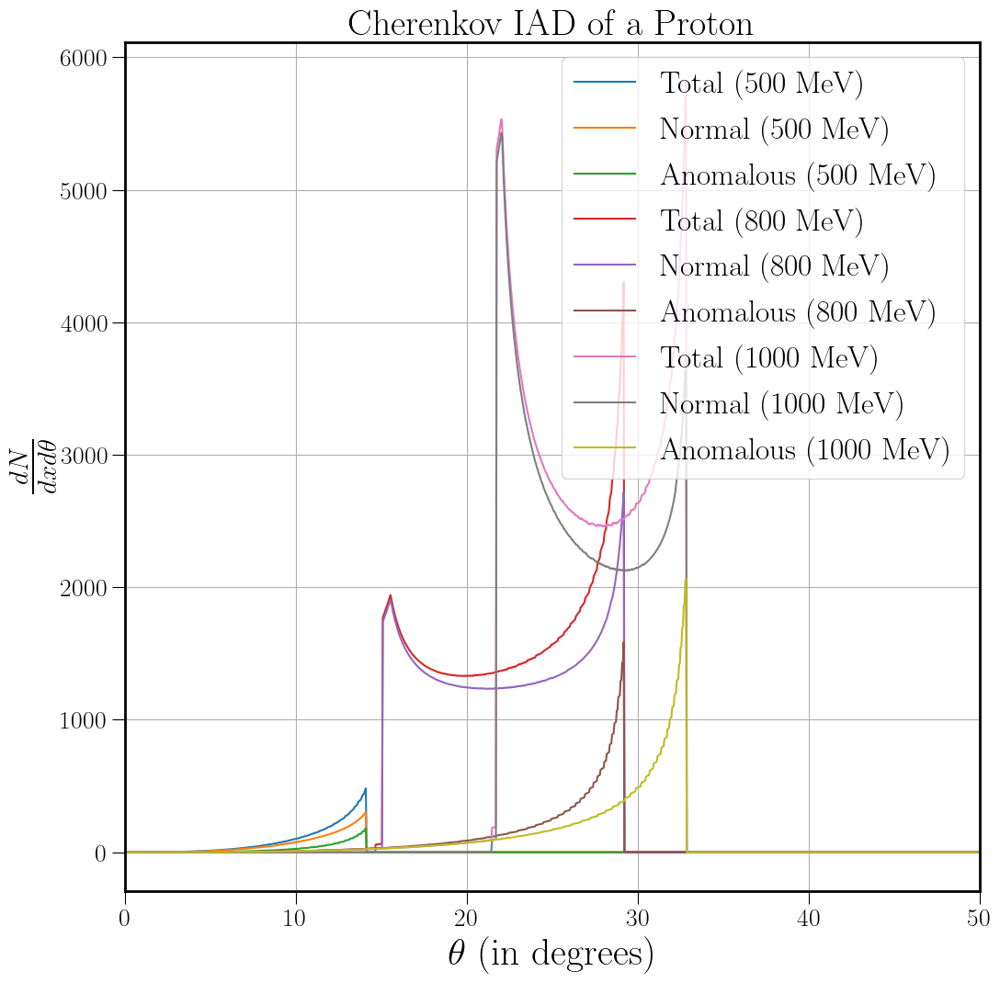

In [8]:
# Load the .npz file
#HO fit
pdata500ho = np.load('IAD_new_data_for_PID\\iCherenkovdata_p_500_ho.npz')
pdata800ho = np.load('IAD_new_data_for_PID\\iCherenkovdata_p_800_ho.npz')
pdata1000ho = np.load('IAD_new_data_for_PID\\iCherenkovdata_p_1000_ho.npz')

print(pdata500ho['theta']) #theta saved in radian unit

# List the names of the arrays in the file
print(pdata500ho.files)
# print(pdata500b.files)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

# matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
# plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'$\theta$ (in degrees)', size= 30)
ax.set_ylabel(r'$\frac{dN}{dx d\theta}$', size= 30)
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Cherenkov IAD of a Proton')
ax.tick_params(axis='both',which='major',labelsize=20, length=10)

#Defining integration window

theta_window = (thetamax - thetamin)/10 #10% of databins # dp = (thetamax - thetamin)/(180/(2*2000)) 

dp = np.round(2000*2*theta_window/180) #no. of datapoints within theta_window

min_window = thetamin + theta_window

max_window = thetamax - theta_window 



#Define a function to find the index of the desired element

def find_nearest_index_numpy(arr, value):
    """
    Finds the index of the element closest to 'value' in a NumPy array.
    """
    arr = np.array(arr)  # Ensure it's a NumPy array
    idx = np.abs(arr - value).argmin()
    return idx



#Explanation:
# np.abs(arr - value) calculates the absolute difference between each element in the array and the value.
# .argmin() returns the index of the minimum value in the resulting array of absolute differences, which corresponds to the element closest to value.


# Access a specific array
costheta500 = pdata500ho['costheta']
theta500 = pdata500ho['theta']
itotal500 = pdata500ho['itotalho']
inormal500 = pdata500ho['inormalho']
ianom500 = pdata500ho['ianomalousho']
theta500deg = theta500*(180/np.pi)
itotal500t = itotal500*np.sin(theta500)
inormal500t = inormal500*np.sin(theta500)
ianom500t = ianom500*np.sin(theta500)

# itotal500b = pdata500b['itotalb']
# itotal500bt = itotal500b*np.sin(theta500)
# scint500 = data500['scint500']

ax.plot(theta500*(180/np.pi), itotal500t, label='Total (500 MeV)')
ax.plot(theta500*(180/np.pi), inormal500t, label='Normal (500 MeV)')
ax.plot(theta500*(180/np.pi), ianom500t, label='Anomalous (500 MeV)')


# print('Total = {}, Normal = {}, Anomalous = {}'.format(itotal500t, inormal500t, ianom500t))
print('500 MeV Proton: Total = {}, Normal = {}, Anomalous = {}'.format(itotal500t, inormal500t, ianom500t))


# K.E or Beta
t = 500

# Linear space in K.E.
# t = np.linspace(500, 1500, 41)
# print(t)

mp = 938  #Proton's mass in MeV
i  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

# print (i)

n_peakr = 1.3605
n_500 = 1.2278

#Quantile Window: Integration Stepsize 

cos_ang_min = 1/(i * n_peakr)
thetamax = np.arccos(cos_ang_min)*(180/np.pi)

cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
# cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
thetamin = np.arccos(cos_ang_maxn)*(180/np.pi)


# print(i, dp, theta_window, thetamin, min_window, max_window, thetamax) 

# print(i, thetamin, min_window, max_window, thetamax)
print('beta={}, dp={}, theta_window={}, thetamin={}, min_window={}, max_window={}, thetamax={}'.format(i, dp, theta_window, thetamin, min_window, max_window, thetamax)) 


# Example usage:
my_array = theta500deg

#Theta_min
min_value = thetamin
min_index = find_nearest_index_numpy(my_array, min_value)
print(f"The element closest to {min_value} is at index: {min_index}")
print(f"The closest element is: {my_array[min_index]}")

#Min_window
min_window_value = thetamin + theta_window
min_window_index = find_nearest_index_numpy(my_array, min_window_value)
print(f"The element closest to {min_window_value} is at index: {min_window_index}")
print(f"The closest element is: {my_array[min_window_index]}")

#Max_window
max_window_value = thetamax - theta_window
max_window_index = find_nearest_index_numpy(my_array, max_window_value)
print(f"The element closest to {max_window_value} is at index: {max_window_index}")
print(f"The closest element is: {my_array[max_window_index]}")

#Theta_max
max_value = thetamax
max_index = find_nearest_index_numpy(my_array, max_value)
print(f"The element closest to {max_value} is at index: {max_index}")
print(f"The closest element is: {my_array[max_index]}")


# beta=0.7579653181328908, dp=25.0, theta_window=1.1415237657142434, thetamin=0.0, min_window=22.589944787892005, max_window=31.722134913605952, thetamax=14.132686901528965

# The element closest to 0.0 is at index: 0
# The closest element is: 0.0
# The element closest to 1.1415237657142434 is at index: 25
# The closest element is: 1.1255627813906952
# The element closest to 12.991163135814721 is at index: 289
# The closest element is: 13.011505752876438
# The element closest to 14.132686901528965 is at index: 314
# The closest element is: 14.137068534267135


# Sum i-th to j-th elements of an array) 

itotalnorm = itotal500t[0:25] 

itotalanom = itotal500t[289:314]

print('500 MeV Proton: Normal Quantile = {}, Anomalous Quantile = {}'.format(itotalnorm, itotalanom))

# itnorm = sum(itotalnorm)* (thetamin + min_window)/2 
# itanom = sum(itotalanom)* (max_window + thetamax)/2 

print('For 500 MeV Proton: theta_window/dp = {}'.format(theta_window/dp)) #delta x = width of the trapezoid (h for sum)
 
itnorm = sum(itotalnorm) * (theta_window/dp) 
itanom = sum(itotalanom) * (theta_window/dp) 

nbya = itnorm / itanom

print('500 MeV Proton: Sum of Normal Quantile = {}, Sum of Anomalous Quantile = {}, Normal/Anomalous = {}, Anomalous/Normal = {}'.format(itnorm, itanom, nbya, 1/nbya))

      
# Access a specific array: 800 MeV 

costheta800 = pdata800ho['costheta']
theta800 = pdata800ho['theta']
itotal800 = pdata800ho['itotalho']
inormal800 = pdata800ho['inormalho']
ianom800 = pdata800ho['ianomalousho']
theta800deg = theta800*(180/np.pi)
itotal800t = itotal800*np.sin(theta800)
inormal800t = inormal800*np.sin(theta800)
ianom800t = ianom800*np.sin(theta800)
# scint800 = pdata800ho['scint800']
# itotal800b = pdata800b['itotalb']
# itotal800bt = itotal800b*np.sin(theta800)


# print('thetadeg = {}, total IAD = {}'.format(theta800deg, itotal800t))


ax.plot(theta800*(180/np.pi), itotal800t, label='Total (800 MeV)')
ax.plot(theta800*(180/np.pi), inormal800t, label='Normal (800 MeV)')
ax.plot(theta800*(180/np.pi), ianom800t, label='Anomalous (800 MeV)')


# print('Total = {}, Normal = {}, Anomalous = {}'.format(itotal500t, inormal500t, ianom500t))
print('800 MeV Proton: Total = {}, Normal = {}, Anomalous = {}'.format(itotal800t, inormal800t, ianom800t))

# # my_list = [0, 1, 0, 2, 3, 0, 4]
# # nonzero_values = [x for x in my_list if x != 0]
# # print(nonzero_values)

# itotal800nz = [x for x in itotal800t if x != 0]
# inormal800nz = [x for x in inormal800t if x != 0]
# ianom800nz = [x for x in ianom800t if x != 0]

# # print('Nonzero: Total = {}, Normal = {}, Anomalous = {}'.format(itotal500nz, inormal500nz, ianom500nz))
# print('Nonzero: 800 MeV Proton Total = {}'.format(itotal800nz))
# print(np.shape(itotal800nz), np.shape(inormal800nz), np.shape(ianom800nz))

# ax.plot(theta800*(180/np.pi), itotal800nz, label='Total (800 MeV)')
# ax.plot(theta800*(180/np.pi), inormal800nz, label='Normal (800 MeV)')
# ax.plot(theta800*(180/np.pi), ianom800nz, label='Anomalous (800 MeV)')


# K.E or Beta
t = 800

# Linear space in K.E.
# t = np.linspace(500, 1500, 41)
# print(t)

mp = 938  #Proton's mass in MeV
i  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD


#Quantile Window: Integration Stepsize 

cos_ang_min = 1/(i * n_peakr)
thetamax = np.arccos(cos_ang_min)*(180/np.pi)

cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
# cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
thetamin = np.arccos(cos_ang_maxn)*(180/np.pi)

# #thetamin=14.655986500619832, thetamax=29.17928880302778

# #Defining integration window

# theta_window = (thetamax - thetamin)/10 #10% of databins # dp = (thetamax - thetamin)/(180/(2*2000)) 

# dp = np.round(2000*2*theta_window/180) #no. of datapoints within theta_window

# min_window = thetamin + theta_window

# max_window = thetamax - theta_window 

# print(i, thetamin, min_window, max_window, thetamax)
print('beta={}, dp={}, theta_window={}, thetamin={}, min_window={}, max_window={}, thetamax={}'.format(i, dp, theta_window, thetamin, min_window, max_window, thetamax)) 


# Example usage:
my_array = theta800deg

#Theta_min
min_value = thetamin
min_index = find_nearest_index_numpy(my_array, min_value)
print(f"The element closest to {min_value} is at index: {min_index}")
print(f"The closest element is: {my_array[min_index]}")

#Min_window
min_window_value = thetamin + theta_window
min_window_index = find_nearest_index_numpy(my_array, min_window_value)
print(f"The element closest to {min_window_value} is at index: {min_window_index}")
print(f"The closest element is: {my_array[min_window_index]}")

#Max_window
max_window_value = thetamax - theta_window
max_window_index = find_nearest_index_numpy(my_array, max_window_value)
print(f"The element closest to {max_window_value} is at index: {max_window_index}")
print(f"The closest element is: {my_array[max_window_index]}")

#Theta_max
max_value = thetamax
max_index = find_nearest_index_numpy(my_array, max_value)
print(f"The element closest to {max_value} is at index: {max_index}")
print(f"The closest element is: {my_array[max_index]}")


# min_index = np.where(theta800deg == 14.655986500619832) #thetamin=14.655986500619832
# # print(min_index)  # Output: (array([3]),)
# # print(indices[0][0]) # To get the first occurrence: 3
# max_index = np.where(theta800deg == 29.17928880302778) #thetamax=29.17928880302778
# print('min_index = {}, max_index = {}'.format(min_index, max_index))  # Output: (array([3]),)


# print('Nonzero: 800 MeV Proton Total = {}, Normal = {}, Anomalous = {}'.format(itotal800nz, inormal800nz, ianom800nz))
# print('Nonzero: 800 MeV Proton Total = {}'.format(itotal800nz))

# # Sum first n and last n, even if they overlap: sum(arr[:n]) + sum(arr[-n:]) 

# itotalnorm = itotal800t[:32] 

# itotalanom = itotal800t[-32:]

# print('800 MeV Proton: Normal Quantile = {}, Anomalous Quantile = {}'.format(itotalnorm, itotalanom))

# beta=0.8418569002610763, dp=32.0, theta_window=1.4523302302407948, thetamin=14.655986500619832, min_window=16.108316730860626, max_window=27.726958572786987, thetamax=29.17928880302778

# The element closest to 14.655986500619832 is at index: 326
# The closest element is: 14.677338669334665
# The element closest to 16.108316730860626 is at index: 358
# The closest element is: 16.118059029514757
# The element closest to 27.726958572786987 is at index: 616
# The closest element is: 27.733866933466732
# The element closest to 29.17928880302778 is at index: 648
# The closest element is: 29.174587293646823


# Sum i-th to j-th elements of an array) 

itotalnorm = itotal800t[326:358] 

itotalanom = itotal800t[616:648]

print('800 MeV Proton: Normal Quantile = {}, Anomalous Quantile = {}'.format(itotalnorm, itotalanom))


# itnorm = sum(itotalnorm)* (thetamin + min_window)/2 
# itanom = sum(itotalanom)* (max_window + thetamax)/2 

print('For 800 MeV Proton: theta_window/dp = {}'.format(theta_window/dp))

itnorm = sum(itotalnorm) * (theta_window/dp) 
itanom = sum(itotalanom) * (theta_window/dp) 

nbya = itnorm / itanom

print('800 MeV Proton: Sum of Normal Quantile = {}, Sum of Anomalous Quantile = {}, Normal/Anomalous = {}, Anomalous/Normal = {}'.format(itnorm, itanom, nbya, 1/nbya))


# Access a specific array: 1000 MeV 

costheta1000 = pdata1000ho['costheta']
theta1000 = pdata1000ho['theta']
itotal1000 = pdata1000ho['itotalho']
inormal1000 = pdata1000ho['inormalho']
ianom1000 = pdata1000ho['ianomalousho']
theta1000deg = theta1000*(180/np.pi)
itotal1000t = itotal1000*np.sin(theta1000)
inormal1000t = inormal1000*np.sin(theta1000)
ianom1000t = ianom1000*np.sin(theta1000)
# scint800 = pdata800ho['scint800']
# itotal800b = pdata800b['itotalb']
# itotal800bt = itotal800b*np.sin(theta800)

ax.plot(theta1000*(180/np.pi), itotal1000t, label='Total (1000 MeV)')
ax.plot(theta1000*(180/np.pi), inormal1000t, label='Normal (1000 MeV)')
ax.plot(theta1000*(180/np.pi), ianom1000t, label='Anomalous (1000 MeV)')


# print('Total = {}, Normal = {}, Anomalous = {}'.format(itotal500t, inormal500t, ianom500t))
print('1000 MeV Proton: Total = {}, Normal = {}, Anomalous = {}'.format(itotal1000t, inormal1000t, ianom1000t))


# thetamin = np.min(theta500)*(180/np.pi) 
# thetamax = np.max(theta500)*(180/np.pi)


# K.E or Beta
t = 1000

# Linear space in K.E.
# t = np.linspace(500, 1500, 41)
# print(t)

mp = 938  #Proton's mass in MeV
i  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD


#Quantile Window: Integration Stepsize 

cos_ang_min = 1/(i * n_peakr)
thetamax = np.arccos(cos_ang_min)*(180/np.pi)

cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
# cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
thetamin = np.arccos(cos_ang_maxn)*(180/np.pi)


# print(i, thetamin, min_window, max_window, thetamax)
print('beta={}, dp={}, theta_window={}, thetamin={}, min_window={}, max_window={}, thetamax={}'.format(i, dp, theta_window, thetamin, min_window, max_window, thetamax)) 


# Example usage:
my_array = theta1000deg

#Theta_min
min_value = thetamin
min_index = find_nearest_index_numpy(my_array, min_value)
print(f"The element closest to {min_value} is at index: {min_index}")
print(f"The closest element is: {my_array[min_index]}")

#Min_window
min_window_value = thetamin + theta_window
min_window_index = find_nearest_index_numpy(my_array, min_window_value)
print(f"The element closest to {min_window_value} is at index: {min_window_index}")
print(f"The closest element is: {my_array[min_window_index]}")

#Max_window
max_window_value = thetamax - theta_window
max_window_index = find_nearest_index_numpy(my_array, max_window_value)
print(f"The element closest to {max_window_value} is at index: {max_window_index}")
print(f"The closest element is: {my_array[max_window_index]}")

#Theta_max
max_value = thetamax
max_index = find_nearest_index_numpy(my_array, max_value)
print(f"The element closest to {max_value} is at index: {max_index}")
print(f"The closest element is: {my_array[max_index]}")


# beta=0.8750657141671857, dp=32.0, theta_window=1.4523302302407948, thetamin=21.44842102217776, min_window=16.108316730860626, max_window=27.726958572786987, thetamax=32.863658679320196

# The element closest to 21.44842102217776 is at index: 476
# The closest element is: 21.43071535767884
# The element closest to 22.900751252418555 is at index: 509
# The closest element is: 22.916458229114557
# The element closest to 31.411328449079402 is at index: 698
# The closest element is: 31.425712856428216
# The element closest to 32.863658679320196 is at index: 730
# The closest element is: 32.8664332166083

# Sum i-th to j-th elements of an array) 

itotalnorm = itotal1000t[476:509] 

itotalanom = itotal1000t[698:730]

print('1000 MeV Proton: Normal Quantile = {}, Anomalous Quantile = {}'.format(itotalnorm, itotalanom))

# itnorm = sum(itotalnorm)* (thetamin + min_window)/2 
# itanom = sum(itotalanom)* (max_window + thetamax)/2 

print('For 1000 MeV Proton: theta_window/dp = {}'.format(theta_window/dp))

itnorm = sum(itotalnorm) * (theta_window/dp) 
itanom = sum(itotalanom) * (theta_window/dp) 

nbya = itnorm / itanom

print('1000 MeV Proton: Sum of Normal Quantile = {}, Sum of Anomalous Quantile = {}, Normal/Anomalous = {}, Anomalous/Normal = {}'.format(itnorm, itanom, nbya, 1/nbya))


################################################################################################################################
ax.legend()
ax.set_xlim(0,50)
ax.grid()

# # plt.savefig('Cherenkov_IAD_Proton_allT_from_saved_data', bbox_inches='tight')
# # plt.savefig('Cherenkov_IAD_Proton_500_600_800_MeV_from_new_saved_data_ho', bbox_inches='tight')
# # print("Instantaneous Cerenkov photons emitted by a {} Mev Proton in LAr using Babicz fit: {:.3f}" .format(t, np.nansum(func_angbz)/2000) )#, sum(cerenkovangsum)/5000  * (dx/0.1)

pdata500ho.close()
pdata800ho.close()
pdata1000ho.close()

Text(0.5, 1.0, 'N/A for Protons')

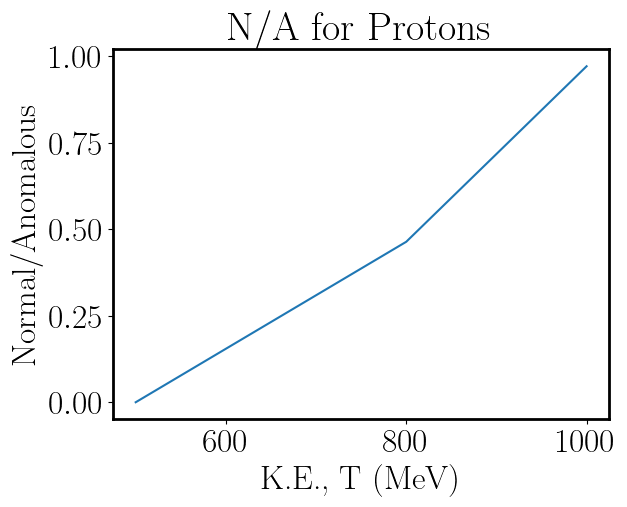

In [19]:
# N/A

t = np.array([500, 800, 1000]) #in MeV
nbya = np.array([8.752406801193435e-05, 0.463834814265887, 0.971096322725608])
abyn = 1/nbya

plt.plot(t, nbya)
plt.xlabel('K.E., T (MeV)')
plt.ylabel('Normal/Anomalous')
plt.title('N/A for Protons')

Text(0.5, 1.0, 'A/N for Protons')

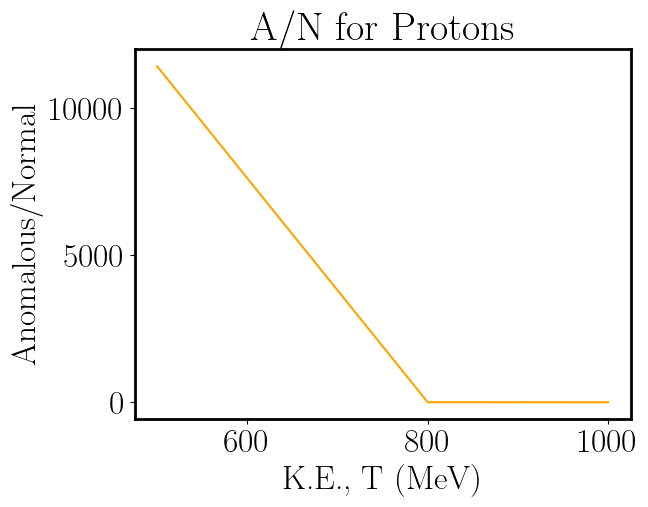

In [23]:
plt.plot(t, abyn, color='orange')
plt.xlabel('K.E., T (MeV)')
plt.ylabel('Anomalous/Normal')
plt.title('A/N for Protons')

# Proton's AQR from IAD (Approx Fit) (Automated)

In [77]:
# Linear space in K.E.
tp = np.linspace(500, 1500, 41)
# print(t)

mp = 938  #Proton's mass in MeV
betap  = np.sqrt(1 - (1/(1 + tp/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

print("Proton: {}, {}, {}".format(tp, betap, np.round(betap,4)))

# #Linear space in K.E.
tm = np.linspace(100, 1000, 37)
# # print(t)

# #Mass of the particle travelling
# # mp = 938 #Proton's mass
mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²

betamu  = np.sqrt(1 - (1/(1 + tm/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

print("Muon: {}, {}, {}".format( tm, betamu, np.round(betamu, 4)))


Proton: [ 500.  525.  550.  575.  600.  625.  650.  675.  700.  725.  750.  775.
  800.  825.  850.  875.  900.  925.  950.  975. 1000. 1025. 1050. 1075.
 1100. 1125. 1150. 1175. 1200. 1225. 1250. 1275. 1300. 1325. 1350. 1375.
 1400. 1425. 1450. 1475. 1500.], [0.75796532 0.76741698 0.77628968 0.78463315 0.79249149 0.79990401
 0.80690583 0.81352846 0.81980026 0.82574686 0.83139144 0.83675507
 0.8418569  0.84671442 0.8513436  0.85575908 0.85997431 0.86400164
 0.86785245 0.87153724 0.87506571 0.87844687 0.88168902 0.88479989
 0.88778668 0.89065607 0.89341428 0.89606712 0.89862002 0.90107804
 0.90344595 0.90572818 0.9079289  0.91005203 0.91210124 0.91407999
 0.91599153 0.91783893 0.91962507 0.92135268 0.92302433], [0.758  0.7674 0.7763 0.7846 0.7925 0.7999 0.8069 0.8135 0.8198 0.8257
 0.8314 0.8368 0.8419 0.8467 0.8513 0.8558 0.86   0.864  0.8679 0.8715
 0.8751 0.8784 0.8817 0.8848 0.8878 0.8907 0.8934 0.8961 0.8986 0.9011
 0.9034 0.9057 0.9079 0.9101 0.9121 0.9141 0.916  0.9178 0.9196 0.9

In [79]:
approx = np.load('IAD_new_data_for_PID\\iCherenkovdata_p_1500_approx.npz', allow_pickle=True)
print(approx.files)

print(approx['theta']) #theta saved in radian unit
print(np.nonzero(approx['itotalapprox']))
print(approx['itotalapprox'][607:893])
# print(approx['inormalapprox'])
# print(approx['ianomalousapprox'])

# List the names of the arrays in the file
# print(pdata500ho.files)
# print(pdata500b.files)



['theta', 'costheta', 'itotalapprox', 'inormalapprox', 'ianomalousapprox']
[0.00000000e+00 7.85791059e-04 1.57158212e-03 ... 1.56922474e+00
 1.57001054e+00 1.57079633e+00]
(array([607, 608, 609, 610, 611, 612, 613, 614, 615, 616, 617, 618, 619,
       620, 621, 622, 623, 624, 625, 626, 627, 628, 629, 630, 631, 632,
       633, 634, 635, 636, 637, 638, 639, 640, 641, 642, 643, 644, 645,
       646, 647, 648, 649, 650, 651, 652, 653, 654, 655, 656, 657, 658,
       659, 660, 661, 662, 663, 664, 665, 666, 667, 668, 669, 670, 671,
       672, 673, 674, 675, 676, 677, 678, 679, 680, 681, 682, 683, 684,
       685, 686, 687, 688, 689, 690, 691, 692, 693, 694, 695, 696, 697,
       698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710,
       711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723,
       724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736,
       737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749,
       750, 751, 752, 753, 754, 755

[ 500.  525.  550.  575.  600.  625.  650.  675.  700.  725.  750.  775.
  800.  825.  850.  875.  900.  925.  950.  975. 1000. 1025. 1050. 1075.
 1100. 1125. 1150. 1175. 1200. 1225. 1250. 1275. 1300. 1325. 1350. 1375.
 1400. 1425. 1450. 1475. 1500.]
K.E.=500.0, beta=0.7579653181328908, dp=48.0, theta_windowp=2.16158657550971, thetaminp=0.0, min_windowp=2.16158657550971, max_windowp=19.454279179587388, thetamaxp=21.615865755097097
The element closest to 0.0 is at index: 0
The closest element is: 0.0
The element closest to 2.16158657550971 is at index: 48
The closest element is: 2.161080540270135
The element closest to 19.454279179587388 is at index: 432
The closest element is: 19.449724862431218
The element closest to 21.615865755097097 is at index: 480
The closest element is: 21.610805402701352
500.0 MeV Proton: 10% Normal Quantile = [0.00000000e+00 6.40419480e-06 5.12329085e-05 1.72907411e-04
 4.09842473e-04 8.00443123e-04 1.38310140e-03 2.19619310e-03
 3.27807457e-03 4.66707942e-03 

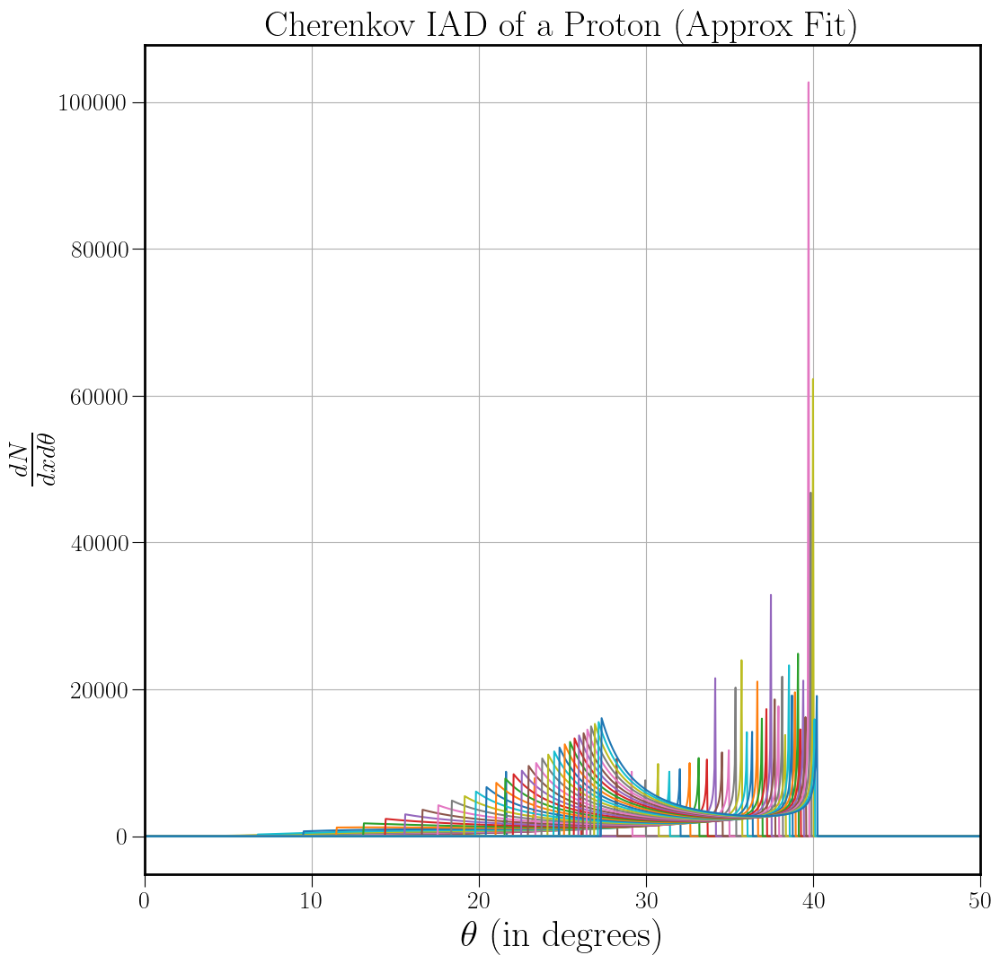

In [81]:
#Approx Fit 
#Import libraries
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

#Our (PVS) Fit: 
    
alpha = 1/137 #Fine-structure (EM coupling) constant 
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652
n_max = 1.4191220261503081

#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #absorptive model peak

# lamd_uv = 106.6 #lambda_UV = 106.6 nm
# lamd_ir = 908.3 #lambda_IR = 908.3 nm 

# lamd = np.linspace(90,700,2000)

n_uvr = a_0j #when lamd -> lamd_UV
n_500 = 1.2278
# n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf


# print("n_uv = {}, n_peak = {}, n_500= {}, n_asymtote = {}".format(n_uvr, n_peakr, n_500, n_asymtoter))

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

# matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
# plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'$\theta$ (in degrees)', size= 30)
ax.set_ylabel(r'$\frac{dN}{dx d\theta}$', size= 30)
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
# ax.set_title('Cherenkov IAD of a Proton (HO Fit)')
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.set_title('Cherenkov IAD of a Proton (Approx Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)


#Define a function to find the index of the desired element

def find_nearest_index_numpy(arr, value):
    """
    Finds the index of the element closest to 'value' in a NumPy array.
    """
    arr = np.array(arr)  # Ensure it's a NumPy array
    idx = np.abs(arr - value).argmin()
    return idx

#Explanation:
# np.abs(arr - value) calculates the absolute difference between each element in the array and the value.
# .argmin() returns the index of the minimum value in the resulting array of absolute differences, which corresponds to the element closest to value.


#Linear space in K.E.
t = np.linspace(500, 1500, 41)
print(t)

mp = 938  #Proton's mass in MeV
betap  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

# print (t, betap, np.round(betap,3))

cos_ang_minp = []
con_ang_maxnp = []
thetamaxp = []
thetaminp = []



# Load the .npz file
#HO fit
# pdata500ho = np.load('IAD_new_data_for_PID\\iCherenkovdata_p_500_ho.npz')
#Babicz fit
# pdata500b = np.load('IAD_new_data_for_PID\\iCherenkovdata_p_500_babicz.npz')


# Create an empty dictionary to store the data.
data_dict = {}

itotalts = []
inormalts = []
ianomts = []

itotaltps = []
inormaltps = []
ianomtps = []

# itotalbts = []

itpnormps10 = []
itpanomps10 = []
nbyapps10 = []
abynpps10 = []

itpnormps05 = []
itpanomps05 = []
nbyapps05 = []
abynpps05 = []

itpnormps01 = []
itpanomps01 = []
nbyapps01 = []
abynpps01 = []


# Loop through your values
for val in t:
    # Use an f-string to generate the key for the dictionary. (HO)
    # key = f"pdata_{val:.0f}_ho"
    # ho = f"pdata_{val:.0f}_ho"
    ap = f"pdata_{val:.0f}_approx"
    
    # Use another f-string to generate the filename for loading.
    # filename1 = fr"IAD_new_data_for_PID\iCherenkovdata_p_{val:.0f}_ho.npz"
    filename3 = fr"IAD_new_data_for_PID\iCherenkovdata_p_{val:.0f}_approx.npz"
    
    # Store the loaded data in the dictionary using the generated key.
    # data_dict[key] = np.load(filename)
    # #HO Fit
    # data_dict[ho] = np.load(filename1) 

    # costheta = data_dict[ho]['costheta']
    # theta = data_dict[ho]['theta']
    # itotal = data_dict[ho]['itotalho']
    # inormal = data_dict[ho]['inormalho']
    # ianom = data_dict[ho]['ianomalousho']
    # thetadeg = theta*(180/np.pi) 
    # itotalt = itotal*np.sin(theta)
    # inormalt = inormal*np.sin(theta)
    # ianomt = ianom*np.sin(theta)
    # # print(costheta)

    #Approx Fit
    data_dict[ap] = np.load(filename3, allow_pickle=True) 

    # costhetap = data_dict[ap]['costheta']
    thetap = data_dict[ap]['theta']
    itotalp = data_dict[ap]['itotalapprox']
    # inormalp = data_dict[ap]['inormalapprox']
    # ianomp = data_dict[ap]['ianomalousapprox']
    thetadegp = thetap*(180/np.pi) 
    itotaltp = itotalp*np.sin(thetap)
    # inormaltp = inormalp*np.sin(thetap)
    # ianomtp = ianomp*np.sin(thetap)
    
    # ax.plot(thetadeg, itotalt, label='Total (HO)')
    # ax.plot(thetadeg, inormalt, label='Normal (HO)')
    # ax.plot(thetadeg, ianomt, label='Anomalous (HO)')

    ax.plot(thetadegp, itotaltp, label='Total (Approx)')
    # ax.plot(thetadegp, inormaltp, label='Normal (Approx)')
    # ax.plot(thetadegp, ianomtp, label='Anomalous (Approx)')

    # ax.plot(theta*(180/np.pi), itotalbt, label='Babicz')
    
    # ax.plot(theta*(180/np.pi), itotalbt, label='Total')

    # itotalts.append(itotalt) #.tolist())  
    # inormalts.append(inormalt)
    # ianomts.append(ianomt)

    itotaltps.append(itotaltp) #.tolist())  
    # inormaltps.append(inormaltp)
    # ianomtps.append(ianomtp)
    
    # itotalbts.append(itotalbt)

    
    # itotalts.append(itotalt.tolist())  
    # inormalts.append(inormalt)
    # ianomts.append(ianomt)
    
    # itotalbts.append(itotalbt)

    
    i  = np.sqrt(1 - (1/(1 + val/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD


    #Quantile Window: Integration Stepsize 
    
    cos_ang_minp = 1/(i * n_max) #Approx Fit
    thetamaxp = np.arccos(cos_ang_minp)*(180/np.pi)
    
    cos_ang_maxnp = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
    # cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
    thetaminp = np.arccos(cos_ang_maxnp)*(180/np.pi)

    
    #Defining integration window

    theta_windowp10 = (thetamaxp - thetaminp)/10 #10% of databins # dp = (thetamax - thetamin)/(180/(2*2000))
    theta_windowp05 = (thetamaxp - thetaminp)/20 #5% of databins # dp = (thetamax - thetamin)/(180/(2*2000))
    theta_windowp01 = (thetamaxp - thetaminp)/100 #1% of databins # dp = (thetamax - thetamin)/(180/(2*2000))
    
    dpp10 = np.round(2000*2*theta_windowp10/180) #no. of datapoints within theta_window
    dpp05 = np.round(2000*2*theta_windowp05/180) #no. of datapoints within theta_window
    dpp01 = np.round(2000*2*theta_windowp01/180) #no. of datapoints within theta_window
    
    min_windowp10 = thetaminp + theta_windowp10
    max_windowp10 = thetamaxp - theta_windowp10 

    min_windowp05 = thetaminp + theta_windowp05
    max_windowp05 = thetamaxp - theta_windowp05 

    min_windowp01 = thetaminp + theta_windowp01
    max_windowp01 = thetamaxp - theta_windowp01 

    
    # print(i, thetamin, min_window, max_window, thetamax)
    print('K.E.={}, beta={}, dp={}, theta_windowp={}, thetaminp={}, min_windowp={}, max_windowp={}, thetamaxp={}'.format(val, i, dpp10, theta_windowp10, thetaminp, min_windowp10, max_windowp10, thetamaxp)) 
    
    
    # Example usage:
    my_array = thetadegp

    #10% Quantile
    
    #Theta_min
    min_valuep = thetaminp
    min_indexp = find_nearest_index_numpy(my_array, min_valuep)
    print(f"The element closest to {min_valuep} is at index: {min_indexp}")
    print(f"The closest element is: {my_array[min_indexp]}")
    
    #Min_window
    min_window_valuep = thetaminp + theta_windowp10
    min_window_indexp = find_nearest_index_numpy(my_array, min_window_valuep)
    print(f"The element closest to {min_window_valuep} is at index: {min_window_indexp}")
    print(f"The closest element is: {my_array[min_window_indexp]}")
    
    #Max_window
    max_window_valuep = thetamaxp - theta_windowp10
    max_window_indexp = find_nearest_index_numpy(my_array, max_window_valuep)
    print(f"The element closest to {max_window_valuep} is at index: {max_window_indexp}")
    print(f"The closest element is: {my_array[max_window_indexp]}")
    
    #Theta_max
    max_valuep = thetamaxp
    max_indexp = find_nearest_index_numpy(my_array, max_valuep)
    print(f"The element closest to {max_valuep} is at index: {max_indexp}")
    print(f"The closest element is: {my_array[max_indexp]}")
    
    # Sum i-th to j-th elements of an array) 
    
    itotalnormp10 = itotaltp[min_indexp:min_window_indexp] 
    
    itotalanomp10 = itotaltp[max_window_indexp:max_indexp]
    
    print('{} MeV Proton: 10% Normal Quantile = {}, 10% Anomalous Quantile = {}'.format(val, itotalnormp10, itotalanomp10))
    
    # itnorm = sum(itotalnorm)* (thetamin + min_window)/2 
    # itanom = sum(itotalanom)* (max_window + thetamax)/2 
    
    # print('For {} MeV Proton: theta_window/dp = {}'.format(val, theta_window/dp))
    
    itnormp10 = sum(itotalnormp10) * (theta_windowp10/dpp10) 
    itanomp10 = sum(itotalanomp10) * (theta_windowp10/dpp10) 
    
    nbyapp10 = itnormp10 / itanomp10
    abynpp10 = itanomp10 / itnormp10
    
    print('{} MeV Proton: Sum of 10% Normal Quantile = {}, Sum of 10% Anomalous Quantile = {}, 10% Normal/Anomalous = {}, 10% Anomalous/Normal = {}'.format(val, itnormp10, itanomp10, nbyapp10, 1/nbyapp10))

    # itotalts.append(itotalt.tolist())  

    itpnormps10.append(itnormp10)
    itpanomps10.append(itanomp10)
    nbyapps10.append(nbyapp10)
    abynpps10.append(abynpp10)

    #5% Quantile

    print('K.E.={}, beta={}, dp={}, theta_windowp={}, thetaminp={}, min_windowp={}, max_windowp={}, thetamaxp={}'.format(val, i, dpp05, theta_windowp05, thetaminp, min_windowp05, max_windowp05, thetamaxp)) 
    
    
    #Theta_min
    min_valuep = thetaminp
    min_indexp = find_nearest_index_numpy(my_array, min_valuep)
    print(f"The element closest to {min_valuep} is at index: {min_indexp}")
    print(f"The closest element is: {my_array[min_indexp]}")
    
    #Min_window
    min_window_valuep = thetaminp + theta_windowp05
    min_window_indexp = find_nearest_index_numpy(my_array, min_window_valuep)
    print(f"The element closest to {min_window_valuep} is at index: {min_window_indexp}")
    print(f"The closest element is: {my_array[min_window_indexp]}")
    
    #Max_window
    max_window_valuep = thetamaxp - theta_windowp05
    max_window_indexp = find_nearest_index_numpy(my_array, max_window_valuep)
    print(f"The element closest to {max_window_valuep} is at index: {max_window_indexp}")
    print(f"The closest element is: {my_array[max_window_indexp]}")
    
    #Theta_max
    max_valuep = thetamaxp
    max_indexp = find_nearest_index_numpy(my_array, max_valuep)
    print(f"The element closest to {max_valuep} is at index: {max_indexp}")
    print(f"The closest element is: {my_array[max_indexp]}")
    
    # Sum i-th to j-th elements of an array) 
    
    itotalnormp05 = itotaltp[min_indexp:min_window_indexp] 
    
    itotalanomp05 = itotaltp[max_window_indexp:max_indexp]
    
    print('{} MeV Proton: 5% Normal Quantile = {}, 5% Anomalous Quantile = {}'.format(val, itotalnormp05, itotalanomp05))
    
    # itnorm = sum(itotalnorm)* (thetamin + min_window)/2 
    # itanom = sum(itotalanom)* (max_window + thetamax)/2 
    
    # print('For {} MeV Proton: theta_window/dp = {}'.format(val, theta_window/dp))
    
    itnormp05 = sum(itotalnormp05) * (theta_windowp05/dpp05) 
    itanomp05 = sum(itotalanomp05) * (theta_windowp05/dpp05) 
    
    nbyapp05 = itnormp05 / itanomp05
    abynpp05 = itanomp05 / itnormp05
    
    print('{} MeV Proton: Sum of 5% Normal Quantile = {}, Sum of 5% Anomalous Quantile = {}, 5% Normal/Anomalous = {}, 5% Anomalous/Normal = {}'.format(val, itnormp05, itanomp05, nbyapp05, 1/nbyapp05))

    # itotalts.append(itotalt.tolist())  

    itpnormps05.append(itnormp05)
    itpanomps05.append(itanomp05)
    nbyapps05.append(nbyapp05)
    abynpps05.append(abynpp05)

    #1% Quantile

    print('K.E.={}, beta={}, dp={}, theta_windowp={}, thetaminp={}, min_windowp={}, max_windowp={}, thetamaxp={}'.format(val, i, dpp01, theta_windowp01, thetaminp, min_windowp01, max_windowp01, thetamaxp)) 
    
    
    #Theta_min
    min_valuep = thetaminp
    min_indexp = find_nearest_index_numpy(my_array, min_valuep)
    print(f"The element closest to {min_valuep} is at index: {min_indexp}")
    print(f"The closest element is: {my_array[min_indexp]}")
    
    #Min_window
    min_window_valuep = thetaminp + theta_windowp01
    min_window_indexp = find_nearest_index_numpy(my_array, min_window_valuep)
    print(f"The element closest to {min_window_valuep} is at index: {min_window_indexp}")
    print(f"The closest element is: {my_array[min_window_indexp]}")
    
    #Max_window
    max_window_valuep = thetamaxp - theta_windowp01
    max_window_indexp = find_nearest_index_numpy(my_array, max_window_valuep)
    print(f"The element closest to {max_window_valuep} is at index: {max_window_indexp}")
    print(f"The closest element is: {my_array[max_window_indexp]}")
    
    #Theta_max
    max_valuep = thetamaxp
    max_indexp = find_nearest_index_numpy(my_array, max_valuep)
    print(f"The element closest to {max_valuep} is at index: {max_indexp}")
    print(f"The closest element is: {my_array[max_indexp]}")
    
    # Sum i-th to j-th elements of an array) 
    
    itotalnormp01 = itotaltp[min_indexp:min_window_indexp] 
    
    itotalanomp01 = itotaltp[max_window_indexp:max_indexp]
    
    print('{} MeV Proton: 1% Normal Quantile = {}, 1% Anomalous Quantile = {}'.format(val, itotalnormp01, itotalanomp01))
    
    # itnorm = sum(itotalnorm)* (thetamin + min_window)/2 
    # itanom = sum(itotalanom)* (max_window + thetamax)/2 
    
    # print('For {} MeV Proton: theta_window/dp = {}'.format(val, theta_window/dp))
    
    itnormp01 = sum(itotalnormp01) * (theta_windowp01/dpp01) 
    itanomp01 = sum(itotalanomp01) * (theta_windowp01/dpp01) 
    
    nbyapp01 = itnormp01 / itanomp01
    abynpp01 = itanomp01 / itnormp01
    
    print('{} MeV Proton: Sum of 1% Normal Quantile = {}, Sum of 1% Anomalous Quantile = {}, 1% Normal/Anomalous = {}, 1% Anomalous/Normal = {}'.format(val, itnormp01, itanomp01, nbyapp01, 1/nbyapp01))

    # itotalts.append(itotalt.tolist())  

    itpnormps01.append(itnormp01)
    itpanomps01.append(itanomp01)
    nbyapps01.append(nbyapp01)
    abynpps01.append(abynpp01)



# print(np.shape(itpnormps05), np.shape(itpanomps05))
# print(itotalts.flatten())


################################################################################################################################
# ax.legend(fontsize=18)
ax.set_xlim(0,50)
ax.grid()

# plt.savefig('Cherenkov_IAD_Proton_allTs_new_data_ho', bbox_inches='tight')
# plt.savefig('Cherenkov_IAD_Proton_allTs_new_data_approx', bbox_inches='tight')
# plt.savefig('Cherenkov_IAD_Proton_500_600_800_1000_MeV_new_data_ho', bbox_inches='tight')
# plt.savefig('Cherenkov_IAD_Proton_allTs_new_data_babicz', bbox_inches='tight')


# print(data_dict[ho].files)
# print(data_dict[ap].files)
# print(data_dict[b].files)

# print(itotalts.files)

# Close the file
# data.close()

[ 500.  500.  500. ... 1500. 1500. 1500.] [0.00000000e+00 4.50225113e-02 9.00450225e-02 ... 8.99099550e+01
 8.99549775e+01 9.00000000e+01] [0.00000000e+00 6.40419480e-06 5.12329085e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
(82000,) (82000,) (82000,)


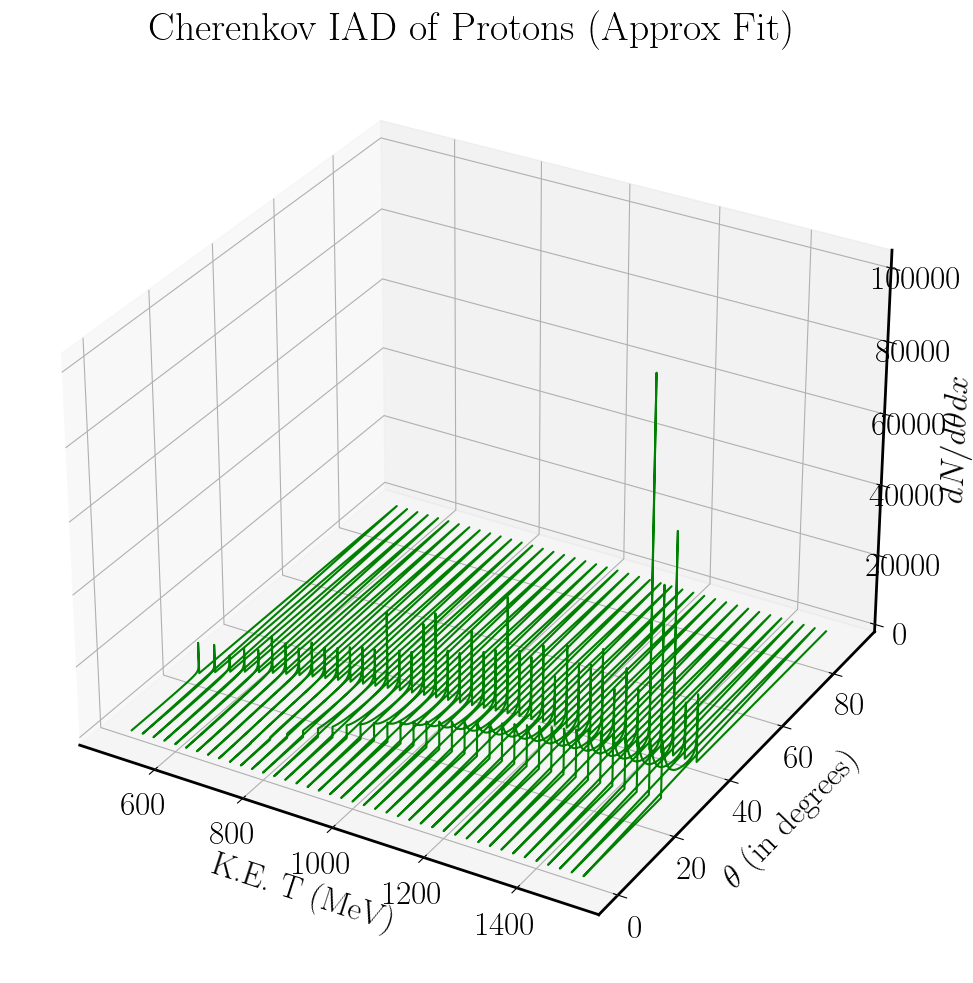

In [71]:
#Import libraries
import matplotlib as mpl
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm # for colormaps
import numpy as np


# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111, projection='3d')

# Set labels and title:
ax.set_xlabel('\n K.E. T (MeV)')
ax.set_ylabel('\n' r'$\theta$ (in degrees)')
ax.set_zlabel('\n' r'$dN/d\theta dx$') #\frac{dN}{d\cos\theta} #'\n'
ax.set_title('Cherenkov IAD of Protons (Approx Fit)')
# ax.tick_params(axis='both',which='major',labelsize=20,length=10)
# ax.zaxis.labelpad = -10 # Adjust as needed
# ax.set_zticklabels(ax.get_zticklabels(), rotation=45, ha="right") 

# mpl.rcParams['xtick.major.pad'] = 30 # Adjust padding as needed
# # or for a specific axis:
# ax.tick_params(axis='x', pad=30)

# Assuming 'ax' is your Axes object
# ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right") 
# or for a simpler approach:
# plt.yticks(rotation=45, ha="right") 

t = np.linspace(500, 1500, 41)

X = []

for val in t:  
    x = np.linspace(val, val, 2000) #K.E., T in MeV (or mom or beta): Proton
    X.append(x)
X = np.array(X).flatten()
Y = np.linspace(thetadegp, thetadegp, 41).flatten() #cosine of Cherenkov angle, cos(theta)
Z = np.array([itotaltps]).flatten()  #Total AD
# c=X
print(X, Y, Z)
print(np.shape(X), np.shape(Y), np.shape(Z))
# ax.plot_surface(X, Y, Z, cmap='viridis')

# colors = ['r', 'g', 'b', 'c', 'm', 'y', 'k'] # or hex codes like '#FF0000'
# colors = '#FF0000'
    # For 3D bar plots:
    # ax.bar3d(xpos, ypos, zpos, dx, dy, dz, color=colors[i % len(colors)])

# ax.scatter(X, Y, Z, c=c, cmap=cm.viridis) #c=color_data, cmap=cm.viridis #color=colors[i % len(colors)]
ax.plot(X,Y,Z, c='green') #'green' c='#FF00FF' #c=plt.cm.jet(Z/max(Z))


# ax.plot(thetadegp, itotaltp, label='Total (Approx)')

# plt.savefig("3D_Cherenkov_IAD_approxfit_PID_proton_allTs_500to1500MeV_theta_newdata.jpg", bbox_inches= 'tight')
# plt.savefig("3D_Cherenkov_PID_proton_T500-700_theta.jpg", bbox_inches= 'tight')
plt.show()



In [298]:
t = np.linspace(500, 1500, 41)
# print(t)

print(t, nbyapps10, nbyapps05, nbyapps01)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'K.E., T (MeV)', size= 30)
ax.set_ylabel(r'Angular Quantile Ratio', size= 30) #$\frac{N}{A}$
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Cherenkov Angular Quantile Ratio for Protons (Approx Fit)')
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)
ax.plot(t, nbyapps10, linewidth=4, c='r', label='$10 \%$')
ax.plot(t, nbyapps05, linewidth=4, c='g', label='$5 \%$')
ax.plot(t, nbyapps01, linewidth=4, c='b', label='$1 \%$', alpha=0.6)
ax.grid()
ax.legend()
# plt.xlim(650,800) #650,800
# plt.ylim(0, 0.6)
# plt.savefig('nbyas_10_5_1_perc_approxfit_Cherenkov_IAD_Proton_allT_from_saved_data', bbox_inches='tight') #_zoom

# Binning:  
#     1.)  define bins for x axis
#     2.)  average all points in the bin to obtain the central value
#     3.)  calculate the uncertainty in the central value using JackKnife Resampling

# % https://en.wikipedia.org/wiki/Jackknife_resampling


[ 500.  525.  550.  575.  600.  625.  650.  675.  700.  725.  750.  775.
  800.  825.  850.  875.  900.  925.  950.  975. 1000. 1025. 1050. 1075.
 1100. 1125. 1150. 1175. 1200. 1225. 1250. 1275. 1300. 1325. 1350. 1375.
 1400. 1425. 1450. 1475. 1500.] [0.0002021848402854489, 0.0002664117225434941, 0.0003341059407744117, 0.0004273471763213784, 0.0005702283667651254, 0.0008700095841505827, 0.0011541295865216408, 0.0017837636146585847, 0.09984176157463885, 0.22284626257414333, 0.34943836678487, 0.4566876506932109, 0.5561313451467885, 0.6616126475597613, 0.7672067655418683, 0.8213757654279557, 0.8948545276296878, 1.0042724310415345, 1.058600594423094, 1.062769095045546, 1.1477993802673483, 1.2365691626549704, 1.192504901435494, 1.1878121337181269, 1.3570449483193798, 1.4785867330732243, 1.3032952616776081, 1.5085882720513328, 1.4830648535488504, 1.5510621740960135, 1.4022731481530037, 1.689123073409705, 1.6285510983200644, 1.5981975133228192, 1.720028754646164, 1.6188127674993351, 1.6879240

In [300]:
# t = np.linspace(500, 1500, 41)
# print(t)

# Linear space in K.E.
tp = np.linspace(500, 1500, 41)

mp = 938  #Proton's mass in MeV
betap  = np.sqrt(1 - (1/(1 + tp/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

print("Proton: {}, {}, {}".format(tp, betap, np.round(betap,4)))

# # #Linear space in K.E.
# tm = np.linspace(100, 1000, 37)
# # # print(t)

# # #Mass of the particle travelling
# # # mp = 938 #Proton's mass
# mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²

# betamu  = np.sqrt(1 - (1/(1 + tm/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

# print("Muon: {}, {}, {}".format( tm, betamu, np.round(betamu, 4)))


# print(t, nbyapps10, nbyapps05, nbyapps01)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'Velocity, $\beta$', size= 30)
ax.set_ylabel(r'Angular Quantile Ratio', size= 30) #$\frac{N}{A}$
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Cherenkov Angular Quantile Ratio for Protons (Approx Fit)')
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)
ax.plot(betap, nbyapps10, linewidth=4, c='r', label='$10 \%$')
ax.plot(betap, nbyapps05, linewidth=4, c='g', label='$5 \%$')
ax.plot(betap, nbyapps01, linewidth=4, c='b', label='$1 \%$', alpha=0.6)
ax.grid()
ax.legend()
# plt.xlim(650,800) #650,800
# plt.ylim(0, 0.6)
# plt.savefig('nbyas_10_5_1_perc_approxfit_Cherenkov_IAD_Proton_allbetas_from_saved_data', bbox_inches='tight') #_zoom



Proton: [ 500.  525.  550.  575.  600.  625.  650.  675.  700.  725.  750.  775.
  800.  825.  850.  875.  900.  925.  950.  975. 1000. 1025. 1050. 1075.
 1100. 1125. 1150. 1175. 1200. 1225. 1250. 1275. 1300. 1325. 1350. 1375.
 1400. 1425. 1450. 1475. 1500.], [0.75796532 0.76741698 0.77628968 0.78463315 0.79249149 0.79990401
 0.80690583 0.81352846 0.81980026 0.82574686 0.83139144 0.83675507
 0.8418569  0.84671442 0.8513436  0.85575908 0.85997431 0.86400164
 0.86785245 0.87153724 0.87506571 0.87844687 0.88168902 0.88479989
 0.88778668 0.89065607 0.89341428 0.89606712 0.89862002 0.90107804
 0.90344595 0.90572818 0.9079289  0.91005203 0.91210124 0.91407999
 0.91599153 0.91783893 0.91962507 0.92135268 0.92302433], [0.758  0.7674 0.7763 0.7846 0.7925 0.7999 0.8069 0.8135 0.8198 0.8257
 0.8314 0.8368 0.8419 0.8467 0.8513 0.8558 0.86   0.864  0.8679 0.8715
 0.8751 0.8784 0.8817 0.8848 0.8878 0.8907 0.8934 0.8961 0.8986 0.9011
 0.9034 0.9057 0.9079 0.9101 0.9121 0.9141 0.916  0.9178 0.9196 0.9

# Binning \& Jackknife resampling :  
    1.)  define bins for x axis
    2.)  average all points in the bin to obtain the central value
    3.)  calculate the uncertainty in the central value using JackKnife Resampling

https://en.wikipedia.org/wiki/Jackknife_resampling


In [304]:
#Binning in K.E. T
# x axis: K.E., T, y axis: Q. ratio (L/R)
x = t
# y = nbyapps10
# y = nbyapps05
y = nbyapps01

# x = np.random.randn(10000)
fig, ax = plt.subplots(facecolor='w')
n, bins, _ = ax.hist(y, bins=20)



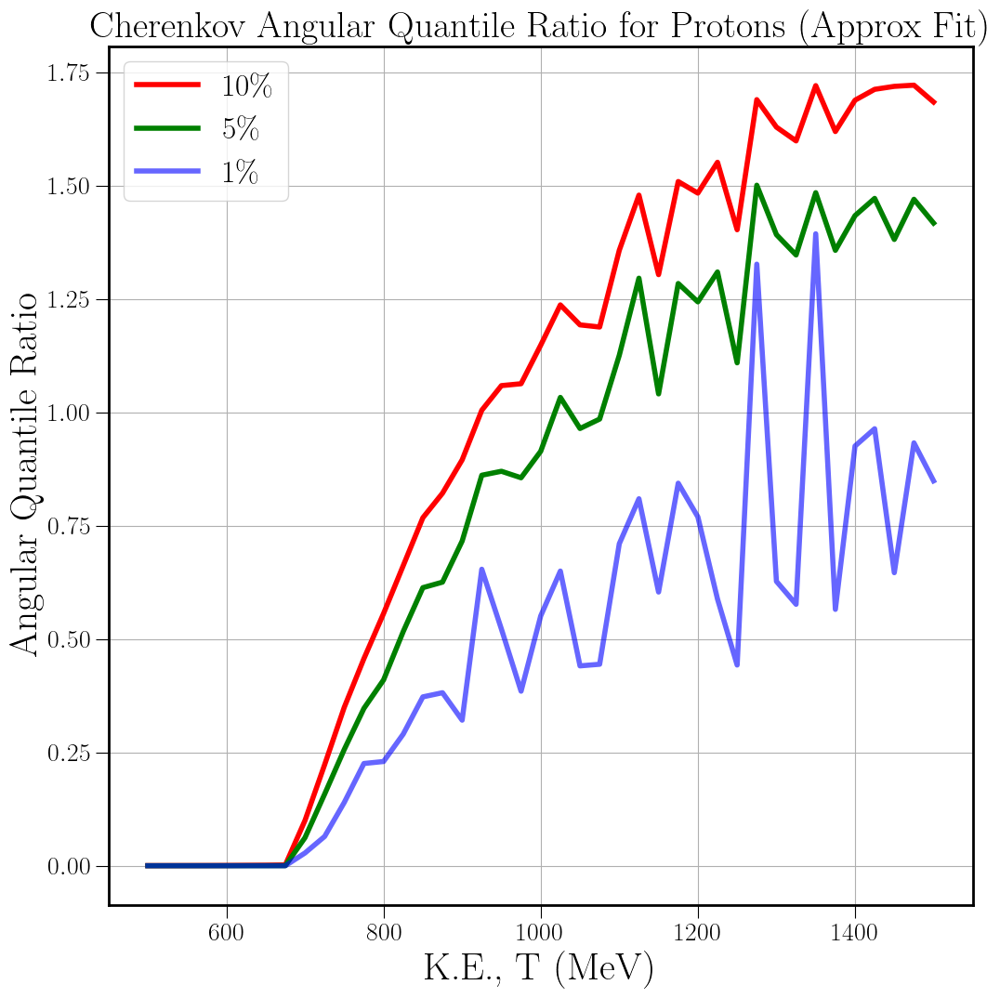

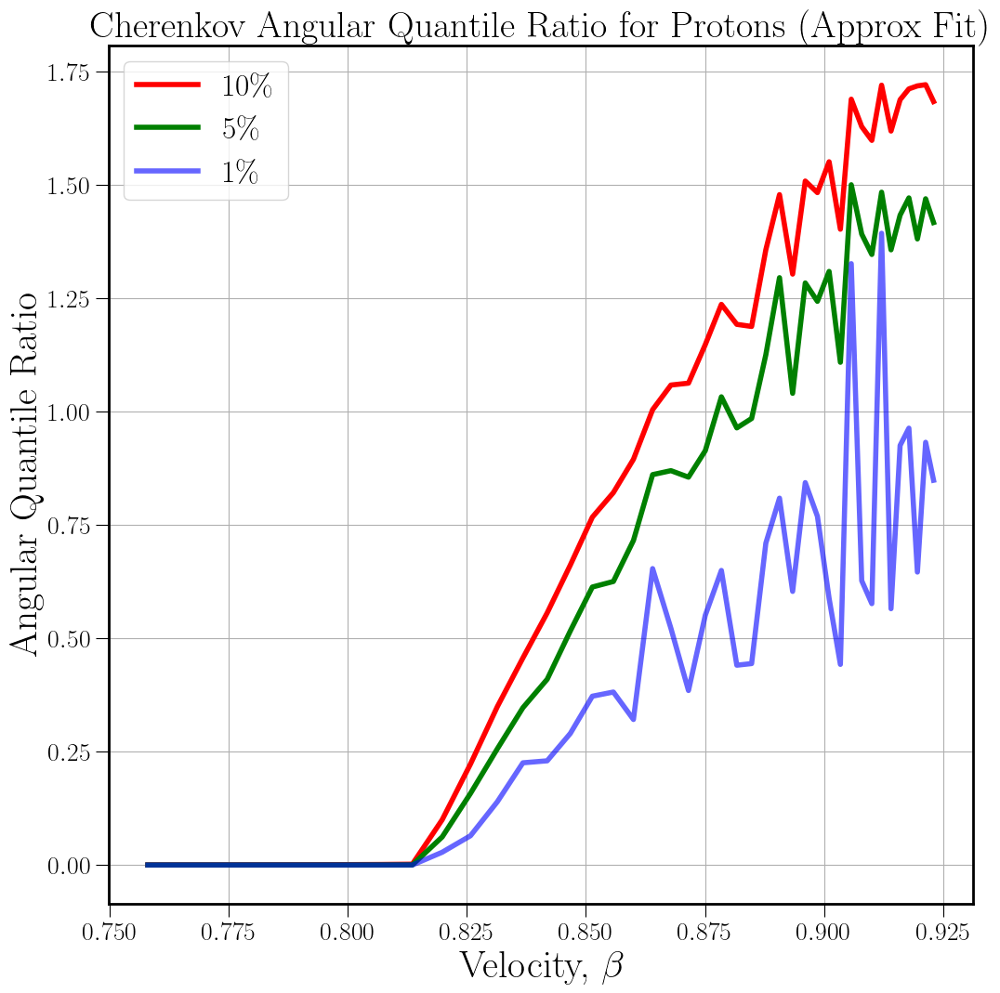

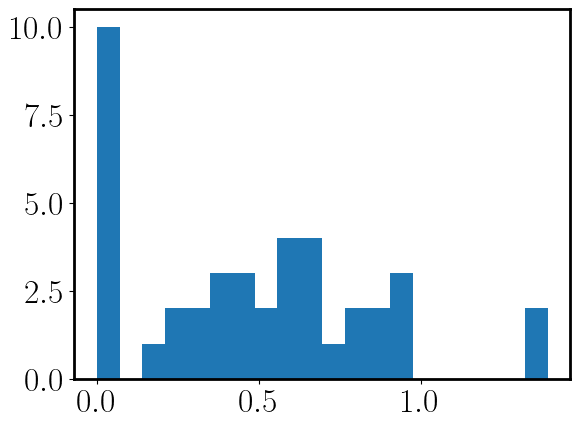

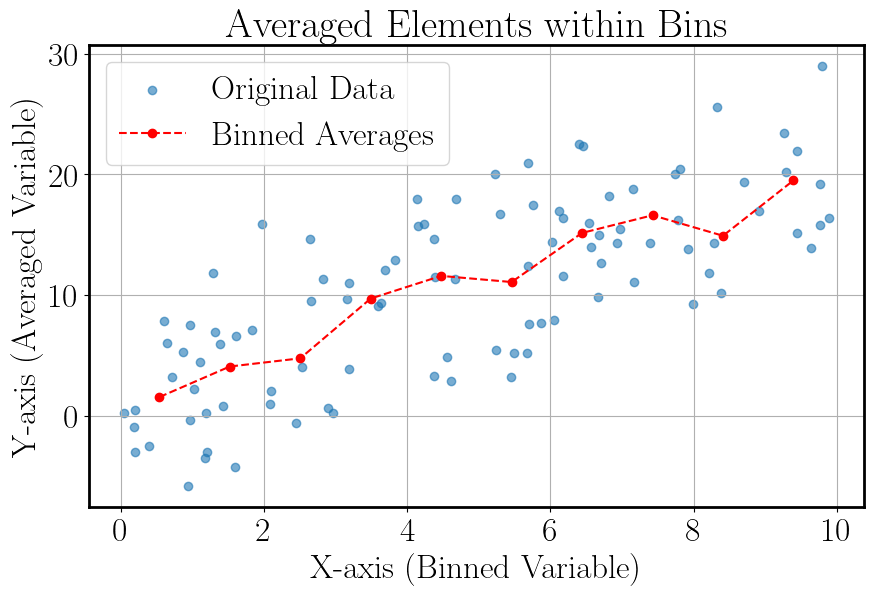

In [307]:
# Averaging elements within bins and then plotting these averages in Python can be achieved using libraries like NumPy and Matplotlib.
import numpy as np
import matplotlib.pyplot as plt

# 1. Generate or load your data
# For demonstration, let's create some sample data
np.random.seed(0) # for reproducibility
x_data = np.random.rand(100) * 10 # x-values for binning
y_data = 2 * x_data + np.random.randn(100) * 5 # y-values to be averaged

# 2. Define the bins
num_bins = 10
# You can define custom bin edges or let NumPy determine them
bin_edges = np.linspace(min(x_data), max(x_data), num_bins + 1)

# 3. Bin the data and calculate the mean for each bin
# Use np.digitize to assign each x_data point to a bin index
bin_indices = np.digitize(x_data, bin_edges)

# Calculate the mean of y_data for each bin
bin_means = []
bin_centers = []

for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin = y_data[bin_indices == i]
    if len(elements_in_bin) > 0: # Avoid division by zero for empty bins
        bin_means.append(np.mean(elements_in_bin))
        # Calculate bin center for plotting
        bin_centers.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means.append(np.nan)
        bin_centers.append((bin_edges[i-1] + bin_edges[i]) / 2)

# Remove NaN values if you don't want to plot empty bins
bin_centers = np.array(bin_centers)[~np.isnan(bin_means)]
bin_means = np.array(bin_means)[~np.isnan(bin_means)]

# 4. Plot the results
plt.figure(figsize=(10, 6))
plt.scatter(x_data, y_data, alpha=0.6, label='Original Data')
plt.plot(bin_centers, bin_means, color='red', marker='o', linestyle='--', label='Binned Averages')
plt.xlabel('X-axis (Binned Variable)')
plt.ylabel('Y-axis (Averaged Variable)')
plt.title('Averaged Elements within Bins')
plt.legend()
plt.grid(True)
plt.show()

# Explanation:
# Data Generation/Loading: Sample x_data (the variable to be binned) and y_data (the variable to be averaged within bins) are created. 
# In a real scenario, you would load your own data.
# Bin Definition: np.linspace is used to create evenly spaced bin_edges. You can customize num_bins or specify your own bin_edges.
# Binning and Averaging:
# np.digitize assigns each x_data point to a specific bin based on the bin_edges.
# A loop iterates through each defined bin. For each bin, it selects the y_data points that fall into that bin and calculates their mean using np.mean.
# bin_centers are calculated to represent the x-coordinate for plotting the averaged values.
# Empty bins are handled by appending np.nan to bin_means, which can then be filtered out before plotting if desired.
# Plotting:
# plt.scatter is used to visualize the original data points.
# plt.plot is used to plot the calculated bin_means against their corresponding bin_centers, providing a visual representation of the binned averages.
# Labels, title, legend, and grid are added for clarity.

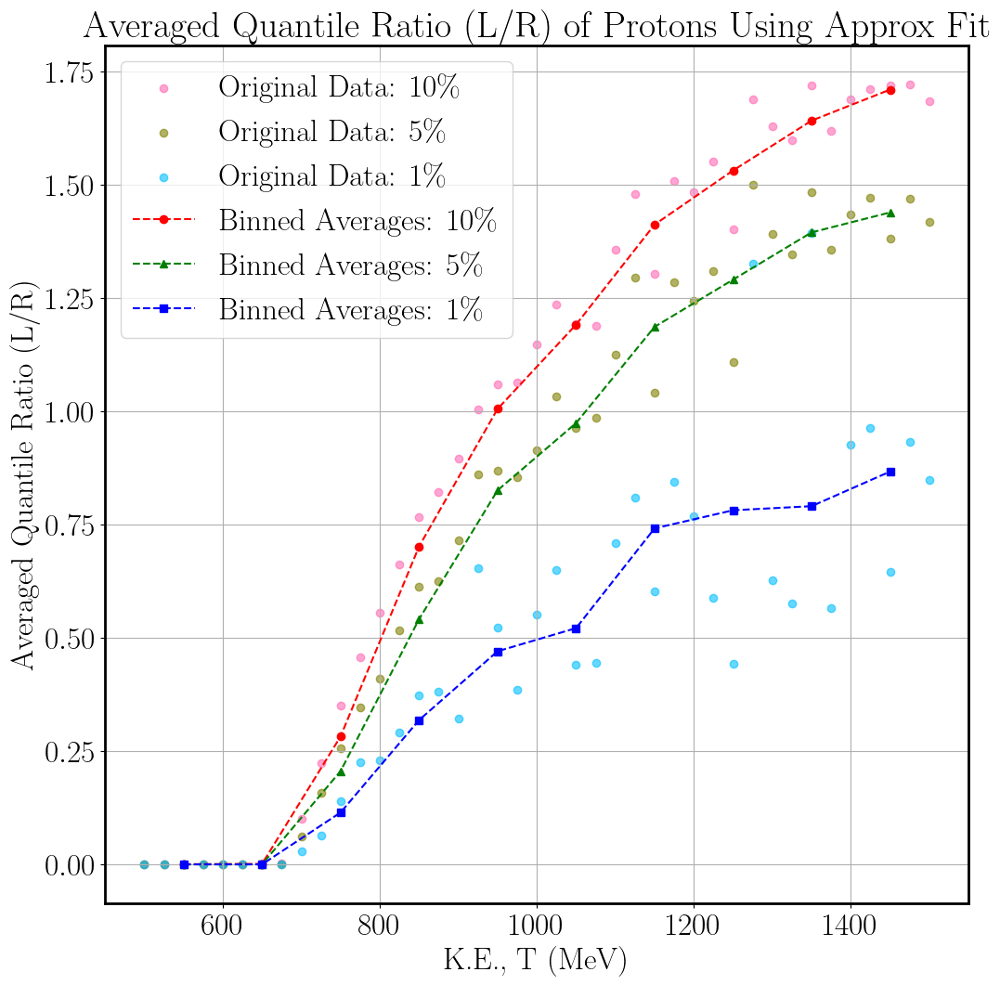

In [308]:
# Averaging elements within bins and then plotting these averages in Python can be achieved using libraries like NumPy and Matplotlib.
import numpy as np
import matplotlib.pyplot as plt
# !pip install resample
# import resample

# 1. Generate or load your data
# For demonstration, let's create some sample data
np.random.seed(0) # for reproducibility
# x_data = np.random.rand(100) * 10 # x-values for binning
# y_data = 2 * x_data + np.random.randn(100) * 5 # y-values to be averaged

x_data = t # x-values for binning
y_data1 = np.array(nbyapps10) # y-values to be averaged
y_data2 = np.array(nbyapps05)
y_data3 = np.array(nbyapps01)
 
# 2. Define the bins
num_bins = 10
# You can define custom bin edges or let NumPy determine them
bin_edges = np.linspace(min(x_data), max(x_data), num_bins + 1)

# 3. Bin the data and calculate the mean for each bin
# Use np.digitize to assign each x_data point to a bin index
bin_indices = np.digitize(x_data, bin_edges)

# Calculate the mean of y_data for each bin
bin_means1 = []
bin_centers1 = []

bin_means2 = []
bin_centers2 = []

bin_means3 = []
bin_centers3 = []

for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin1 = y_data1[bin_indices == i]
    if len(elements_in_bin1) > 0: # Avoid division by zero for empty bins
        bin_means1.append(np.mean(elements_in_bin1))
        # Calculate bin center for plotting
        bin_centers1.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means1.append(np.nan)
        bin_centers1.append((bin_edges[i-1] + bin_edges[i]) / 2)

for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin2 = y_data2[bin_indices == i]
    if len(elements_in_bin2) > 0: # Avoid division by zero for empty bins
        bin_means2.append(np.mean(elements_in_bin2))
        # Calculate bin center for plotting
        bin_centers2.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means2.append(np.nan)
        bin_centers2.append((bin_edges[i-1] + bin_edges[i]) / 2)

for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin3 = y_data3[bin_indices == i]
    if len(elements_in_bin3) > 0: # Avoid division by zero for empty bins
        bin_means3.append(np.mean(elements_in_bin3))
        # Calculate bin center for plotting
        bin_centers3.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means3.append(np.nan)
        bin_centers3.append((bin_edges[i-1] + bin_edges[i]) / 2)

# Remove NaN values if you don't want to plot empty bins
bin_centers1 = np.array(bin_centers1)[~np.isnan(bin_means1)]
bin_means1 = np.array(bin_means1)[~np.isnan(bin_means1)]

bin_centers2 = np.array(bin_centers2)[~np.isnan(bin_means2)]
bin_means2 = np.array(bin_means2)[~np.isnan(bin_means2)]

bin_centers3 = np.array(bin_centers3)[~np.isnan(bin_means3)]
bin_means3 = np.array(bin_means3)[~np.isnan(bin_means3)]

# 4. Plot the results
plt.figure(figsize=(12, 12))

plt.scatter(x_data, y_data1, alpha=0.6, c='hotpink', label='Original Data: 10\%')
plt.scatter(x_data, y_data2, alpha=0.6, c='olive', label='Original Data: 5\%')
plt.scatter(x_data, y_data3, alpha=0.6, c='deepskyblue', label='Original Data: 1\%')

plt.plot(bin_centers1, bin_means1, color='red', marker='o', linestyle='--', label='Binned Averages: 10\%')
plt.plot(bin_centers2, bin_means2, color='green', marker='^', linestyle='--', label='Binned Averages: 5\%')
plt.plot(bin_centers3, bin_means3, color='blue', marker='s', linestyle='--', label='Binned Averages: 1\%')

plt.xlabel('K.E., T (MeV)') #(Binned Variable)
plt.ylabel('Averaged Quantile Ratio (L/R)') # (Averaged Variable)')
plt.title('Averaged Quantile Ratio (L/R) of Protons Using Approx Fit') #in Bins of K.E. 
plt.legend()
plt.grid(True)

# plt.savefig('binned_avg_nbyas_10_5_1_perc_approxfit_Cherenkov_IAD_Proton_allT_from_saved_data', bbox_inches='tight') #_zoom
plt.show()

In [309]:
#Jackknife resampling example code with a sample data 

import numpy as np

def jackknife_statistic(data, statistic):
    n = len(data)
    jackknife_samples = np.zeros(n)

    for i in range(n):
        sample = np.delete(data, i)
        jackknife_samples[i] = statistic(sample)

    jackknife_mean = np.mean(jackknife_samples)
    variance = (n - 1) / n * np.sum((jackknife_samples - jackknife_mean)**2)
    bias = (n - 1) * (jackknife_mean - statistic(data))
    
    return jackknife_mean, variance, bias

# Example
data = np.array([2, 4, 6, 8, 10])
stat = np.mean

mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
print("Jackknife Mean:", mean_jack)
print("Jackknife Variance:", var_jack)
print("Jackknife Bias:", bias_jack)

Jackknife Mean: 6.0
Jackknife Variance: 2.0
Jackknife Bias: 0.0


In [313]:
my_list = [10, 20, 30, 40, 50]
# To get the value of the last element
last_element_value = my_list[-1]
print(last_element_value)

# To get the index of the last element using its value and list.index()
# This assumes the last element is unique or you want the index of its first occurrence from the end
last_index = len(my_list) - 1
print(last_index)

50
4


[array([0.00020218, 0.00026641, 0.00033411, 0.00042735]), array([0.00057023, 0.00087001, 0.00115413, 0.00178376]), array([0.09984176, 0.22284626, 0.34943837, 0.45668765]), array([0.55613135, 0.66161265, 0.76720677, 0.82137577]), array([0.89485453, 1.00427243, 1.05860059, 1.0627691 ]), array([1.14779938, 1.23656916, 1.1925049 , 1.18781213]), array([1.35704495, 1.47858673, 1.30329526, 1.50858827]), array([1.48306485, 1.55106217, 1.40227315, 1.68912307]), array([1.6285511 , 1.59819751, 1.72002875, 1.61881277]), array([1.68792409, 1.71186655, 1.71843778, 1.7210616 ])] [3.07512420e-04 1.09453279e-03 2.82203510e-01 7.01581631e-01
 1.00512416e+00 1.19117139e+00 1.41187880e+00 1.53138081e+00
 1.64139753e+00 1.70982251e+00]
[array([1.77525583e-05, 2.37045869e-05, 3.16994657e-05, 3.77637750e-05]), array([5.19099497e-05, 7.56163797e-05, 9.82179883e-05, 1.58908097e-04]), array([0.06188388, 0.15798374, 0.25643794, 0.34692401]), array([0.40968673, 0.51626468, 0.6130964 , 0.62532015]), array([0.71578

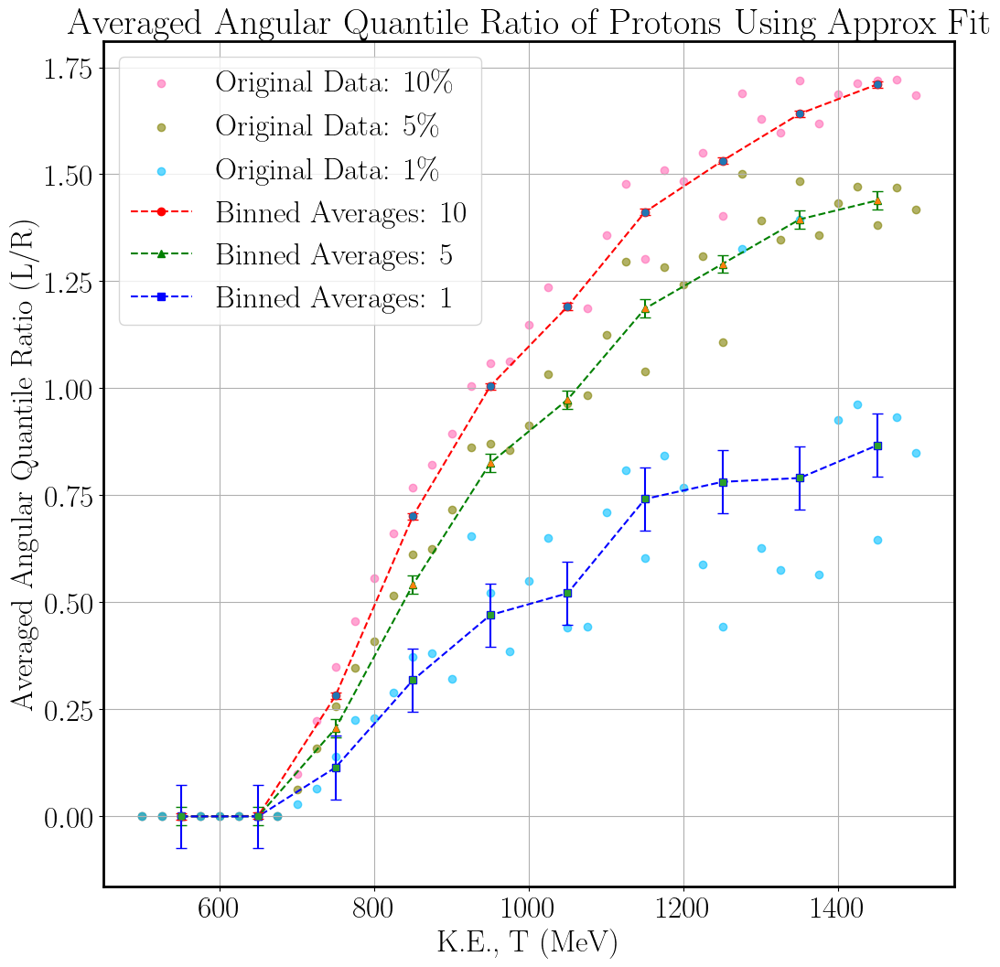

In [315]:
# Averaging elements within bins and then plotting these averages in Python can be achieved using libraries like NumPy and Matplotlib.
import numpy as np
import matplotlib.pyplot as plt
# !pip install resample
import resample

# 1. Generate or load your data
# For demonstration, let's create some sample data
np.random.seed(0) # for reproducibility
# x_data = np.random.rand(100) * 10 # x-values for binning
# y_data = 2 * x_data + np.random.randn(100) * 5 # y-values to be averaged

x_data = t # x-values for binning
y_data1 = np.array(nbyapps10) # y-values to be averaged
y_data2 = np.array(nbyapps05)
y_data3 = np.array(nbyapps01)
 
# 2. Define the bins
num_bins = 10
# You can define custom bin edges or let NumPy determine them
bin_edges = np.linspace(min(x_data), max(x_data), num_bins + 1)

# 3. Bin the data and calculate the mean for each bin
# Use np.digitize to assign each x_data point to a bin index
bin_indices = np.digitize(x_data, bin_edges)

# Calculate the mean of y_data for each bin
bin_means1 = []
bin_centers1 = []

bin_means2 = []
bin_centers2 = []

bin_means3 = []
bin_centers3 = []

elements_in_bins_10 = []
elements_in_bins_05 = []
elements_in_bins_01 = []

bin_means_10 = []
bin_means_05 = []
bin_means_01 = []

#10% Q. ratios
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin1 = y_data1[bin_indices == i]
    if len(elements_in_bin1) > 0: # Avoid division by zero for empty bins
        bin_means1.append(np.mean(elements_in_bin1))
        # Calculate bin center for plotting
        bin_centers1.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means1.append(np.nan)
        bin_centers1.append((bin_edges[i-1] + bin_edges[i]) / 2)

    elements_in_bins_10.append(elements_in_bin1)
    # bin_means_10.append(np.array(bin_means1[-1])) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_10, bin_means_10) 

#5% Q. ratios
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin2 = y_data2[bin_indices == i]    
    if len(elements_in_bin2) > 0: # Avoid division by zero for empty bins
        bin_means2.append(np.mean(elements_in_bin2))
        # Calculate bin center for plotting
        bin_centers2.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means2.append(np.nan)
        bin_centers2.append((bin_edges[i-1] + bin_edges[i]) / 2)

    elements_in_bins_05.append(elements_in_bin2)
    # bin_means_05.append(bin_means2[-1]) ##bin_means1[-1]: value of the last element of an array/list      
# print(elements_in_bins_05, bin_means_05)


#1% Q. ratios
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin3 = y_data3[bin_indices == i]
    if len(elements_in_bin3) > 0: # Avoid division by zero for empty bins
        bin_means3.append(np.mean(elements_in_bin3))
        # Calculate bin center for plotting
        bin_centers3.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means3.append(np.nan)
        bin_centers3.append((bin_edges[i-1] + bin_edges[i]) / 2)
    
    elements_in_bins_01.append(elements_in_bin3)
    # bin_means_01.append(bin_means3[-1]) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_01, bin_means_01)    


# Remove NaN values if you don't want to plot empty bins
bin_centers1 = np.array(bin_centers1)[~np.isnan(bin_means1)]
bin_means1 = np.array(bin_means1)[~np.isnan(bin_means1)]

bin_centers2 = np.array(bin_centers2)[~np.isnan(bin_means2)]
bin_means2 = np.array(bin_means2)[~np.isnan(bin_means2)]

bin_centers3 = np.array(bin_centers3)[~np.isnan(bin_means3)]
bin_means3 = np.array(bin_means3)[~np.isnan(bin_means3)]

# print(bin_means1, bin_means2, bin_means3)

print(elements_in_bins_10, bin_means1)
print(elements_in_bins_05, bin_means2)
print(elements_in_bins_01, bin_means3)

#Jackknife resampling with my data 

def jackknife_statistic(data, statistic):
    n = len(data)
    jackknife_samples = np.zeros(n)

    for i in range(n):
        sample = np.delete(data, i)
        jackknife_samples[i] = statistic(sample)

    jackknife_mean = np.mean(jackknife_samples)
    variance = (n - 1) / n * np.sum((jackknife_samples - jackknife_mean)**2)
    bias = (n - 1) * (jackknife_mean - statistic(data))
    
    return jackknife_mean, variance, bias

# Example
# data = np.array([2, 4, 6, 8, 10])
#Real Data
data10 = elements_in_bins_10
data05 = elements_in_bins_05
data01 = elements_in_bins_01
# print("data10 = {}, data05 = {}, data01 = {}".format(data10, data05, data01))
stat = np.mean

# # mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
# mean_jack10, var_jack10, bias_jack10 = jackknife_statistic(data10, stat)
# mean_jack05, var_jack05, bias_jack05 = jackknife_statistic(data05, stat)
# mean_jack01, var_jack01, bias_jack01 = jackknife_statistic(data01, stat)


for i in data10: 
# mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
    mean_jack10, var_jack10, bias_jack10 = jackknife_statistic(i, stat)
    # mean_jack05, var_jack05, bias_jack05 = jackknife_statistic(data05, stat)
    # mean_jack01, var_jack01, bias_jack01 = jackknife_statistic(data01, stat)
    print("Jackknife 10 %: mean={}, var={}, bias={}".format(mean_jack10, var_jack10, bias_jack10))

for j in data05: 
# mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
    # mean_jack10, var_jack10, bias_jack10 = jackknife_statistic(i, stat)
    mean_jack05, var_jack05, bias_jack05 = jackknife_statistic(j, stat)
    # mean_jack01, var_jack01, bias_jack01 = jackknife_statistic(data01, stat)
    print("Jackknife 5 %: mean={}, var={}, bias={}".format(mean_jack05, var_jack05, bias_jack05))


for k in data01: 
# mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
    # mean_jack10, var_jack10, bias_jack10 = jackknife_statistic(i, stat)
    # mean_jack05, var_jack05, bias_jack05 = jackknife_statistic(data05, stat)
    mean_jack01, var_jack01, bias_jack01 = jackknife_statistic(k, stat)
    print("Jackknife 1 %: mean={}, var={}, bias={}".format(mean_jack01, var_jack01, bias_jack01))


    # print("Jackknife Means:", mean_jack10, mean_jack05, mean_jack01)
    # print("Jackknife Variances:", var_jack10, var_jack05, var_jack01)
    # print("Jackknife Biases:", bias_jack10, bias_jack05, bias_jack01)


# 4. Plot the results
plt.figure(figsize=(12, 12))

plt.scatter(x_data, y_data1, alpha=0.6, c='hotpink', label='Original Data: 10\%')
plt.scatter(x_data, y_data2, alpha=0.6, c='olive', label='Original Data: 5\%')
plt.scatter(x_data, y_data3, alpha=0.6, c='deepskyblue', label='Original Data: 1\%')

plt.plot(bin_centers1, bin_means1, color='red', marker='o', linestyle='--', label='Binned Averages: 10%')
plt.plot(bin_centers2, bin_means2, color='green', marker='^', linestyle='--', label='Binned Averages: 5%')
plt.plot(bin_centers3, bin_means3, color='blue', marker='s', linestyle='--', label='Binned Averages: 1%')

# plt.errorbar(x_values, y_estimates, yerr=jackknife_errors, fmt='o', capsize=4, ecolor='red', markersize=5)  #Jackknife errorbar
plt.errorbar(bin_centers1, bin_means1, yerr=np.sqrt(var_jack10), fmt='o', capsize=4, ecolor='red', markersize=5)  #Jackknife errorbar for 10% Q.ratio
plt.errorbar(bin_centers2, bin_means2, yerr=np.sqrt(var_jack05), fmt='^', capsize=4, ecolor='green', markersize=5)  #Jackknife errorbar for 10% Q.ratio
plt.errorbar(bin_centers3, bin_means3, yerr=np.sqrt(var_jack01), fmt='s', capsize=4, ecolor='blue', markersize=5)  #Jackknife errorbar for 10% Q.ratio

plt.xlabel('K.E., T (MeV)') #(Binned Variable)
plt.ylabel('Averaged Angular Quantile Ratio (L/R)') # (Averaged Variable)')
plt.title('Averaged Angular Quantile Ratio of Protons Using Approx Fit') #in Bins of K.E. 
plt.legend()
plt.grid(True)

# plt.savefig('binned_avg_nbyas_10_5_1_perc_approxfit_Cherenkov_IAD_Proton_allT_from_saved_data_w_jackknife_err', bbox_inches='tight') #_zoom
plt.show()

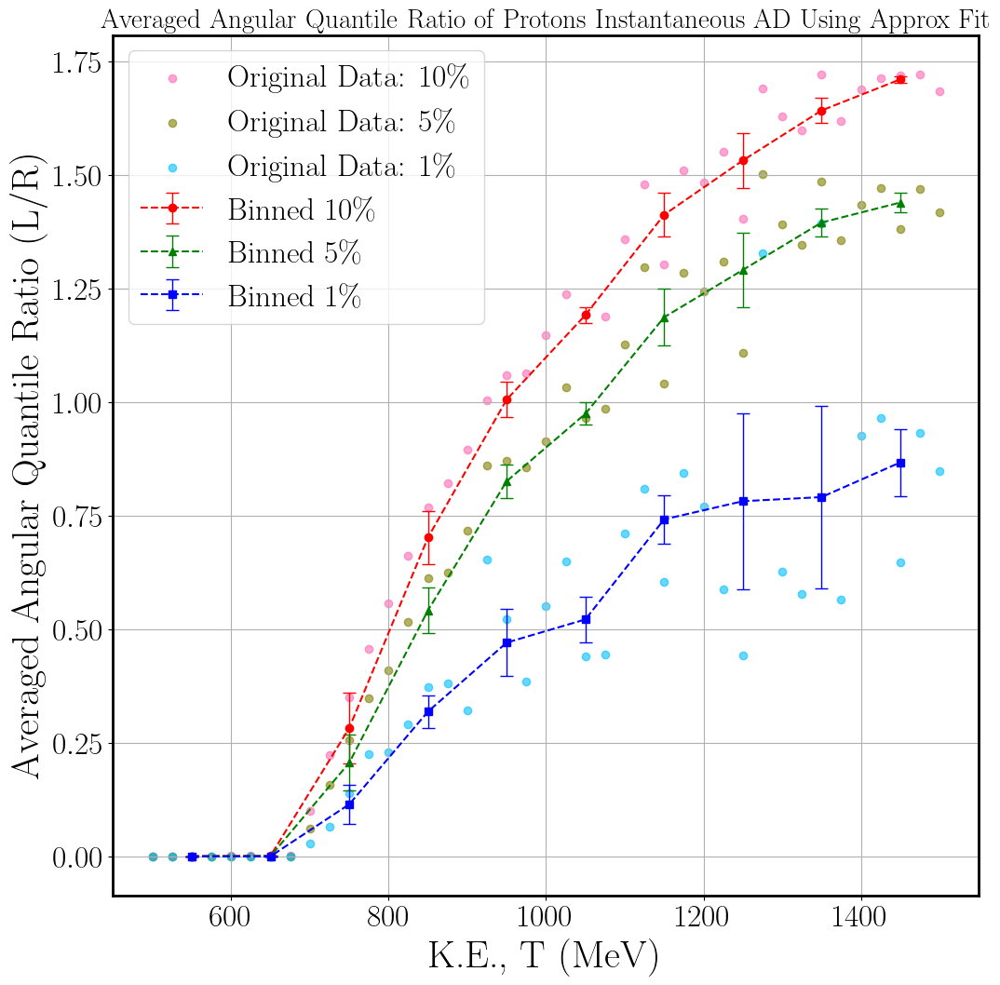

In [83]:
# Averaging elements within bins and then plotting these averages in Python can be achieved using libraries like NumPy and Matplotlib.
import numpy as np
import matplotlib.pyplot as plt
# !pip install resample
import resample

# 1. Generate or load your data
# For demonstration, let's create some sample data
np.random.seed(0) # for reproducibility
# x_data = np.random.rand(100) * 10 # x-values for binning
# y_data = 2 * x_data + np.random.randn(100) * 5 # y-values to be averaged

x_data = t # x-values for binning
y_data1 = np.array(nbyapps10) # y-values to be averaged
y_data2 = np.array(nbyapps05)
y_data3 = np.array(nbyapps01)
 
# 2. Define the bins
num_bins = 10
# You can define custom bin edges or let NumPy determine them
bin_edges = np.linspace(min(x_data), max(x_data), num_bins + 1)

# 3. Bin the data and calculate the mean for each bin
# Use np.digitize to assign each x_data point to a bin index
bin_indices = np.digitize(x_data, bin_edges)

# Calculate the mean of y_data for each bin
bin_means1 = []
bin_centers1 = []

bin_means2 = []
bin_centers2 = []

bin_means3 = []
bin_centers3 = []

elements_in_bins_10 = []
elements_in_bins_05 = []
elements_in_bins_01 = []

bin_means_10 = []
bin_means_05 = []
bin_means_01 = []

#10% Q.ratio
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin1 = y_data1[bin_indices == i]
    if len(elements_in_bin1) > 0: # Avoid division by zero for empty bins
        bin_means1.append(np.mean(elements_in_bin1))
        # Calculate bin center for plotting
        bin_centers1.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means1.append(np.nan)
        bin_centers1.append((bin_edges[i-1] + bin_edges[i]) / 2)
    elements_in_bins_10.append(elements_in_bin1)
    # bin_means_10.append(np.array(bin_means1[-1])) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_10, bin_means_10) 


#5% Q.ratio    
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin2 = y_data2[bin_indices == i]
    if len(elements_in_bin2) > 0: # Avoid division by zero for empty bins
        bin_means2.append(np.mean(elements_in_bin2))
        # Calculate bin center for plotting
        bin_centers2.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means2.append(np.nan)
        bin_centers2.append((bin_edges[i-1] + bin_edges[i]) / 2)
    elements_in_bins_05.append(elements_in_bin2)
    # bin_means_05.append(bin_means2[-1]) ##bin_means1[-1]: value of the last element of an array/list      
# print(elements_in_bins_05, bin_means_05)


#1% Q.ratio
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin3 = y_data3[bin_indices == i]
    if len(elements_in_bin3) > 0: # Avoid division by zero for empty bins
        bin_means3.append(np.mean(elements_in_bin3))
        # Calculate bin center for plotting
        bin_centers3.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means3.append(np.nan)
        bin_centers3.append((bin_edges[i-1] + bin_edges[i]) / 2)

    elements_in_bins_01.append(elements_in_bin3)
    # bin_means_01.append(bin_means3[-1]) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_01, bin_means_01)    


# Remove NaN values if you don't want to plot empty bins
bin_centers1 = np.array(bin_centers1)[~np.isnan(bin_means1)]
bin_means1 = np.array(bin_means1)[~np.isnan(bin_means1)]

bin_centers2 = np.array(bin_centers2)[~np.isnan(bin_means2)]
bin_means2 = np.array(bin_means2)[~np.isnan(bin_means2)]

bin_centers3 = np.array(bin_centers3)[~np.isnan(bin_means3)]
bin_means3 = np.array(bin_means3)[~np.isnan(bin_means3)]


# print(bin_means1, bin_means2, bin_means3)

# print(elements_in_bins_10, bin_means1)
# print(elements_in_bins_05, bin_means2)
# print(elements_in_bins_01, bin_means3)

#Jackknife resampling with my data 

def jackknife_statistic(data, statistic):
    n = len(data)
    jackknife_samples = np.zeros(n)

    for i in range(n):
        sample = np.delete(data, i)
        jackknife_samples[i] = statistic(sample)

    jackknife_mean = np.mean(jackknife_samples)
    variance = (n - 1) / n * np.sum((jackknife_samples - jackknife_mean)**2)
    bias = (n - 1) * (jackknife_mean - statistic(data))
    
    return jackknife_mean, variance, bias

# Example
# data = np.array([2, 4, 6, 8, 10])
#Real Data
data10 = elements_in_bins_10
data05 = elements_in_bins_05
data01 = elements_in_bins_01
# print("data10 = {}, data05 = {}, data01 = {}".format(data10, data05, data01))
stat = np.mean


# Initialize empty lists to store results for each bin
means_10, errs_10 = [], []
means_05, errs_05 = [], []
means_01, errs_01 = [], []

# Loop for 10% data
for bin_data in elements_in_bins_10:
    if len(bin_data) > 1: # Jackknife requires at least 2 points
        m, v, b = jackknife_statistic(bin_data, np.mean)
        means_10.append(m)
        errs_10.append(np.sqrt(v)) # Error bar is square root of variance
    else:
        means_10.append(np.nan)
        errs_10.append(np.nan)

# Loop for 5% data
for bin_data in elements_in_bins_05:
    if len(bin_data) > 1:
        m, v, b = jackknife_statistic(bin_data, np.mean)
        means_05.append(m)
        errs_05.append(np.sqrt(v))
    else:
        means_05.append(np.nan)
        errs_05.append(np.nan)

# Loop for 1% data
for bin_data in elements_in_bins_01:
    if len(bin_data) > 1:
        m, v, b = jackknife_statistic(bin_data, np.mean)
        means_01.append(m)
        errs_01.append(np.sqrt(v))
    else:
        means_01.append(np.nan)
        errs_01.append(np.nan)


#Plotting 

plt.figure(figsize=(12, 12))

plt.scatter(x_data, y_data1, alpha=0.6, c='hotpink', label='Original Data: 10\%')
plt.scatter(x_data, y_data2, alpha=0.6, c='olive', label='Original Data: 5\%')
plt.scatter(x_data, y_data3, alpha=0.6, c='deepskyblue', label='Original Data: 1\%')


# Define labels and colors for cleaner code
datasets = [
    (bin_centers1, means_10, errs_10, 'red', 'o', '10\%'),
    (bin_centers2, means_05, errs_05, 'green', '^', '5\%'),
    (bin_centers3, means_01, errs_01, 'blue', 's', '1\%')
]

for x, y, yerr, color, marker, label in datasets:
    # Convert to numpy arrays to handle indexing/NaNs
    x, y, yerr = np.array(x), np.array(y), np.array(yerr)
    mask = ~np.isnan(y)
    
    plt.errorbar(x[mask], y[mask], yerr=yerr[mask], 
                 fmt=marker, color=color, linestyle='--', 
                 capsize=5, elinewidth=1, label=f'Binned {label}') #f'Binned {label}'

plt.xlabel('K.E., T (MeV)', size=30) #(Binned Variable)
plt.ylabel('Averaged Angular Quantile Ratio (L/R)', size=30) # (Averaged Variable)')
plt.title('Averaged Angular Quantile Ratio of Protons Instantaneous AD Using Approx Fit', size=21) #in Bins of K.E. 
plt.legend()
plt.grid(True)

# plt.savefig('binned_avg_nbyas_10_5_1_perc_approxfit_Cherenkov_IAD_Proton_allT_from_saved_data_w_jackknife_err_corrected', bbox_inches='tight') #_zoom
plt.show()

# Proton's AQR from IAD (HO fit + Comparison w/Approx fit) 

In [51]:
#HO Fit
# K.E or Beta
# t = 500

#Linear space in K.E.
t = np.linspace(500, 1500, 41)
# print(t)

mp = 938  #Proton's mass in MeV
betap  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

print (t, betap, np.round(betap,3))

n_peakr = 1.3605
n_500 = 1.2278

cos_ang_min = []
con_ang_maxn = []
thetamax = []
thetamin = []

for i in betap: 
        
    #Quantile Window: Integration Stepsize 
    
    cos_ang_min = 1/(i * n_peakr)
    thetamax = np.arccos(cos_ang_min)*(180/np.pi)
    
    cos_ang_maxn =  min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
    # cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
    thetamin = np.arccos(cos_ang_maxn)*(180/np.pi)
    
    
    dp = (thetamax - thetamin)/(180/(2*2000)) #No of data points
    
    
    theta_window = (thetamax - thetamin)/10 #10% of databins 
    
    min_window = thetamin + theta_window
    
    max_window = thetamax - theta_window 

    print(i, thetamin, min_window, max_window, thetamax) 

[ 500.  525.  550.  575.  600.  625.  650.  675.  700.  725.  750.  775.
  800.  825.  850.  875.  900.  925.  950.  975. 1000. 1025. 1050. 1075.
 1100. 1125. 1150. 1175. 1200. 1225. 1250. 1275. 1300. 1325. 1350. 1375.
 1400. 1425. 1450. 1475. 1500.] [0.75796532 0.76741698 0.77628968 0.78463315 0.79249149 0.79990401
 0.80690583 0.81352846 0.81980026 0.82574686 0.83139144 0.83675507
 0.8418569  0.84671442 0.8513436  0.85575908 0.85997431 0.86400164
 0.86785245 0.87153724 0.87506571 0.87844687 0.88168902 0.88479989
 0.88778668 0.89065607 0.89341428 0.89606712 0.89862002 0.90107804
 0.90344595 0.90572818 0.9079289  0.91005203 0.91210124 0.91407999
 0.91599153 0.91783893 0.91962507 0.92135268 0.92302433] [0.758 0.767 0.776 0.785 0.792 0.8   0.807 0.814 0.82  0.826 0.831 0.837
 0.842 0.847 0.851 0.856 0.86  0.864 0.868 0.872 0.875 0.878 0.882 0.885
 0.888 0.891 0.893 0.896 0.899 0.901 0.903 0.906 0.908 0.91  0.912 0.914
 0.916 0.918 0.92  0.921 0.923]
0.7579653181328908 0.0 1.41326869015289

[ 500.  525.  550.  575.  600.  625.  650.  675.  700.  725.  750.  775.
  800.  825.  850.  875.  900.  925.  950.  975. 1000. 1025. 1050. 1075.
 1100. 1125. 1150. 1175. 1200. 1225. 1250. 1275. 1300. 1325. 1350. 1375.
 1400. 1425. 1450. 1475. 1500.]
K.E.=500.0, beta=0.7579653181328908, dp=31.0, theta_windowh=1.4132686901528966, thetaminh=0.0, min_windowh=1.4132686901528966, max_windowh=12.719418211376068, thetamaxh=14.132686901528965
The element closest to 0.0 is at index: 0
The closest element is: 0.0
The element closest to 1.4132686901528966 is at index: 31
The closest element is: 1.3956978489244622
The element closest to 12.719418211376068 is at index: 283
The closest element is: 12.741370685342671
The element closest to 14.132686901528965 is at index: 314
The closest element is: 14.137068534267135
500.0 MeV Proton: 10 % Normal Quantile = [0.00000000e+00 8.85955328e-06 7.08765575e-05 2.39209120e-04
 5.67016662e-04 1.10746057e-03 1.91370487e-03 3.03891684e-03
 4.53626774e-03 6.45893

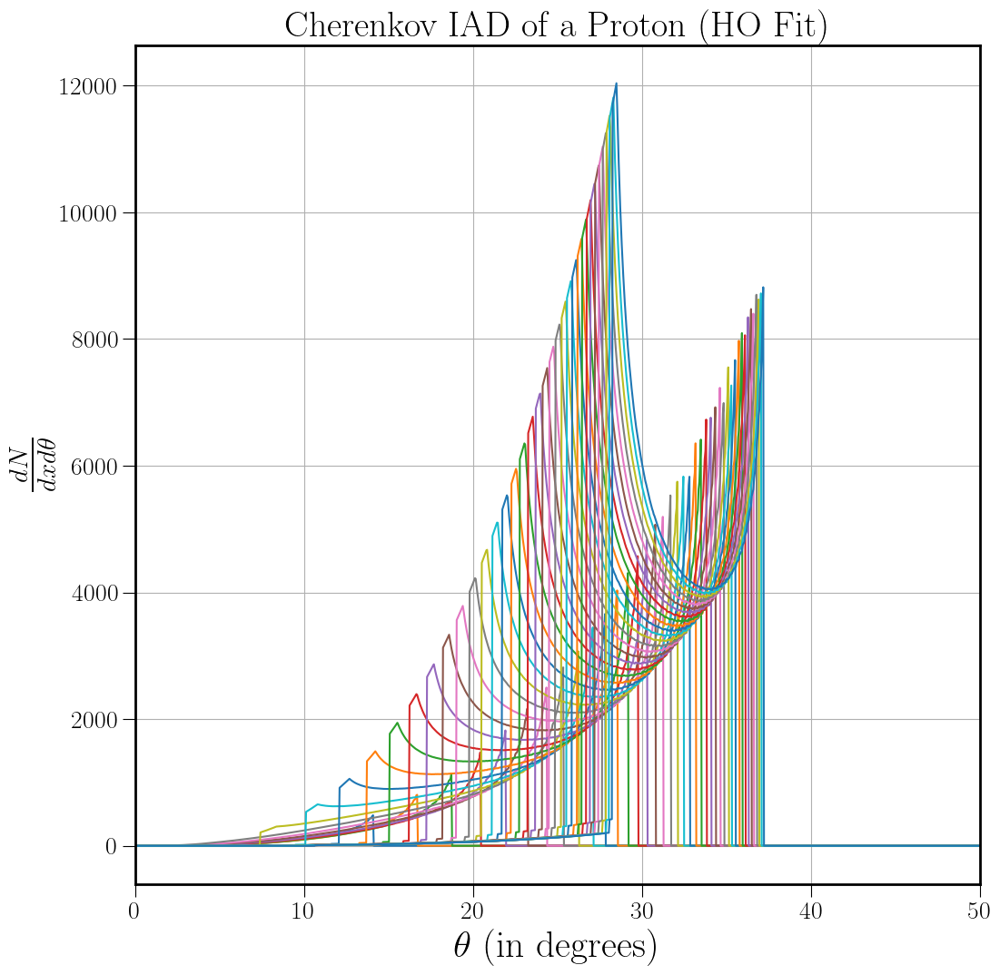

In [57]:
#Import libraries
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np


#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

# matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
# plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'$\theta$ (in degrees)', size= 30)
ax.set_ylabel(r'$\frac{dN}{dx d\theta}$', size= 30)
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Cherenkov IAD of a Proton (HO Fit)')
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)


# #Defining integration window

# theta_window = (thetamax - thetamin)/10 #10% of databins # dp = (thetamax - thetamin)/(180/(2*2000)) 

# dp = np.round(2000*2*theta_window/180) #no. of datapoints within theta_window

# min_window = thetamin + theta_window

# max_window = thetamax - theta_window 



#Define a function to find the index of the desired element

def find_nearest_index_numpy(arr, value):
    """
    Finds the index of the element closest to 'value' in a NumPy array.
    """
    arr = np.array(arr)  # Ensure it's a NumPy array
    idx = np.abs(arr - value).argmin()
    return idx

#Explanation:
# np.abs(arr - value) calculates the absolute difference between each element in the array and the value.
# .argmin() returns the index of the minimum value in the resulting array of absolute differences, which corresponds to the element closest to value.

#Linear space in K.E.
t = np.linspace(500, 1500, 41)
print(t)

mp = 938  #Proton's mass in MeV
# betap  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

# print (t, betap, np.round(betap,4))

n_peakr = 1.3605
n_500 = 1.2278

cos_ang_minh = []
con_ang_maxh = []
thetamaxh = []
thetaminh = []


# Load the .npz file
#HO fit
# pdata500ho = np.load('IAD_new_data_for_PID\\iCherenkovdata_p_500_ho.npz')

# Create an empty dictionary to store the data.
data_dict = {}

# itotalts = []
# inormalts = []
# ianomts = []

itotalths = []
inormalths = []
ianomths = []

# itotalbts = []

itpnormhs10 = []
itpanomhs10 = []
nbyaphs10 = []
abynphs10 = []

itpnormhs05 = []
itpanomhs05 = []
nbyaphs05 = []
abynphs05 = []

itpnormhs01 = []
itpanomhs01 = []
nbyaphs01 = []
abynphs01 = []

# Loop through your values
for val in t:
    # Use an f-string to generate the key for the dictionary. (HO)
    # key = f"pdata_{val:.0f}_ho"
    ho = f"pdata_{val:.0f}_ho"
    
    # Use another f-string to generate the filename for loading.
    filename1 = fr"IAD_new_data_for_PID\iCherenkovdata_p_{val:.0f}_ho.npz"
    
    # Store the loaded data in the dictionary using the generated key.
    # data_dict[key] = np.load(filename)
    data_dict[ho] = np.load(filename1) 
    # data_dict[ap] = np.load(filename3, allow_pickle=True) 

    costhetah = data_dict[ho]['costheta']
    thetah = data_dict[ho]['theta']
    itotalh = data_dict[ho]['itotalho']
    inormalh = data_dict[ho]['inormalho']
    ianomh = data_dict[ho]['ianomalousho']
    thetadegh = thetah*(180/np.pi) 
    itotalth = itotalh*np.sin(thetah)
    inormalth = inormalh*np.sin(thetah)
    ianomth = ianomh*np.sin(thetah)
    # print(costheta)
    
    ax.plot(thetadegh, itotalth, label='Total')
    # ax.plot(thetadeg, inormalt, label='Normal')
    # ax.plot(thetadeg, ianomt, label='Anomalous')

    
    # itotalts.append(itotalt.tolist())  
    # inormalts.append(inormalt)
    # ianomts.append(ianomt)
    
    itotalths.append(itotalth)

    i  = np.sqrt(1 - (1/(1 + val/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD


    #Quantile Window: Integration Stepsize 
    
    cos_ang_minh = 1/(i * n_peakr)
    thetamaxh = np.arccos(cos_ang_minh)*(180/np.pi)
    
    cos_ang_maxh = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
    # cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
    thetaminh = np.arccos(cos_ang_maxh)*(180/np.pi)

    #Defining integration window

    theta_windowh10 = (thetamaxh - thetaminh)/10 #10% of databins # dp = (thetamax - thetamin)/(180/(2*2000))
    theta_windowh05 = (thetamaxh - thetaminh)/20 #5% of databins # dp = (thetamax - thetamin)/(180/(2*2000))
    theta_windowh01 = (thetamaxh - thetaminh)/100 #1% of databins # dp = (thetamax - thetamin)/(180/(2*2000))
    
    dph10 = np.round(2000*2*theta_windowh10/180) #no. of datapoints within theta_window
    dph05 = np.round(2000*2*theta_windowh05/180) #no. of datapoints within theta_window
    dph01 = np.round(2000*2*theta_windowh01/180) #no. of datapoints within theta_window
    
    min_windowh10 = thetaminh + theta_windowh10
    max_windowh10 = thetamaxh - theta_windowh10 

    min_windowh05 = thetaminh + theta_windowh05
    max_windowh05 = thetamaxh - theta_windowh05 

    min_windowh01 = thetaminh + theta_windowh01
    max_windowh01 = thetamaxh - theta_windowh01 

    
    # print(i, thetamin, min_window, max_window, thetamax)
    print('K.E.={}, beta={}, dp={}, theta_windowh={}, thetaminh={}, min_windowh={}, max_windowh={}, thetamaxh={}'.format(val, i, dph10, theta_windowh10, thetaminh, min_windowh10, max_windowh10, thetamaxh)) 
    
    
    # Example usage:
    my_array = thetadegh

    #10% Quantile
    
    #Theta_min
    min_valueh = thetaminh
    min_indexh = find_nearest_index_numpy(my_array, min_valueh)
    print(f"The element closest to {min_valueh} is at index: {min_indexh}")
    print(f"The closest element is: {my_array[min_indexh]}")
    
    #Min_window
    min_window_valueh = thetaminh + theta_windowh10
    min_window_indexh = find_nearest_index_numpy(my_array, min_window_valueh)
    print(f"The element closest to {min_window_valueh} is at index: {min_window_indexh}")
    print(f"The closest element is: {my_array[min_window_indexh]}")
    
    #Max_window
    max_window_valueh = thetamaxh - theta_windowh10
    max_window_indexh = find_nearest_index_numpy(my_array, max_window_valueh)
    print(f"The element closest to {max_window_valueh} is at index: {max_window_indexh}")
    print(f"The closest element is: {my_array[max_window_indexh]}")
    
    #Theta_max
    max_valueh = thetamaxh
    max_indexh = find_nearest_index_numpy(my_array, max_valueh)
    print(f"The element closest to {max_valueh} is at index: {max_indexh}")
    print(f"The closest element is: {my_array[max_indexh]}")
    
    # Sum i-th to j-th elements of an array) 
    
    itotalnormh10 = itotalth[min_indexh:min_window_indexh]    
    itotalanomh10 = itotalth[max_window_indexh:max_indexh]
    
    print('{} MeV Proton: 10 % Normal Quantile = {}, 10 % Anomalous Quantile = {}'.format(val, itotalnormh10, itotalanomh10))
    
    # itnorm = sum(itotalnorm)* (thetamin + min_window)/2 
    # itanom = sum(itotalanom)* (max_window + thetamax)/2 
    
    # print('For {} MeV Proton: theta_window/dp = {}'.format(val, theta_window/dp))
    
    itnormh10 = sum(itotalnormh10) * (theta_windowh10/dph10) 
    itanomh10 = sum(itotalanomh10) * (theta_windowh10/dph10) 
    
    nbyaph10 = itnormh10 / itanomh10
    abynph10 = itanomh10 / itnormh10
    
    print('{} MeV Proton: Sum of 10 % Normal Quantile = {}, Sum of 10 % Anomalous Quantile = {}, 10 %  Normal/Anomalous = {}, 10 % Anomalous/Normal = {}'.format(val, itnormh10, itanomh10, nbyaph10, 1/nbyaph10))

    # itotalts.append(itotalt.tolist())  

    itpnormhs10.append(itnormh10)
    itpanomhs10.append(itanomh10)
    nbyaphs10.append(nbyaph10)
    abynphs10.append(abynph10)

    #5% Quantile

    print('K.E.={}, beta={}, dp={}, theta_windowh={}, thetaminh={}, min_windowh={}, max_windowh={}, thetamaxh={}'.format(val, i, dph05, theta_windowh05, thetaminh, min_windowh05, max_windowh05, thetamaxh)) 
    
    
    #Theta_min
    min_valueh = thetaminh
    min_indexh = find_nearest_index_numpy(my_array, min_valueh)
    print(f"The element closest to {min_valueh} is at index: {min_indexh}")
    print(f"The closest element is: {my_array[min_indexh]}")
    
    #Min_window
    min_window_valueh = thetaminh + theta_windowh05
    min_window_indexh = find_nearest_index_numpy(my_array, min_window_valueh)
    print(f"The element closest to {min_window_valueh} is at index: {min_window_indexh}")
    print(f"The closest element is: {my_array[min_window_indexh]}")
    
    #Max_window
    max_window_valueh = thetamaxh - theta_windowh05
    max_window_indexh = find_nearest_index_numpy(my_array, max_window_valueh)
    print(f"The element closest to {max_window_valueh} is at index: {max_window_indexh}")
    print(f"The closest element is: {my_array[max_window_indexh]}")
    
    #Theta_max
    max_valueh = thetamaxh
    max_indexh = find_nearest_index_numpy(my_array, max_valueh)
    print(f"The element closest to {max_valueh} is at index: {max_indexh}")
    print(f"The closest element is: {my_array[max_indexh]}")
    
    # Sum i-th to j-th elements of an array) 
    
    itotalnormh05 = itotalth[min_indexh:min_window_indexh]     
    itotalanomh05 = itotalth[max_window_indexh:max_indexh]
    
    print('{} MeV Proton: 5 % Normal Quantile = {}, 5 % Anomalous Quantile = {}'.format(val, itotalnormh05, itotalanomh05))
    
    # itnorm = sum(itotalnorm)* (thetamin + min_window)/2 
    # itanom = sum(itotalanom)* (max_window + thetamax)/2 
    
    # print('For {} MeV Proton: theta_window/dp = {}'.format(val, theta_window/dp))
    
    itnormh05 = sum(itotalnormh05) * (theta_windowh05/dph05) 
    itanomh05 = sum(itotalanomh05) * (theta_windowh05/dph05) 
    
    nbyaph05 = itnormh05 / itanomh05
    abynph05 = itanomh05 / itnormh05
    
    print('{} MeV Proton: Sum of 5 % Normal Quantile = {}, Sum of 5 % Anomalous Quantile = {}, 5 % Normal/Anomalous = {}, 5 % Anomalous/Normal = {}'.format(val, itnormh05, itanomh05, nbyaph05, 1/nbyaph05))

    # itotalts.append(itotalt.tolist())  

    itpnormhs05.append(itnormh05)
    itpanomhs05.append(itanomh05)
    nbyaphs05.append(nbyaph05)
    abynphs05.append(abynph05)

    #1% Quantile

    print('K.E.={}, beta={}, dp={}, theta_windowh={}, thetaminh={}, min_windowh={}, max_windowh={}, thetamaxh={}'.format(val, i, dph01, theta_windowh01, thetaminh, min_windowh01, max_windowh01, thetamaxh)) 
    
    
    #Theta_min
    min_valueh = thetaminh
    min_indexh = find_nearest_index_numpy(my_array, min_valueh)
    print(f"The element closest to {min_valueh} is at index: {min_indexh}")
    print(f"The closest element is: {my_array[min_indexh]}")
    
    #Min_window
    min_window_valueh = thetaminh + theta_windowh01
    min_window_indexh = find_nearest_index_numpy(my_array, min_window_valueh)
    print(f"The element closest to {min_window_valueh} is at index: {min_window_indexh}")
    print(f"The closest element is: {my_array[min_window_indexh]}")
    
    #Max_window
    max_window_valueh = thetamaxh - theta_windowh01
    max_window_indexh = find_nearest_index_numpy(my_array, max_window_valueh)
    print(f"The element closest to {max_window_valueh} is at index: {max_window_indexh}")
    print(f"The closest element is: {my_array[max_window_indexh]}")
    
    #Theta_max
    max_valueh = thetamaxh
    max_indexh = find_nearest_index_numpy(my_array, max_valueh)
    print(f"The element closest to {max_valueh} is at index: {max_indexh}")
    print(f"The closest element is: {my_array[max_indexh]}")
    
    # Sum i-th to j-th elements of an array) 
    
    itotalnormh01 = itotalth[min_indexh:min_window_indexh] #Left quantile
    itotalanomh01 = itotalth[max_window_indexh:max_indexh] #Right quantile
    
    print('{} MeV Proton: 1 % Normal Quantile = {}, 1 % Anomalous Quantile = {}'.format(val, itotalnormh01, itotalanomh01))
    
    # itnorm = sum(itotalnorm)* (thetamin + min_window)/2 
    # itanom = sum(itotalanom)* (max_window + thetamax)/2 
    
    # print('For {} MeV Proton: theta_window/dp = {}'.format(val, theta_window/dp))
    
    itnormh01 = sum(itotalnormh01) * (theta_windowh01/dph01) 
    itanomh01 = sum(itotalanomh01) * (theta_windowh01/dph01) 
    
    nbyaph01 = itnormh01 / itanomh01
    abynph01 = itanomh01 / itnormh01
    
    print('{} MeV Proton: Sum of 1 % Normal Quantile = {}, Sum of 1 % Anomalous Quantile = {}, 1 % Normal/Anomalous = {}, 1 % Anomalous/Normal = {}'.format(val, itnormh01, itanomh01, nbyaph01, 1/nbyaph01))

    # itotalts.append(itotalt.tolist())  

    itpnormhs01.append(itnormh01)
    itpanomhs01.append(itanomh01)
    nbyaphs01.append(nbyaph01)
    abynphs01.append(abynph01)



# print(np.shape(itpnormps05), np.shape(itpanomps05))
# print(itotalts.flatten())


################################################################################################################################
# ax.legend(fontsize=18)
ax.set_xlim(0,50)
ax.grid()

# plt.savefig('Cherenkov_IAD_Proton_allTs_new_data_ho', bbox_inches='tight')
# plt.savefig('Cherenkov_IAD_Proton_500_600_800_1000_MeV_new_data_ho', bbox_inches='tight')
# plt.savefig('Cherenkov_IAD_Proton_allTs_new_data_babicz', bbox_inches='tight')

# Close the file
# data.close()
# pdata500ho.close()
# pdata800ho.close()
# pdata1000ho.close()

In [247]:
# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'K.E., T (MeV)', size= 30)
ax.set_ylabel(r'Angular Quantile Ratio (L/R)', size= 30) #$\frac{N}{A}$
# ax.set_ylabel(r'Angular Quantile Ratio (R/L)', size= 30) #$\frac{N}{A}$
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Cherenkov Angular Quantile Ratio for Protons (HO Fit)')
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.plot(t, nbyaphs10, linewidth=4, c='r', label='$10 \%$')
ax.plot(t, nbyaphs05, linewidth=4, c='g', label='$5 \%$')
ax.plot(t, nbyaphs01, linewidth=4, c='b', label='$1 \%$')

# ax.plot(t, abynphs10, linewidth=4, c='r', label='$10 \%$')
# ax.plot(t, abynphs05, linewidth=4, c='g', label='$5 \%$')
# ax.plot(t, abynphs01, linewidth=4, c='b', label='$1 \%$')

ax.grid()
ax.legend()
# plt.savefig('nbyas_10_5_1_perc_hofit_Cherenkov_IAD_Proton_allT_from_saved_data', bbox_inches='tight')
# plt.savefig('abyns_10_5_1_perc_hofit_Cherenkov_IAD_Proton_allT_from_saved_data', bbox_inches='tight')


Proton: [ 500.  525.  550.  575.  600.  625.  650.  675.  700.  725.  750.  775.
  800.  825.  850.  875.  900.  925.  950.  975. 1000. 1025. 1050. 1075.
 1100. 1125. 1150. 1175. 1200. 1225. 1250. 1275. 1300. 1325. 1350. 1375.
 1400. 1425. 1450. 1475. 1500.], [0.75796532 0.76741698 0.77628968 0.78463315 0.79249149 0.79990401
 0.80690583 0.81352846 0.81980026 0.82574686 0.83139144 0.83675507
 0.8418569  0.84671442 0.8513436  0.85575908 0.85997431 0.86400164
 0.86785245 0.87153724 0.87506571 0.87844687 0.88168902 0.88479989
 0.88778668 0.89065607 0.89341428 0.89606712 0.89862002 0.90107804
 0.90344595 0.90572818 0.9079289  0.91005203 0.91210124 0.91407999
 0.91599153 0.91783893 0.91962507 0.92135268 0.92302433], [0.758  0.7674 0.7763 0.7846 0.7925 0.7999 0.8069 0.8135 0.8198 0.8257
 0.8314 0.8368 0.8419 0.8467 0.8513 0.8558 0.86   0.864  0.8679 0.8715
 0.8751 0.8784 0.8817 0.8848 0.8878 0.8907 0.8934 0.8961 0.8986 0.9011
 0.9034 0.9057 0.9079 0.9101 0.9121 0.9141 0.916  0.9178 0.9196 0.9

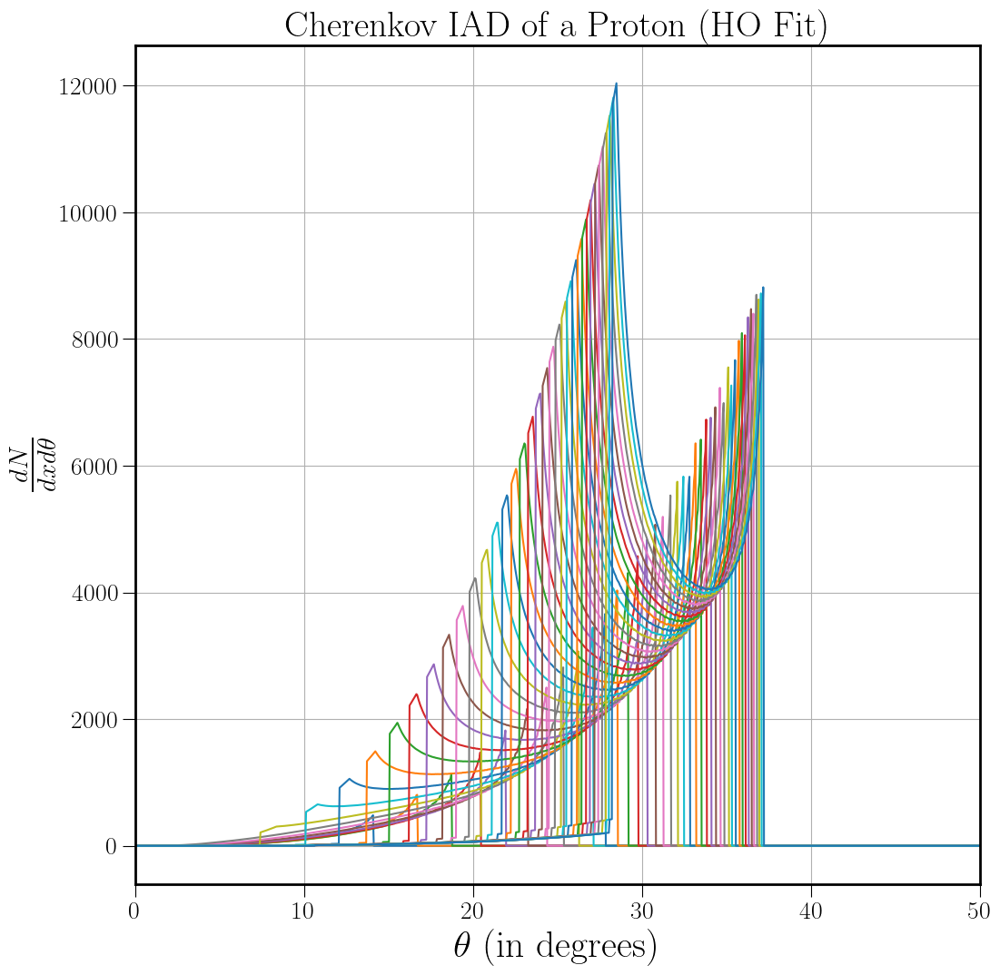

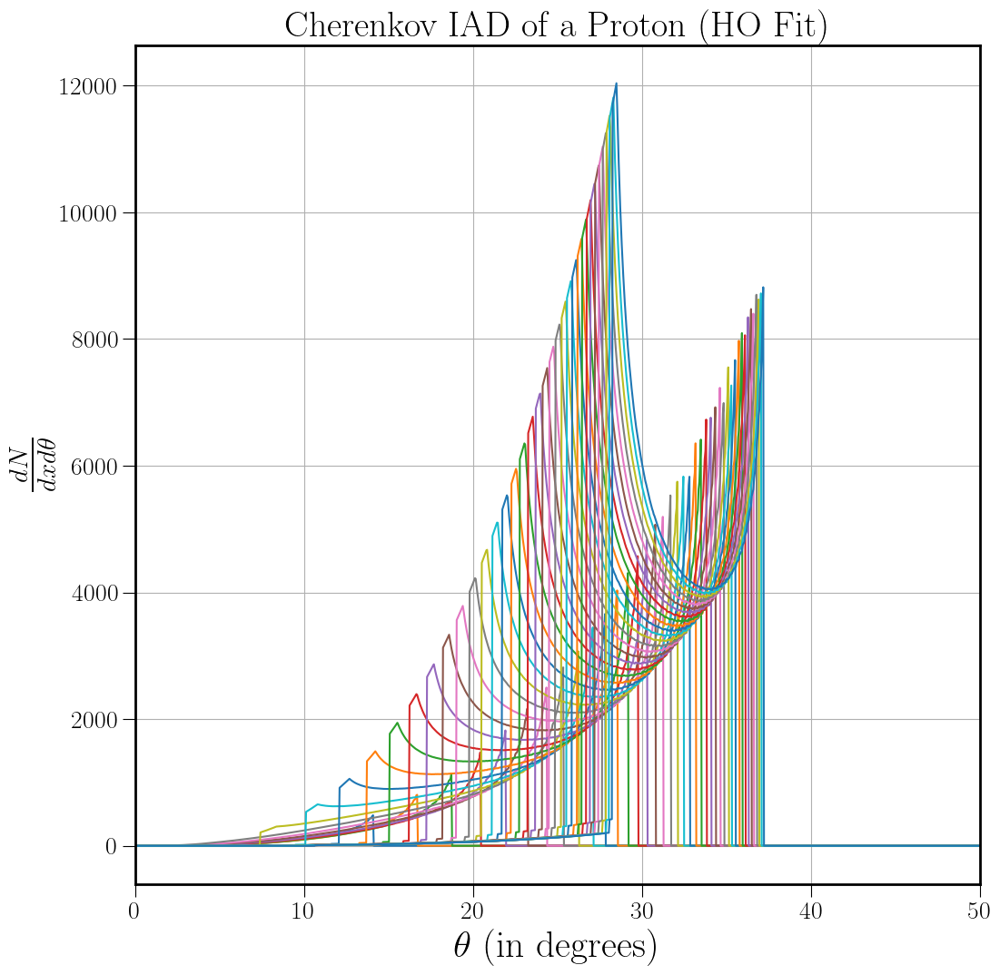

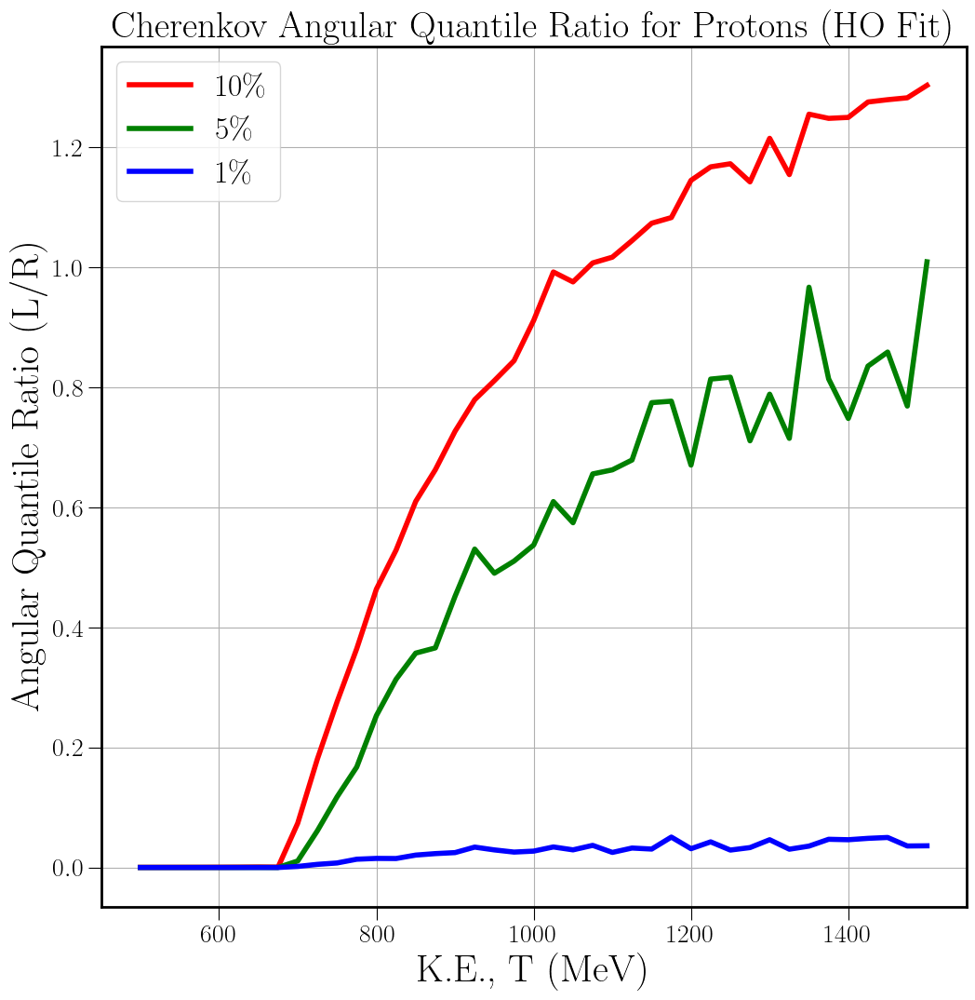

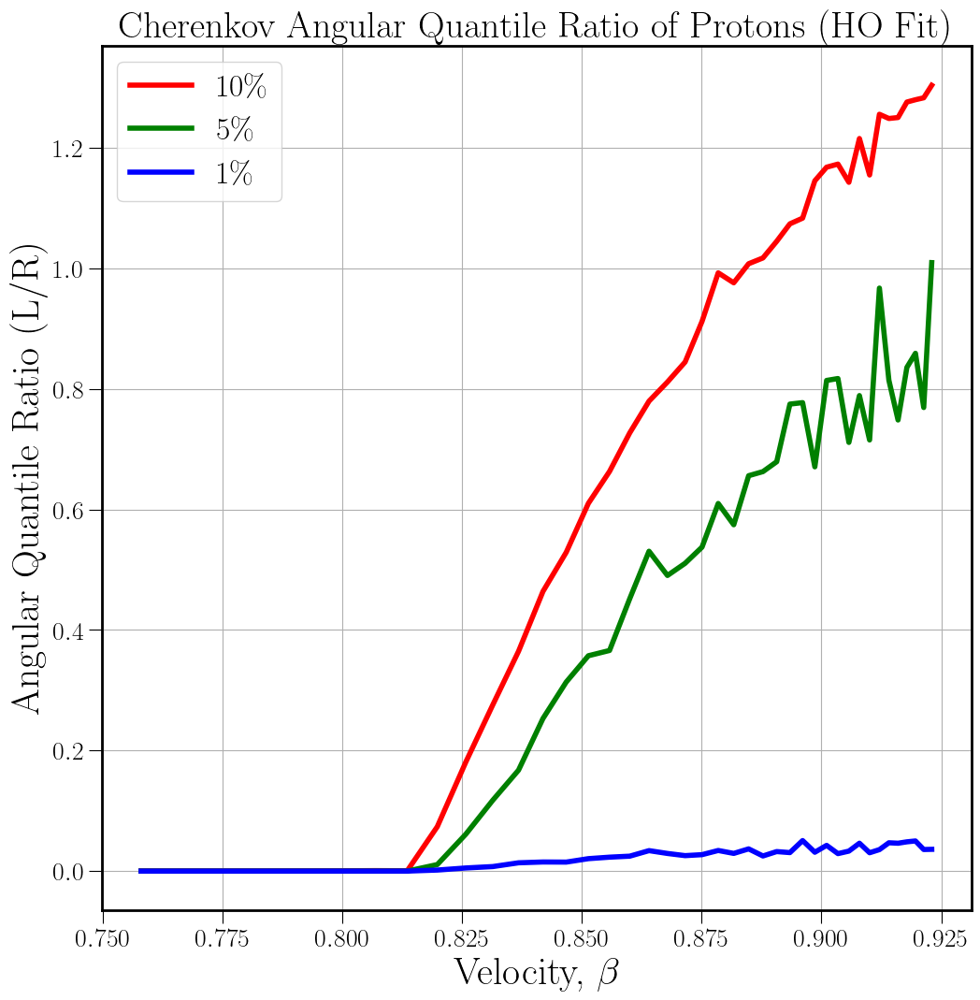

In [250]:
# Linear space in K.E.
tp = np.linspace(500, 1500, 41)

mp = 938  #Proton's mass in MeV
betap  = np.sqrt(1 - (1/(1 + tp/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

print("Proton: {}, {}, {}".format(tp, betap, np.round(betap,4)))

# # #Linear space in K.E.
# tm = np.linspace(100, 1000, 37)
# # # print(t)

# # #Mass of the particle travelling
# # # mp = 938 #Proton's mass
# mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²

# betamu  = np.sqrt(1 - (1/(1 + tm/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

# print("Muon: {}, {}, {}".format( tm, betamu, np.round(betamu, 4)))

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'Velocity, $\beta$', size= 30)
ax.set_ylabel(r'Angular Quantile Ratio (L/R)', size= 30) #$\frac{N}{A}$
# ax.set_ylabel(r'Angular Quantile Ratio (R/L)', size= 30) #$\frac{N}{A}$
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Cherenkov Angular Quantile Ratio of Protons (HO Fit)')
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.plot(betap, nbyaphs10, linewidth=4, c='r', label='$10 \%$')
ax.plot(betap, nbyaphs05, linewidth=4, c='g', label='$5 \%$')
ax.plot(betap, nbyaphs01, linewidth=4, c='b', label='$1 \%$')

# ax.plot(t, abynphs10, linewidth=4, c='r', label='$10 \%$')
# ax.plot(t, abynphs05, linewidth=4, c='g', label='$5 \%$')
# ax.plot(t, abynphs01, linewidth=4, c='b', label='$1 \%$')

ax.grid()
ax.legend()
# plt.savefig('nbyas_10_5_1_perc_hofit_Cherenkov_IAD_Proton_allbetas_from_saved_data', bbox_inches='tight')
# plt.savefig('abyns_10_5_1_perc_hofit_Cherenkov_IAD_Proton_allbetas_from_saved_data', bbox_inches='tight')
plt.show()

In [251]:
# # N/A

# # t = np.array([500, 800, 1000]) #in MeV
# # nbya = np.array([8.752406801193435e-05, 0.463834814265887, 0.971096322725608])
# # abyns = 1/nbyas

# plt.plot(t, nbyas)
# plt.xlabel('K.E., T (MeV)')
# plt.ylabel('Normal/Anomalous')
# plt.title('N/A for Protons')

In [252]:
# # A/N

# # t = np.array([500, 800, 1000]) #in MeV
# # nbya = np.array([8.752406801193435e-05, 0.463834814265887, 0.971096322725608])
# # abyns = 1/nbyas

# plt.plot(t, abyns)
# plt.xlabel('K.E., T (MeV)')
# plt.ylabel('Anomalous/Normal')
# plt.title('A/N for Protons')

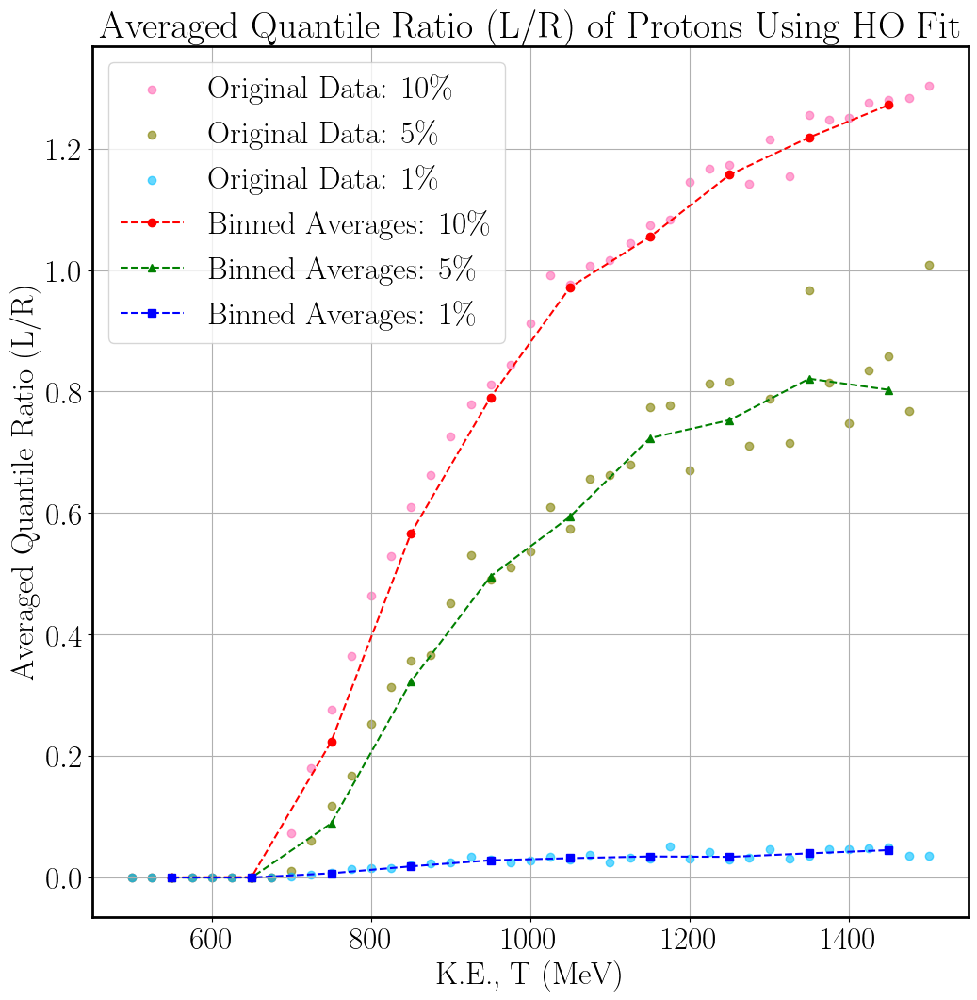

In [253]:
# Averaging elements within bins and then plotting these averages in Python can be achieved using libraries like NumPy and Matplotlib.
import numpy as np
import matplotlib.pyplot as plt

# 1. Generate or load your data
# For demonstration, let's create some sample data
np.random.seed(0) # for reproducibility
# x_data = np.random.rand(100) * 10 # x-values for binning
# y_data = 2 * x_data + np.random.randn(100) * 5 # y-values to be averaged

x_data = t # x-values for binning
y_data1h = np.array(nbyaphs10) # y-values to be averaged
y_data2h = np.array(nbyaphs05)
y_data3h = np.array(nbyaphs01)
 
# 2. Define the bins
num_bins = 10
# You can define custom bin edges or let NumPy determine them
bin_edges = np.linspace(min(x_data), max(x_data), num_bins + 1)

# 3. Bin the data and calculate the mean for each bin
# Use np.digitize to assign each x_data point to a bin index
bin_indices = np.digitize(x_data, bin_edges)

# Calculate the mean of y_data for each bin
bin_means1h = []
bin_centers1h = []

bin_means2h = []
bin_centers2h = []

bin_means3h = []
bin_centers3h = []

for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin1h = y_data1h[bin_indices == i]
    if len(elements_in_bin1h) > 0: # Avoid division by zero for empty bins
        bin_means1h.append(np.mean(elements_in_bin1h))
        # Calculate bin center for plotting
        bin_centers1h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means1h.append(np.nan)
        bin_centers1h.append((bin_edges[i-1] + bin_edges[i]) / 2)

for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin2h = y_data2h[bin_indices == i]
    if len(elements_in_bin2h) > 0: # Avoid division by zero for empty bins
        bin_means2h.append(np.mean(elements_in_bin2h))
        # Calculate bin center for plotting
        bin_centers2h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means2h.append(np.nan)
        bin_centers2h.append((bin_edges[i-1] + bin_edges[i]) / 2)

for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin3h = y_data3h[bin_indices == i]
    if len(elements_in_bin3h) > 0: # Avoid division by zero for empty bins
        bin_means3h.append(np.mean(elements_in_bin3h))
        # Calculate bin center for plotting
        bin_centers3h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means3h.append(np.nan)
        bin_centers3h.append((bin_edges[i-1] + bin_edges[i]) / 2)

# Remove NaN values if you don't want to plot empty bins
bin_centers1h = np.array(bin_centers1h)[~np.isnan(bin_means1h)]
bin_means1h = np.array(bin_means1h)[~np.isnan(bin_means1h)]

bin_centers2h = np.array(bin_centers2h)[~np.isnan(bin_means2h)]
bin_means2h = np.array(bin_means2h)[~np.isnan(bin_means2h)]

bin_centers3h = np.array(bin_centers3h)[~np.isnan(bin_means3h)]
bin_means3h = np.array(bin_means3h)[~np.isnan(bin_means3h)]

# 4. Plot the results
plt.figure(figsize=(12, 12))

plt.scatter(x_data, y_data1h, alpha=0.6, c='hotpink', label='Original Data: 10\%')
plt.scatter(x_data, y_data2h, alpha=0.6, c='olive', label='Original Data: 5\%')
plt.scatter(x_data, y_data3h, alpha=0.6, c='deepskyblue', label='Original Data: 1\%')

plt.plot(bin_centers1h, bin_means1h, color='red', marker='o', linestyle='--', label='Binned Averages: 10\%')
plt.plot(bin_centers2h, bin_means2h, color='green', marker='^', linestyle='--', label='Binned Averages: 5\%')
plt.plot(bin_centers3h, bin_means3h, color='blue', marker='s', linestyle='--', label='Binned Averages: 1\%')

plt.xlabel('K.E., T (MeV)') #(Binned Variable)
plt.ylabel('Averaged Quantile Ratio (L/R)') # (Averaged Variable)')
plt.title('Averaged Quantile Ratio (L/R) of Protons Using HO Fit') #in Bins of K.E. 
plt.legend()
plt.grid(True)

# plt.savefig('binned_avg_nbyas_10_5_1_perc_hofit_Cherenkov_IAD_Proton_allT_from_saved_data', bbox_inches='tight') #_zoom
plt.show()

[array([0.00017906, 0.00021103, 0.00025728, 0.00029206]), array([0.00039291, 0.00053258, 0.00076973, 0.00057301]), array([0.07373894, 0.18079979, 0.27589435, 0.36451797]), array([0.46383481, 0.52874446, 0.61000469, 0.66292404]), array([0.72683162, 0.77950278, 0.81127841, 0.8444388 ]), array([0.91170986, 0.99234133, 0.97580907, 1.00744926]), array([1.01703666, 1.04461778, 1.07360103, 1.08305733]), array([1.14502821, 1.16757475, 1.17270155, 1.14251376]), array([1.21514076, 1.1546277 , 1.25534421, 1.24836656]), array([1.24995476, 1.27564857, 1.27947746, 1.28265775])] [2.34856374e-04 5.67055381e-04 2.23737762e-01 5.66377000e-01
 7.90512902e-01 9.71827377e-01 1.05457820e+00 1.15695457e+00
 1.21836981e+00 1.27193464e+00]
[array([1.99933148e-05, 2.42440608e-05, 2.58851345e-05, 3.21668939e-05]), array([3.59529323e-05, 5.42382521e-05, 7.94567872e-05, 4.24243914e-06]), array([0.01082159, 0.0611795 , 0.11762542, 0.16739242]), array([0.25306187, 0.31357169, 0.35720772, 0.36593265]), array([0.45184

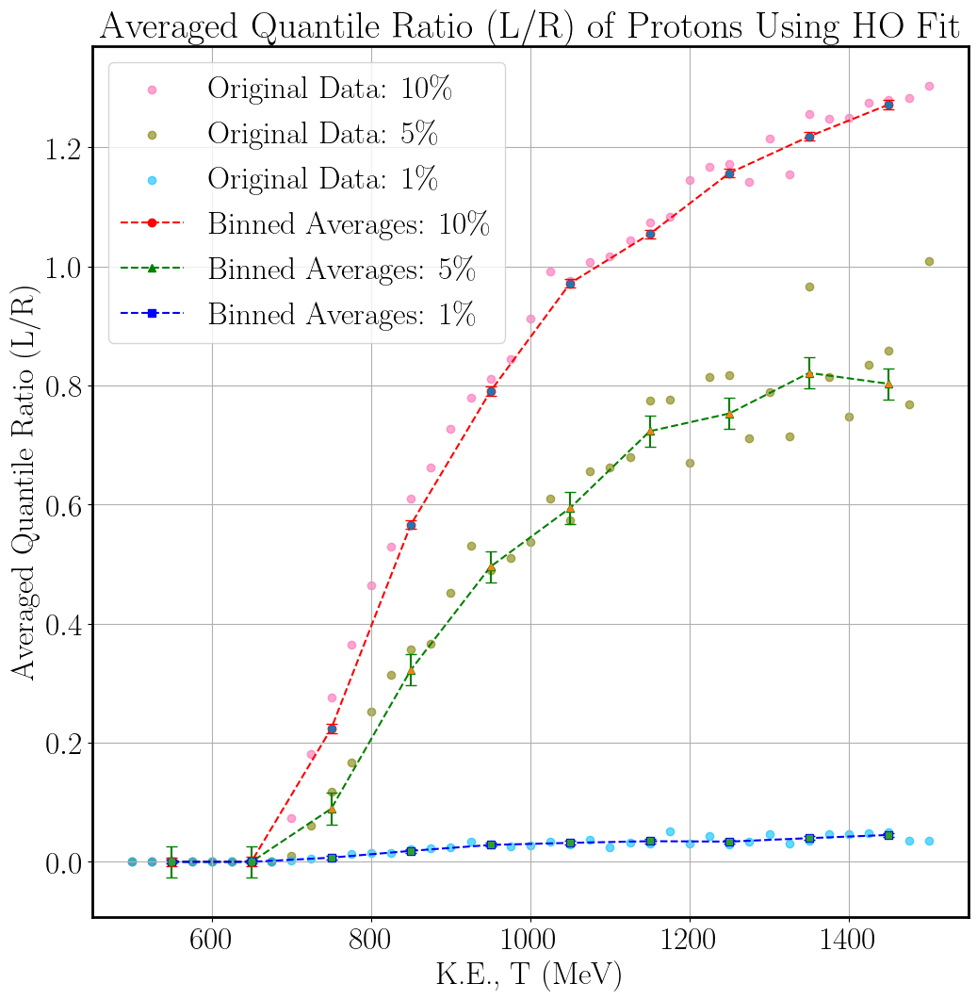

In [258]:
# Averaging elements within bins and then plotting these averages in Python can be achieved using libraries like NumPy and Matplotlib.
import numpy as np
import matplotlib.pyplot as plt

# 1. Generate or load your data
# For demonstration, let's create some sample data
np.random.seed(0) # for reproducibility
# x_data = np.random.rand(100) * 10 # x-values for binning
# y_data = 2 * x_data + np.random.randn(100) * 5 # y-values to be averaged

x_data = t # x-values for binning
y_data1h = np.array(nbyaphs10) # y-values to be averaged
y_data2h = np.array(nbyaphs05)
y_data3h = np.array(nbyaphs01)
 
# 2. Define the bins
num_bins = 10
# You can define custom bin edges or let NumPy determine them
bin_edges = np.linspace(min(x_data), max(x_data), num_bins + 1)

# 3. Bin the data and calculate the mean for each bin
# Use np.digitize to assign each x_data point to a bin index
bin_indices = np.digitize(x_data, bin_edges)

# Calculate the mean of y_data for each bin
bin_means1h = []
bin_centers1h = []

bin_means2h = []
bin_centers2h = []

bin_means3h = []
bin_centers3h = []


elements_in_bins_10h = []
elements_in_bins_05h = []
elements_in_bins_01h = []

bin_means_10h = []
bin_means_05h = []
bin_means_01h = []


#10% Q.ratio
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin1h = y_data1h[bin_indices == i]
    if len(elements_in_bin1h) > 0: # Avoid division by zero for empty bins
        bin_means1h.append(np.mean(elements_in_bin1h))
        # Calculate bin center for plotting
        bin_centers1h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means1h.append(np.nan)
        bin_centers1h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    elements_in_bins_10h.append(elements_in_bin1h)
    # bin_means_10.append(np.array(bin_means1[-1])) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_10, bin_means_10) 


#5% Q.ratio    
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin2h = y_data2h[bin_indices == i]
    if len(elements_in_bin2h) > 0: # Avoid division by zero for empty bins
        bin_means2h.append(np.mean(elements_in_bin2h))
        # Calculate bin center for plotting
        bin_centers2h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means2h.append(np.nan)
        bin_centers2h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    elements_in_bins_05h.append(elements_in_bin2h)
    # bin_means_05.append(bin_means2[-1]) ##bin_means1[-1]: value of the last element of an array/list      
# print(elements_in_bins_05, bin_means_05)


#1% Q.ratio
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin3h = y_data3h[bin_indices == i]
    if len(elements_in_bin3h) > 0: # Avoid division by zero for empty bins
        bin_means3h.append(np.mean(elements_in_bin3h))
        # Calculate bin center for plotting
        bin_centers3h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means3h.append(np.nan)
        bin_centers3h.append((bin_edges[i-1] + bin_edges[i]) / 2)

    elements_in_bins_01h.append(elements_in_bin3h)
    # bin_means_01.append(bin_means3[-1]) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_01, bin_means_01)    


# Remove NaN values if you don't want to plot empty bins
bin_centers1h = np.array(bin_centers1h)[~np.isnan(bin_means1h)]
bin_means1h = np.array(bin_means1h)[~np.isnan(bin_means1h)]

bin_centers2h = np.array(bin_centers2h)[~np.isnan(bin_means2h)]
bin_means2h = np.array(bin_means2h)[~np.isnan(bin_means2h)]

bin_centers3h = np.array(bin_centers3h)[~np.isnan(bin_means3h)]
bin_means3h = np.array(bin_means3h)[~np.isnan(bin_means3h)]


# print(bin_means1h, bin_means2h, bin_means3h)

print(elements_in_bins_10h, bin_means1h)
print(elements_in_bins_05h, bin_means2h)
print(elements_in_bins_01h, bin_means3h)

#Jackknife resampling with my data 

def jackknife_statistic(data, statistic):
    n = len(data)
    jackknife_samples = np.zeros(n)

    for i in range(n):
        sample = np.delete(data, i)
        jackknife_samples[i] = statistic(sample)

    jackknife_mean = np.mean(jackknife_samples)
    variance = (n - 1) / n * np.sum((jackknife_samples - jackknife_mean)**2)
    bias = (n - 1) * (jackknife_mean - statistic(data))
    
    return jackknife_mean, variance, bias

# Example
# data = np.array([2, 4, 6, 8, 10])
#Real Data
data10h = elements_in_bins_10h
data05h = elements_in_bins_05h
data01h = elements_in_bins_01h
# print("data10 = {}, data05 = {}, data01 = {}".format(data10, data05, data01))
stat = np.mean

# # mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
# mean_jack10, var_jack10, bias_jack10 = jackknife_statistic(data10, stat)
# mean_jack05, var_jack05, bias_jack05 = jackknife_statistic(data05, stat)
# mean_jack01, var_jack01, bias_jack01 = jackknife_statistic(data01, stat)


for i in data10h: 
# mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
    mean_jack10h, var_jack10h, bias_jack10h = jackknife_statistic(i, stat)
    # mean_jack05, var_jack05, bias_jack05 = jackknife_statistic(data05, stat)
    # mean_jack01, var_jack01, bias_jack01 = jackknife_statistic(data01, stat)
    print("Jackknife 10 %: mean={}, var={}, bias={}".format(mean_jack10h, var_jack10h, bias_jack10h))

for j in data05h: 
# mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
    # mean_jack10, var_jack10, bias_jack10 = jackknife_statistic(i, stat)
    mean_jack05h, var_jack05h, bias_jack05h = jackknife_statistic(j, stat)
    # mean_jack01, var_jack01, bias_jack01 = jackknife_statistic(data01, stat)
    print("Jackknife 5 %: mean={}, var={}, bias={}".format(mean_jack05h, var_jack05h, bias_jack05h))


for k in data01h: 
# mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
    # mean_jack10, var_jack10, bias_jack10 = jackknife_statistic(i, stat)
    # mean_jack05, var_jack05, bias_jack05 = jackknife_statistic(data05, stat)
    mean_jack01h, var_jack01h, bias_jack01h = jackknife_statistic(k, stat)
    print("Jackknife 1 %: mean={}, var={}, bias={}".format(mean_jack01h, var_jack01h, bias_jack01h))


    # print("Jackknife Means:", mean_jack10, mean_jack05, mean_jack01)
    # print("Jackknife Variances:", var_jack10, var_jack05, var_jack01)
    # print("Jackknife Biases:", bias_jack10, bias_jack05, bias_jack01)


# 4. Plot the results
plt.figure(figsize=(12, 12))

plt.scatter(x_data, y_data1h, alpha=0.6, c='hotpink', label='Original Data: 10\%')
plt.scatter(x_data, y_data2h, alpha=0.6, c='olive', label='Original Data: 5\%')
plt.scatter(x_data, y_data3h, alpha=0.6, c='deepskyblue', label='Original Data: 1\%')

plt.plot(bin_centers1h, bin_means1h, color='red', marker='o', linestyle='--', label='Binned Averages: 10\%')
plt.plot(bin_centers2h, bin_means2h, color='green', marker='^', linestyle='--', label='Binned Averages: 5\%')
plt.plot(bin_centers3h, bin_means3h, color='blue', marker='s', linestyle='--', label='Binned Averages: 1\%')

# plt.errorbar(x_values, y_estimates, yerr=jackknife_errors, fmt='o', capsize=4, ecolor='red', markersize=5)  #Jackknife errorbar
plt.errorbar(bin_centers1h, bin_means1h, yerr=np.sqrt(var_jack10h), fmt='o', capsize=4, ecolor='red', markersize=5)  #Jackknife errorbar for 10% Q.ratio
plt.errorbar(bin_centers2h, bin_means2h, yerr=np.sqrt(var_jack05h), fmt='^', capsize=4, ecolor='green', markersize=5)  #Jackknife errorbar for 10% Q.ratio
plt.errorbar(bin_centers3h, bin_means3h, yerr=np.sqrt(var_jack01h), fmt='s', capsize=4, ecolor='blue', markersize=5)  #Jackknife errorbar for 10% Q.ratio

plt.xlabel('K.E., T (MeV)') #(Binned Variable)
plt.ylabel('Averaged Quantile Ratio (L/R)') # (Averaged Variable)')
plt.title('Averaged Quantile Ratio (L/R) of Protons Using HO Fit') #in Bins of K.E. 
plt.legend()
plt.grid(True)

# plt.savefig('binned_avg_nbyas_10_5_1_perc_hofit_Cherenkov_IAD_Proton_allT_from_saved_data_w_jackknife_err', bbox_inches='tight') #_zoom
plt.show()

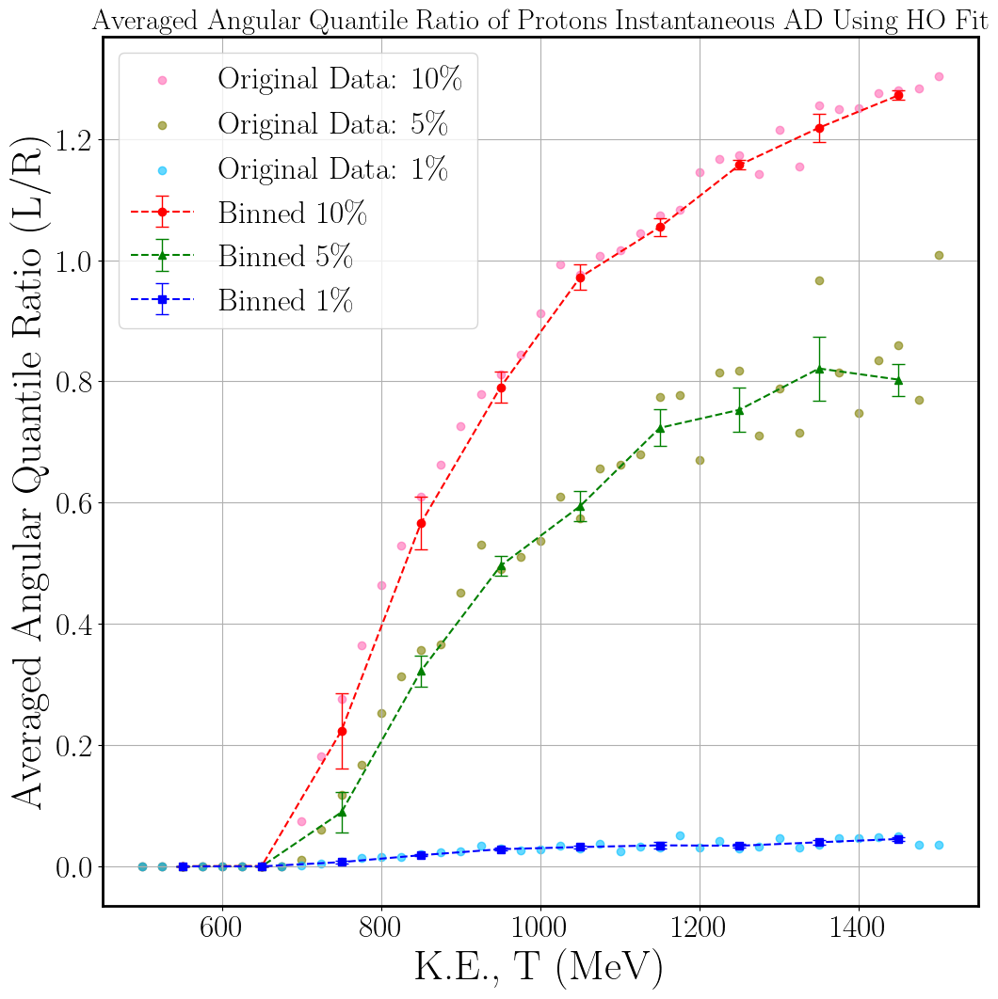

In [59]:
# Averaging elements within bins and then plotting these averages in Python can be achieved using libraries like NumPy and Matplotlib.
import numpy as np
import matplotlib.pyplot as plt

# 1. Generate or load your data
# For demonstration, let's create some sample data
np.random.seed(0) # for reproducibility
# x_data = np.random.rand(100) * 10 # x-values for binning
# y_data = 2 * x_data + np.random.randn(100) * 5 # y-values to be averaged

x_data = t # x-values for binning
y_data1h = np.array(nbyaphs10) # y-values to be averaged
y_data2h = np.array(nbyaphs05)
y_data3h = np.array(nbyaphs01)
 
# 2. Define the bins
num_bins = 10
# You can define custom bin edges or let NumPy determine them
bin_edges = np.linspace(min(x_data), max(x_data), num_bins + 1)

# 3. Bin the data and calculate the mean for each bin
# Use np.digitize to assign each x_data point to a bin index
bin_indices = np.digitize(x_data, bin_edges)

# Calculate the mean of y_data for each bin
bin_means1h = []
bin_centers1h = []

bin_means2h = []
bin_centers2h = []

bin_means3h = []
bin_centers3h = []


elements_in_bins_10h = []
elements_in_bins_05h = []
elements_in_bins_01h = []

bin_means_10h = []
bin_means_05h = []
bin_means_01h = []


#10% Q.ratio
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin1h = y_data1h[bin_indices == i]
    if len(elements_in_bin1h) > 0: # Avoid division by zero for empty bins
        bin_means1h.append(np.mean(elements_in_bin1h))
        # Calculate bin center for plotting
        bin_centers1h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means1h.append(np.nan)
        bin_centers1h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    elements_in_bins_10h.append(elements_in_bin1h)
    # bin_means_10.append(np.array(bin_means1[-1])) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_10, bin_means_10) 


#5% Q.ratio    
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin2h = y_data2h[bin_indices == i]
    if len(elements_in_bin2h) > 0: # Avoid division by zero for empty bins
        bin_means2h.append(np.mean(elements_in_bin2h))
        # Calculate bin center for plotting
        bin_centers2h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means2h.append(np.nan)
        bin_centers2h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    elements_in_bins_05h.append(elements_in_bin2h)
    # bin_means_05.append(bin_means2[-1]) ##bin_means1[-1]: value of the last element of an array/list      
# print(elements_in_bins_05, bin_means_05)


#1% Q.ratio
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin3h = y_data3h[bin_indices == i]
    if len(elements_in_bin3h) > 0: # Avoid division by zero for empty bins
        bin_means3h.append(np.mean(elements_in_bin3h))
        # Calculate bin center for plotting
        bin_centers3h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means3h.append(np.nan)
        bin_centers3h.append((bin_edges[i-1] + bin_edges[i]) / 2)

    elements_in_bins_01h.append(elements_in_bin3h)
    # bin_means_01.append(bin_means3[-1]) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_01, bin_means_01)    


# Remove NaN values if you don't want to plot empty bins
bin_centers1h = np.array(bin_centers1h)[~np.isnan(bin_means1h)]
bin_means1h = np.array(bin_means1h)[~np.isnan(bin_means1h)]

bin_centers2h = np.array(bin_centers2h)[~np.isnan(bin_means2h)]
bin_means2h = np.array(bin_means2h)[~np.isnan(bin_means2h)]

bin_centers3h = np.array(bin_centers3h)[~np.isnan(bin_means3h)]
bin_means3h = np.array(bin_means3h)[~np.isnan(bin_means3h)]


# print(bin_means1h, bin_means2h, bin_means3h)

# print(elements_in_bins_10h, bin_means1h)
# print(elements_in_bins_05h, bin_means2h)
# print(elements_in_bins_01h, bin_means3h)

#Jackknife resampling with my data 

def jackknife_statistic(data, statistic):
    n = len(data)
    jackknife_samples = np.zeros(n)

    for i in range(n):
        sample = np.delete(data, i)
        jackknife_samples[i] = statistic(sample)

    jackknife_mean = np.mean(jackknife_samples)
    variance = (n - 1) / n * np.sum((jackknife_samples - jackknife_mean)**2)
    bias = (n - 1) * (jackknife_mean - statistic(data))
    
    return jackknife_mean, variance, bias

# Example
# data = np.array([2, 4, 6, 8, 10])
#Real Data
data10h = elements_in_bins_10h
data05h = elements_in_bins_05h
data01h = elements_in_bins_01h
# print("data10 = {}, data05 = {}, data01 = {}".format(data10, data05, data01))
stat = np.mean


# Initialize empty lists to store results for each bin
means_10h, errs_10h = [], []
means_05h, errs_05h = [], []
means_01h, errs_01h = [], []

# Loop for 10% data
for bin_data in elements_in_bins_10h:
    if len(bin_data) > 1: # Jackknife requires at least 2 points
        m, v, b = jackknife_statistic(bin_data, np.mean)
        means_10h.append(m)
        errs_10h.append(np.sqrt(v)) # Error bar is square root of variance
    else:
        means_10h.append(np.nan)
        errs_10h.append(np.nan)

# Loop for 5% data
for bin_data in elements_in_bins_05h:
    if len(bin_data) > 1:
        m, v, b = jackknife_statistic(bin_data, np.mean)
        means_05h.append(m)
        errs_05h.append(np.sqrt(v))
    else:
        means_05h.append(np.nan)
        errs_05h.append(np.nan)

# Loop for 1% data
for bin_data in elements_in_bins_01h:
    if len(bin_data) > 1:
        m, v, b = jackknife_statistic(bin_data, np.mean)
        means_01h.append(m)
        errs_01h.append(np.sqrt(v))
    else:
        means_01h.append(np.nan)
        errs_01h.append(np.nan)

#Plotting

plt.figure(figsize=(12, 12))

plt.scatter(x_data, y_data1h, alpha=0.6, c='hotpink', label='Original Data: 10\%')
plt.scatter(x_data, y_data2h, alpha=0.6, c='olive', label='Original Data: 5\%')
plt.scatter(x_data, y_data3h, alpha=0.6, c='deepskyblue', label='Original Data: 1\%')


# Define labels and colors for cleaner code
datasets = [
    (bin_centers1h, means_10h, errs_10h, 'red', 'o', '10\%'),
    (bin_centers2h, means_05h, errs_05h, 'green', '^', '5\%'),
    (bin_centers3h, means_01h, errs_01h, 'blue', 's', '1\%')
]

for x, y, yerr, color, marker, label in datasets:
    # Convert to numpy arrays to handle indexing/NaNs
    x, y, yerr = np.array(x), np.array(y), np.array(yerr)
    mask = ~np.isnan(y)
    
    plt.errorbar(x[mask], y[mask], yerr=yerr[mask], 
                 fmt=marker, color=color, linestyle='--', 
                 capsize=5, elinewidth=1, label=f'Binned {label}')

plt.xlabel('K.E., T (MeV)', size=32)
plt.ylabel('Averaged Angular Quantile Ratio (L/R)', size=32)
plt.title('Averaged Angular Quantile Ratio of Protons Instantaneous AD Using HO Fit', size=22) #in Bins of K.E. 
plt.legend()
plt.grid(True)

# plt.savefig('binned_avg_nbyas_10_5_1_perc_hofit_Cherenkov_IAD_Proton_allT_from_saved_data_w_jackknife_err_corrected', bbox_inches='tight') #_zoom
plt.show()

[0.75796532 0.76741698 0.77628968 0.78463315 0.79249149 0.79990401
 0.80690583 0.81352846 0.81980026 0.82574686 0.83139144 0.83675507
 0.8418569  0.84671442 0.8513436  0.85575908 0.85997431 0.86400164
 0.86785245 0.87153724 0.87506571 0.87844687 0.88168902 0.88479989
 0.88778668 0.89065607 0.89341428 0.89606712 0.89862002 0.90107804
 0.90344595 0.90572818 0.9079289  0.91005203 0.91210124 0.91407999
 0.91599153 0.91783893 0.91962507 0.92135268 0.92302433]
[2, 2, 3, 2, 3, 4, 4, 5, 7, 8]


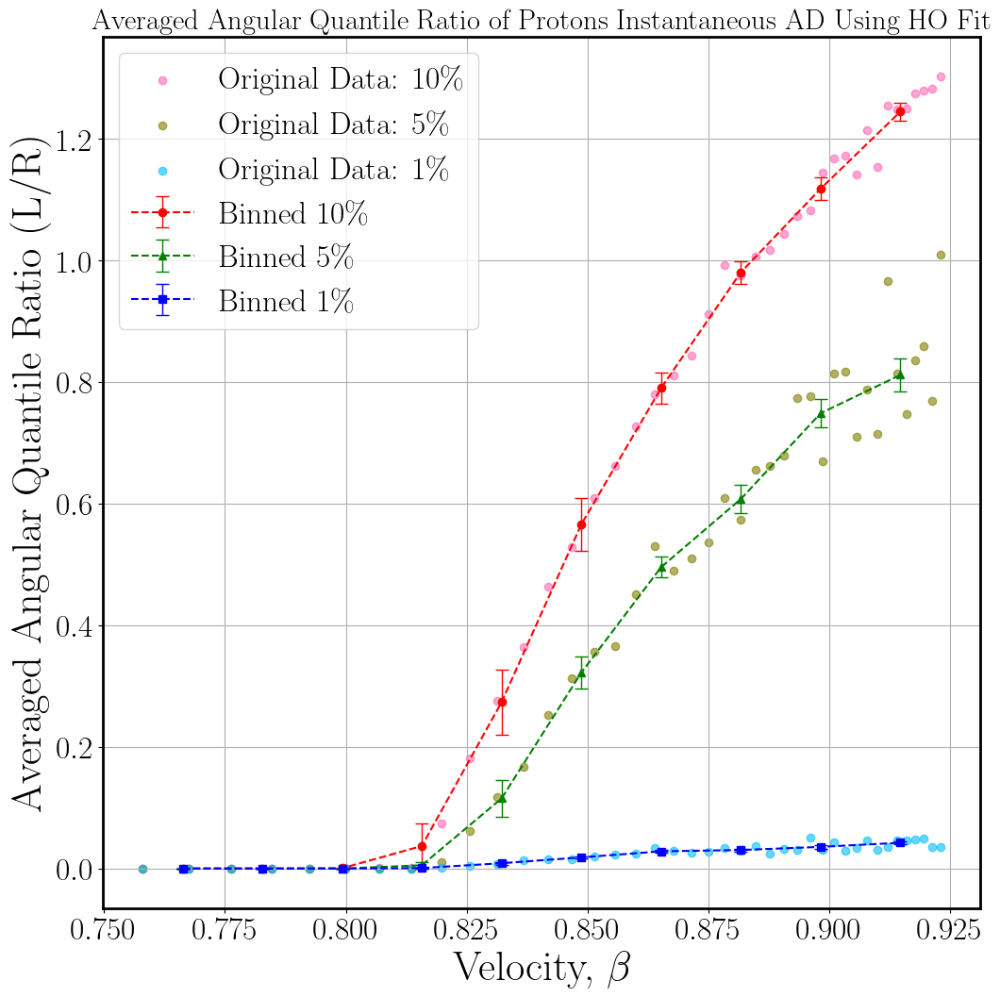

In [216]:
# Averaging elements within bins and then plotting these averages in Python can be achieved using libraries like NumPy and Matplotlib.
import numpy as np
import matplotlib.pyplot as plt

# 1. Generate or load your data
# For demonstration, let's create some sample data
np.random.seed(0) # for reproducibility
# x_data = np.random.rand(100) * 10 # x-values for binning
# y_data = 2 * x_data + np.random.randn(100) * 5 # y-values to be averaged


#Linear space in K.E.
tp = np.linspace(500, 1500, 41)
tm = np.linspace(100, 1000, 37)
# print(t)

#Mass of the particle travelling
mp = 938 #Proton's mass
mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²

betap  = np.sqrt(1 - (1/(1 + tp/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD
betamu  = np.sqrt(1 - (1/(1 + tm/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

# print (tp, betap, np.round(betap, 4))
# print (tm, betamu, np.round(betamu, 4))



# x_data = tp # x-values for binning
x_data = betap # x-values for binning
print(x_data)

y_data1h = np.array(nbyaphs10) # y-values to be averaged
y_data2h = np.array(nbyaphs05)
y_data3h = np.array(nbyaphs01)
 
# 2. Define the bins
num_bins = 10
# You can define custom bin edges or let NumPy determine them
bin_edges = np.linspace(min(x_data), max(x_data), num_bins + 1)

# 3. Bin the data and calculate the mean for each bin
# Use np.digitize to assign each x_data point to a bin index
bin_indices = np.digitize(x_data, bin_edges)

# Calculate the mean of y_data for each bin
bin_means1hp = []
bin_centers1hp = []

bin_means2hp = []
bin_centers2hp = []

bin_means3hp = []
bin_centers3hp = []


elements_in_bins_10h = []
elements_in_bins_05h = []
elements_in_bins_01h = []

bin_means_10h = []
bin_means_05h = []
bin_means_01h = []


#10% Q.ratio
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin1h = y_data1h[bin_indices == i]
    if len(elements_in_bin1h) > 0: # Avoid division by zero for empty bins
        bin_means1hp.append(np.mean(elements_in_bin1h))
        # Calculate bin center for plotting
        bin_centers1hp.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means1hp.append(np.nan)
        bin_centers1hp.append((bin_edges[i-1] + bin_edges[i]) / 2)
    elements_in_bins_10h.append(elements_in_bin1h)
    # bin_means_10.append(np.array(bin_means1[-1])) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_10, bin_means_10) 


#5% Q.ratio    
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin2h = y_data2h[bin_indices == i]
    if len(elements_in_bin2h) > 0: # Avoid division by zero for empty bins
        bin_means2hp.append(np.mean(elements_in_bin2h))
        # Calculate bin center for plotting
        bin_centers2hp.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means2hp.append(np.nan)
        bin_centers2hp.append((bin_edges[i-1] + bin_edges[i]) / 2)
    elements_in_bins_05h.append(elements_in_bin2h)
    # bin_means_05.append(bin_means2[-1]) ##bin_means1[-1]: value of the last element of an array/list      
# print(elements_in_bins_05, bin_means_05)


#1% Q.ratio
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin3h = y_data3h[bin_indices == i]
    if len(elements_in_bin3h) > 0: # Avoid division by zero for empty bins
        bin_means3hp.append(np.mean(elements_in_bin3h))
        # Calculate bin center for plotting
        bin_centers3hp.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means3hp.append(np.nan)
        bin_centers3hp.append((bin_edges[i-1] + bin_edges[i]) / 2)

    elements_in_bins_01h.append(elements_in_bin3h)
    # bin_means_01.append(bin_means3[-1]) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_01, bin_means_01)    


# # Remove NaN values if you don't want to plot empty bins
# bin_centers1h = np.array(bin_centers1h)[~np.isnan(bin_means1h)]
# bin_means1h = np.array(bin_means1h)[~np.isnan(bin_means1h)]

# bin_centers2h = np.array(bin_centers2h)[~np.isnan(bin_means2h)]
# bin_means2h = np.array(bin_means2h)[~np.isnan(bin_means2h)]

# bin_centers3h = np.array(bin_centers3h)[~np.isnan(bin_means3h)]
# bin_means3h = np.array(bin_means3h)[~np.isnan(bin_means3h)]


# print(bin_means1h, bin_means2h, bin_means3h)

# print(elements_in_bins_10h, bin_means1h)
# print(elements_in_bins_05h, bin_means2h)
# print(elements_in_bins_01h, bin_means3h)

#Jackknife resampling with my data 

def jackknife_statistic(data, statistic):
    n = len(data)
    jackknife_samples = np.zeros(n)

    for i in range(n):
        sample = np.delete(data, i)
        jackknife_samples[i] = statistic(sample)

    jackknife_mean = np.mean(jackknife_samples)
    variance = (n - 1) / n * np.sum((jackknife_samples - jackknife_mean)**2)
    bias = (n - 1) * (jackknife_mean - statistic(data))
    
    return jackknife_mean, variance, bias

# Example
# data = np.array([2, 4, 6, 8, 10])
#Real Data
data10h = elements_in_bins_10h
data05h = elements_in_bins_05h
data01h = elements_in_bins_01h
# print("data10 = {}, data05 = {}, data01 = {}".format(data10, data05, data01))
stat = np.mean


# Initialize empty lists to store results for each bin
means_10hp, errs_10hp = [], []
means_05hp, errs_05hp = [], []
means_01hp, errs_01hp = [], []

# Loop for 10% data
for bin_data in elements_in_bins_10h:
    if len(bin_data) > 1: # Jackknife requires at least 2 points
        m, v, b = jackknife_statistic(bin_data, np.mean)
        means_10hp.append(m)
        errs_10hp.append(np.sqrt(v)) # Error bar is square root of variance
    else:
        means_10hp.append(np.nan)
        errs_10hp.append(np.nan)

# Loop for 5% data
for bin_data in elements_in_bins_05h:
    if len(bin_data) > 1:
        m, v, b = jackknife_statistic(bin_data, np.mean)
        means_05hp.append(m)
        errs_05hp.append(np.sqrt(v))
    else:
        means_05hp.append(np.nan)
        errs_05hp.append(np.nan)

# Loop for 1% data
for bin_data in elements_in_bins_01h:
    if len(bin_data) > 1:
        m, v, b = jackknife_statistic(bin_data, np.mean)
        means_01hp.append(m)
        errs_01hp.append(np.sqrt(v))
    else:
        means_01hp.append(np.nan)
        errs_01hp.append(np.nan)

#Plotting

plt.figure(figsize=(12, 12))

plt.scatter(x_data, y_data1h, alpha=0.6, c='hotpink', label='Original Data: 10\%')
plt.scatter(x_data, y_data2h, alpha=0.6, c='olive', label='Original Data: 5\%')
plt.scatter(x_data, y_data3h, alpha=0.6, c='deepskyblue', label='Original Data: 1\%')


print([len(b) for b in elements_in_bins_10h])

# --- INSTEAD, USE THIS CLEANER PLOTTING LOOP ---
datasets = [
    (bin_centers1hp, means_10hp, errs_10hp, 'red', 'o', '10\%'),
    (bin_centers2hp, means_05hp, errs_05hp, 'green', '^', '5\%'),
    (bin_centers3hp, means_01hp, errs_01hp, 'blue', 's', '1\%')
]

for x_raw, y_raw, yerr_raw, color, marker, label in datasets:
    x = np.array(x_raw)
    y = np.array(y_raw)
    yerr = np.array(yerr_raw)
    
    # This mask will now correctly filter all three arrays at once
    mask = ~np.isnan(y)
    
    plt.errorbar(x[mask], y[mask], yerr=yerr[mask], 
                 fmt=marker, color=color, linestyle='--', 
                 capsize=5, elinewidth=1, label=f'Binned {label}')


plt.xlabel(r'Velocity, $\beta$', size=32)
# plt.xlabel('K.E., T (MeV)', size=32)
plt.ylabel('Averaged Angular Quantile Ratio (L/R)', size=32)
plt.title('Averaged Angular Quantile Ratio of Protons Instantaneous AD Using HO Fit', size=22) #in Bins of K.E. 
plt.legend()
plt.grid(True)

# plt.savefig('binned_avg_nbyas_10_5_1_perc_hofit_Cherenkov_IAD_Proton_allbeta_from_saved_data_w_jackknife_err_corrected', bbox_inches='tight') #_zoom
plt.show()

[0.75796532 0.76741698 0.77628968 0.78463315 0.79249149 0.79990401
 0.80690583 0.81352846 0.81980026 0.82574686 0.83139144 0.83675507
 0.8418569  0.84671442 0.8513436  0.85575908 0.85997431 0.86400164
 0.86785245 0.87153724 0.87506571 0.87844687 0.88168902 0.88479989
 0.88778668 0.89065607 0.89341428 0.89606712 0.89862002 0.90107804
 0.90344595 0.90572818 0.9079289  0.91005203 0.91210124 0.91407999
 0.91599153 0.91783893 0.91962507 0.92135268 0.92302433]
[4, 4, 4, 4, 4, 4, 4, 4, 4, 4]


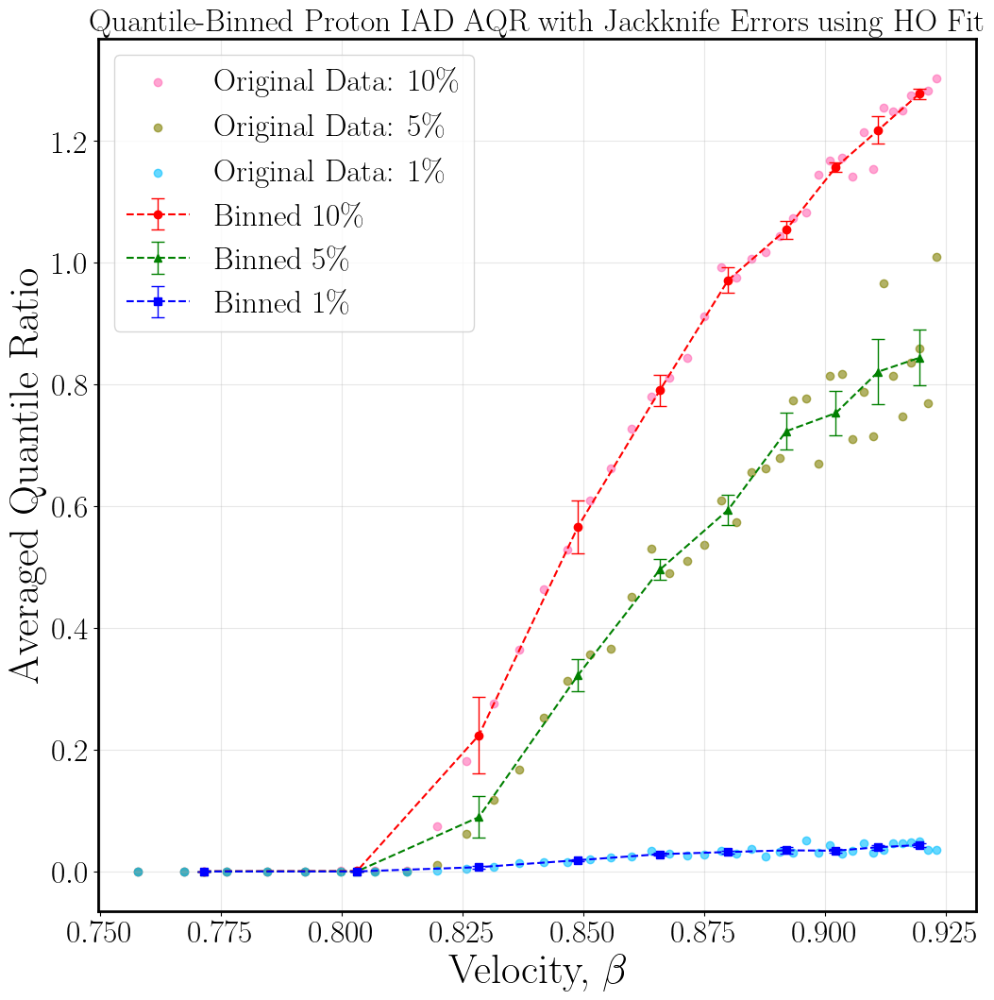

In [264]:
# 0. Definition 

# #Linear space in K.E.
# tp = np.linspace(500, 1500, 41)
# tm = np.linspace(100, 1000, 37)
# # print(t)

# #Mass of the particle travelling
# mp = 938 #Proton's mass
# mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²

# betap  = np.sqrt(1 - (1/(1 + tp/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD
# betamu  = np.sqrt(1 - (1/(1 + tm/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

# # print (tp, betap, np.round(betap, 4))
# # print (tm, betamu, np.round(betamu, 4))


# 1. Define x_data (Velocity) & y_data (AQR)
x_data = betap 
print(x_data)

y_data1hp = np.array(nbyaphs10) # y-values to be averaged
y_data2hp = np.array(nbyaphs05)
y_data3hp = np.array(nbyaphs01)

# 2. CREATE QUANTILE BINS
num_bins = 10
# This creates edges so that ~10% of the data points fall into each bin
bin_edges = np.quantile(x_data, np.linspace(0, 1, num_bins + 1))

# 3. DIGITIZE & CALCULATE CENTERS
bin_indices = np.digitize(x_data, bin_edges)
# Handle the edge case where a point equals the max value
bin_indices[bin_indices > num_bins] = num_bins

# We calculate the average x-position (beta) within each bin for more accuracy
bin_centershp = []
for i in range(1, num_bins + 1):
    points_in_bin = x_data[bin_indices == i]
    if len(points_in_bin) > 0:
        bin_centershp.append(np.mean(points_in_bin))
    else:
        # Fallback to geometric center if bin is somehow empty
        bin_centershp.append((bin_edges[i-1] + bin_edges[i]) / 2)

bin_centershp = np.array(bin_centershp)

# 4. PLOTTING LOOP (Now with equal data counts per bin)
plt.figure(figsize=(12, 12))

plt.scatter(x_data, y_data1hp, alpha=0.6, c='hotpink', label='Original Data: 10\%')
plt.scatter(x_data, y_data2hp, alpha=0.6, c='olive', label='Original Data: 5\%')
plt.scatter(x_data, y_data3hp, alpha=0.6, c='deepskyblue', label='Original Data: 1\%')

print([len(b) for b in elements_in_bins_10h])


datasets = [
    (y_data1hp, 'red', 'o', '10\%'),
    (y_data2hp, 'green', '^', '5\%'),
    (y_data3hp, 'blue', 's', '1\%')
]

for y_vals, color, marker, label in datasets:
    meanshp, errshp = [], []
    
    for i in range(1, num_bins + 1):
        bin_data = y_vals[bin_indices == i]
        
        if len(bin_data) > 1:
            m, v, b = jackknife_statistic(bin_data, np.mean)
            meanshp.append(m)
            errshp.append(np.sqrt(v))
        else:
            meanshp.append(np.nan)
            errshp.append(np.nan)
            
    # Convert to arrays for masking
    meanshp, errshp = np.array(meanshp), np.array(errshp)
    mask = ~np.isnan(meanshp)
    
    plt.errorbar(bin_centershp[mask], meanshp[mask], yerr=errshp[mask], 
                 fmt=marker, color=color, linestyle='--', 
                 capsize=5, elinewidth=1, label=f'Binned {label}')

plt.xlabel(r'Velocity, $\beta$', size=32)
plt.ylabel('Averaged Quantile Ratio', size=32)
plt.title('Quantile-Binned Proton IAD AQR with Jackknife Errors using HO Fit', size=24)
plt.legend()
plt.grid(True, alpha=0.3)

# plt.savefig('qualtile_binned_Proton_Cherenkov_iAD_AQR_10_5_1_perc_hofit_allbetas_w_jackknife_err_corrected', bbox_inches='tight') #_zoom
plt.show()


In [194]:
#Linear space in K.E.
t = np.linspace(500, 1500, 41)
# print(t)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'K.E., T (MeV)', size= 30)
ax.set_ylabel(r'Ratio of Normal to Anomalous Quantile (L/R)', size= 30)
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Cherenkov Quantile Ratio of Protons (HO vs Approx Fit)')
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.plot(t, nbyapps10, linewidth=4, c='r', label="Approx: 10\%", ls='dashdot')
ax.plot(t, nbyapps05, linewidth=4, c='g', label="Approx: 5\%", ls='dashdot')
ax.plot(t, nbyapps01, linewidth=4, c='b', label="Approx: 1\%", ls='dashdot')

ax.plot(t, nbyaphs10, linewidth=4, c='r', label="HO: 10\%")
ax.plot(t, nbyaphs05, linewidth=4, c='g', label="HO: 5\%")
ax.plot(t, nbyaphs01, linewidth=4, c='b', label="HO: 1\%")

# Add a vertical arrow
# x, y: starting point of the arrow
# dx, dy: length of the arrow along x and y directions
plt.arrow(x=1400, y=1.25, dx=0, dy=0.40, width=0.5, head_width=3.5, head_length=0.05, fc='r', ec='r')

ax.grid()
ax.legend()
# plt.savefig('nbyas_hofit_Cherenkov_IAD_Proton_allT_from_saved_data', bbox_inches='tight')
# plt.savefig('nbyas_ho_vs_approxfit_Cherenkov_IAD_Proton_allTs_10_5_1_perc_from_saved_data_mplot4_arrow', bbox_inches='tight')
# plt.savefig('nbyas_ho_vs_approxfit_Cherenkov_IAD_Proton_allTs_10_perc_from_saved_data', bbox_inches='tight')


In [196]:
#Linear space in K.E.
t = np.linspace(500, 1500, 41)
# print(t)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'K.E., T (MeV)', size= 30)
ax.set_ylabel(r'Averaged Angular Quantile Ratio (L/R)', size= 30)
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Averaged Angular Quantile Ratio (L/R) of Protons (HO vs Approx Fit)', fontsize=23)
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)

# ax.plot(t, nbyapps10, linewidth=4, c='r', label="Approx: 10\%", ls='dashdot')
# ax.plot(t, nbyapps05, linewidth=4, c='g', label="Approx: 5\%", ls='dashdot')
# ax.plot(t, nbyapps01, linewidth=4, c='b', label="Approx: 1\%", ls='dashdot')

# ax.plot(t, nbyaphs10, linewidth=4, c='r', label="HO: 10\%")
# ax.plot(t, nbyaphs05, linewidth=4, c='g', label="HO: 5\%")
# ax.plot(t, nbyaphs01, linewidth=4, c='b', label="HO: 1\%")

plt.plot(bin_centers1, bin_means1, color='red', marker='o', linestyle='--', label='Approx 10\%')
plt.plot(bin_centers2, bin_means2, color='green', marker='^', linestyle='--', label='Approx 5\%')
plt.plot(bin_centers3, bin_means3, color='blue', marker='s', linestyle='--', label='Approx 1\%')

plt.plot(bin_centers1h, bin_means1h, color='red', marker='o', linestyle='solid', label='HO 10\%')
plt.plot(bin_centers2h, bin_means2h, color='green', marker='^', linestyle='solid', label='HO 5\%')
plt.plot(bin_centers3h, bin_means3h, color='blue', marker='s', linestyle='solid', label='HO 1\%')


# # Add a vertical arrow
# # x, y: starting point of the arrow
# # dx, dy: length of the arrow along x and y directions
# plt.arrow(x=1400, y=1.25, dx=0, dy=0.40, width=0.5, head_width=3.5, head_length=0.05, fc='r', ec='r')

ax.grid()
ax.legend()
# plt.savefig('binned_avg_nbyas_hofit_Cherenkov_IAD_Proton_allT_from_saved_data', bbox_inches='tight')
# plt.savefig('binned_avg_nbyas_ho_vs_approxfit_Cherenkov_IAD_Proton_allTs_10_5_1_perc_from_saved_data_mplot4b', bbox_inches='tight')
# plt.savefig('binned_avg_nbyas_ho_vs_approxfit_Cherenkov_IAD_Proton_allTs_10_perc_from_saved_data', bbox_inches='tight')


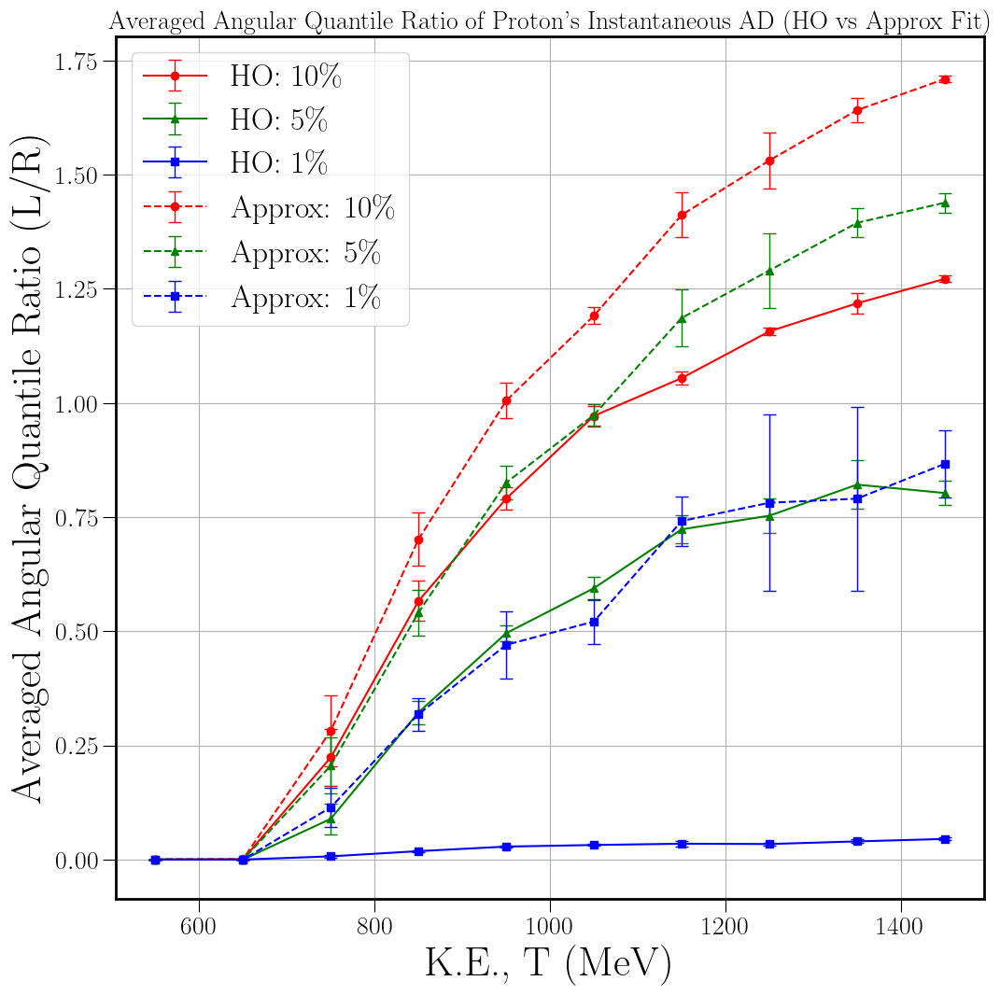

In [85]:
#Linear space in K.E.
t = np.linspace(500, 1500, 41)
# print(t)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'K.E., T (MeV)', size= 32)
ax.set_ylabel(r'Averaged Angular Quantile Ratio (L/R)', size= 32)
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Averaged Angular Quantile Ratio of Proton\'s Instantaneous AD (HO vs Approx Fit)', fontsize=20)
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)

# ax.plot(t, nbyapps10, linewidth=4, c='r', label="Approx: 10\%", ls='dashdot')
# ax.plot(t, nbyapps05, linewidth=4, c='g', label="Approx: 5\%", ls='dashdot')
# ax.plot(t, nbyapps01, linewidth=4, c='b', label="Approx: 1\%", ls='dashdot')

# ax.plot(t, nbyaphs10, linewidth=4, c='r', label="HO: 10\%")
# ax.plot(t, nbyaphs05, linewidth=4, c='g', label="HO: 5\%")
# ax.plot(t, nbyaphs01, linewidth=4, c='b', label="HO: 1\%")

# plt.plot(bin_centers1, bin_means1, color='red', marker='o', linestyle='--', label='Approx 10\%')
# plt.plot(bin_centers2, bin_means2, color='green', marker='^', linestyle='--', label='Approx 5\%')
# plt.plot(bin_centers3, bin_means3, color='blue', marker='s', linestyle='--', label='Approx 1\%')

# plt.plot(bin_centers1h, bin_means1h, color='red', marker='o', linestyle='solid', label='HO 10\%')
# plt.plot(bin_centers2h, bin_means2h, color='green', marker='^', linestyle='solid', label='HO 5\%')
# plt.plot(bin_centers3h, bin_means3h, color='blue', marker='s', linestyle='solid', label='HO 1\%')

# # plt.errorbar(x_values, y_estimates, yerr=jackknife_errors, fmt='o', capsize=4, ecolor='red', markersize=5)  #Jackknife errorbar
# plt.errorbar(bin_centers1, bin_means1, yerr=np.sqrt(var_jack10), fmt='o', capsize=4, ecolor='hotpink', markersize=5)  #Jackknife errorbar for 10% Q.ratio
# plt.errorbar(bin_centers2, bin_means2, yerr=np.sqrt(var_jack05), fmt='^', capsize=4, ecolor='olive', markersize=5)  #Jackknife errorbar for 10% Q.ratio
# plt.errorbar(bin_centers3, bin_means3, yerr=np.sqrt(var_jack01), fmt='s', capsize=4, ecolor='deepskyblue', markersize=5)  #Jackknife errorbar for 10% Q.ratio

# # plt.errorbar(x_values, y_estimates, yerr=jackknife_errors, fmt='o', capsize=4, ecolor='red', markersize=5)  #Jackknife errorbar
# plt.errorbar(bin_centers1h, bin_means1h, yerr=np.sqrt(var_jack10h), fmt='o', capsize=4, ecolor='red', markersize=5)  #Jackknife errorbar for 10% Q.ratio
# plt.errorbar(bin_centers2h, bin_means2h, yerr=np.sqrt(var_jack05h), fmt='^', capsize=4, ecolor='green', markersize=5)  #Jackknife errorbar for 10% Q.ratio
# plt.errorbar(bin_centers3h, bin_means3h, yerr=np.sqrt(var_jack01h), fmt='s', capsize=4, ecolor='blue', markersize=5)  #Jackknife errorbar for 10% Q.ratio


# HO Fit: Define labels and colors for cleaner code 
datasets1 = [
    (bin_centers1h, means_10h, errs_10h, 'red', 'o', '10\%'),
    (bin_centers2h, means_05h, errs_05h, 'green', '^', '5\%'),
    (bin_centers3h, means_01h, errs_01h, 'blue', 's', '1\%')
]

for x, y, yerr, color, marker, label in datasets1:
    # Convert to numpy arrays to handle indexing/NaNs
    x, y, yerr = np.array(x), np.array(y), np.array(yerr)
    mask = ~np.isnan(y)
    
    plt.errorbar(x[mask], y[mask], yerr=yerr[mask], 
                 fmt=marker, color=color, linestyle='solid', 
                 capsize=5, elinewidth=1, label=f'HO: {label}')

# Approx Fit: Define labels and colors for cleaner code
datasets2 = [
    (bin_centers1, means_10, errs_10, 'red', 'o', '10\%'),
    (bin_centers2, means_05, errs_05, 'green', '^', '5\%'),
    (bin_centers3, means_01, errs_01, 'blue', 's', '1\%')
]

for x, y, yerr, color, marker, label in datasets2:
    # Convert to numpy arrays to handle indexing/NaNs
    x, y, yerr = np.array(x), np.array(y), np.array(yerr)
    mask = ~np.isnan(y)
    
    plt.errorbar(x[mask], y[mask], yerr=yerr[mask], 
                 fmt=marker, color=color, linestyle='--', 
                 capsize=5, elinewidth=1, label=f'Approx: {label}') #f'Binned {label}'


# # Add a vertical arrow
# # x, y: starting point of the arrow
# # dx, dy: length of the arrow along x and y directions
# plt.arrow(x=1400, y=1.25, dx=0, dy=0.40, width=0.5, head_width=3.5, head_length=0.05, fc='r', ec='r')

ax.grid()
ax.legend()

# plt.savefig('binned_avg_nbyas_ho_vs_approxfit_Cherenkov_IAD_Proton_allTs_10_5_1_perc_from_saved_data_w_jackknife_err_corrected_mplot4b', bbox_inches='tight')
# plt.savefig('binned_avg_nbyas_hofit_Cherenkov_IAD_Proton_allT_from_saved_data', bbox_inches='tight')
# plt.savefig('binned_avg_nbyas_ho_vs_approxfit_Cherenkov_IAD_Proton_allTs_10_perc_from_saved_data', bbox_inches='tight')
plt.show()

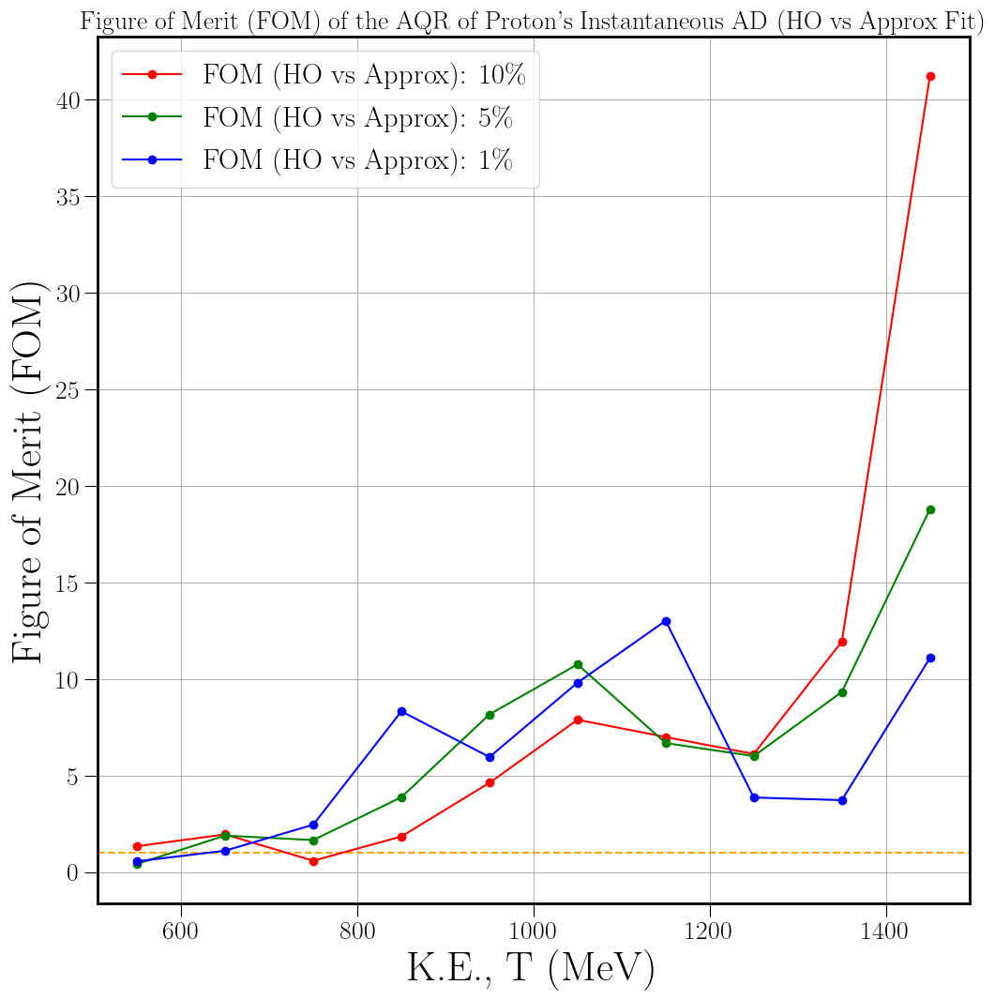

In [87]:
import matplotlib.pyplot as plt
import numpy as np

# ... [Previous setup code for fig and ax remains the same] ...
#Compare between AQRs of Muon's Integrated AD using HO vs Approx fit w/ Figure of Merit (FOM)

#Linear space in K.E.
# t = np.linspace(500, 1500, 41)
# print(t)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'K.E., T (MeV)', size= 32)
ax.set_ylabel(r'Figure of Merit (FOM)', size= 32)
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Figure of Merit (FOM) of the AQR of Proton\'s Instantaneous AD (HO vs Approx Fit)', fontsize=20)
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)


# --- Process HO Fit Datasets ---

# Define labels and colors for cleaner code: HO Fit
datasets1 = [
    (bin_centers1h, means_10h, errs_10h, 'red', 'o', '10\%'),
    (bin_centers2h, means_05h, errs_05h, 'green', '^', '5\%'),
    (bin_centers3h, means_01h, errs_01h, 'blue', 's', '1\%')
]

x1_list, y1_list, yerr1_list = [], [], []
for x_data, y_data, err_data, color, marker, label in datasets1:
    x_np, y_np, yerr_np = np.array(x_data), np.array(y_data), np.array(err_data)
    x1_list.append(x_np)
    y1_list.append(y_np)
    yerr1_list.append(yerr_np)


# --- Process Approx Fit Datasets ---

# Define labels and colors for cleaner code: Approx Fit

datasets2 = [
    (bin_centers1, means_10, errs_10, 'red', 'o', '10\%'),
    (bin_centers2, means_05, errs_05, 'green', '^', '5\%'),
    (bin_centers3, means_01, errs_01, 'blue', 's', '1\%')
]

x2_list, y2_list, yerr2_list = [], [], []
for x_data, y_data, err_data, color, marker, label in datasets2:
    x_np, y_np, yerr_np = np.array(x_data), np.array(y_data), np.array(err_data)
    x2_list.append(x_np)
    y2_list.append(y_np)
    yerr2_list.append(yerr_np)

# --- FOM calculation ---
# Convert lists to NumPy arrays so we can do math on them
# This creates arrays of shape (3, N)
Y1 = np.array(y1_list)
Y2 = np.array(y2_list)
E1 = np.array(yerr1_list)
E2 = np.array(yerr2_list)
X2 = np.array(x2_list)

# Calculate FOM for all three datasets at once
# fom1 uses geometric mean of errors, fom2 uses quadrature (standard)
fom1 = abs(Y2 - Y1) / np.sqrt(E1 * E2)
fom2 = abs(Y2 - Y1) / np.sqrt(E1**2 + E2**2) #Activated

# --- Plotting the Results ---
# Loop through the calculated FOMs to plot each line
labels = ['10\%', '5\%', '1\%']
colors = ['red', 'green', 'blue']

for i in range(len(fom2)):
    mask = ~np.isnan(fom2[i])
    ax.plot(X2[i][mask], fom2[i][mask], 
            label=f'FOM (HO vs Approx): {labels[i]}', 
            color=colors[i], marker='o')

plt.axhline(y=1, color='orange', linestyle='--', zorder=0)

ax.grid()
ax.legend(fontsize=22)

# plt.savefig('FOM_AQR_ho_vs_approxfit_Cherenkov_instantaneous_AD_Proton_allTs_10_5_1_perc', bbox_inches='tight')

plt.show()


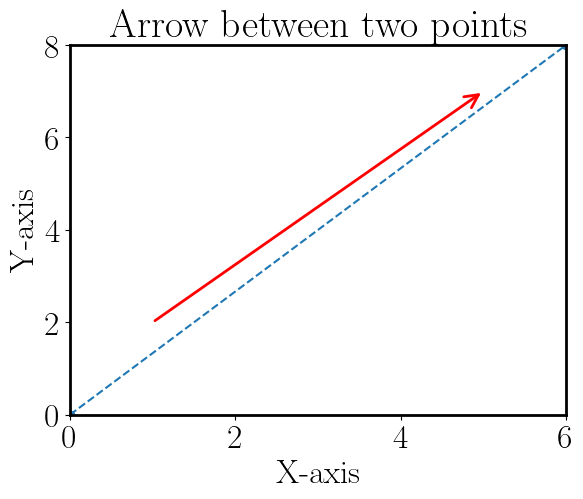

In [60]:
import matplotlib.pyplot as plt

# Define the start and end points of the arrow
point1 = (1, 2)  # (x_start, y_start)
point2 = (5, 7)  # (x_end, y_end)

# Create a figure and an axes object
fig, ax = plt.subplots()

# Plot some data (optional, for context)
ax.plot([0, 6], [0, 8], 'o--')

# Add the arrow using annotate
ax.annotate(
    '',  # No text for the annotation
    xy=point2,  # The end point of the arrow (arrowhead)
    xytext=point1,  # The start point of the arrow (arrow tail)
    arrowprops=dict(arrowstyle='->', color='red', lw=2) # Customize arrow properties
)

# Set limits and labels for clarity
ax.set_xlim(0, 6)
ax.set_ylim(0, 8)
ax.set_xlabel("X-axis")
ax.set_ylabel("Y-axis")
ax.set_title("Arrow between two points")

# Display the plot
plt.show()

# Muon AQR from IAD (Approx fit)

In [3]:
# K.E or Beta
# t = 500

#Linear space in K.E.
t = np.linspace(100, 1000, 37)
# print(t)

alpha = 1/137
# mp = 938  #Proton's mass in MeV

#Mass of the particle travelling
# mp = 938 #Proton's mass
mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²

betamu  = np.sqrt(1 - (1/(1 + t/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

print (t, betamu, np.round(betamu, 4))

n_peakr = 1.3605
n_500 = 1.2278

for i in betamu:

    #Quantile Window: Integration Stepsize 
    
    cos_ang_min = 1/(i * n_peakr)
    thetamax = np.arccos(cos_ang_min)*(180/np.pi)
    
    cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
    # cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
    
    thetamin = np.arccos(cos_ang_maxn)*(180/np.pi)
    
    
    dp = (thetamax - thetamin)/(180/(2*2000))
    
    
    theta_window = (thetamax - thetamin)/10 #10% of databins 
    
    min_window = thetamin + theta_window
    
    max_window = thetamax - theta_window 
    
    print(i, thetamin, min_window, max_window, thetamax) 

    

[ 100.  125.  150.  175.  200.  225.  250.  275.  300.  325.  350.  375.
  400.  425.  450.  475.  500.  525.  550.  575.  600.  625.  650.  675.
  700.  725.  750.  775.  800.  825.  850.  875.  900.  925.  950.  975.
 1000.] [0.85793361 0.88891261 0.91060252 0.92642891 0.93835312 0.94757187
 0.95485213 0.96070526 0.96548344 0.96943599 0.97274358 0.97553983
 0.97792534 0.97997704 0.98175461 0.98330494 0.98466527 0.98586549
 0.98692983 0.98787809 0.98872659 0.98948888 0.99017626 0.99079826
 0.99136291 0.99187708 0.99234661 0.99277653 0.99317117 0.9935343
 0.99386919 0.9941787  0.99446532 0.99473127 0.99497848 0.99520868
 0.9954234 ] [0.8579 0.8889 0.9106 0.9264 0.9384 0.9476 0.9549 0.9607 0.9655 0.9694
 0.9727 0.9755 0.9779 0.98   0.9818 0.9833 0.9847 0.9859 0.9869 0.9879
 0.9887 0.9895 0.9902 0.9908 0.9914 0.9919 0.9923 0.9928 0.9932 0.9935
 0.9939 0.9942 0.9945 0.9947 0.995  0.9952 0.9954]
0.8579336051517742 18.316822007976537 19.589917889532682 29.774684941981853 31.047780823537998


K.E.=100.0, beta=0.8579336051517742, dp=37.0, theta_windowp=1.646333429598199, thetaminp=18.316822007976537, min_windowp=19.963155437574734, max_windowp=33.13382287436033, thetamaxp=34.78015630395853
The element closest to 18.316822007976537 is at index: 407
The closest element is: 18.32416208104052
The element closest to 19.963155437574734 is at index: 443
The closest element is: 19.94497248624312
The element closest to 33.13382287436033 is at index: 736
The closest element is: 33.13656828414207
The element closest to 34.78015630395853 is at index: 773
The closest element is: 34.8024012006003
100.0 MeV Muon: 10% Normal Quantile = [3203.72764515 3182.32934193 3161.23052089 3140.42535463 3119.90816423
 3099.67341469 3079.71571049 3060.02979141 3040.61052834 3021.45291943
 3002.55208623 2983.90327001 2965.50182825 2947.34323119 2929.42305853
 2911.73699626 2894.28083357 2877.05045986 2860.04186189 2843.25112099
 2826.6744104  2810.30799263 2794.14821701 2778.19151722 2762.43440899
 2746.

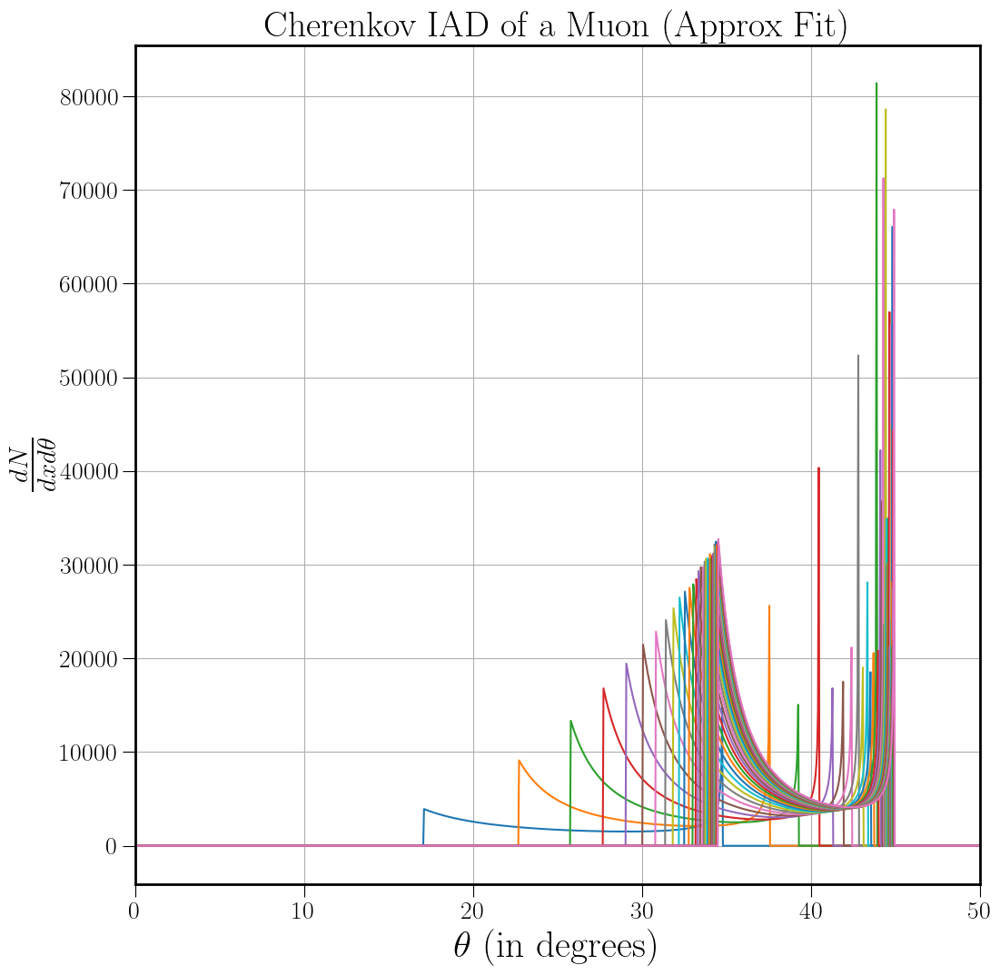

In [5]:
#Approx Fit: Muon

#Import libraries
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

#Our (PVS) Fit: 
    
alpha = 1/137 #Fine-structure (EM coupling) constant 
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652
n_max = 1.4191220261503081

#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #absorptive model peak

# lamd_uv = 106.6 #lambda_UV = 106.6 nm
# lamd_ir = 908.3 #lambda_IR = 908.3 nm 

# lamd = np.linspace(90,700,2000)

n_uvr = a_0j #when lamd -> lamd_UV
n_500 = 1.2278
# n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf


# print("n_uv = {}, n_peak = {}, n_500= {}, n_asymtote = {}".format(n_uvr, n_peakr, n_500, n_asymtoter))

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

# matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
# plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'$\theta$ (in degrees)', size= 30)
ax.set_ylabel(r'$\frac{dN}{dx d\theta}$', size= 30)
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
# ax.set_title('Cherenkov IAD of a Proton (HO Fit)')
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.set_title('Cherenkov IAD of a Muon (Approx Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)


#Define a function to find the index of the desired element

def find_nearest_index_numpy(arr, value):
    """
    Finds the index of the element closest to 'value' in a NumPy array.
    """
    arr = np.array(arr)  # Ensure it's a NumPy array
    idx = np.abs(arr - value).argmin()
    return idx

#Explanation:
# np.abs(arr - value) calculates the absolute difference between each element in the array and the value.
# .argmin() returns the index of the minimum value in the resulting array of absolute differences, which corresponds to the element closest to value.


#Linear space in K.E.
#Linear space in K.E.
t = np.linspace(100, 1000, 37)
# print(t)

#Mass of the particle travelling
# mp = 938 #Proton's mass
mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²

betamu  = np.sqrt(1 - (1/(1 + t/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

# print (t, betamu, np.round(betamu, 4))

cos_ang_minp = []
con_ang_maxnp = []
thetamaxp = []
thetaminp = []



# Load the .npz file
#HO fit
# pdata500ho = np.load('IAD_new_data_for_PID\\iCherenkovdata_p_500_ho.npz')
#Babicz fit
# pdata500b = np.load('IAD_new_data_for_PID\\iCherenkovdata_p_500_babicz.npz')


# Create an empty dictionary to store the data.
data_dict = {}

itotalts = []
inormalts = []
ianomts = []

itotaltps = []
inormaltps = []
ianomtps = []

# itotalbts = []

itmunormps10 = []
itmuanomps10 = []
nbyamups10 = []
abynmups10 = []

itmunormps05 = []
itmuanomps05 = []
nbyamups05 = []
abynmups05 = []

itmunormps01 = []
itmuanomps01 = []
nbyamups01 = []
abynmups01 = []


# Loop through your values
for val in t:
    # Use an f-string to generate the key for the dictionary. (HO)
    # key = f"pdata_{val:.0f}_ho"
    # ho = f"pdata_{val:.0f}_ho"
    ap = f"mudata_{val:.0f}_approx"
    
    # Use another f-string to generate the filename for loading.
    # filename1 = fr"IAD_new_data_for_PID\iCherenkovdata_p_{val:.0f}_ho.npz"
    filename4 = fr"IAD_new_data_for_PID\iCherenkovdata_mu_{val:.0f}_approx.npz"
    
    # Store the loaded data in the dictionary using the generated key.
    # data_dict[key] = np.load(filename)
    # #HO Fit
    # data_dict[ho] = np.load(filename1) 

    # costheta = data_dict[ho]['costheta']
    # theta = data_dict[ho]['theta']
    # itotal = data_dict[ho]['itotalho']
    # inormal = data_dict[ho]['inormalho']
    # ianom = data_dict[ho]['ianomalousho']
    # thetadeg = theta*(180/np.pi) 
    # itotalt = itotal*np.sin(theta)
    # inormalt = inormal*np.sin(theta)
    # ianomt = ianom*np.sin(theta)
    # # print(costheta)

    #Approx Fit
    data_dict[ap] = np.load(filename4, allow_pickle=True) 

    costhetap = data_dict[ap]['costheta']
    thetap = data_dict[ap]['theta']
    itotalp = data_dict[ap]['itotalapprox']
    # inormalp = data_dict[ap]['inormalapprox']
    # ianomp = data_dict[ap]['ianomalousapprox']
    thetadegp = thetap*(180/np.pi) 
    itotaltp = itotalp*np.sin(thetap)
    # inormaltp = inormalp*np.sin(thetap)
    # ianomtp = ianomp*np.sin(thetap)
    
    # ax.plot(thetadeg, itotalt, label='Total (HO)')
    # ax.plot(thetadeg, inormalt, label='Normal (HO)')
    # ax.plot(thetadeg, ianomt, label='Anomalous (HO)')

    ax.plot(thetadegp, itotaltp, label='Total (Approx)')
    # ax.plot(thetadegp, inormaltp, label='Normal (Approx)')
    # ax.plot(thetadegp, ianomtp, label='Anomalous (Approx)')

    # ax.plot(theta*(180/np.pi), itotalbt, label='Babicz')
    
    # ax.plot(theta*(180/np.pi), itotalbt, label='Total')

    # itotalts.append(itotalt) #.tolist())  
    # inormalts.append(inormalt)
    # ianomts.append(ianomt)

    itotaltps.append(itotaltp) #.tolist())  
    # inormaltps.append(inormaltp)
    # ianomtps.append(ianomtp)
    
    # itotalbts.append(itotalbt)

    
    # itotalts.append(itotalt.tolist())  
    # inormalts.append(inormalt)
    # ianomts.append(ianomt)
    
    # itotalbts.append(itotalbt)

    
    i  = np.sqrt(1 - (1/(1 + val/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD


    #Quantile Window: Integration Stepsize 
    
    cos_ang_minp = 1/(i * n_max) #Approx Fit
    thetamaxp = np.arccos(cos_ang_minp)*(180/np.pi)
    
    cos_ang_maxnp = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
    # cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
    thetaminp = np.arccos(cos_ang_maxnp)*(180/np.pi)

    
    #Defining integration window

    theta_windowp10 = (thetamaxp - thetaminp)/10 #10% of databins # dp = (thetamax - thetamin)/(180/(2*2000))
    theta_windowp05 = (thetamaxp - thetaminp)/20 #5% of databins # dp = (thetamax - thetamin)/(180/(2*2000))
    theta_windowp01 = (thetamaxp - thetaminp)/100 #1% of databins # dp = (thetamax - thetamin)/(180/(2*2000))
    
    dpp10 = np.round(2000*2*theta_windowp10/180) #no. of datapoints within theta_window
    dpp05 = np.round(2000*2*theta_windowp05/180) #no. of datapoints within theta_window
    dpp01 = np.round(2000*2*theta_windowp01/180) #no. of datapoints within theta_window
    
    min_windowp10 = thetaminp + theta_windowp10
    max_windowp10 = thetamaxp - theta_windowp10 

    min_windowp05 = thetaminp + theta_windowp05
    max_windowp05 = thetamaxp - theta_windowp05 

    min_windowp01 = thetaminp + theta_windowp01
    max_windowp01 = thetamaxp - theta_windowp01 

    
    # print(i, thetamin, min_window, max_window, thetamax)
    print('K.E.={}, beta={}, dp={}, theta_windowp={}, thetaminp={}, min_windowp={}, max_windowp={}, thetamaxp={}'.format(val, i, dpp10, theta_windowp10, thetaminp, min_windowp10, max_windowp10, thetamaxp)) 
    
    
    # Example usage:
    my_array = thetadegp

    #10% Quantile
    
    #Theta_min
    min_valuep = thetaminp
    min_indexp = find_nearest_index_numpy(my_array, min_valuep)
    print(f"The element closest to {min_valuep} is at index: {min_indexp}")
    print(f"The closest element is: {my_array[min_indexp]}")
    
    #Min_window
    min_window_valuep = thetaminp + theta_windowp10
    min_window_indexp = find_nearest_index_numpy(my_array, min_window_valuep)
    print(f"The element closest to {min_window_valuep} is at index: {min_window_indexp}")
    print(f"The closest element is: {my_array[min_window_indexp]}")
    
    #Max_window
    max_window_valuep = thetamaxp - theta_windowp10
    max_window_indexp = find_nearest_index_numpy(my_array, max_window_valuep)
    print(f"The element closest to {max_window_valuep} is at index: {max_window_indexp}")
    print(f"The closest element is: {my_array[max_window_indexp]}")
    
    #Theta_max
    max_valuep = thetamaxp
    max_indexp = find_nearest_index_numpy(my_array, max_valuep)
    print(f"The element closest to {max_valuep} is at index: {max_indexp}")
    print(f"The closest element is: {my_array[max_indexp]}")
    
    # Sum i-th to j-th elements of an array) 
    
    itotalnormp10 = itotaltp[min_indexp:min_window_indexp] 
    
    itotalanomp10 = itotaltp[max_window_indexp:max_indexp]
    
    print('{} MeV Muon: 10% Normal Quantile = {}, 10% Anomalous Quantile = {}'.format(val, itotalnormp10, itotalanomp10))
    
    # itnorm = sum(itotalnorm)* (thetamin + min_window)/2 
    # itanom = sum(itotalanom)* (max_window + thetamax)/2 
    
    # print('For {} MeV Proton: theta_window/dp = {}'.format(val, theta_window/dp))
    
    itnormp10 = sum(itotalnormp10) * (theta_windowp10/dpp10) 
    itanomp10 = sum(itotalanomp10) * (theta_windowp10/dpp10) 
    
    nbyamup10 = itnormp10 / itanomp10
    abynmup10 = itanomp10 / itnormp10
    
    print('{} MeV Proton: Sum of 10% Normal Quantile = {}, Sum of 10% Anomalous Quantile = {}, 10% Normal/Anomalous = {}, 10% Anomalous/Normal = {}'.format(val, itnormp10, itanomp10, nbyamup10, 1/nbyamup10))

    # itotalts.append(itotalt.tolist())  

    itmunormps10.append(itnormp10)
    itmuanomps10.append(itanomp10)
    nbyamups10.append(nbyamup10)
    abynmups10.append(abynmup10)

    #5% Quantile

    print('K.E.={}, beta={}, dp={}, theta_windowp={}, thetaminp={}, min_windowp={}, max_windowp={}, thetamaxp={}'.format(val, i, dpp05, theta_windowp05, thetaminp, min_windowp05, max_windowp05, thetamaxp)) 
    
    
    #Theta_min
    min_valuep = thetaminp
    min_indexp = find_nearest_index_numpy(my_array, min_valuep)
    print(f"The element closest to {min_valuep} is at index: {min_indexp}")
    print(f"The closest element is: {my_array[min_indexp]}")
    
    #Min_window
    min_window_valuep = thetaminp + theta_windowp05
    min_window_indexp = find_nearest_index_numpy(my_array, min_window_valuep)
    print(f"The element closest to {min_window_valuep} is at index: {min_window_indexp}")
    print(f"The closest element is: {my_array[min_window_indexp]}")
    
    #Max_window
    max_window_valuep = thetamaxp - theta_windowp05
    max_window_indexp = find_nearest_index_numpy(my_array, max_window_valuep)
    print(f"The element closest to {max_window_valuep} is at index: {max_window_indexp}")
    print(f"The closest element is: {my_array[max_window_indexp]}")
    
    #Theta_max
    max_valuep = thetamaxp
    max_indexp = find_nearest_index_numpy(my_array, max_valuep)
    print(f"The element closest to {max_valuep} is at index: {max_indexp}")
    print(f"The closest element is: {my_array[max_indexp]}")
    
    # Sum i-th to j-th elements of an array) 
    
    itotalnormp05 = itotaltp[min_indexp:min_window_indexp] 
    
    itotalanomp05 = itotaltp[max_window_indexp:max_indexp]
    
    print('{} MeV Muon: 5% Normal Quantile = {}, 5% Anomalous Quantile = {}'.format(val, itotalnormp05, itotalanomp05))
    
    # itnorm = sum(itotalnorm)* (thetamin + min_window)/2 
    # itanom = sum(itotalanom)* (max_window + thetamax)/2 
    
    # print('For {} MeV Proton: theta_window/dp = {}'.format(val, theta_window/dp))
    
    itnormp05 = sum(itotalnormp05) * (theta_windowp05/dpp05) 
    itanomp05 = sum(itotalanomp05) * (theta_windowp05/dpp05) 
    
    nbyamup05 = itnormp05 / itanomp05
    abynmup05 = itanomp05 / itnormp05
    
    print('{} MeV Muon: Sum of 5% Normal Quantile = {}, Sum of 5% Anomalous Quantile = {}, 5% Normal/Anomalous = {}, 5% Anomalous/Normal = {}'.format(val, itnormp05, itanomp05, nbyamup05, 1/nbyamup05))

    # itotalts.append(itotalt.tolist())  

    itmunormps05.append(itnormp05)
    itmuanomps05.append(itanomp05)
    nbyamups05.append(nbyamup05)
    abynmups05.append(abynmup05)

    #1% Quantile

    print('K.E.={}, beta={}, dp={}, theta_windowp={}, thetaminp={}, min_windowp={}, max_windowp={}, thetamaxp={}'.format(val, i, dpp01, theta_windowp01, thetaminp, min_windowp01, max_windowp01, thetamaxp)) 
    
    
    #Theta_min
    min_valuep = thetaminp
    min_indexp = find_nearest_index_numpy(my_array, min_valuep)
    print(f"The element closest to {min_valuep} is at index: {min_indexp}")
    print(f"The closest element is: {my_array[min_indexp]}")
    
    #Min_window
    min_window_valuep = thetaminp + theta_windowp01
    min_window_indexp = find_nearest_index_numpy(my_array, min_window_valuep)
    print(f"The element closest to {min_window_valuep} is at index: {min_window_indexp}")
    print(f"The closest element is: {my_array[min_window_indexp]}")
    
    #Max_window
    max_window_valuep = thetamaxp - theta_windowp01
    max_window_indexp = find_nearest_index_numpy(my_array, max_window_valuep)
    print(f"The element closest to {max_window_valuep} is at index: {max_window_indexp}")
    print(f"The closest element is: {my_array[max_window_indexp]}")
    
    #Theta_max
    max_valuep = thetamaxp
    max_indexp = find_nearest_index_numpy(my_array, max_valuep)
    print(f"The element closest to {max_valuep} is at index: {max_indexp}")
    print(f"The closest element is: {my_array[max_indexp]}")
    
    # Sum i-th to j-th elements of an array) 
    
    itotalnormp01 = itotaltp[min_indexp:min_window_indexp] 
    
    itotalanomp01 = itotaltp[max_window_indexp:max_indexp]
    
    print('{} MeV Muon: 1% Normal Quantile = {}, 1% Anomalous Quantile = {}'.format(val, itotalnormp01, itotalanomp01))
    
    # itnorm = sum(itotalnorm)* (thetamin + min_window)/2 
    # itanom = sum(itotalanom)* (max_window + thetamax)/2 
    
    # print('For {} MeV Proton: theta_window/dp = {}'.format(val, theta_window/dp))
    
    itnormp01 = sum(itotalnormp01) * (theta_windowp01/dpp01) 
    itanomp01 = sum(itotalanomp01) * (theta_windowp01/dpp01) 
    
    nbyamup01 = itnormp01 / itanomp01
    abynmup01 = itanomp01 / itnormp01
    
    print('{} MeV Muon: Sum of 1% Normal Quantile = {}, Sum of 1% Anomalous Quantile = {}, 1% Normal/Anomalous = {}, 1% Anomalous/Normal = {}'.format(val, itnormp01, itanomp01, nbyamup01, 1/nbyamup01))

    # itotalts.append(itotalt.tolist())  

    itmunormps01.append(itnormp01)
    itmuanomps01.append(itanomp01)
    nbyamups01.append(nbyamup01)
    abynmups01.append(abynmup01)



# print(np.shape(itpnormps05), np.shape(itpanomps05))
# print(itotalts.flatten())


################################################################################################################################
# ax.legend(fontsize=18)
ax.set_xlim(0,50)
ax.grid()

# plt.savefig('Cherenkov_IAD_Muon_allTs_new_data_ho', bbox_inches='tight')
# plt.savefig('Cherenkov_IAD_Muon_allTs_new_data_approx', bbox_inches='tight')
# plt.savefig('Cherenkov_IAD_Muon_500_600_800_1000_MeV_new_data_ho', bbox_inches='tight')
# plt.savefig('Cherenkov_IAD_Muon_allTs_new_data_babicz', bbox_inches='tight')


# print(data_dict[ho].files)
# print(data_dict[ap].files)
# print(data_dict[b].files)

# print(itotalts.files)

# Close the file
# data.close()

In [325]:
#Linear space in K.E.
tp = np.linspace(500, 1500, 41)
tm = np.linspace(100, 1000, 37)
# print(t)

#Mass of the particle travelling
mp = 938 #Proton's mass
mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²

betap  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD
betamu  = np.sqrt(1 - (1/(1 + t/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

# print (tp, betap, np.round(betap, 4))
# print (tm, betamu, np.round(betamu, 4))


# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'K.E., T (MeV)', size= 30)
ax.set_ylabel(r'Angular Quantile Ratio (L/R)', size= 30) #$\frac{N}{A}$
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}

# ax.set_title('Cherenkov Angular Quantile Ratio for Protons (Approx Fit)')
# ax.set_title('Cherenkov Angular Quantile Ratio for Muons (Approx Fit)')
ax.set_title('Cherenkov Angular Quantile Ratio (L/R) of Protons and Muons (Approx Fit)', fontsize=22)

ax.tick_params(axis='both',which='major',labelsize=20,length=10)

# ax.plot(tp, nbyapps10, linewidth=4, c='g', label='Proton $10\%$')
# ax.plot(tm, nbyamups10, linewidth=4, c='r', label='Muon $10\%$')

# ax.plot(tp, nbyapps05, linewidth=4, ls='dashdot', c='g', label='Proton $5\%$')
# ax.plot(tm, nbyamups05, linewidth=4, ls='dashdot', c='r', label='Muon $5\%$')

# ax.plot(tp, nbyapps01, linewidth=4, ls='dashed', c='g', label='Proton $1\%$')
# ax.plot(tm, nbyamups01, linewidth=4, ls='dashed', c='r', label='Muon $1\%$')

ax.plot(tp, nbyapps10, linewidth=4, c='g', label='Proton $10\%$')
ax.plot(tp, nbyapps05, linewidth=4, ls='dashdot', c='g', label='Proton $5\%$')
ax.plot(tp, nbyapps01, linewidth=4, ls='dashed', c='g', label='Proton $1\%$')

ax.plot(tm, nbyamups10, linewidth=4, c='r', label='Muon $10\%$')
ax.plot(tm, nbyamups05, linewidth=4, ls='dashdot', c='r', label='Muon $5\%$')
ax.plot(tm, nbyamups01, linewidth=4, ls='dashed', c='r', label='Muon $1\%$')


ax.grid()
ax.legend()
# plt.savefig('nbyas_10_5_1_perc_approxfit_Cherenkov_IAD_Proton_allT_from_saved_data', bbox_inches='tight')
# plt.savefig('nbyas_10_5_1_perc_approxfit_Cherenkov_IAD_Muon_allT_from_saved_data', bbox_inches='tight')
# plt.savefig('nbyas_10_5_1_perc_approxfit_Cherenkov_IAD_Proton_Muon_allT_from_saved_data_mplot1', bbox_inches='tight')


[ 500.  525.  550.  575.  600.  625.  650.  675.  700.  725.  750.  775.
  800.  825.  850.  875.  900.  925.  950.  975. 1000. 1025. 1050. 1075.
 1100. 1125. 1150. 1175. 1200. 1225. 1250. 1275. 1300. 1325. 1350. 1375.
 1400. 1425. 1450. 1475. 1500.] [0.75796532 0.76741698 0.77628968 0.78463315 0.79249149 0.79990401
 0.80690583 0.81352846 0.81980026 0.82574686 0.83139144 0.83675507
 0.8418569  0.84671442 0.8513436  0.85575908 0.85997431 0.86400164
 0.86785245 0.87153724 0.87506571 0.87844687 0.88168902 0.88479989
 0.88778668 0.89065607 0.89341428 0.89606712 0.89862002 0.90107804
 0.90344595 0.90572818 0.9079289  0.91005203 0.91210124 0.91407999
 0.91599153 0.91783893 0.91962507 0.92135268 0.92302433] [0.758  0.7674 0.7763 0.7846 0.7925 0.7999 0.8069 0.8135 0.8198 0.8257
 0.8314 0.8368 0.8419 0.8467 0.8513 0.8558 0.86   0.864  0.8679 0.8715
 0.8751 0.8784 0.8817 0.8848 0.8878 0.8907 0.8934 0.8961 0.8986 0.9011
 0.9034 0.9057 0.9079 0.9101 0.9121 0.9141 0.916  0.9178 0.9196 0.9214
 0.923

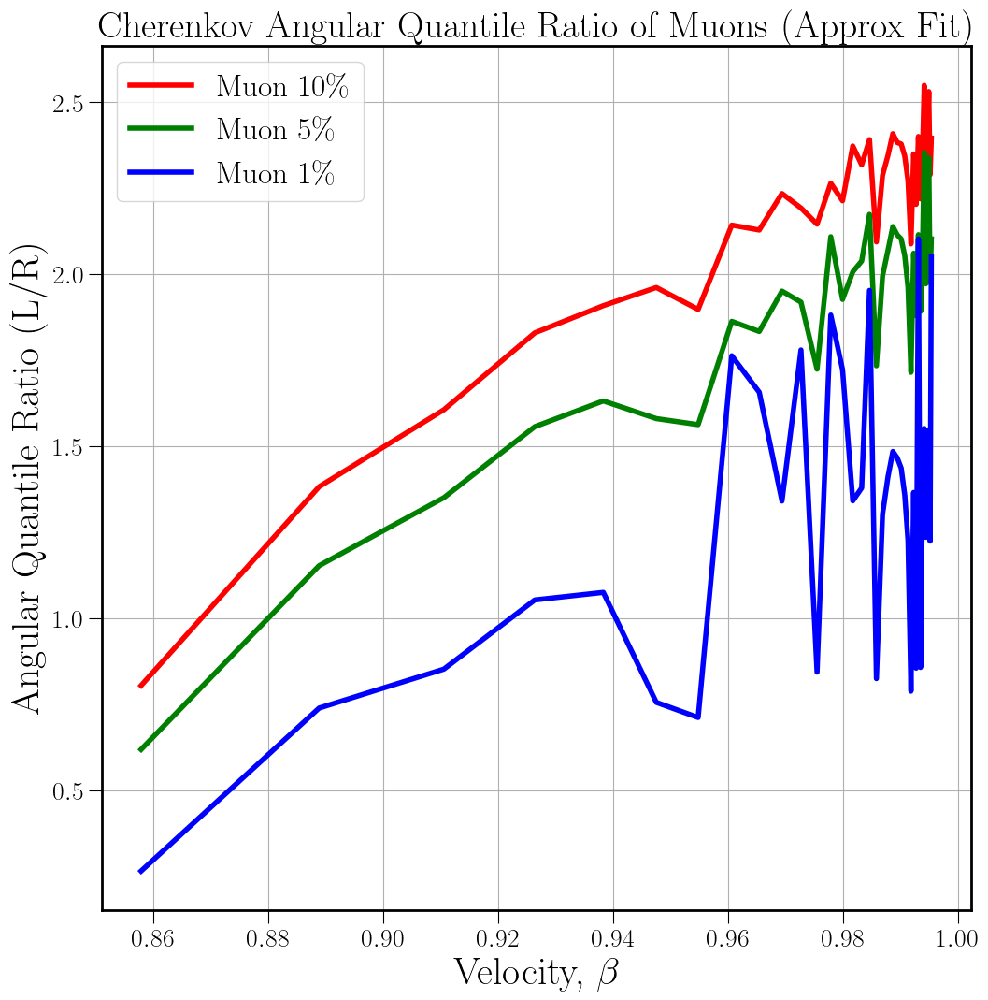

In [29]:
#Linear space in K.E.
tp = np.linspace(500, 1500, 41)
tm = np.linspace(100, 1000, 37)
# print(t)

#Mass of the particle travelling
mp = 938 #Proton's mass
mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²

betap  = np.sqrt(1 - (1/(1 + tp/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD
betamu  = np.sqrt(1 - (1/(1 + tm/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

print (tp, betap, np.round(betap, 4))
print (tm, betamu, np.round(betamu, 4))


# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'Velocity, $\beta$', size= 30)
ax.set_ylabel(r'Angular Quantile Ratio (L/R)', size= 30) #$\frac{N}{A}$
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}

# ax.set_title('Cherenkov Angular Quantile Ratio of Protons (Approx Fit)')
ax.set_title('Cherenkov Angular Quantile Ratio of Muons (Approx Fit)')
# ax.set_title('Cherenkov Angular Quantile Ratio (L/R) of Protons and Muons (Approx Fit)', fontsize=22)

ax.tick_params(axis='both',which='major',labelsize=20,length=10)

# ax.plot(betap, nbyapps10, linewidth=4, c='g', label='Proton $10\%$')
# ax.plot(betap, nbyapps05, linewidth=4, ls='dashdot', c='g', label='Proton $5\%$')
# ax.plot(betap, nbyapps01, linewidth=4, ls='dashed', c='g', label='Proton $1\%$')


ax.plot(betamu, nbyamups10, linewidth=4, c='r', label='Muon $10\%$')
ax.plot(betamu, nbyamups05, linewidth=4, c='g', label='Muon $5\%$') #ls='dashdot', 
ax.plot(betamu, nbyamups01, linewidth=4, c='b', label='Muon $1\%$') # ls='dashed',


ax.grid()
ax.legend()
# plt.savefig('nbyas_10_5_1_perc_approxfit_Cherenkov_IAD_Proton_allbetas_from_saved_data', bbox_inches='tight')
# plt.savefig('nbyas_10_5_1_perc_approxfit_Cherenkov_IAD_Muon_allbetas_from_saved_data', bbox_inches='tight')
# plt.savefig('nbyas_10_5_1_perc_approxfit_Cherenkov_IAD_Proton_Muon_allbetas_from_saved_data_mplot1', bbox_inches='tight')


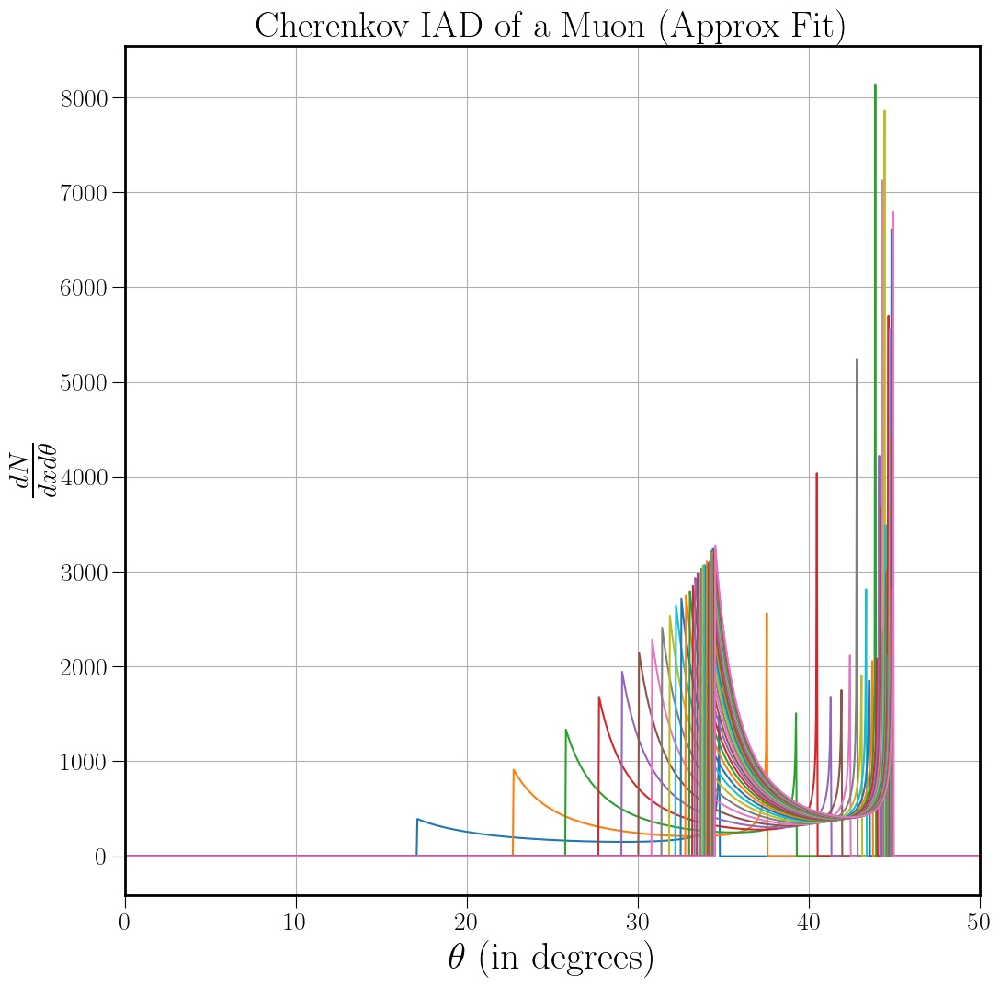

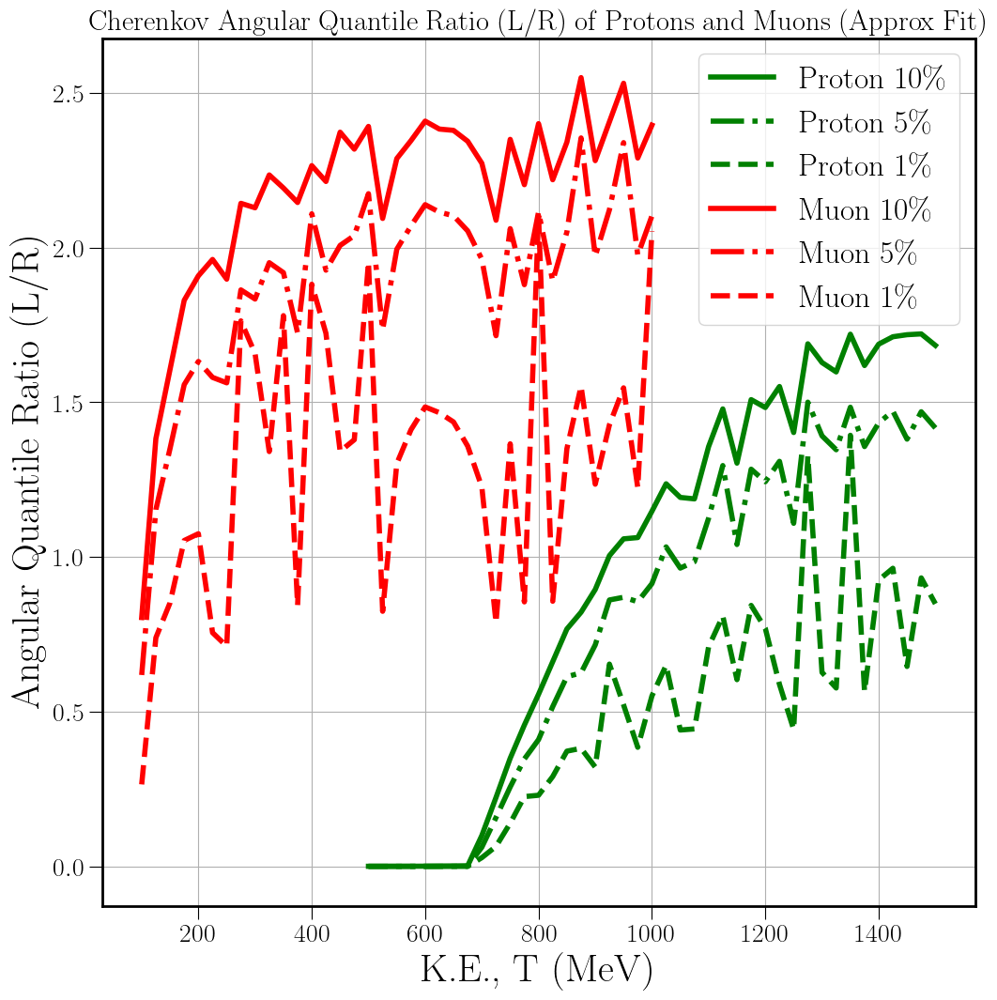

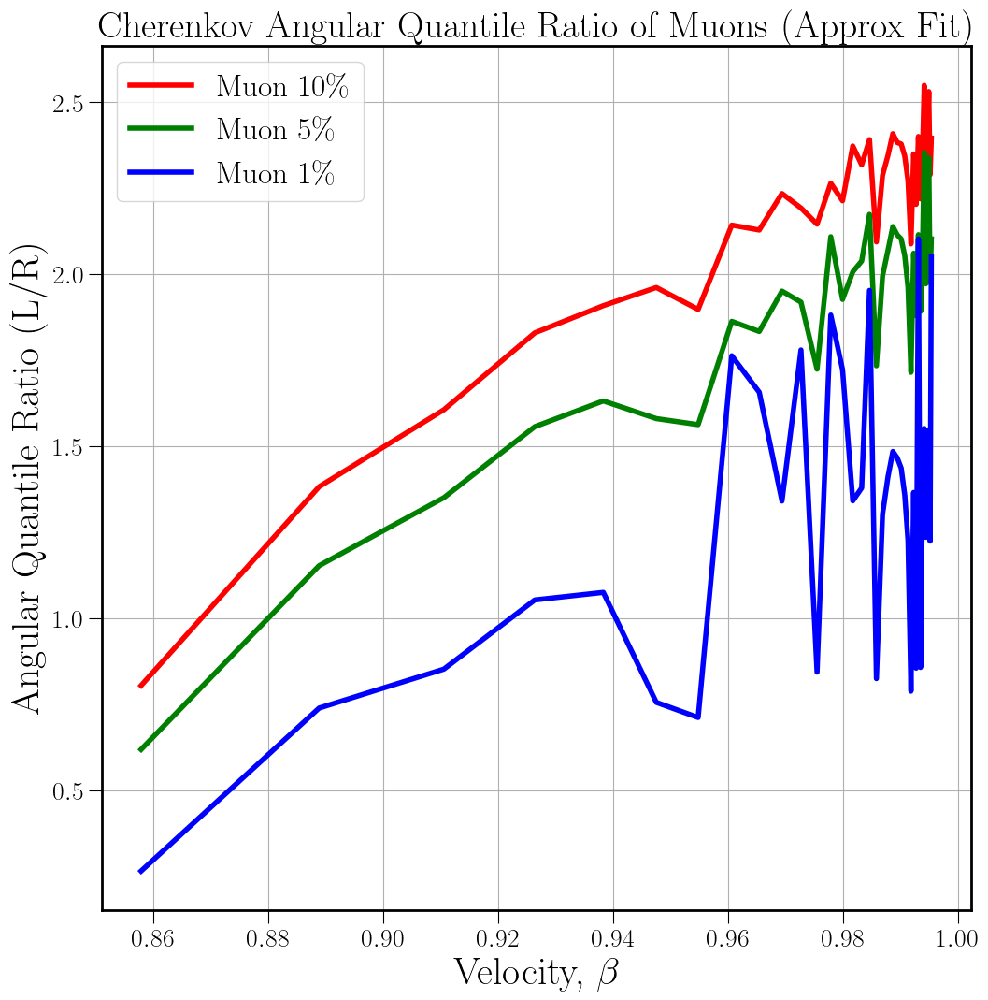

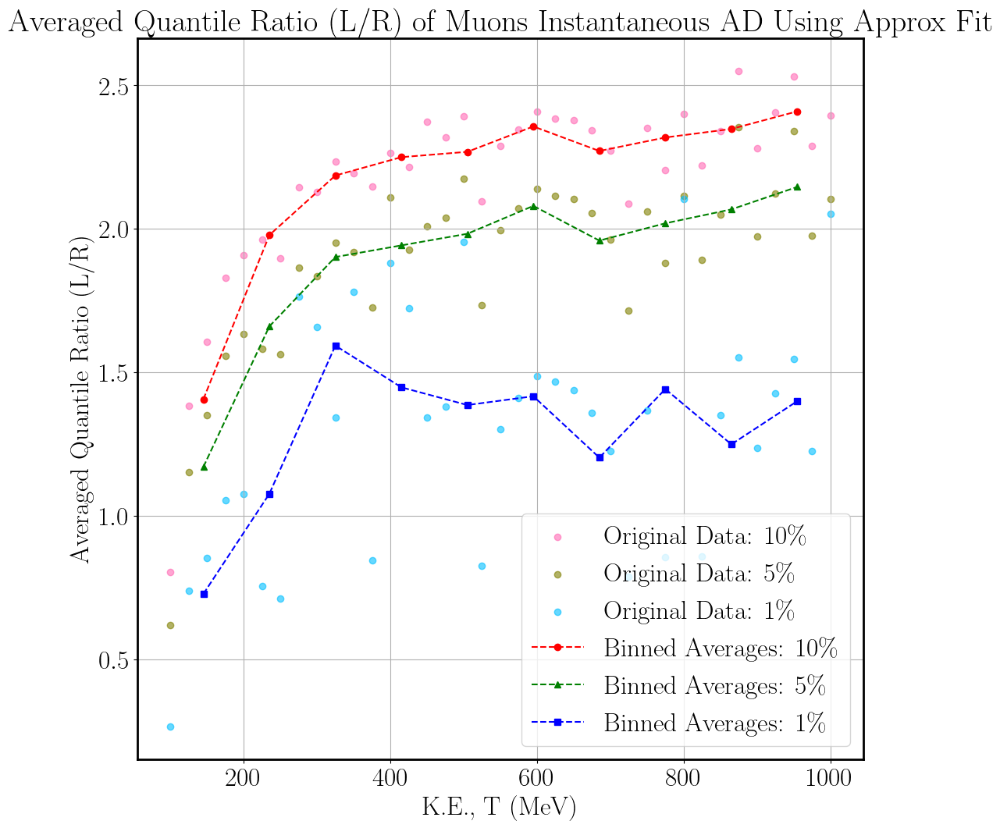

In [327]:
# Averaging elements within bins and then plotting these averages in Python can be achieved using libraries like NumPy and Matplotlib.
import numpy as np
import matplotlib.pyplot as plt

# 1. Generate or load your data
# For demonstration, let's create some sample data
np.random.seed(0) # for reproducibility
# x_data = np.random.rand(100) * 10 # x-values for binning
# y_data = 2 * x_data + np.random.randn(100) * 5 # y-values to be averaged

x_data = t # x-values for binning
y_data4 = np.array(nbyamups10) # y-values to be averaged
y_data5 = np.array(nbyamups05)
y_data6 = np.array(nbyamups01)
 
# 2. Define the bins
num_bins = 10
# You can define custom bin edges or let NumPy determine them
bin_edges = np.linspace(min(x_data), max(x_data), num_bins + 1)

# 3. Bin the data and calculate the mean for each bin
# Use np.digitize to assign each x_data point to a bin index
bin_indices = np.digitize(x_data, bin_edges)

# Calculate the mean of y_data for each bin
bin_means4 = []
bin_centers4 = []

bin_means5 = []
bin_centers5 = []

bin_means6 = []
bin_centers6 = []


for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin4 = y_data4[bin_indices == i]
    if len(elements_in_bin4) > 0: # Avoid division by zero for empty bins
        bin_means4.append(np.mean(elements_in_bin4))
        # Calculate bin center for plotting
        bin_centers4.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means4.append(np.nan)
        bin_centers4.append((bin_edges[i-1] + bin_edges[i]) / 2)

for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin5 = y_data5[bin_indices == i]
    if len(elements_in_bin5) > 0: # Avoid division by zero for empty bins
        bin_means5.append(np.mean(elements_in_bin5))
        # Calculate bin center for plotting
        bin_centers5.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means5.append(np.nan)
        bin_centers5.append((bin_edges[i-1] + bin_edges[i]) / 2)

for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin6 = y_data6[bin_indices == i]
    if len(elements_in_bin6) > 0: # Avoid division by zero for empty bins
        bin_means6.append(np.mean(elements_in_bin6))
        # Calculate bin center for plotting
        bin_centers6.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means6.append(np.nan)
        bin_centers6.append((bin_edges[i-1] + bin_edges[i]) / 2)

# Remove NaN values if you don't want to plot empty bins
bin_centers4 = np.array(bin_centers4)[~np.isnan(bin_means4)]
bin_means4 = np.array(bin_means4)[~np.isnan(bin_means4)]

bin_centers5 = np.array(bin_centers5)[~np.isnan(bin_means5)]
bin_means5 = np.array(bin_means5)[~np.isnan(bin_means5)]

bin_centers6 = np.array(bin_centers6)[~np.isnan(bin_means6)]
bin_means6 = np.array(bin_means6)[~np.isnan(bin_means6)]

# 4. Plot the results
plt.figure(figsize=(12, 12))

plt.scatter(x_data, y_data4, alpha=0.6, c='hotpink', label='Original Data: 10\%')
plt.scatter(x_data, y_data5, alpha=0.6, c='olive', label='Original Data: 5\%')
plt.scatter(x_data, y_data6, alpha=0.6, c='deepskyblue', label='Original Data: 1\%')

plt.plot(bin_centers4, bin_means4, color='red', marker='o', linestyle='--', label='Binned Averages: 10\%')
plt.plot(bin_centers5, bin_means5, color='green', marker='^', linestyle='--', label='Binned Averages: 5\%')
plt.plot(bin_centers6, bin_means6, color='blue', marker='s', linestyle='--', label='Binned Averages: 1\%')

plt.xlabel('K.E., T (MeV)') #(Binned Variable)
plt.ylabel('Averaged Quantile Ratio (L/R)') # (Averaged Variable)')
plt.title('Averaged Quantile Ratio (L/R) of Muons Instantaneous AD Using Approx Fit') #in Bins of K.E. 
plt.legend()
plt.grid(True)

# plt.savefig('binned_avg_nbyas_10_5_1_perc_approxfit_Cherenkov_iAD_Muon_allT_from_saved_data', bbox_inches='tight') #_zoom
plt.show()

[array([0.804227  , 1.38244416, 1.60617725, 1.82970959]), array([1.90885925, 1.96167998, 1.89794783, 2.14313743]), array([2.12873243, 2.23487269, 2.19273965]), array([2.14587702, 2.26496946, 2.21378527, 2.37305743]), array([2.31832847, 2.39173144, 2.09423315]), array([2.28785542, 2.34577937, 2.40886162, 2.38321317]), array([2.37900278, 2.34378579, 2.27247904, 2.08846011]), array([2.34992322, 2.20341156, 2.40067952]), array([2.21939412, 2.34082363, 2.54950502, 2.28113582]), array([2.4065323 , 2.53121943, 2.28959692])] [1.4056395  1.97790613 2.18544826 2.24942229 2.26809769 2.35642739
 2.27093193 2.31800477 2.34771465 2.40911622]
[array([0.61845505, 1.15289786, 1.3505039 , 1.55700852]), array([1.63194086, 1.58044681, 1.56293882, 1.86330576]), array([1.83377445, 1.95121718, 1.91907621]), array([1.72424766, 2.10932551, 1.92709121, 2.00708066]), array([2.03875896, 2.1743134 , 1.73417178]), array([1.99475825, 2.07012731, 2.13885162, 2.11463522]), array([2.10295812, 2.05412773, 1.96229761, 1.

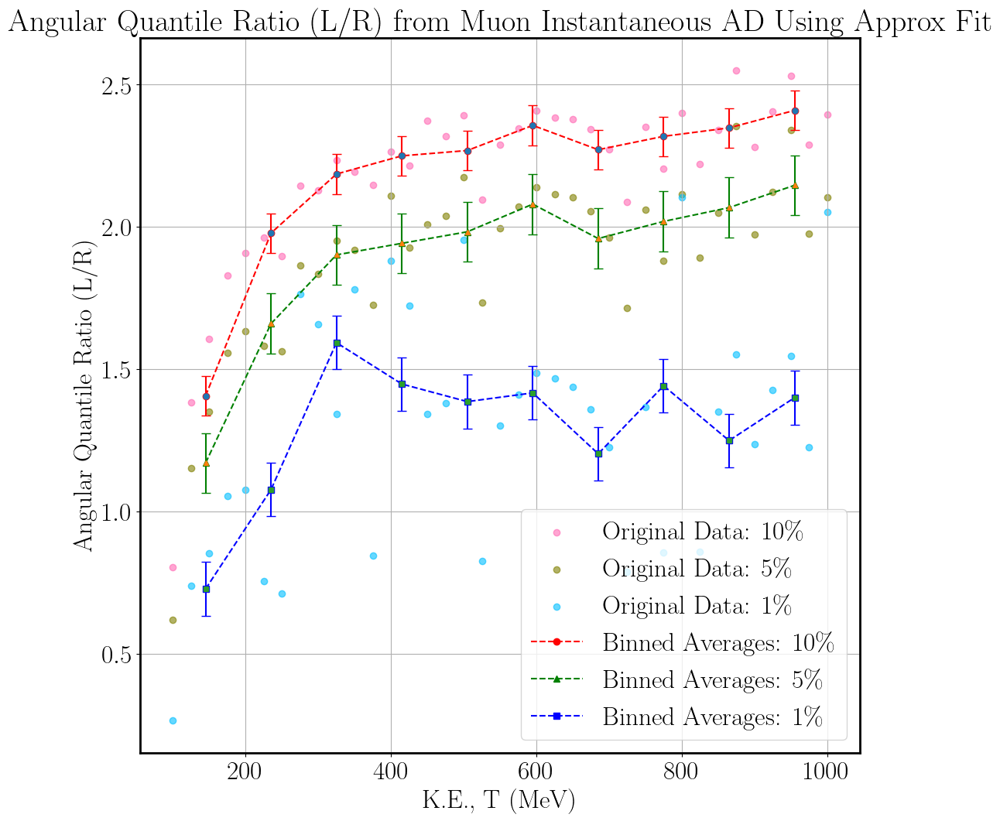

In [328]:
# Averaging elements within bins and then plotting these averages in Python can be achieved using libraries like NumPy and Matplotlib.
import numpy as np
import matplotlib.pyplot as plt

# 1. Generate or load your data
# For demonstration, let's create some sample data
np.random.seed(0) # for reproducibility
# x_data = np.random.rand(100) * 10 # x-values for binning
# y_data = 2 * x_data + np.random.randn(100) * 5 # y-values to be averaged

x_data = tm # x-values for binning
y_data4 = np.array(nbyamups10) # y-values to be averaged
y_data5 = np.array(nbyamups05)
y_data6 = np.array(nbyamups01)
 
# 2. Define the bins
num_bins = 10
# You can define custom bin edges or let NumPy determine them
bin_edges = np.linspace(min(x_data), max(x_data), num_bins + 1)

# 3. Bin the data and calculate the mean for each bin
# Use np.digitize to assign each x_data point to a bin index
bin_indices = np.digitize(x_data, bin_edges)

# Calculate the mean of y_data for each bin
bin_means4 = []
bin_centers4 = []

bin_means5 = []
bin_centers5 = []

bin_means6 = []
bin_centers6 = []

elements_in_bins_10mu = []
elements_in_bins_05mu = []
elements_in_bins_01mu = []

bin_means_10mu = []
bin_means_05mu = []
bin_means_01mu = []



for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin4 = y_data4[bin_indices == i]
    if len(elements_in_bin4) > 0: # Avoid division by zero for empty bins
        bin_means4.append(np.mean(elements_in_bin4))
        # Calculate bin center for plotting
        bin_centers4.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means4.append(np.nan)
        bin_centers4.append((bin_edges[i-1] + bin_edges[i]) / 2)
    elements_in_bins_10mu.append(elements_in_bin4)
    # bin_means_10.append(np.array(bin_means1[-1])) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_10, bin_means_10) 


for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin5 = y_data5[bin_indices == i]
    if len(elements_in_bin5) > 0: # Avoid division by zero for empty bins
        bin_means5.append(np.mean(elements_in_bin5))
        # Calculate bin center for plotting
        bin_centers5.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means5.append(np.nan)
        bin_centers5.append((bin_edges[i-1] + bin_edges[i]) / 2)
    elements_in_bins_05mu.append(elements_in_bin5)
    # bin_means_05.append(bin_means2[-1]) ##bin_means1[-1]: value of the last element of an array/list      
# print(elements_in_bins_05, bin_means_05)


for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin6 = y_data6[bin_indices == i]
    if len(elements_in_bin6) > 0: # Avoid division by zero for empty bins
        bin_means6.append(np.mean(elements_in_bin6))
        # Calculate bin center for plotting
        bin_centers6.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means6.append(np.nan)
        bin_centers6.append((bin_edges[i-1] + bin_edges[i]) / 2)
    elements_in_bins_01mu.append(elements_in_bin6)
    # bin_means_01.append(bin_means3[-1]) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_01, bin_means_01)    


# Remove NaN values if you don't want to plot empty bins
bin_centers4 = np.array(bin_centers4)[~np.isnan(bin_means4)]
bin_means4 = np.array(bin_means4)[~np.isnan(bin_means4)]

bin_centers5 = np.array(bin_centers5)[~np.isnan(bin_means5)]
bin_means5 = np.array(bin_means5)[~np.isnan(bin_means5)]

bin_centers6 = np.array(bin_centers6)[~np.isnan(bin_means6)]
bin_means6 = np.array(bin_means6)[~np.isnan(bin_means6)]

print(elements_in_bins_10mu, bin_means4)
print(elements_in_bins_05mu, bin_means5)
print(elements_in_bins_01mu, bin_means6)

#Jackknife resampling with my data 

def jackknife_statistic(data, statistic):
    n = len(data)
    jackknife_samples = np.zeros(n)

    for i in range(n):
        sample = np.delete(data, i)
        jackknife_samples[i] = statistic(sample)

    jackknife_mean = np.mean(jackknife_samples)
    variance = (n - 1) / n * np.sum((jackknife_samples - jackknife_mean)**2)
    bias = (n - 1) * (jackknife_mean - statistic(data))
    
    return jackknife_mean, variance, bias

# Example
# data = np.array([2, 4, 6, 8, 10])
#Real Data
data10mu = elements_in_bins_10mu
data05mu = elements_in_bins_05mu
data01mu = elements_in_bins_01mu
# print("data10 = {}, data05 = {}, data01 = {}".format(data10, data05, data01))

stat = np.mean #check

# # mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
# mean_jack10, var_jack10, bias_jack10 = jackknife_statistic(data10, stat)
# mean_jack05, var_jack05, bias_jack05 = jackknife_statistic(data05, stat)
# mean_jack01, var_jack01, bias_jack01 = jackknife_statistic(data01, stat)


for i in data10mu: 
# mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
    mean_jack10mu, var_jack10mu, bias_jack10mu = jackknife_statistic(i, stat)
    # mean_jack05, var_jack05, bias_jack05 = jackknife_statistic(data05, stat)
    # mean_jack01, var_jack01, bias_jack01 = jackknife_statistic(data01, stat)
    print("Jackknife 10 %: mean={}, var={}, yerr={}, bias={}".format(mean_jack10mu, var_jack10mu, np.sqrt(var_jack10mu), bias_jack10mu))

for j in data05mu: 
# mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
    # mean_jack10, var_jack10, bias_jack10 = jackknife_statistic(i, stat)
    mean_jack05mu, var_jack05mu, bias_jack05mu = jackknife_statistic(j, stat)
    # mean_jack01, var_jack01, bias_jack01 = jackknife_statistic(data01, stat)
    print("Jackknife 5 %: mean={}, var={}, yerr={}, bias={}".format(mean_jack05mu, var_jack05mu, np.sqrt(var_jack05mu), bias_jack05mu))


for k in data01mu: 
# mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
    # mean_jack10, var_jack10, bias_jack10 = jackknife_statistic(i, stat)
    # mean_jack05, var_jack05, bias_jack05 = jackknife_statistic(data05, stat)
    mean_jack01mu, var_jack01mu, bias_jack01mu = jackknife_statistic(k, stat)
    print("Jackknife 1 %: mean={}, var={}, yerr={}, bias={}".format(mean_jack01mu, var_jack01mu, np.sqrt(var_jack10mu), bias_jack01mu))


# 4. Plot the results
plt.figure(figsize=(12, 12))

plt.scatter(x_data, y_data4, alpha=0.6, c='hotpink', label='Original Data: 10\%')
plt.scatter(x_data, y_data5, alpha=0.6, c='olive', label='Original Data: 5\%')
plt.scatter(x_data, y_data6, alpha=0.6, c='deepskyblue', label='Original Data: 1\%')

plt.plot(bin_centers4, bin_means4, color='red', marker='o', linestyle='--', label='Binned Averages: 10\%')
plt.plot(bin_centers5, bin_means5, color='green', marker='^', linestyle='--', label='Binned Averages: 5\%')
plt.plot(bin_centers6, bin_means6, color='blue', marker='s', linestyle='--', label='Binned Averages: 1\%')

# plt.errorbar(x_values, y_estimates, yerr=jackknife_errors, fmt='o', capsize=4, ecolor='red', markersize=5)  #Jackknife errorbar
plt.errorbar(bin_centers4, bin_means4, yerr=np.sqrt(var_jack10mu), fmt='o', capsize=4, ecolor='red', markersize=5)  #Jackknife errorbar for 10% Q.ratio
plt.errorbar(bin_centers5, bin_means5, yerr=np.sqrt(var_jack05mu), fmt='^', capsize=4, ecolor='green', markersize=5)  #Jackknife errorbar for 10% Q.ratio
plt.errorbar(bin_centers6, bin_means6, yerr=np.sqrt(var_jack01mu), fmt='s', capsize=4, ecolor='blue', markersize=5)  #Jackknife errorbar for 10% Q.ratio


plt.xlabel('K.E., T (MeV)') #(Binned Variable)
plt.ylabel('Angular Quantile Ratio (L/R)') # (Averaged Variable)')
plt.title('Angular Quantile Ratio (L/R) from Muon Instantaneous AD Using Approx Fit') #in Bins of K.E. 
plt.legend()
plt.grid(True)

# plt.savefig('binned_avg_nbyas_10_5_1_perc_approxfit_Cherenkov_iAD_Muon_allT_from_saved_data_w_jackknife_err', bbox_inches='tight') #_zoom
plt.show()

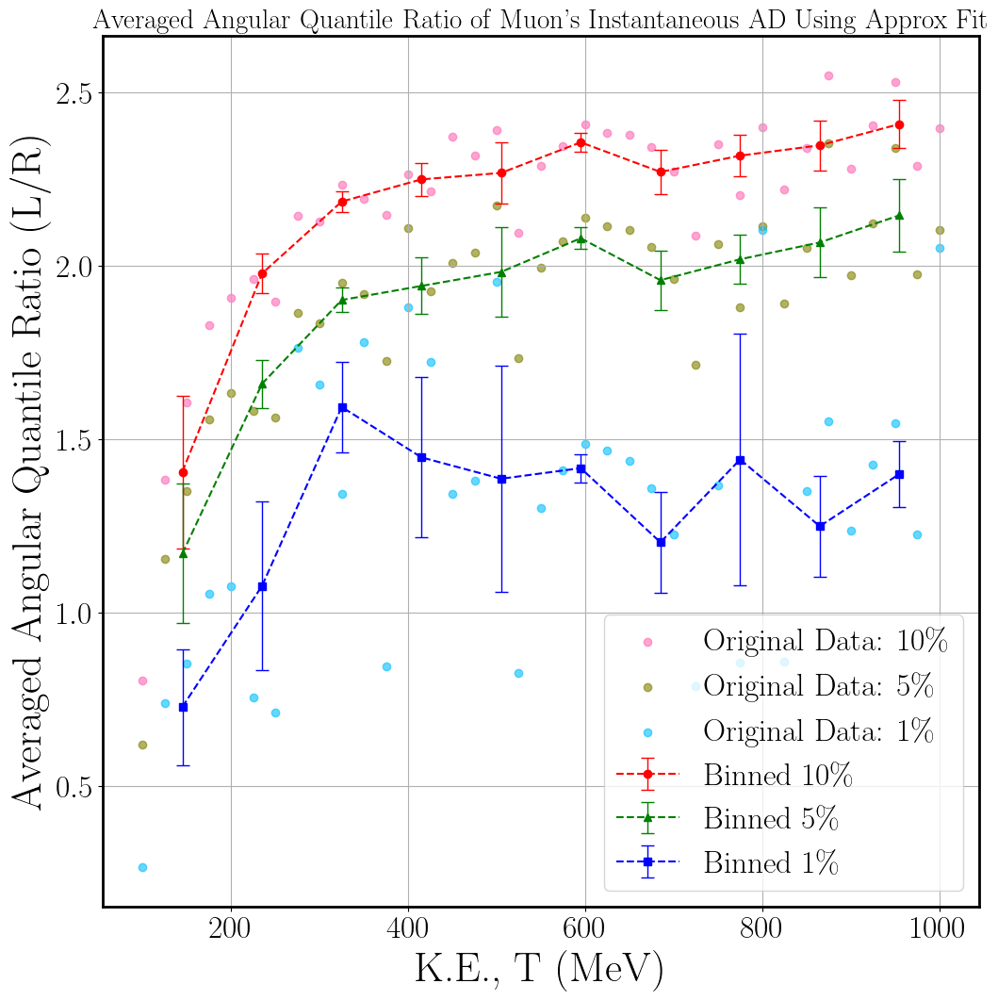

In [19]:
# Averaging elements within bins and then plotting these averages in Python can be achieved using libraries like NumPy and Matplotlib.
import numpy as np
import matplotlib.pyplot as plt

# 1. Generate or load your data
# For demonstration, let's create some sample data
np.random.seed(0) # for reproducibility
# x_data = np.random.rand(100) * 10 # x-values for binning
# y_data = 2 * x_data + np.random.randn(100) * 5 # y-values to be averaged

x_data = t # x-values for binning
y_data1 = np.array(nbyamups10) # y-values to be averaged
y_data2 = np.array(nbyamups05)
y_data3 = np.array(nbyamups01)
 
# 2. Define the bins
num_bins = 10
# You can define custom bin edges or let NumPy determine them
bin_edges = np.linspace(min(x_data), max(x_data), num_bins + 1)

# 3. Bin the data and calculate the mean for each bin
# Use np.digitize to assign each x_data point to a bin index
bin_indices = np.digitize(x_data, bin_edges)

# Calculate the mean of y_data for each bin
bin_means1 = []
bin_centers1 = []

bin_means2 = []
bin_centers2 = []

bin_means3 = []
bin_centers3 = []

elements_in_bins_10 = []
elements_in_bins_05 = []
elements_in_bins_01 = []

bin_means_10 = []
bin_means_05 = []
bin_means_01 = []


#10% Q.ratio
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin1 = y_data1[bin_indices == i]
    if len(elements_in_bin1) > 0: # Avoid division by zero for empty bins
        bin_means1.append(np.mean(elements_in_bin1))
        # Calculate bin center for plotting
        bin_centers1.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means1.append(np.nan)
        bin_centers1.append((bin_edges[i-1] + bin_edges[i]) / 2)
    elements_in_bins_10.append(elements_in_bin1)
    # bin_means_10.append(np.array(bin_means1[-1])) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_10, bin_means_10) 


#5% Q.ratio    
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin2 = y_data2[bin_indices == i]
    if len(elements_in_bin2) > 0: # Avoid division by zero for empty bins
        bin_means2.append(np.mean(elements_in_bin2))
        # Calculate bin center for plotting
        bin_centers2.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means2.append(np.nan)
        bin_centers2.append((bin_edges[i-1] + bin_edges[i]) / 2)
    elements_in_bins_05.append(elements_in_bin2)
    # bin_means_05.append(bin_means2[-1]) ##bin_means1[-1]: value of the last element of an array/list      
# print(elements_in_bins_05, bin_means_05)


#1% Q.ratio
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin3 = y_data3[bin_indices == i]
    if len(elements_in_bin3) > 0: # Avoid division by zero for empty bins
        bin_means3.append(np.mean(elements_in_bin3))
        # Calculate bin center for plotting
        bin_centers3.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means3.append(np.nan)
        bin_centers3.append((bin_edges[i-1] + bin_edges[i]) / 2)

    elements_in_bins_01.append(elements_in_bin3)
    # bin_means_01.append(bin_means3[-1]) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_01, bin_means_01)    


# Remove NaN values if you don't want to plot empty bins
bin_centers1 = np.array(bin_centers1)[~np.isnan(bin_means1)]
bin_means1 = np.array(bin_means1)[~np.isnan(bin_means1)]

bin_centers2 = np.array(bin_centers2)[~np.isnan(bin_means2)]
bin_means2 = np.array(bin_means2)[~np.isnan(bin_means2)]

bin_centers3 = np.array(bin_centers3)[~np.isnan(bin_means3)]
bin_means3 = np.array(bin_means3)[~np.isnan(bin_means3)]


# print(bin_means1, bin_means2, bin_means3)

# print(elements_in_bins_10, bin_means1)
# print(elements_in_bins_05, bin_means2)
# print(elements_in_bins_01, bin_means3)

#Jackknife resampling with my data 

def jackknife_statistic(data, statistic):
    n = len(data)
    jackknife_samples = np.zeros(n)

    for i in range(n):
        sample = np.delete(data, i)
        jackknife_samples[i] = statistic(sample)

    jackknife_mean = np.mean(jackknife_samples)
    variance = (n - 1) / n * np.sum((jackknife_samples - jackknife_mean)**2)
    bias = (n - 1) * (jackknife_mean - statistic(data))
    
    return jackknife_mean, variance, bias

# Example
# data = np.array([2, 4, 6, 8, 10])
#Real Data
data10 = elements_in_bins_10
data05 = elements_in_bins_05
data01 = elements_in_bins_01
# print("data10 = {}, data05 = {}, data01 = {}".format(data10, data05, data01))
stat = np.mean


# Initialize empty lists to store results for each bin
means_10, errs_10 = [], []
means_05, errs_05 = [], []
means_01, errs_01 = [], []

# Loop for 10% data
for bin_data in elements_in_bins_10:
    if len(bin_data) > 1: # Jackknife requires at least 2 points
        m, v, b = jackknife_statistic(bin_data, np.mean)
        means_10.append(m)
        errs_10.append(np.sqrt(v)) # Error bar is square root of variance
    else:
        means_10.append(np.nan)
        errs_10.append(np.nan)

# Loop for 5% data
for bin_data in elements_in_bins_05:
    if len(bin_data) > 1:
        m, v, b = jackknife_statistic(bin_data, np.mean)
        means_05.append(m)
        errs_05.append(np.sqrt(v))
    else:
        means_05.append(np.nan)
        errs_05.append(np.nan)

# Loop for 1% data
for bin_data in elements_in_bins_01:
    if len(bin_data) > 1:
        m, v, b = jackknife_statistic(bin_data, np.mean)
        means_01.append(m)
        errs_01.append(np.sqrt(v))
    else:
        means_01.append(np.nan)
        errs_01.append(np.nan)


#Plotting 

plt.figure(figsize=(12, 12))

plt.scatter(x_data, y_data1, alpha=0.6, c='hotpink', label='Original Data: 10\%')
plt.scatter(x_data, y_data2, alpha=0.6, c='olive', label='Original Data: 5\%')
plt.scatter(x_data, y_data3, alpha=0.6, c='deepskyblue', label='Original Data: 1\%')


# Define labels and colors for cleaner code
datasets = [
    (bin_centers1, means_10, errs_10, 'red', 'o', '10\%'),
    (bin_centers2, means_05, errs_05, 'green', '^', '5\%'),
    (bin_centers3, means_01, errs_01, 'blue', 's', '1\%')
]

for x, y, yerr, color, marker, label in datasets:
    # Convert to numpy arrays to handle indexing/NaNs
    x, y, yerr = np.array(x), np.array(y), np.array(yerr)
    mask = ~np.isnan(y)
    
    plt.errorbar(x[mask], y[mask], yerr=yerr[mask], 
                 fmt=marker, color=color, linestyle='--', 
                 capsize=5, elinewidth=1, label=f'Binned {label}') #f'Binned {label}'

plt.xlabel('K.E., T (MeV)', size=32) #(Binned Variable)
plt.ylabel('Averaged Angular Quantile Ratio (L/R)', size=32) # (Averaged Variable)')
plt.title('Averaged Angular Quantile Ratio of Muon\'s Instantaneous AD Using Approx Fit', size=21) #in Bins of K.E. 
plt.legend()
plt.grid(True)

# plt.savefig('binned_avg_nbyas_10_5_1_perc_approxfit_Cherenkov_iAD_Muon_allT_from_saved_data_jackknife_err_corrected', bbox_inches='tight') #_zoom
plt.show()

[0.75796532 0.76741698 0.77628968 0.78463315 0.79249149 0.79990401
 0.80690583 0.81352846 0.81980026 0.82574686 0.83139144 0.83675507
 0.8418569  0.84671442 0.8513436  0.85575908 0.85997431 0.86400164
 0.86785245 0.87153724 0.87506571 0.87844687 0.88168902 0.88479989
 0.88778668 0.89065607 0.89341428 0.89606712 0.89862002 0.90107804
 0.90344595 0.90572818 0.9079289  0.91005203 0.91210124 0.91407999
 0.91599153 0.91783893 0.91962507 0.92135268 0.92302433]
[4, 4, 4, 4, 4, 4, 4, 4, 4, 4]
[0.85793361 0.88891261 0.91060252 0.92642891 0.93835312 0.94757187
 0.95485213 0.96070526 0.96548344 0.96943599 0.97274358 0.97553983
 0.97792534 0.97997704 0.98175461 0.98330494 0.98466527 0.98586549
 0.98692983 0.98787809 0.98872659 0.98948888 0.99017626 0.99079826
 0.99136291 0.99187708 0.99234661 0.99277653 0.99317117 0.9935343
 0.99386919 0.9941787  0.99446532 0.99473127 0.99497848 0.99520868
 0.9954234 ]
[4, 4, 4, 4, 4, 4, 4, 4, 4, 4]


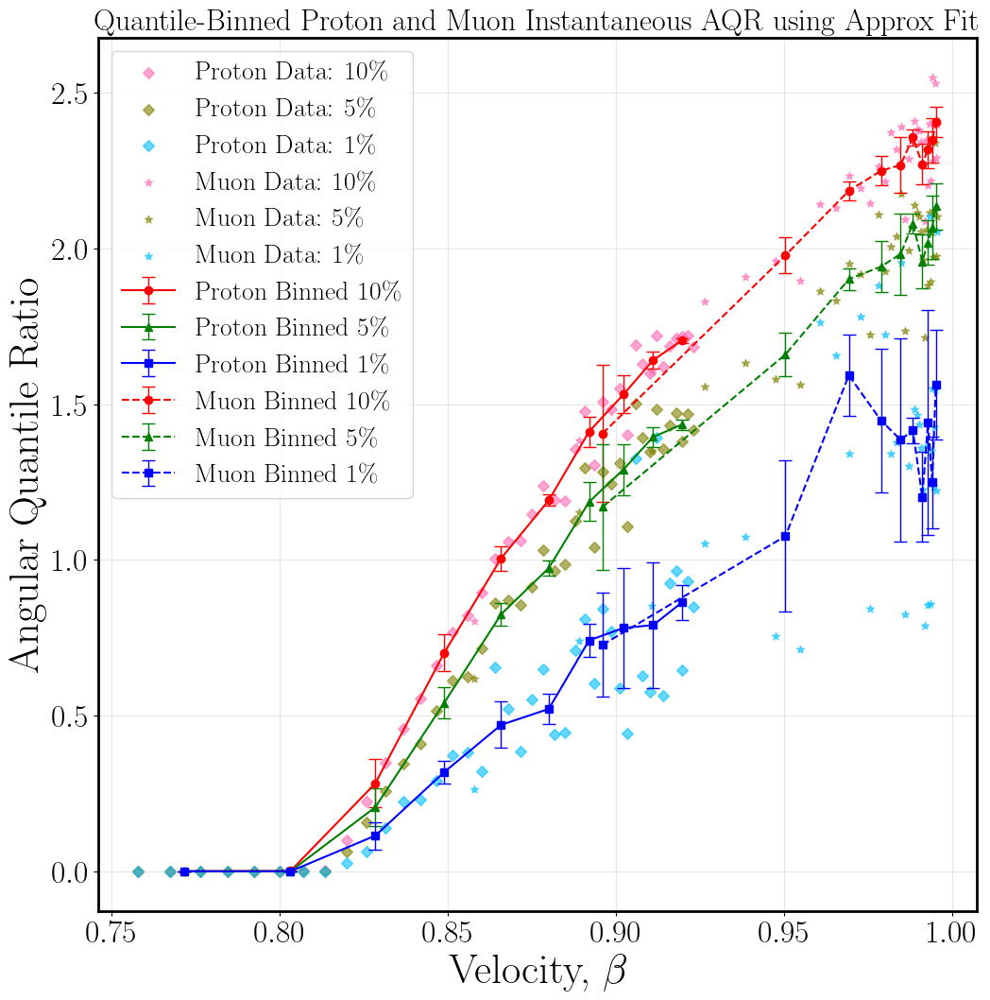

In [338]:
# 0. Definition 

# #Linear space in K.E.
# tp = np.linspace(500, 1500, 41)
# tm = np.linspace(100, 1000, 37)
# # print(t)

#Mass of the particle travelling
mp = 938 #Proton's mass
mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²

betap  = np.sqrt(1 - (1/(1 + tp/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD
betamu  = np.sqrt(1 - (1/(1 + tm/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

# print (tp, betap, np.round(betap, 4))
# print (tm, betamu, np.round(betamu, 4))


# 1. Define x_data (Velocity) & y_data (AQR)
x_data1 = betap 
print(x_data1)

y_data1p = np.array(nbyapps10) # y-values to be averaged
y_data2p = np.array(nbyapps05)
y_data3p = np.array(nbyapps01)


# 2. CREATE QUANTILE BINS
num_bins = 10
# This creates edges so that ~10% of the data points fall into each bin
bin_edges = np.quantile(x_data1, np.linspace(0, 1, num_bins + 1))

# 3. DIGITIZE & CALCULATE CENTERS
bin_indices = np.digitize(x_data1, bin_edges)
# Handle the edge case where a point equals the max value
bin_indices[bin_indices > num_bins] = num_bins

# We calculate the average x-position (beta) within each bin for more accuracy
bin_centersp = []
for i in range(1, num_bins + 1):
    points_in_bin = x_data1[bin_indices == i]
    if len(points_in_bin) > 0:
        bin_centersp.append(np.mean(points_in_bin))
    else:
        # Fallback to geometric center if bin is somehow empty
        bin_centersp.append((bin_edges[i-1] + bin_edges[i]) / 2)

bin_centersp = np.array(bin_centersp)

# 4. PLOTTING LOOP (Now with equal data counts per bin)
plt.figure(figsize=(12, 12))

plt.scatter(x_data1, y_data1p, alpha=0.6, c='hotpink', label='Proton Data: 10\%', marker='D')
plt.scatter(x_data1, y_data2p, alpha=0.6, c='olive', label='Proton Data: 5\%', marker='D')
plt.scatter(x_data1, y_data3p, alpha=0.6, c='deepskyblue', label='Proton Data: 1\%', marker='D')

print([len(b) for b in elements_in_bins_10h])


datasets = [
    (y_data1p, 'red', 'o', '10\%'),
    (y_data2p, 'green', '^', '5\%'),
    (y_data3p, 'blue', 's', '1\%')
]

for y_vals, color, marker, label in datasets:
    meansp, errsp = [], []
    
    for i in range(1, num_bins + 1):
        bin_data = y_vals[bin_indices == i]
        
        if len(bin_data) > 1:
            m, v, b = jackknife_statistic(bin_data, np.mean)
            meansp.append(m)
            errsp.append(np.sqrt(v))
        else:
            meansp.append(np.nan)
            errsp.append(np.nan)
            
    # Convert to arrays for masking
    meansp, errsp = np.array(meansp), np.array(errsp)
    mask = ~np.isnan(meansp)
    
    plt.errorbar(bin_centersp[mask], meansp[mask], yerr=errsp[mask], 
                 fmt=marker, color=color, linestyle='solid', 
                 capsize=5, elinewidth=1, label=f'Proton Binned {label}')



# 1. Define x_data (Velocity) & y_data (AQR)
x_data2 = betamu 
print(x_data2)

y_data1mu = np.array(nbyamups10) # y-values to be averaged
y_data2mu = np.array(nbyamups05)
y_data3mu = np.array(nbyamups01)


# 2. CREATE QUANTILE BINS
num_bins = 10
# This creates edges so that ~10% of the data points fall into each bin
bin_edges = np.quantile(x_data2, np.linspace(0, 1, num_bins + 1))

# 3. DIGITIZE & CALCULATE CENTERS
bin_indices = np.digitize(x_data2, bin_edges)
# Handle the edge case where a point equals the max value
bin_indices[bin_indices > num_bins] = num_bins


# We calculate the average x-position (beta) within each bin for more accuracy
bin_centersmu = []
for i in range(1, num_bins + 1):
    points_in_bin = x_data2[bin_indices == i]
    if len(points_in_bin) > 0:
        bin_centersmu.append(np.mean(points_in_bin))
    else:
        # Fallback to geometric center if bin is somehow empty
        bin_centersmu.append((bin_edges[i-1] + bin_edges[i]) / 2)

bin_centersmu = np.array(bin_centersmu)

# # 4. PLOTTING LOOP (Now with equal data counts per bin)
# plt.figure(figsize=(12, 12))


plt.scatter(x_data2, y_data1mu, alpha=0.6, c='hotpink', label='Muon Data: 10\%', marker='*')
plt.scatter(x_data2, y_data2mu, alpha=0.6, c='olive', label='Muon Data: 5\%', marker='*')
plt.scatter(x_data2, y_data3mu, alpha=0.6, c='deepskyblue', label='Muon Data: 1\%', marker='*')

print([len(b) for b in elements_in_bins_10h])


datasets = [
    (y_data1mu, 'red', 'o', '10\%'),
    (y_data2mu, 'green', '^', '5\%'),
    (y_data3mu, 'blue', 's', '1\%')
]

for y_vals, color, marker, label in datasets:
    meansmu, errsmu = [], []
    
    for i in range(1, num_bins + 1):
        bin_data = y_vals[bin_indices == i]
        
        if len(bin_data) > 1:
            m, v, b = jackknife_statistic(bin_data, np.mean)
            meansmu.append(m)
            errsmu.append(np.sqrt(v))
        else:
            meansmu.append(np.nan)
            errsmu.append(np.nan)
            
    # Convert to arrays for masking
    meansmu, errsmu = np.array(meansmu), np.array(errsmu)
    mask = ~np.isnan(meansmu)
    
    plt.errorbar(bin_centersmu[mask], meansmu[mask], yerr=errsmu[mask], 
                 fmt=marker, color=color, linestyle='--', 
                 capsize=5, elinewidth=1, label=f'Muon Binned {label}')

plt.xlabel(r'Velocity, $\beta$', size=32)
plt.ylabel('Angular Quantile Ratio', size=32)
plt.title('Quantile-Binned Proton and Muon Instantaneous AQR using Approx Fit', size=23) #with Jackknife Errors 
plt.legend(fontsize=20)
plt.grid(True, alpha=0.3)

# plt.savefig('quantile_binned_Proton_Muon_Cherenkov_iAD_AQR_10_5_1_perc_approxfit_allbetas_w_jackknife_err_corrected2', bbox_inches='tight') #_zoom
plt.show()


# Muon AQR from IAD (HO fit + Comparisons)

[ 100.  125.  150.  175.  200.  225.  250.  275.  300.  325.  350.  375.
  400.  425.  450.  475.  500.  525.  550.  575.  600.  625.  650.  675.
  700.  725.  750.  775.  800.  825.  850.  875.  900.  925.  950.  975.
 1000.]
K.E.=100.0, beta=0.8579336051517742, dp=28.0, theta_windowh=1.2730958815561462, thetaminh=18.316822007976537, min_windowh=19.589917889532682, max_windowh=29.774684941981853, thetamaxh=31.047780823537998
The element closest to 18.316822007976537 is at index: 407
The closest element is: 18.32416208104052
The element closest to 19.589917889532682 is at index: 435
The closest element is: 19.584792396198097
The element closest to 29.774684941981853 is at index: 661
The closest element is: 29.759879939969984
The element closest to 31.047780823537998 is at index: 690
The closest element is: 31.065532766383193
100.0 MeV Muon: 10 % Normal Quantile = [ 114.25299312  115.15805741  116.06836498  116.98393738  117.90479619
  118.83096312  119.76245992 3339.62941919 3365.69976

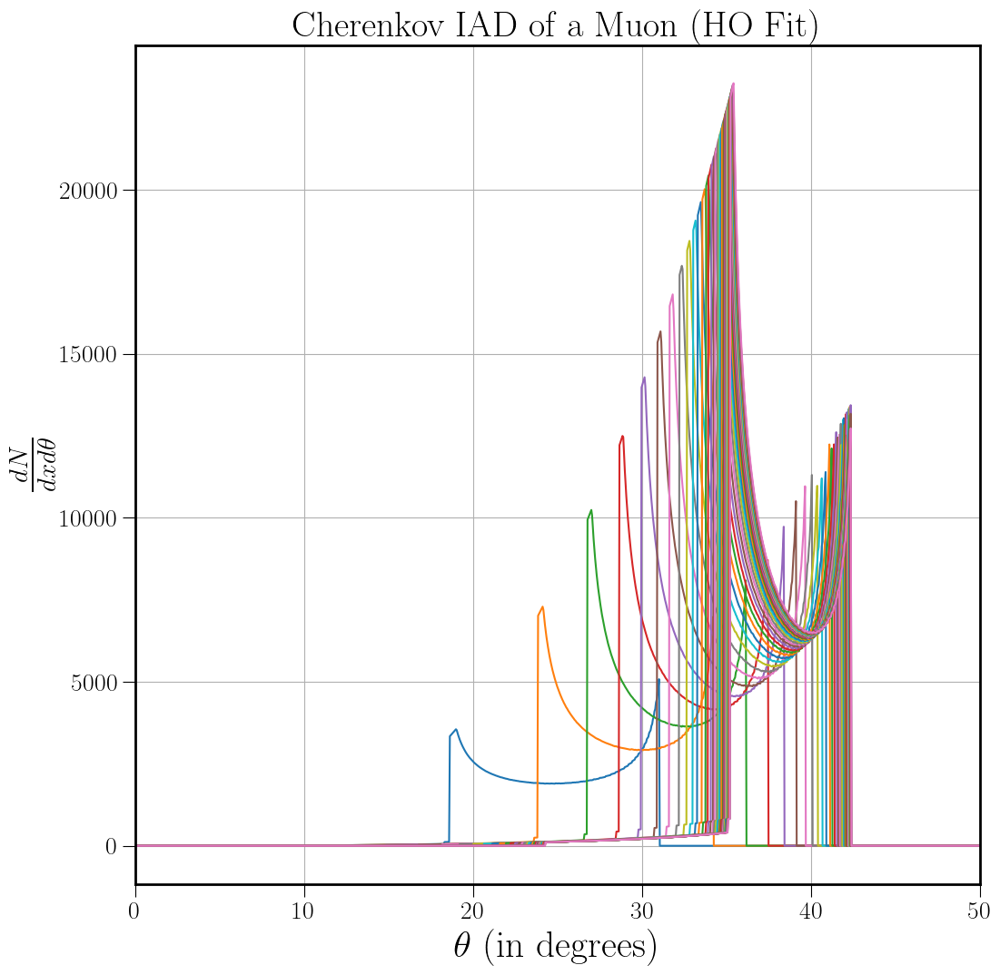

In [31]:
#HO Fit: Muon
#Import libraries
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np


#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

# matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
# plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'$\theta$ (in degrees)', size= 30)
ax.set_ylabel(r'$\frac{dN}{dx d\theta}$', size= 30)
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Cherenkov IAD of a Muon (HO Fit)')
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)


# #Defining integration window

# theta_window = (thetamax - thetamin)/10 #10% of databins # dp = (thetamax - thetamin)/(180/(2*2000)) 

# dp = np.round(2000*2*theta_window/180) #no. of datapoints within theta_window

# min_window = thetamin + theta_window

# max_window = thetamax - theta_window 



#Define a function to find the index of the desired element

def find_nearest_index_numpy(arr, value):
    """
    Finds the index of the element closest to 'value' in a NumPy array.
    """
    arr = np.array(arr)  # Ensure it's a NumPy array
    idx = np.abs(arr - value).argmin()
    return idx

#Explanation:
# np.abs(arr - value) calculates the absolute difference between each element in the array and the value.
# .argmin() returns the index of the minimum value in the resulting array of absolute differences, which corresponds to the element closest to value.

#Linear space in K.E.
t = np.linspace(100, 1000, 37)
print(t)

# mp = 938  #Proton's mass in MeV
# betap  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD
mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²

# print (t, betap, np.round(betap,4))

n_peakr = 1.3605
n_500 = 1.2278

cos_ang_min = []
con_ang_maxn = []
thetamax = []
thetamin = []


# Load the .npz file
#HO fit
# pdata500ho = np.load('IAD_new_data_for_PID\\iCherenkovdata_p_500_ho.npz')

# Create an empty dictionary to store the data.
data_dict = {}

# itotalts = []
# inormalts = []
# ianomts = []

# itotalbts = []

itotalths = []
inormalths = []
ianomths = []

# itotalbts = []

itpnormhs10 = []
itpanomhs10 = []
nbyamuhs10 = []
abynmuhs10 = []

itpnormhs05 = []
itpanomhs05 = []
nbyamuhs05 = []
abynmuhs05 = []

itpnormhs01 = []
itpanomhs01 = []
nbyamuhs01 = []
abynmuhs01 = []

# Loop through your values
for val in t:
    # Use an f-string to generate the key for the dictionary. (HO)
    # key = f"pdata_{val:.0f}_ho"
    ho = f"mudata_{val:.0f}_ho"
    
    # Use another f-string to generate the filename for loading.
    filename2 = fr"IAD_new_data_for_PID\iCherenkovdata_mu_{val:.0f}_ho.npz"
    
    # Store the loaded data in the dictionary using the generated key.
    # data_dict[key] = np.load(filename)
    data_dict[ho] = np.load(filename2) 

    costhetah = data_dict[ho]['costheta']
    thetah = data_dict[ho]['theta']
    itotalh = data_dict[ho]['itotalho']
    inormalh = data_dict[ho]['inormalho']
    ianomh = data_dict[ho]['ianomalousho']
    thetadegh = thetah*(180/np.pi) 
    itotalth = itotalh*np.sin(thetah)
    inormalth = inormalh*np.sin(thetah)
    ianomth = ianomh*np.sin(thetah)
    # print(costheta)
    
    ax.plot(thetadegh, itotalth, label='Total')
    # ax.plot(thetadeg, inormalt, label='Normal')
    # ax.plot(thetadeg, ianomt, label='Anomalous')

    
    # itotalts.append(itotalt.tolist())  
    # inormalts.append(inormalt)
    # ianomts.append(ianomt)
    
    itotalths.append(itotalth)

    # i  = np.sqrt(1 - (1/(1 + val/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD
    i  = np.sqrt(1 - (1/(1 + val/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD


    #Quantile Window: Integration Stepsize 
    
    cos_ang_minh = 1/(i * n_peakr)
    thetamaxh = np.arccos(cos_ang_minh)*(180/np.pi)
    
    cos_ang_maxh = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
    # cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
    thetaminh = np.arccos(cos_ang_maxh)*(180/np.pi)

    #Defining integration window

    theta_windowh10 = (thetamaxh - thetaminh)/10 #10% of databins # dp = (thetamax - thetamin)/(180/(2*2000))
    theta_windowh05 = (thetamaxh - thetaminh)/20 #5% of databins # dp = (thetamax - thetamin)/(180/(2*2000))
    theta_windowh01 = (thetamaxh - thetaminh)/100 #1% of databins # dp = (thetamax - thetamin)/(180/(2*2000))
    
    dph10 = np.round(2000*2*theta_windowh10/180) #no. of datapoints within theta_window
    dph05 = np.round(2000*2*theta_windowh05/180) #no. of datapoints within theta_window
    dph01 = np.round(2000*2*theta_windowh01/180) #no. of datapoints within theta_window
    
    min_windowh10 = thetaminh + theta_windowh10
    max_windowh10 = thetamaxh - theta_windowh10 

    min_windowh05 = thetaminh + theta_windowh05
    max_windowh05 = thetamaxh - theta_windowh05 

    min_windowh01 = thetaminh + theta_windowh01
    max_windowh01 = thetamaxh - theta_windowh01 

    
    # print(i, thetamin, min_window, max_window, thetamax)
    print('K.E.={}, beta={}, dp={}, theta_windowh={}, thetaminh={}, min_windowh={}, max_windowh={}, thetamaxh={}'.format(val, i, dph10, theta_windowh10, thetaminh, min_windowh10, max_windowh10, thetamaxh)) 
    
    
    # Example usage:
    my_array = thetadegh

    #10% Quantile
    
    #Theta_min
    min_valueh = thetaminh
    min_indexh = find_nearest_index_numpy(my_array, min_valueh)
    print(f"The element closest to {min_valueh} is at index: {min_indexh}")
    print(f"The closest element is: {my_array[min_indexh]}")
    
    #Min_window
    min_window_valueh = thetaminh + theta_windowh10
    min_window_indexh = find_nearest_index_numpy(my_array, min_window_valueh)
    print(f"The element closest to {min_window_valueh} is at index: {min_window_indexh}")
    print(f"The closest element is: {my_array[min_window_indexh]}")
    
    #Max_window
    max_window_valueh = thetamaxh - theta_windowh10
    max_window_indexh = find_nearest_index_numpy(my_array, max_window_valueh)
    print(f"The element closest to {max_window_valueh} is at index: {max_window_indexh}")
    print(f"The closest element is: {my_array[max_window_indexh]}")
    
    #Theta_max
    max_valueh = thetamaxh
    max_indexh = find_nearest_index_numpy(my_array, max_valueh)
    print(f"The element closest to {max_valueh} is at index: {max_indexh}")
    print(f"The closest element is: {my_array[max_indexh]}")
    
    # Sum i-th to j-th elements of an array) 
    
    itotalnormh10 = itotalth[min_indexh:min_window_indexh]    
    itotalanomh10 = itotalth[max_window_indexh:max_indexh]
    
    print('{} MeV Muon: 10 % Normal Quantile = {}, 10 % Anomalous Quantile = {}'.format(val, itotalnormh10, itotalanomh10))
    
    # itnorm = sum(itotalnorm)* (thetamin + min_window)/2 
    # itanom = sum(itotalanom)* (max_window + thetamax)/2 
    
    # print('For {} MeV Proton: theta_window/dp = {}'.format(val, theta_window/dp))
    
    itnormh10 = sum(itotalnormh10) * (theta_windowh10/dph10) 
    itanomh10 = sum(itotalanomh10) * (theta_windowh10/dph10) 
    
    nbyamuh10 = itnormh10 / itanomh10
    abynmuh10 = itanomh10 / itnormh10
    
    print('{} MeV Muon: Sum of 10 % Normal Quantile = {}, Sum of 10 % Anomalous Quantile = {}, 10 %  Normal/Anomalous = {}, 10 % Anomalous/Normal = {}'.format(val, itnormh10, itanomh10, nbyamuh10, 1/nbyamuh10))

    # itotalts.append(itotalt.tolist())  

    itpnormhs10.append(itnormh10)
    itpanomhs10.append(itanomh10)
    nbyamuhs10.append(nbyamuh10)
    abynmuhs10.append(abynmuh10)

    #5% Quantile

    print('K.E.={}, beta={}, dp={}, theta_windowh={}, thetaminh={}, min_windowh={}, max_windowh={}, thetamaxh={}'.format(val, i, dph05, theta_windowh05, thetaminh, min_windowh05, max_windowh05, thetamaxh)) 
    
    
    #Theta_min
    min_valueh = thetaminh
    min_indexh = find_nearest_index_numpy(my_array, min_valueh)
    print(f"The element closest to {min_valueh} is at index: {min_indexh}")
    print(f"The closest element is: {my_array[min_indexh]}")
    
    #Min_window
    min_window_valueh = thetaminh + theta_windowh05
    min_window_indexh = find_nearest_index_numpy(my_array, min_window_valueh)
    print(f"The element closest to {min_window_valueh} is at index: {min_window_indexh}")
    print(f"The closest element is: {my_array[min_window_indexh]}")
    
    #Max_window
    max_window_valueh = thetamaxh - theta_windowh05
    max_window_indexh = find_nearest_index_numpy(my_array, max_window_valueh)
    print(f"The element closest to {max_window_valueh} is at index: {max_window_indexh}")
    print(f"The closest element is: {my_array[max_window_indexh]}")
    
    #Theta_max
    max_valueh = thetamaxh
    max_indexh = find_nearest_index_numpy(my_array, max_valueh)
    print(f"The element closest to {max_valueh} is at index: {max_indexh}")
    print(f"The closest element is: {my_array[max_indexh]}")
    
    # Sum i-th to j-th elements of an array) 
    
    itotalnormh05 = itotalth[min_indexh:min_window_indexh]     
    itotalanomh05 = itotalth[max_window_indexh:max_indexh]
    
    print('{} MeV Muon: 5 % Normal Quantile = {}, 5 % Anomalous Quantile = {}'.format(val, itotalnormh05, itotalanomh05))
    
    # itnorm = sum(itotalnorm)* (thetamin + min_window)/2 
    # itanom = sum(itotalanom)* (max_window + thetamax)/2 
    
    # print('For {} MeV Proton: theta_window/dp = {}'.format(val, theta_window/dp))
    
    itnormh05 = sum(itotalnormh05) * (theta_windowh05/dph05) 
    itanomh05 = sum(itotalanomh05) * (theta_windowh05/dph05) 
    
    nbyamuh05 = itnormh05 / itanomh05
    abynmuh05 = itanomh05 / itnormh05
    
    print('{} MeV Muon: Sum of 5 % Normal Quantile = {}, Sum of 5 % Anomalous Quantile = {}, 5 % Normal/Anomalous = {}, 5 % Anomalous/Normal = {}'.format(val, itnormh05, itanomh05, nbyamuh05, 1/nbyamuh05))

    # itotalts.append(itotalt.tolist())  

    itpnormhs05.append(itnormh05)
    itpanomhs05.append(itanomh05)
    nbyamuhs05.append(nbyamuh05)
    abynmuhs05.append(abynmuh05)

    #1% Quantile

    print('K.E.={}, beta={}, dp={}, theta_windowh={}, thetaminh={}, min_windowh={}, max_windowh={}, thetamaxh={}'.format(val, i, dph01, theta_windowh01, thetaminh, min_windowh01, max_windowh01, thetamaxh)) 
    
    
    #Theta_min
    min_valueh = thetaminh
    min_indexh = find_nearest_index_numpy(my_array, min_valueh)
    print(f"The element closest to {min_valueh} is at index: {min_indexh}")
    print(f"The closest element is: {my_array[min_indexh]}")
    
    #Min_window
    min_window_valueh = thetaminh + theta_windowh01
    min_window_indexh = find_nearest_index_numpy(my_array, min_window_valueh)
    print(f"The element closest to {min_window_valueh} is at index: {min_window_indexh}")
    print(f"The closest element is: {my_array[min_window_indexh]}")
    
    #Max_window
    max_window_valueh = thetamaxh - theta_windowh01
    max_window_indexh = find_nearest_index_numpy(my_array, max_window_valueh)
    print(f"The element closest to {max_window_valueh} is at index: {max_window_indexh}")
    print(f"The closest element is: {my_array[max_window_indexh]}")
    
    #Theta_max
    max_valueh = thetamaxh
    max_indexh = find_nearest_index_numpy(my_array, max_valueh)
    print(f"The element closest to {max_valueh} is at index: {max_indexh}")
    print(f"The closest element is: {my_array[max_indexh]}")
    
    # Sum i-th to j-th elements of an array) 
    
    itotalnormh01 = itotalth[min_indexh:min_window_indexh] 
    itotalanomh01 = itotalth[max_window_indexh:max_indexh]
    
    print('{} MeV Muon: 1 % Normal Quantile = {}, 1 % Anomalous Quantile = {}'.format(val, itotalnormh01, itotalanomh01))
    
    # itnorm = sum(itotalnorm)* (thetamin + min_window)/2 
    # itanom = sum(itotalanom)* (max_window + thetamax)/2 
    
    # print('For {} MeV Proton: theta_window/dp = {}'.format(val, theta_window/dp))
    
    itnormh01 = sum(itotalnormh01) * (theta_windowh01/dph01) 
    itanomh01 = sum(itotalanomh01) * (theta_windowh01/dph01) 
    
    nbyamuh01 = itnormh01 / itanomh01
    abynmuh01 = itanomh01 / itnormh01
    
    print('{} MeV Muon: Sum of 1 % Normal Quantile = {}, Sum of 1 % Anomalous Quantile = {}, 1 % Normal/Anomalous = {}, 1 % Anomalous/Normal = {}'.format(val, itnormh01, itanomh01, nbyamuh01, 1/nbyamuh01))

    # itotalts.append(itotalt.tolist())  

    itpnormhs01.append(itnormh01)
    itpanomhs01.append(itanomh01)
    nbyamuhs01.append(nbyamuh01)
    abynmuhs01.append(abynmuh01)



# print(np.shape(itpnormps05), np.shape(itpanomps05))
# print(itotalts.flatten())


################################################################################################################################
# ax.legend(fontsize=18)
ax.set_xlim(0,50)
ax.grid()

# plt.savefig('Cherenkov_IAD_Muon_allTs_new_data_ho', bbox_inches='tight')
# plt.savefig('Cherenkov_IAD_Muon_500_600_800_1000_MeV_new_data_ho', bbox_inches='tight')
# plt.savefig('Cherenkov_IAD_Muon_allTs_new_data_babicz', bbox_inches='tight')
# plt.savefig('Cherenkov_IAD_Muon_allTs_new_data_ho', bbox_inches='tight')

# Close the file
# ho.close()
# pdata500ho.close()
# pdata800ho.close()
# pdata1000ho.close()

In [124]:
# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'K.E., T (MeV)', size= 30)
ax.set_ylabel(r'Angular Quantile Ratio (L/R)', size= 30) #$\frac{N}{A}$
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Cherenkov Angular Quantile Ratio of Muons (HO Fit)')
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)
ax.plot(t, nbyamuhs10, linewidth=4, c='r', label='$10 \%$')
ax.plot(t, nbyamuhs05, linewidth=4, c='g', label='$5 \%$')
ax.plot(t, nbyamuhs01, linewidth=4, c='b', label='$1 \%$')
ax.grid()
ax.legend()
# plt.savefig('nbyas_10_5_1_perc_hofit_Cherenkov_IAD_Muon_allTs_from_saved_data', bbox_inches='tight')


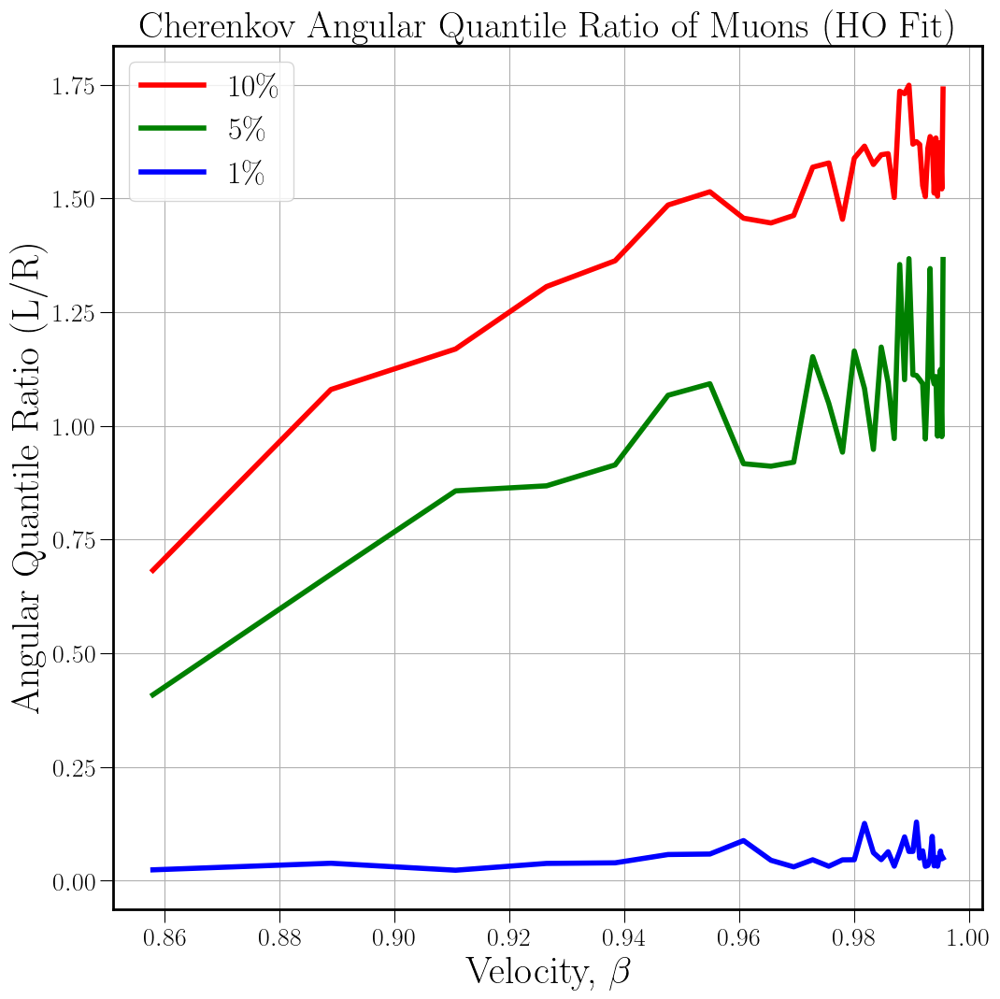

In [33]:
#Linear space in K.E.
tp = np.linspace(500, 1500, 41)
tm = np.linspace(100, 1000, 37)
# print(t)

#Mass of the particle travelling
mp = 938 #Proton's mass
mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²

betap  = np.sqrt(1 - (1/(1 + tp/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD
betamu  = np.sqrt(1 - (1/(1 + tm/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

# print (tp, betap, np.round(betap, 4))
# print (tm, betamu, np.round(betamu, 4))

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'Velocity, $\beta$', size= 30)
ax.set_ylabel(r'Angular Quantile Ratio (L/R)', size= 30) #$\frac{N}{A}$
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Cherenkov Angular Quantile Ratio of Muons (HO Fit)')
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)
ax.plot(betamu, nbyamuhs10, linewidth=4, c='r', label='$10 \%$')
ax.plot(betamu, nbyamuhs05, linewidth=4, c='g', label='$5 \%$')
ax.plot(betamu, nbyamuhs01, linewidth=4, c='b', label='$1 \%$')
ax.grid()
ax.legend()
# plt.savefig('nbyas_10_5_1_perc_hofit_Cherenkov_IAD_Muon_allbetas_from_saved_data', bbox_inches='tight')

plt.show()

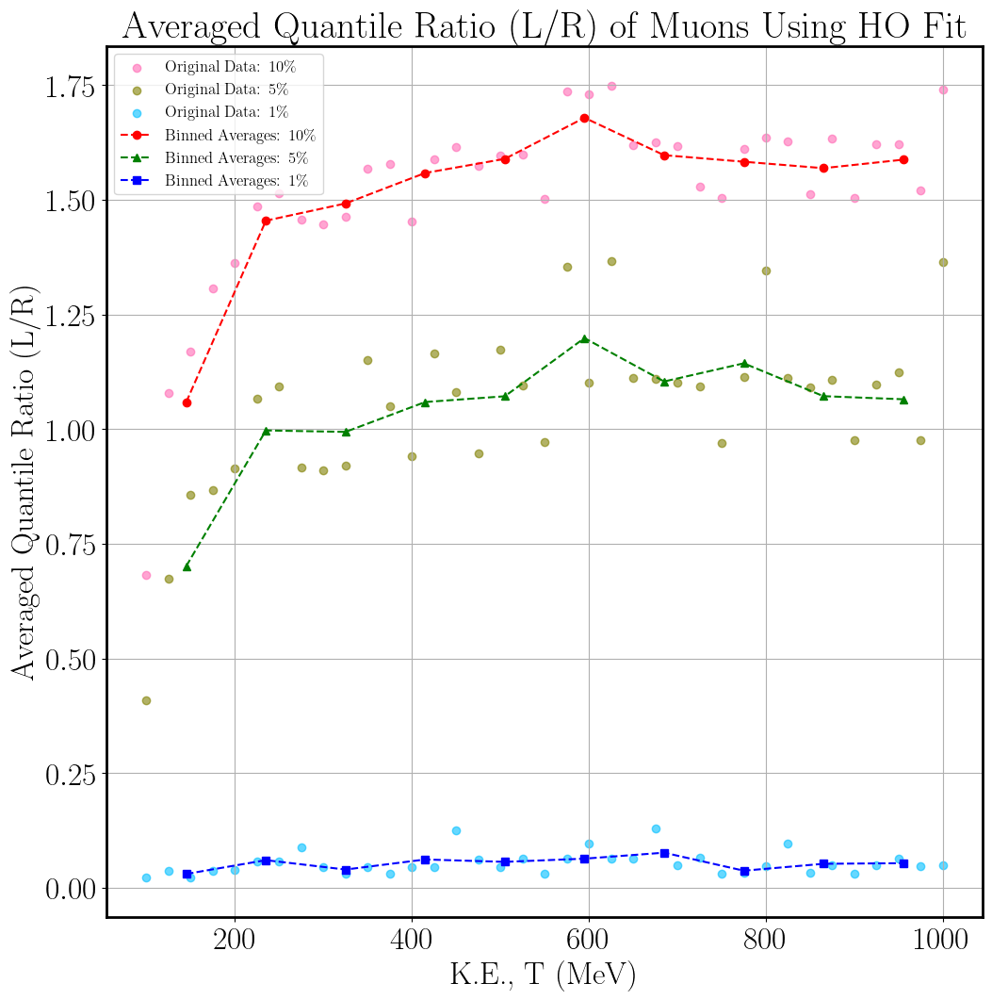

In [128]:
# Averaging elements within bins and then plotting these averages in Python can be achieved using libraries like NumPy and Matplotlib.
import numpy as np
import matplotlib.pyplot as plt

# 1. Generate or load your data
# For demonstration, let's create some sample data
np.random.seed(0) # for reproducibility
# x_data = np.random.rand(100) * 10 # x-values for binning
# y_data = 2 * x_data + np.random.randn(100) * 5 # y-values to be averaged

x_data = t # x-values for binning
y_data4h = np.array(nbyamuhs10) # y-values to be averaged
y_data5h = np.array(nbyamuhs05)
y_data6h = np.array(nbyamuhs01)
 
# 2. Define the bins
num_bins = 10
# You can define custom bin edges or let NumPy determine them
bin_edges = np.linspace(min(x_data), max(x_data), num_bins + 1)

# 3. Bin the data and calculate the mean for each bin
# Use np.digitize to assign each x_data point to a bin index
bin_indices = np.digitize(x_data, bin_edges)

# Calculate the mean of y_data for each bin
bin_means4h = []
bin_centers4h = []

bin_means5h = []
bin_centers5h = []

bin_means6h = []
bin_centers6h = []

for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin4h = y_data4h[bin_indices == i]
    if len(elements_in_bin4h) > 0: # Avoid division by zero for empty bins
        bin_means4h.append(np.mean(elements_in_bin4h))
        # Calculate bin center for plotting
        bin_centers4h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means4h.append(np.nan)
        bin_centers4h.append((bin_edges[i-1] + bin_edges[i]) / 2)

for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin5h = y_data5h[bin_indices == i]
    if len(elements_in_bin5h) > 0: # Avoid division by zero for empty bins
        bin_means5h.append(np.mean(elements_in_bin5h))
        # Calculate bin center for plotting
        bin_centers5h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means5h.append(np.nan)
        bin_centers5h.append((bin_edges[i-1] + bin_edges[i]) / 2)

for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin6h = y_data6h[bin_indices == i]
    if len(elements_in_bin6h) > 0: # Avoid division by zero for empty bins
        bin_means6h.append(np.mean(elements_in_bin6h))
        # Calculate bin center for plotting
        bin_centers6h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means6h.append(np.nan)
        bin_centers6h.append((bin_edges[i-1] + bin_edges[i]) / 2)

# Remove NaN values if you don't want to plot empty bins
bin_centers4h = np.array(bin_centers4h)[~np.isnan(bin_means4h)]
bin_means4h = np.array(bin_means4h)[~np.isnan(bin_means4h)]

bin_centers5h = np.array(bin_centers5h)[~np.isnan(bin_means5h)]
bin_means5h = np.array(bin_means5h)[~np.isnan(bin_means5h)]

bin_centers6h = np.array(bin_centers6h)[~np.isnan(bin_means6h)]
bin_means6h = np.array(bin_means6h)[~np.isnan(bin_means6h)]

# 4. Plot the results
plt.figure(figsize=(12, 12))

plt.scatter(x_data, y_data4h, alpha=0.6, c='hotpink', label='Original Data: 10\%')
plt.scatter(x_data, y_data5h, alpha=0.6, c='olive', label='Original Data: 5\%')
plt.scatter(x_data, y_data6h, alpha=0.6, c='deepskyblue', label='Original Data: 1\%')

plt.plot(bin_centers4h, bin_means4h, color='red', marker='o', linestyle='--', label='Binned Averages: 10\%')
plt.plot(bin_centers5h, bin_means5h, color='green', marker='^', linestyle='--', label='Binned Averages: 5\%')
plt.plot(bin_centers6h, bin_means6h, color='blue', marker='s', linestyle='--', label='Binned Averages: 1\%')

plt.xlabel('K.E., T (MeV)') #(Binned Variable)
plt.ylabel('Averaged Quantile Ratio (L/R)') # (Averaged Variable)')
plt.title('Averaged Quantile Ratio (L/R) of Muons Using HO Fit') #in Bins of K.E. 
plt.legend(fontsize=12)
plt.grid(True)

# plt.savefig('binned_avg_nbyas_10_5_1_perc_hofit_Cherenkov_IAD_Muon_allT_from_saved_data', bbox_inches='tight') #_zoom
plt.show()

[array([0.68220268, 1.07971215, 1.16883071, 1.30604103]), array([1.36272177, 1.48531254, 1.51445545, 1.45635908]), array([1.44586965, 1.46239273, 1.56849772]), array([1.57776796, 1.45392879, 1.58832683, 1.61476468]), array([1.57443226, 1.59581291, 1.59814952]), array([1.50193625, 1.73548743, 1.73006379, 1.74868982]), array([1.61914257, 1.62456483, 1.6182649 , 1.52802087]), array([1.50361503, 1.61023803, 1.63581026]), array([1.62772384, 1.51164291, 1.63275282, 1.50457527]), array([1.62167077, 1.6205612 , 1.5207893 ])] [1.05919664 1.45471221 1.49225336 1.55869706 1.58946489 1.67904432
 1.59749829 1.58322111 1.56917371 1.58767376]
[array([0.40848356, 0.67344736, 0.85686505, 0.86794867]), array([0.91390152, 1.06698457, 1.09237098, 0.9165793 ]), array([0.91105838, 0.91990426, 1.15190092]), array([1.04931221, 0.94188778, 1.16444369, 1.08189421]), array([0.94798902, 1.17301336, 1.09491838]), array([0.97191421, 1.35451503, 1.10128737, 1.36737275]), array([1.11218524, 1.11060811, 1.10150717, 1.

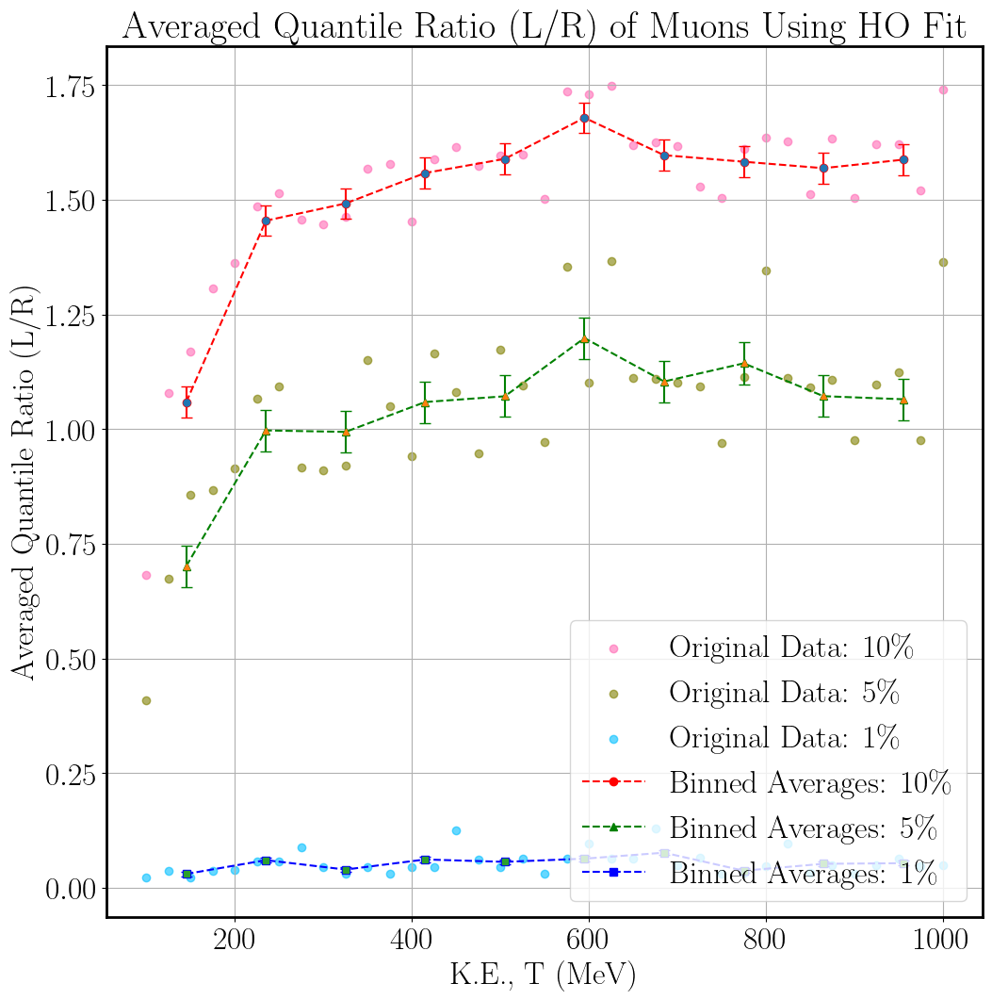

In [17]:
# Averaging elements within bins and then plotting these averages in Python can be achieved using libraries like NumPy and Matplotlib.
import numpy as np
import matplotlib.pyplot as plt

# 1. Generate or load your data
# For demonstration, let's create some sample data
np.random.seed(0) # for reproducibility
# x_data = np.random.rand(100) * 10 # x-values for binning
# y_data = 2 * x_data + np.random.randn(100) * 5 # y-values to be averaged

x_data = tm # x-values for binning
y_data4h = np.array(nbyamuhs10) # y-values to be averaged
y_data5h = np.array(nbyamuhs05)
y_data6h = np.array(nbyamuhs01)
 
# 2. Define the bins
num_bins = 10
# You can define custom bin edges or let NumPy determine them
bin_edges = np.linspace(min(x_data), max(x_data), num_bins + 1)

# 3. Bin the data and calculate the mean for each bin
# Use np.digitize to assign each x_data point to a bin index
bin_indices = np.digitize(x_data, bin_edges)

# Calculate the mean of y_data for each bin
bin_means4h = []
bin_centers4h = []

bin_means5h = []
bin_centers5h = []

bin_means6h = []
bin_centers6h = []

elements_in_bins_10muh = []
elements_in_bins_05muh = []
elements_in_bins_01muh = []

bin_means_10muh = []
bin_means_05muh = []
bin_means_01muh = []



for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin4h = y_data4h[bin_indices == i]
    if len(elements_in_bin4h) > 0: # Avoid division by zero for empty bins
        bin_means4h.append(np.mean(elements_in_bin4h))
        # Calculate bin center for plotting
        bin_centers4h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means4h.append(np.nan)
        bin_centers4h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    elements_in_bins_10muh.append(elements_in_bin4h)
    # bin_means_10.append(np.array(bin_means1[-1])) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_10, bin_means_10) 


for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin5h = y_data5h[bin_indices == i]
    if len(elements_in_bin5h) > 0: # Avoid division by zero for empty bins
        bin_means5h.append(np.mean(elements_in_bin5h))
        # Calculate bin center for plotting
        bin_centers5h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means5h.append(np.nan)
        bin_centers5h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    elements_in_bins_05muh.append(elements_in_bin5h)
    # bin_means_05.append(bin_means2[-1]) ##bin_means1[-1]: value of the last element of an array/list      
# print(elements_in_bins_05, bin_means_05)


for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin6h = y_data6h[bin_indices == i]
    if len(elements_in_bin6h) > 0: # Avoid division by zero for empty bins
        bin_means6h.append(np.mean(elements_in_bin6h))
        # Calculate bin center for plotting
        bin_centers6h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means6h.append(np.nan)
        bin_centers6h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    elements_in_bins_01muh.append(elements_in_bin6h)
    # bin_means_01.append(bin_means3[-1]) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_01, bin_means_01)    


# Remove NaN values if you don't want to plot empty bins
bin_centers4h = np.array(bin_centers4h)[~np.isnan(bin_means4h)]
bin_means4h = np.array(bin_means4h)[~np.isnan(bin_means4h)]

bin_centers5h = np.array(bin_centers5h)[~np.isnan(bin_means5h)]
bin_means5h = np.array(bin_means5h)[~np.isnan(bin_means5h)]

bin_centers6h = np.array(bin_centers6h)[~np.isnan(bin_means6h)]
bin_means6h = np.array(bin_means6h)[~np.isnan(bin_means6h)]

print(elements_in_bins_10muh, bin_means4h)
print(elements_in_bins_05muh, bin_means5h)
print(elements_in_bins_01muh, bin_means6h)

#Jackknife resampling with my data 

def jackknife_statistic(data, statistic):
    n = len(data)
    jackknife_samples = np.zeros(n)

    for i in range(n):
        sample = np.delete(data, i)
        jackknife_samples[i] = statistic(sample)

    jackknife_mean = np.mean(jackknife_samples)
    variance = (n - 1) / n * np.sum((jackknife_samples - jackknife_mean)**2)
    bias = (n - 1) * (jackknife_mean - statistic(data))
    
    return jackknife_mean, variance, bias

# Example
# data = np.array([2, 4, 6, 8, 10])
#Real Data
data10muh = elements_in_bins_10muh
data05muh = elements_in_bins_05muh
data01muh = elements_in_bins_01muh
# print("data10 = {}, data05 = {}, data01 = {}".format(data10, data05, data01))
stat = np.mean

# # mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
# mean_jack10, var_jack10, bias_jack10 = jackknife_statistic(data10, stat)
# mean_jack05, var_jack05, bias_jack05 = jackknife_statistic(data05, stat)
# mean_jack01, var_jack01, bias_jack01 = jackknife_statistic(data01, stat)


for i in data10muh: 
# mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
    mean_jack10muh, var_jack10muh, bias_jack10muh = jackknife_statistic(i, stat)
    # mean_jack05, var_jack05, bias_jack05 = jackknife_statistic(data05, stat)
    # mean_jack01, var_jack01, bias_jack01 = jackknife_statistic(data01, stat)
    print("Jackknife 10 %: mean={}, var={}, bias={}".format(mean_jack10muh, var_jack10muh, bias_jack10muh))

for j in data05muh: 
# mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
    # mean_jack10, var_jack10, bias_jack10 = jackknife_statistic(i, stat)
    mean_jack05muh, var_jack05muh, bias_jack05muh = jackknife_statistic(j, stat)
    # mean_jack01, var_jack01, bias_jack01 = jackknife_statistic(data01, stat)
    print("Jackknife 5 %: mean={}, var={}, bias={}".format(mean_jack05muh, var_jack05muh, bias_jack05muh))


for k in data01muh: 
# mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
    # mean_jack10, var_jack10, bias_jack10 = jackknife_statistic(i, stat)
    # mean_jack05, var_jack05, bias_jack05 = jackknife_statistic(data05, stat)
    mean_jack01muh, var_jack01muh, bias_jack01muh = jackknife_statistic(k, stat)
    print("Jackknife 1 %: mean={}, var={}, bias={}".format(mean_jack01muh, var_jack01muh, bias_jack01muh))


# 4. Plot the results
plt.figure(figsize=(12, 12))

plt.scatter(x_data, y_data4h, alpha=0.6, c='hotpink', label='Original Data: 10\%')
plt.scatter(x_data, y_data5h, alpha=0.6, c='olive', label='Original Data: 5\%')
plt.scatter(x_data, y_data6h, alpha=0.6, c='deepskyblue', label='Original Data: 1\%')

plt.plot(bin_centers4h, bin_means4h, color='red', marker='o', linestyle='--', label='Binned Averages: 10\%')
plt.plot(bin_centers5h, bin_means5h, color='green', marker='^', linestyle='--', label='Binned Averages: 5\%')
plt.plot(bin_centers6h, bin_means6h, color='blue', marker='s', linestyle='--', label='Binned Averages: 1\%')

# plt.errorbar(x_values, y_estimates, yerr=jackknife_errors, fmt='o', capsize=4, ecolor='red', markersize=5)  #Jackknife errorbar
plt.errorbar(bin_centers4h, bin_means4h, yerr=np.sqrt(var_jack10muh), fmt='o', capsize=4, ecolor='red', markersize=5)  #Jackknife errorbar for 10% Q.ratio
plt.errorbar(bin_centers5h, bin_means5h, yerr=np.sqrt(var_jack05muh), fmt='^', capsize=4, ecolor='green', markersize=5)  #Jackknife errorbar for 10% Q.ratio
plt.errorbar(bin_centers6h, bin_means6h, yerr=np.sqrt(var_jack01muh), fmt='s', capsize=4, ecolor='blue', markersize=5)  #Jackknife errorbar for 10% Q.ratio


plt.xlabel('K.E., T (MeV)') #(Binned Variable)
plt.ylabel('Averaged Quantile Ratio (L/R)') # (Averaged Variable)')
plt.title('Averaged Quantile Ratio (L/R) of Muons Using HO Fit') #in Bins of K.E. 
plt.legend(loc= 'lower right') #, fontsize=18
plt.grid(True)

# plt.savefig('binned_avg_nbyas_10_5_1_perc_hofit_Cherenkov_IAD_Muon_allT_from_saved_data_w_jackknife_err', bbox_inches='tight') #_zoom
plt.show()

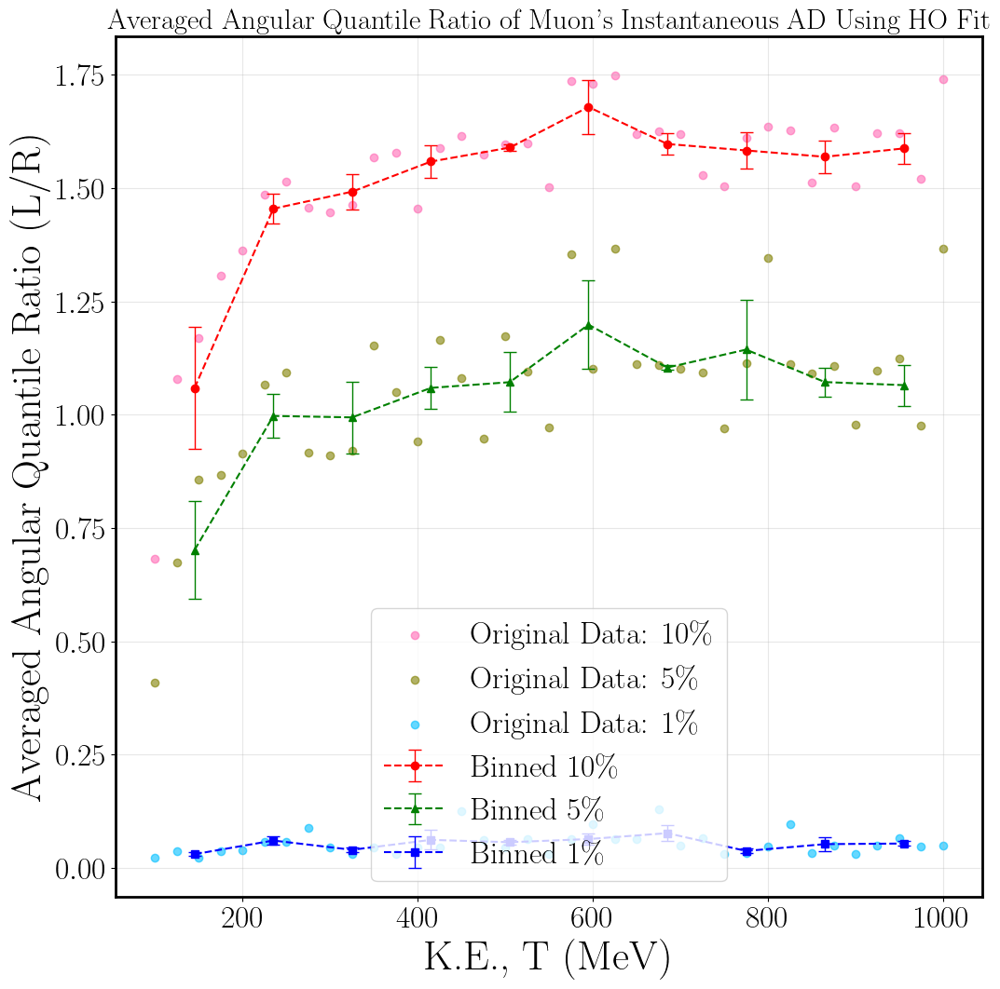

In [35]:
# Averaging elements within bins and then plotting these averages in Python can be achieved using libraries like NumPy and Matplotlib.
import numpy as np
import matplotlib.pyplot as plt

# 1. Generate or load your data
# For demonstration, let's create some sample data
np.random.seed(0) # for reproducibility
# x_data = np.random.rand(100) * 10 # x-values for binning
# y_data = 2 * x_data + np.random.randn(100) * 5 # y-values to be averaged

x_data = tm # x-values for binning
y_data1h = np.array(nbyamuhs10) # y-values to be averaged
y_data2h = np.array(nbyamuhs05)
y_data3h = np.array(nbyamuhs01)
 
# 2. Define the bins
num_bins = 10
# You can define custom bin edges or let NumPy determine them
bin_edges = np.linspace(min(x_data), max(x_data), num_bins + 1)

# 3. Bin the data and calculate the mean for each bin
# Use np.digitize to assign each x_data point to a bin index
bin_indices = np.digitize(x_data, bin_edges)


# Calculate the mean of y_data for each bin
bin_means1h = []
bin_centers1h = []

bin_means2h = []
bin_centers2h = []

bin_means3h = []
bin_centers3h = []


elements_in_bins_10h = []
elements_in_bins_05h = []
elements_in_bins_01h = []

bin_means_10h = []
bin_means_05h = []
bin_means_01h = []

# # 4. Plot the results
# plt.figure(figsize=(12, 12))

# plt.xlabel('K.E., T (MeV)') #(Binned Variable)
# plt.ylabel('Averaged Angular Quantile Ratio (L/R)') # (Averaged Variable)')
# plt.title('Averaged Angular Quantile Ratio (L/R) of Muons AD Using HO Fit') #in Bins of K.E. 


#10% Q.ratio
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin1h = y_data1h[bin_indices == i]
    if len(elements_in_bin1h) > 0: # Avoid division by zero for empty bins
        bin_means1h.append(np.mean(elements_in_bin1h))
        # Calculate bin center for plotting
        bin_centers1h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means1h.append(np.nan)
        bin_centers1h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    elements_in_bins_10h.append(elements_in_bin1h)
    # bin_means_10.append(np.array(bin_means1[-1])) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_10, bin_means_10) 


#5% Q.ratio    
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin2h = y_data2h[bin_indices == i]
    if len(elements_in_bin2h) > 0: # Avoid division by zero for empty bins
        bin_means2h.append(np.mean(elements_in_bin2h))
        # Calculate bin center for plotting
        bin_centers2h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means2h.append(np.nan)
        bin_centers2h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    elements_in_bins_05h.append(elements_in_bin2h)
    # bin_means_05.append(bin_means2[-1]) ##bin_means1[-1]: value of the last element of an array/list      
# print(elements_in_bins_05, bin_means_05)


#1% Q.ratio
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin3h = y_data3h[bin_indices == i]
    if len(elements_in_bin3h) > 0: # Avoid division by zero for empty bins
        bin_means3h.append(np.mean(elements_in_bin3h))
        # Calculate bin center for plotting
        bin_centers3h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means3h.append(np.nan)
        bin_centers3h.append((bin_edges[i-1] + bin_edges[i]) / 2)

    elements_in_bins_01h.append(elements_in_bin3h)
    # bin_means_01.append(bin_means3[-1]) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_01, bin_means_01)    


# Remove NaN values if you don't want to plot empty bins
bin_centers1h = np.array(bin_centers1h)[~np.isnan(bin_means1h)]
bin_means1h = np.array(bin_means1h)[~np.isnan(bin_means1h)]

bin_centers2h = np.array(bin_centers2h)[~np.isnan(bin_means2h)]
bin_means2h = np.array(bin_means2h)[~np.isnan(bin_means2h)]

bin_centers3h = np.array(bin_centers3h)[~np.isnan(bin_means3h)]
bin_means3h = np.array(bin_means3h)[~np.isnan(bin_means3h)]


# print(bin_means1h, bin_means2h, bin_means3h)

# print(elements_in_bins_10h, bin_means1h)
# print(elements_in_bins_05h, bin_means2h)
# print(elements_in_bins_01h, bin_means3h)

#Jackknife resampling with my data 

def jackknife_statistic(data, statistic):
    n = len(data)
    jackknife_samples = np.zeros(n)

    for i in range(n):
        sample = np.delete(data, i)
        jackknife_samples[i] = statistic(sample)

    jackknife_mean = np.mean(jackknife_samples)
    variance = (n - 1) / n * np.sum((jackknife_samples - jackknife_mean)**2)
    bias = (n - 1) * (jackknife_mean - statistic(data))
    
    return jackknife_mean, variance, bias

# Example
# data = np.array([2, 4, 6, 8, 10])
#Real Data
data10h = elements_in_bins_10h
data05h = elements_in_bins_05h
data01h = elements_in_bins_01h
# print("data10 = {}, data05 = {}, data01 = {}".format(data10, data05, data01))
stat = np.mean


# Initialize empty lists to store results for each bin
means_10h, errs_10h = [], []
means_05h, errs_05h = [], []
means_01h, errs_01h = [], []

# Loop for 10% data
for bin_data in elements_in_bins_10h:
    if len(bin_data) > 1: # Jackknife requires at least 2 points
        m, v, b = jackknife_statistic(bin_data, np.mean)
        means_10h.append(m)
        errs_10h.append(np.sqrt(v)) # Error bar is square root of variance
    else:
        means_10h.append(np.nan)
        errs_10h.append(np.nan)

# Loop for 5% data
for bin_data in elements_in_bins_05h:
    if len(bin_data) > 1:
        m, v, b = jackknife_statistic(bin_data, np.mean)
        means_05h.append(m)
        errs_05h.append(np.sqrt(v))
    else:
        means_05h.append(np.nan)
        errs_05h.append(np.nan)

# Loop for 1% data
for bin_data in elements_in_bins_01h:
    if len(bin_data) > 1:
        m, v, b = jackknife_statistic(bin_data, np.mean)
        means_01h.append(m)
        errs_01h.append(np.sqrt(v))
    else:
        means_01h.append(np.nan)
        errs_01h.append(np.nan)

#Plotting

plt.figure(figsize=(12, 12))

plt.scatter(x_data, y_data1h, alpha=0.6, c='hotpink', label='Original Data: 10\%')
plt.scatter(x_data, y_data2h, alpha=0.6, c='olive', label='Original Data: 5\%')
plt.scatter(x_data, y_data3h, alpha=0.6, c='deepskyblue', label='Original Data: 1\%')


# Define labels and colors for cleaner code
datasets = [
    (bin_centers1h, means_10h, errs_10h, 'red', 'o', '10\%'),
    (bin_centers2h, means_05h, errs_05h, 'green', '^', '5\%'),
    (bin_centers3h, means_01h, errs_01h, 'blue', 's', '1\%')
]

for x, y, yerr, color, marker, label in datasets:
    # Convert to numpy arrays to handle indexing/NaNs
    x, y, yerr = np.array(x), np.array(y), np.array(yerr)
    mask = ~np.isnan(y)
    
    plt.errorbar(x[mask], y[mask], yerr=yerr[mask], 
                 fmt=marker, color=color, linestyle='--', 
                 capsize=5, elinewidth=1, label=f'Binned {label}')

plt.xlabel('K.E., T (MeV)', size=32)
plt.ylabel('Averaged Angular Quantile Ratio (L/R)', size=32)
plt.title('Averaged Angular Quantile Ratio of Muon\'s Instantaneous AD Using HO Fit', size=22)
plt.legend(loc='lower center') #fontsize=16, loc='center'
plt.grid(True, alpha=0.3)

# plt.savefig('binned_avg_nbyas_10_5_1_perc_hofit_Cherenkov_iAD_Muon_allT_from_saved_data_w_jackknife_err_corrected', bbox_inches='tight') #_zoom
plt.show()

[0.85793361 0.88891261 0.91060252 0.92642891 0.93835312 0.94757187
 0.95485213 0.96070526 0.96548344 0.96943599 0.97274358 0.97553983
 0.97792534 0.97997704 0.98175461 0.98330494 0.98466527 0.98586549
 0.98692983 0.98787809 0.98872659 0.98948888 0.99017626 0.99079826
 0.99136291 0.99187708 0.99234661 0.99277653 0.99317117 0.9935343
 0.99386919 0.9941787  0.99446532 0.99473127 0.99497848 0.99520868
 0.9954234 ]
[1, 0, 1, 1, 1, 1, 1, 3, 5, 22]


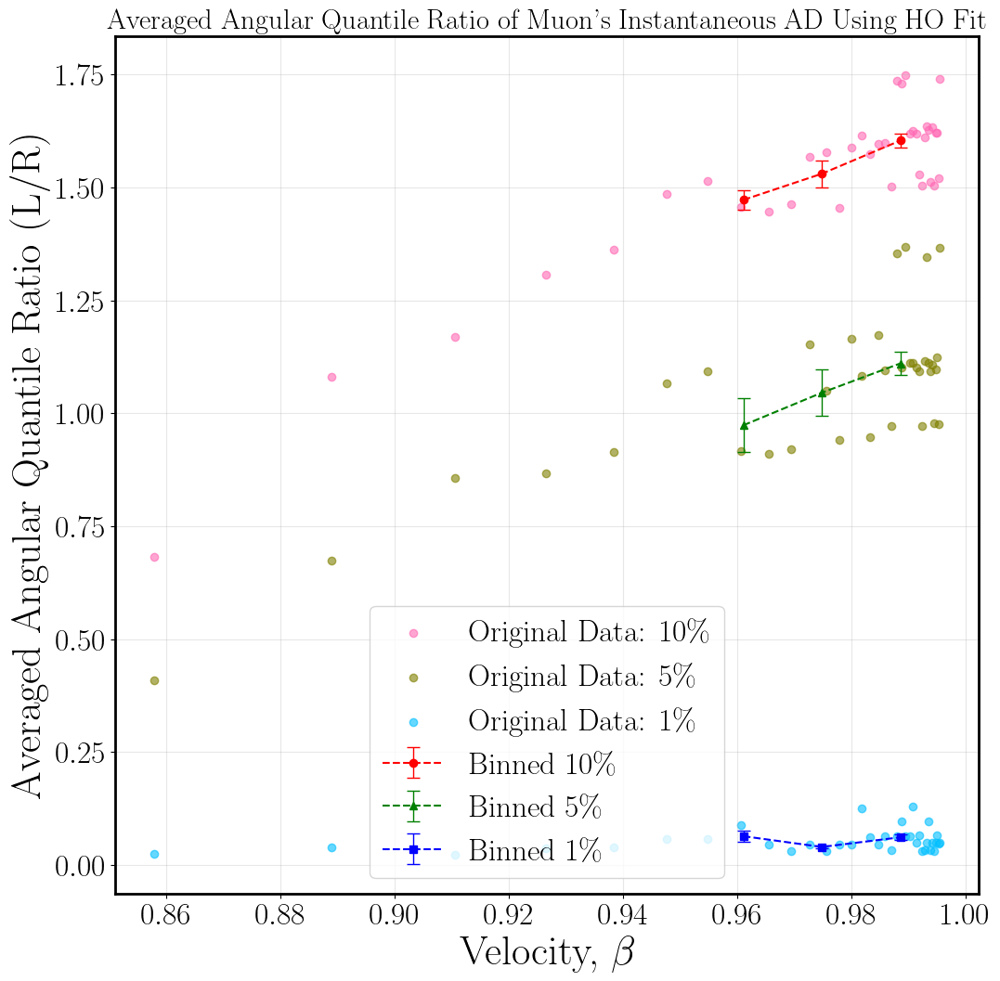

In [37]:
# Averaging elements within bins and then plotting these averages in Python can be achieved using libraries like NumPy and Matplotlib.
import numpy as np
import matplotlib.pyplot as plt

# 1. Generate or load your data
# For demonstration, let's create some sample data
np.random.seed(0) # for reproducibility
# x_data = np.random.rand(100) * 10 # x-values for binning
# y_data = 2 * x_data + np.random.randn(100) * 5 # y-values to be averaged


#Linear space in K.E.
tp = np.linspace(500, 1500, 41)
tm = np.linspace(100, 1000, 37)
# print(t)

#Mass of the particle travelling
mp = 938 #Proton's mass
mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²

betap  = np.sqrt(1 - (1/(1 + tp/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD
betamu  = np.sqrt(1 - (1/(1 + tm/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

# print (tp, betap, np.round(betap, 4))
# print (tm, betamu, np.round(betamu, 4))



# x_data = tm # x-values for binning
x_data = betamu # x-values for binning
print(x_data)

y_data1h = np.array(nbyamuhs10) # y-values to be averaged
y_data2h = np.array(nbyamuhs05)
y_data3h = np.array(nbyamuhs01)
 
# 2. Define the bins
num_bins = 10 #Changed from 10
# You can define custom bin edges or let NumPy determine them
bin_edges = np.linspace(min(x_data), max(x_data), num_bins + 1)

# 3. Bin the data and calculate the mean for each bin
# Use np.digitize to assign each x_data point to a bin index
bin_indices = np.digitize(x_data, bin_edges)


# Calculate the mean of y_data for each bin
bin_means1hmu = []
bin_centers1hmu = []

bin_means2hmu = []
bin_centers2hmu = []

bin_means3hmu = []
bin_centers3hmu = []


elements_in_bins_10h = []
elements_in_bins_05h = []
elements_in_bins_01h = []

bin_means_10h = []
bin_means_05h = []
bin_means_01h = []

# # 4. Plot the results
# plt.figure(figsize=(12, 12))

# plt.xlabel('K.E., T (MeV)') #(Binned Variable)
# plt.ylabel('Averaged Angular Quantile Ratio (L/R)') # (Averaged Variable)')
# plt.title('Averaged Angular Quantile Ratio (L/R) of Muons AD Using HO Fit') #in Bins of K.E. 


#10% Q.ratio
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin1h = y_data1h[bin_indices == i]
    if len(elements_in_bin1h) > 0: # Avoid division by zero for empty bins
        bin_means1hmu.append(np.mean(elements_in_bin1h))
        # Calculate bin center for plotting
        bin_centers1hmu.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means1hmu.append(np.nan)
        bin_centers1hmu.append((bin_edges[i-1] + bin_edges[i]) / 2)
    elements_in_bins_10h.append(elements_in_bin1h)
    # bin_means_10.append(np.array(bin_means1[-1])) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_10, bin_means_10) 


#5% Q.ratio    
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin2h = y_data2h[bin_indices == i]
    if len(elements_in_bin2h) > 0: # Avoid division by zero for empty bins
        bin_means2hmu.append(np.mean(elements_in_bin2h))
        # Calculate bin center for plotting
        bin_centers2hmu.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means2hmu.append(np.nan)
        bin_centers2hmu.append((bin_edges[i-1] + bin_edges[i]) / 2)
    elements_in_bins_05h.append(elements_in_bin2h)
    # bin_means_05.append(bin_means2[-1]) ##bin_means1[-1]: value of the last element of an array/list      
# print(elements_in_bins_05, bin_means_05)


#1% Q.ratio
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin3h = y_data3h[bin_indices == i]
    if len(elements_in_bin3h) > 0: # Avoid division by zero for empty bins
        bin_means3hmu.append(np.mean(elements_in_bin3h))
        # Calculate bin center for plotting
        bin_centers3hmu.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means3hmu.append(np.nan)
        bin_centers3hmu.append((bin_edges[i-1] + bin_edges[i]) / 2)

    elements_in_bins_01h.append(elements_in_bin3h)
    # bin_means_01.append(bin_means3[-1]) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_01, bin_means_01)    


# # Remove NaN values if you don't want to plot empty bins
# bin_centers1hmu = np.array(bin_centers1hmu)[~np.isnan(bin_means1hmu)]
# bin_means1hmu = np.array(bin_means1hmu)[~np.isnan(bin_means1hmu)]

# bin_centers2hmu = np.array(bin_centers2hmu)[~np.isnan(bin_means2hmu)]
# bin_means2hmu = np.array(bin_means2hmu)[~np.isnan(bin_means2hmu)]

# bin_centers3hmu = np.array(bin_centers3hmu)[~np.isnan(bin_means3hmu)]
# bin_means3hmu = np.array(bin_means3hmu)[~np.isnan(bin_means3hmu)]


# print(bin_means1h, bin_means2h, bin_means3h)

# print(elements_in_bins_10h, bin_means1h)
# print(elements_in_bins_05h, bin_means2h)
# print(elements_in_bins_01h, bin_means3h)

#Jackknife resampling with my data 

def jackknife_statistic(data, statistic):
    n = len(data)
    jackknife_samples = np.zeros(n)

    for i in range(n):
        sample = np.delete(data, i)
        jackknife_samples[i] = statistic(sample)

    jackknife_mean = np.mean(jackknife_samples)
    variance = (n - 1) / n * np.sum((jackknife_samples - jackknife_mean)**2)
    bias = (n - 1) * (jackknife_mean - statistic(data))
    
    return jackknife_mean, variance, bias

# Example
# data = np.array([2, 4, 6, 8, 10])
#Real Data
data10h = elements_in_bins_10h
data05h = elements_in_bins_05h
data01h = elements_in_bins_01h
# print("data10 = {}, data05 = {}, data01 = {}".format(data10, data05, data01))
stat = np.mean


# Initialize empty lists to store results for each bin
means_10hmu, errs_10hmu = [], []
means_05hmu, errs_05hmu = [], []
means_01hmu, errs_01hmu = [], []

# Loop for 10% data
for bin_data in elements_in_bins_10h:
    if len(bin_data) > 1: # Jackknife requires at least 2 points
        m, v, b = jackknife_statistic(bin_data, np.mean)
        means_10hmu.append(m)
        errs_10hmu.append(np.sqrt(v)) # Error bar is square root of variance
    else:
        means_10hmu.append(np.nan)
        errs_10hmu.append(np.nan)

# Loop for 5% data
for bin_data in elements_in_bins_05h:
    if len(bin_data) > 1:
        m, v, b = jackknife_statistic(bin_data, np.mean)
        means_05hmu.append(m)
        errs_05hmu.append(np.sqrt(v))
    else:
        means_05hmu.append(np.nan)
        errs_05hmu.append(np.nan)

# Loop for 1% data
for bin_data in elements_in_bins_01h:
    if len(bin_data) > 1:
        m, v, b = jackknife_statistic(bin_data, np.mean)
        means_01hmu.append(m)
        errs_01hmu.append(np.sqrt(v))
    else:
        means_01hmu.append(np.nan)
        errs_01hmu.append(np.nan)

#Plotting

plt.figure(figsize=(12, 12))

plt.scatter(x_data, y_data1h, alpha=0.6, c='hotpink', label='Original Data: 10\%')
plt.scatter(x_data, y_data2h, alpha=0.6, c='olive', label='Original Data: 5\%')
plt.scatter(x_data, y_data3h, alpha=0.6, c='deepskyblue', label='Original Data: 1\%')

print([len(b) for b in elements_in_bins_10h])

# --- INSTEAD, USE THIS CLEANER PLOTTING LOOP ---
datasets = [
    (bin_centers1hmu, means_10hmu, errs_10hmu, 'red', 'o', '10\%'),
    (bin_centers2hmu, means_05hmu, errs_05hmu, 'green', '^', '5\%'),
    (bin_centers3hmu, means_01hmu, errs_01hmu, 'blue', 's', '1\%')
]

for x_raw, y_raw, yerr_raw, color, marker, label in datasets:
    x = np.array(x_raw)
    y = np.array(y_raw)
    yerr = np.array(yerr_raw)
    
    # This mask will now correctly filter all three arrays at once
    mask = ~np.isnan(y)
    
    plt.errorbar(x[mask], y[mask], yerr=yerr[mask], 
                 fmt=marker, color=color, linestyle='--', 
                 capsize=5, elinewidth=1, label=f'Binned {label}')


# Set labels and title:
plt.xlabel(r'Velocity, $\beta$', size= 32)
# plt.xlabel('K.E., T (MeV)', size=32)
plt.ylabel('Averaged Angular Quantile Ratio (L/R)', size=32)
plt.title('Averaged Angular Quantile Ratio of Muon\'s Instantaneous AD Using HO Fit', size=22)
plt.legend(loc='lower center') #fontsize=16, loc='center'
plt.grid(True, alpha=0.3)

# plt.savefig('binned_avg_nbyas_10_5_1_perc_hofit_Cherenkov_iAD_Muon_allbetas_from_saved_data_w_jackknife_err_corrected', bbox_inches='tight') #_zoom
plt.show()



[0.85793361 0.88891261 0.91060252 0.92642891 0.93835312 0.94757187
 0.95485213 0.96070526 0.96548344 0.96943599 0.97274358 0.97553983
 0.97792534 0.97997704 0.98175461 0.98330494 0.98466527 0.98586549
 0.98692983 0.98787809 0.98872659 0.98948888 0.99017626 0.99079826
 0.99136291 0.99187708 0.99234661 0.99277653 0.99317117 0.9935343
 0.99386919 0.9941787  0.99446532 0.99473127 0.99497848 0.99520868
 0.9954234 ]
[1, 0, 1, 1, 1, 1, 1, 3, 5, 22]


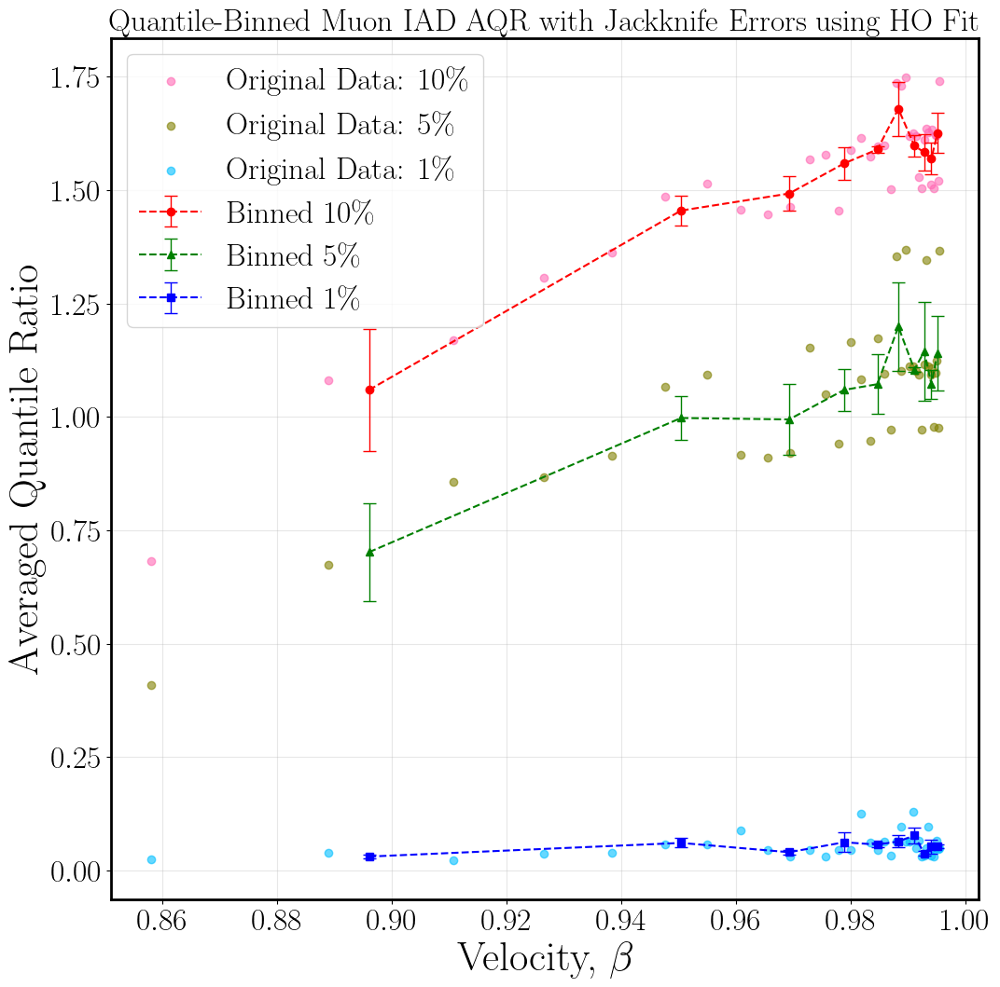

In [39]:
# 0. Definition 

# #Linear space in K.E.
# tp = np.linspace(500, 1500, 41)
# tm = np.linspace(100, 1000, 37)
# # print(t)

# #Mass of the particle travelling
# mp = 938 #Proton's mass
# mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²

# betap  = np.sqrt(1 - (1/(1 + tp/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD
# betamu  = np.sqrt(1 - (1/(1 + tm/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

# # print (tp, betap, np.round(betap, 4))
# # print (tm, betamu, np.round(betamu, 4))

# 1. Define x_data (Velocity) & y_data (AQR)
x_data = betamu 
print(x_data)

y_data1hmu = np.array(nbyamuhs10) # y-values to be averaged
y_data2hmu = np.array(nbyamuhs05)
y_data3hmu = np.array(nbyamuhs01)

# 2. CREATE QUANTILE BINS
num_bins = 10
# This creates edges so that ~10% of the data points fall into each bin
bin_edges = np.quantile(x_data, np.linspace(0, 1, num_bins + 1))

# 3. DIGITIZE & CALCULATE CENTERS
bin_indices = np.digitize(x_data, bin_edges)
# Handle the edge case where a point equals the max value
bin_indices[bin_indices > num_bins] = num_bins

# We calculate the average x-position (beta) within each bin for more accuracy
bin_centershmu = []
for i in range(1, num_bins + 1):
    points_in_bin = x_data[bin_indices == i]
    if len(points_in_bin) > 0:
        bin_centershmu.append(np.mean(points_in_bin))
    else:
        # Fallback to geometric center if bin is somehow empty
        bin_centershmu.append((bin_edges[i-1] + bin_edges[i]) / 2)

bin_centershmu = np.array(bin_centershmu)

# 4. PLOTTING LOOP (Now with equal data counts per bin)
plt.figure(figsize=(12, 12))

plt.scatter(x_data, y_data1hmu, alpha=0.6, c='hotpink', label='Original Data: 10\%')
plt.scatter(x_data, y_data2hmu, alpha=0.6, c='olive', label='Original Data: 5\%')
plt.scatter(x_data, y_data3hmu, alpha=0.6, c='deepskyblue', label='Original Data: 1\%')

print([len(b) for b in elements_in_bins_10h])


datasets = [
    (y_data1hmu, 'red', 'o', '10\%'),
    (y_data2hmu, 'green', '^', '5\%'),
    (y_data3hmu, 'blue', 's', '1\%')
]

for y_vals, color, marker, label in datasets:
    meanshmu, errshmu = [], []
    
    for i in range(1, num_bins + 1):
        bin_data = y_vals[bin_indices == i]
        
        if len(bin_data) > 1:
            m, v, b = jackknife_statistic(bin_data, np.mean)
            meanshmu.append(m)
            errshmu.append(np.sqrt(v))
        else:
            meanshmu.append(np.nan)
            errshmu.append(np.nan)
            
    # Convert to arrays for masking
    meanshmu, errshmu = np.array(meanshmu), np.array(errshmu)
    mask = ~np.isnan(meanshmu)
    
    plt.errorbar(bin_centershmu[mask], meanshmu[mask], yerr=errshmu[mask], 
                 fmt=marker, color=color, linestyle='--', 
                 capsize=5, elinewidth=1, label=f'Binned {label}')

plt.xlabel(r'Velocity, $\beta$', size=32)
plt.ylabel('Averaged Quantile Ratio', size=32)
plt.title('Quantile-Binned Muon IAD AQR with Jackknife Errors using HO Fit', size=24)
plt.legend()
plt.grid(True, alpha=0.3)

# plt.savefig('qualtile_binned_Muon_Cherenkov_iAD_AQR_10_5_1_perc_hofit_allbetas_w_jackknife_err_corrected', bbox_inches='tight') #_zoom
plt.show()


[0.75796532 0.76741698 0.77628968 0.78463315 0.79249149 0.79990401
 0.80690583 0.81352846 0.81980026 0.82574686 0.83139144 0.83675507
 0.8418569  0.84671442 0.8513436  0.85575908 0.85997431 0.86400164
 0.86785245 0.87153724 0.87506571 0.87844687 0.88168902 0.88479989
 0.88778668 0.89065607 0.89341428 0.89606712 0.89862002 0.90107804
 0.90344595 0.90572818 0.9079289  0.91005203 0.91210124 0.91407999
 0.91599153 0.91783893 0.91962507 0.92135268 0.92302433]
[4, 4, 4, 4, 4, 4, 4, 4, 4, 4]
[0.85793361 0.88891261 0.91060252 0.92642891 0.93835312 0.94757187
 0.95485213 0.96070526 0.96548344 0.96943599 0.97274358 0.97553983
 0.97792534 0.97997704 0.98175461 0.98330494 0.98466527 0.98586549
 0.98692983 0.98787809 0.98872659 0.98948888 0.99017626 0.99079826
 0.99136291 0.99187708 0.99234661 0.99277653 0.99317117 0.9935343
 0.99386919 0.9941787  0.99446532 0.99473127 0.99497848 0.99520868
 0.9954234 ]
[4, 4, 4, 4, 4, 4, 4, 4, 4, 4]


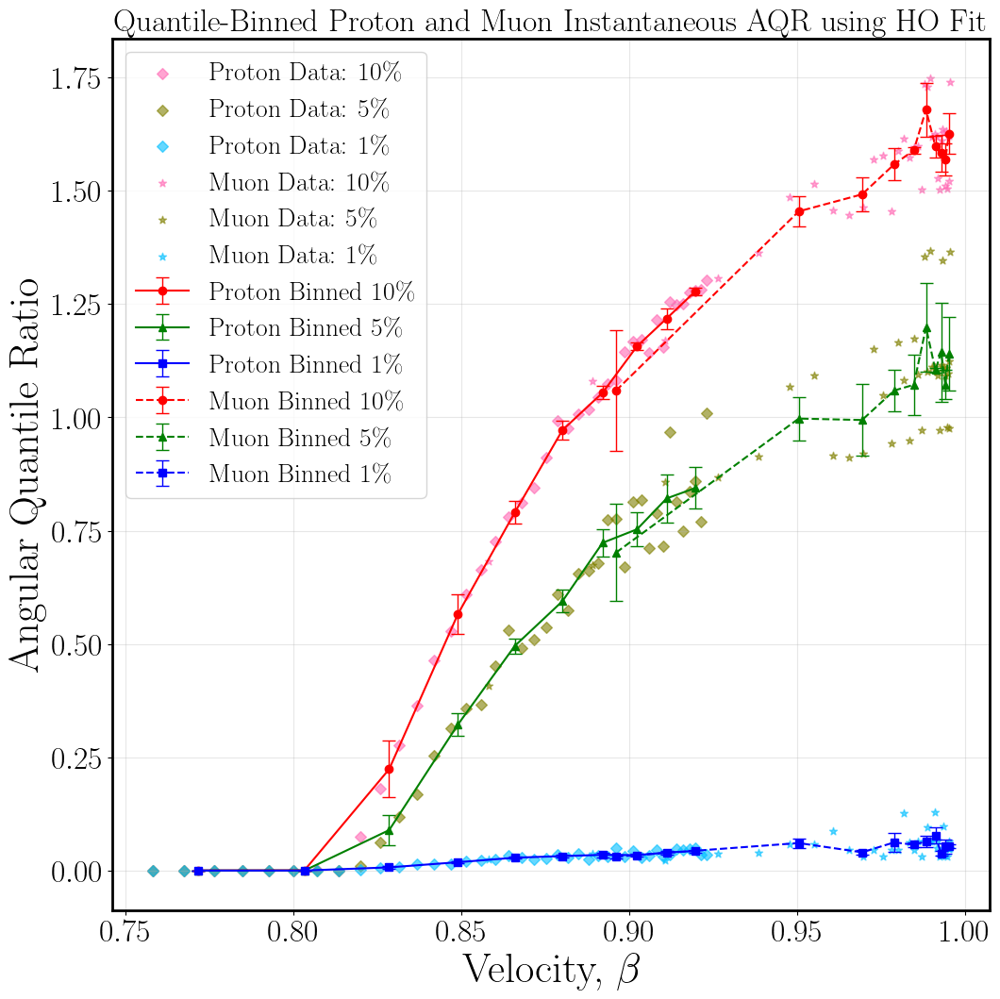

In [290]:
# 0. Definition 

#Linear space in K.E.
tp = np.linspace(500, 1500, 41)
tm = np.linspace(100, 1000, 37)
# print(t)

#Mass of the particle travelling
mp = 938 #Proton's mass
mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²

betap  = np.sqrt(1 - (1/(1 + tp/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD
betamu  = np.sqrt(1 - (1/(1 + tm/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

# print (tp, betap, np.round(betap, 4))
# print (tm, betamu, np.round(betamu, 4))


# 1. Define x_data (Velocity) & y_data (AQR)
x_data1 = betap 
print(x_data1)

y_data1hp = np.array(nbyaphs10) # y-values to be averaged
y_data2hp = np.array(nbyaphs05)
y_data3hp = np.array(nbyaphs01)

# 2. CREATE QUANTILE BINS
num_bins = 10
# This creates edges so that ~10% of the data points fall into each bin
bin_edges = np.quantile(x_data1, np.linspace(0, 1, num_bins + 1))

# 3. DIGITIZE & CALCULATE CENTERS
bin_indices = np.digitize(x_data1, bin_edges)
# Handle the edge case where a point equals the max value
bin_indices[bin_indices > num_bins] = num_bins

# We calculate the average x-position (beta) within each bin for more accuracy
bin_centershp = []
for i in range(1, num_bins + 1):
    points_in_bin = x_data1[bin_indices == i]
    if len(points_in_bin) > 0:
        bin_centershp.append(np.mean(points_in_bin))
    else:
        # Fallback to geometric center if bin is somehow empty
        bin_centershp.append((bin_edges[i-1] + bin_edges[i]) / 2)

bin_centershp = np.array(bin_centershp)

# 4. PLOTTING LOOP (Now with equal data counts per bin)
plt.figure(figsize=(12, 12))

plt.scatter(x_data1, y_data1hp, alpha=0.6, c='hotpink', label='Proton Data: 10\%', marker='D')
plt.scatter(x_data1, y_data2hp, alpha=0.6, c='olive', label='Proton Data: 5\%', marker='D')
plt.scatter(x_data1, y_data3hp, alpha=0.6, c='deepskyblue', label='Proton Data: 1\%', marker='D')

print([len(b) for b in elements_in_bins_10h])


datasets = [
    (y_data1hp, 'red', 'o', '10\%'),
    (y_data2hp, 'green', '^', '5\%'),
    (y_data3hp, 'blue', 's', '1\%')
]

for y_vals, color, marker, label in datasets:
    meanshp, errshp = [], []
    
    for i in range(1, num_bins + 1):
        bin_data = y_vals[bin_indices == i]
        
        if len(bin_data) > 1:
            m, v, b = jackknife_statistic(bin_data, np.mean)
            meanshp.append(m)
            errshp.append(np.sqrt(v))
        else:
            meanshp.append(np.nan)
            errshp.append(np.nan)
            
    # Convert to arrays for masking
    meanshp, errshp = np.array(meanshp), np.array(errshp)
    mask = ~np.isnan(meanshp)
    
    plt.errorbar(bin_centershp[mask], meanshp[mask], yerr=errshp[mask], 
                 fmt=marker, color=color, linestyle='solid', 
                 capsize=5, elinewidth=1, label=f'Proton Binned {label}')



# 1. Define x_data (Velocity) & y_data (AQR)
x_data2 = betamu 
print(x_data2)

y_data1hmu = np.array(nbyamuhs10) # y-values to be averaged
y_data2hmu = np.array(nbyamuhs05)
y_data3hmu = np.array(nbyamuhs01)



# 2. CREATE QUANTILE BINS
num_bins = 10
# This creates edges so that ~10% of the data points fall into each bin
bin_edges = np.quantile(x_data2, np.linspace(0, 1, num_bins + 1))

# 3. DIGITIZE & CALCULATE CENTERS
bin_indices = np.digitize(x_data2, bin_edges)
# Handle the edge case where a point equals the max value
bin_indices[bin_indices > num_bins] = num_bins


# We calculate the average x-position (beta) within each bin for more accuracy
bin_centershmu = []
for i in range(1, num_bins + 1):
    points_in_bin = x_data2[bin_indices == i]
    if len(points_in_bin) > 0:
        bin_centershmu.append(np.mean(points_in_bin))
    else:
        # Fallback to geometric center if bin is somehow empty
        bin_centershmu.append((bin_edges[i-1] + bin_edges[i]) / 2)

bin_centershmu = np.array(bin_centershmu)

# # 4. PLOTTING LOOP (Now with equal data counts per bin)
# plt.figure(figsize=(12, 12))


plt.scatter(x_data2, y_data1hmu, alpha=0.6, c='hotpink', label='Muon Data: 10\%', marker='*')
plt.scatter(x_data2, y_data2hmu, alpha=0.6, c='olive', label='Muon Data: 5\%', marker='*')
plt.scatter(x_data2, y_data3hmu, alpha=0.6, c='deepskyblue', label='Muon Data: 1\%', marker='*')

print([len(b) for b in elements_in_bins_10h])


datasets = [
    (y_data1hmu, 'red', 'o', '10\%'),
    (y_data2hmu, 'green', '^', '5\%'),
    (y_data3hmu, 'blue', 's', '1\%')
]

for y_vals, color, marker, label in datasets:
    meanshmu, errshmu = [], []
    
    for i in range(1, num_bins + 1):
        bin_data = y_vals[bin_indices == i]
        
        if len(bin_data) > 1:
            m, v, b = jackknife_statistic(bin_data, np.mean)
            meanshmu.append(m)
            errshmu.append(np.sqrt(v))
        else:
            meanshmu.append(np.nan)
            errshmu.append(np.nan)
            
    # Convert to arrays for masking
    meanshmu, errshmu = np.array(meanshmu), np.array(errshmu)
    mask = ~np.isnan(meanshmu)
    
    plt.errorbar(bin_centershmu[mask], meanshmu[mask], yerr=errshmu[mask], 
                 fmt=marker, color=color, linestyle='--', 
                 capsize=5, elinewidth=1, label=f'Muon Binned {label}')

plt.xlabel(r'Velocity, $\beta$', size=32)
plt.ylabel('Angular Quantile Ratio', size=32)
plt.title('Quantile-Binned Proton and Muon Instantaneous AQR using HO Fit', size=24) #with Jackknife Errors 
plt.legend(fontsize=20)
plt.grid(True, alpha=0.3)

# plt.savefig('quantile_binned_Proton_Muon_Cherenkov_iAD_AQR_10_5_1_perc_hofit_allbetas_w_jackknife_err_corrected2', bbox_inches='tight') #_zoom
plt.show()


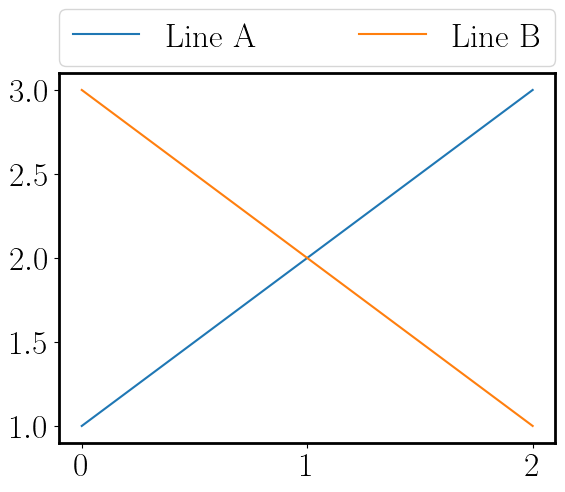

In [132]:
#Example of putting legend outside the plot
import matplotlib.pyplot as plt

plt.plot([1, 2, 3], label='Line A')
plt.plot([3, 2, 1], label='Line B')
# Anchor at (0., 1.02) and expand horizontally across the top (width=1.)
plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc='lower left', ncols=2, mode="expand", borderaxespad=0.)
plt.show()


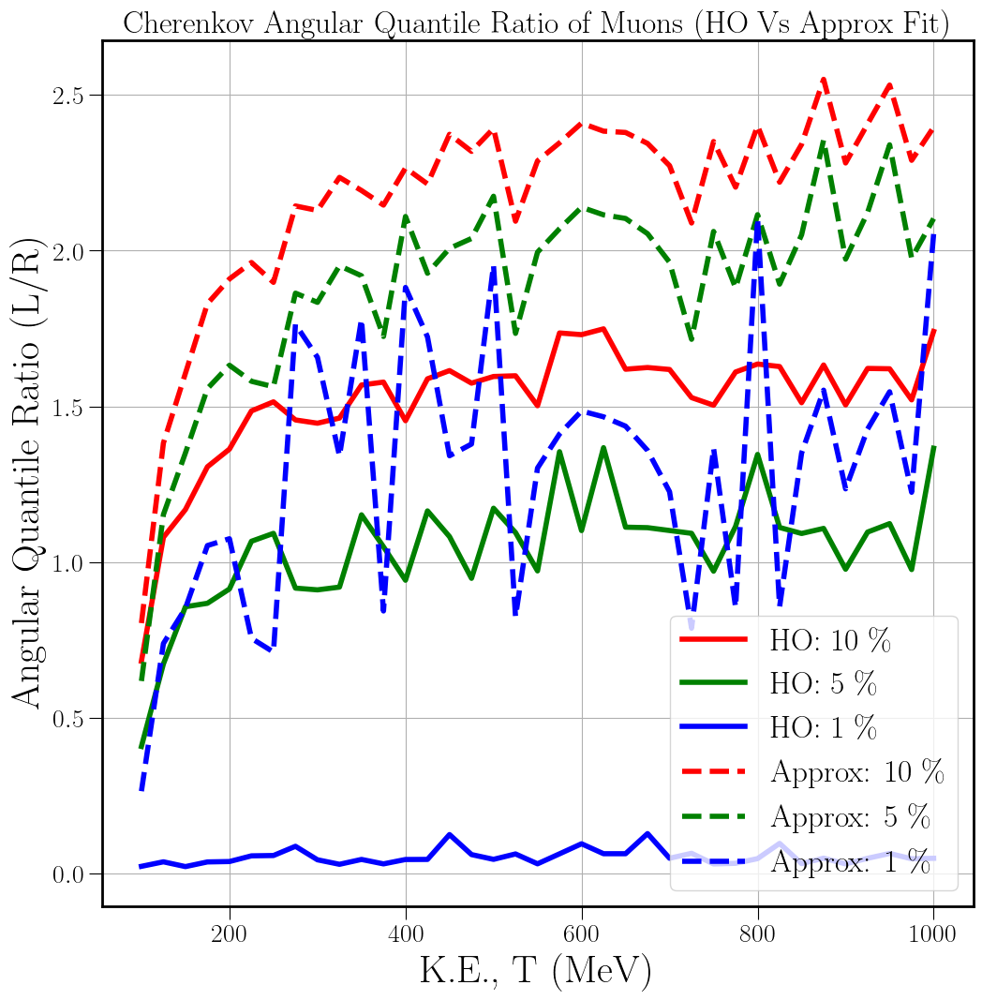

In [134]:
#Linear space in K.E.
# tp = np.linspace(500, 1500, 41)
tm = np.linspace(100, 1000, 37)
# print(t)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'K.E., T (MeV)', size= 30)
ax.set_ylabel(r'Angular Quantile Ratio (L/R)', size= 30) #$\frac{N}{A}$
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Cherenkov Angular Quantile Ratio of Muons (HO Vs Approx Fit)', fontsize=24)
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.plot(tm, nbyamuhs10, linewidth=4, c='r', label='HO: 10 \%')
ax.plot(tm, nbyamuhs05, linewidth=4, c='g', label='HO: 5 \%')
ax.plot(tm, nbyamuhs01, linewidth=4, c='b', label='HO: 1 \%')

ax.plot(tm, nbyamups10, linewidth=4, c='r', label='Approx: 10 \%', ls='dashed')
ax.plot(tm, nbyamups05, linewidth=4, c='g', label='Approx: 5 \%', ls='dashed')
ax.plot(tm, nbyamups01, linewidth=4, c='b', label='Approx: 1 \%', ls='dashed')

ax.grid()
ax.legend()

# plt.savefig('nbyas_ho_vs_approxfit_Cherenkov_IAD_Muon_allTs_10_5_1_perc_from_saved_data_mplot3', bbox_inches='tight')
# plt.savefig('nbyas_ho_vs_approxfit_Cherenkov_IAD_Muon_allTs_10_perc_from_saved_data', bbox_inches='tight')
plt.show()

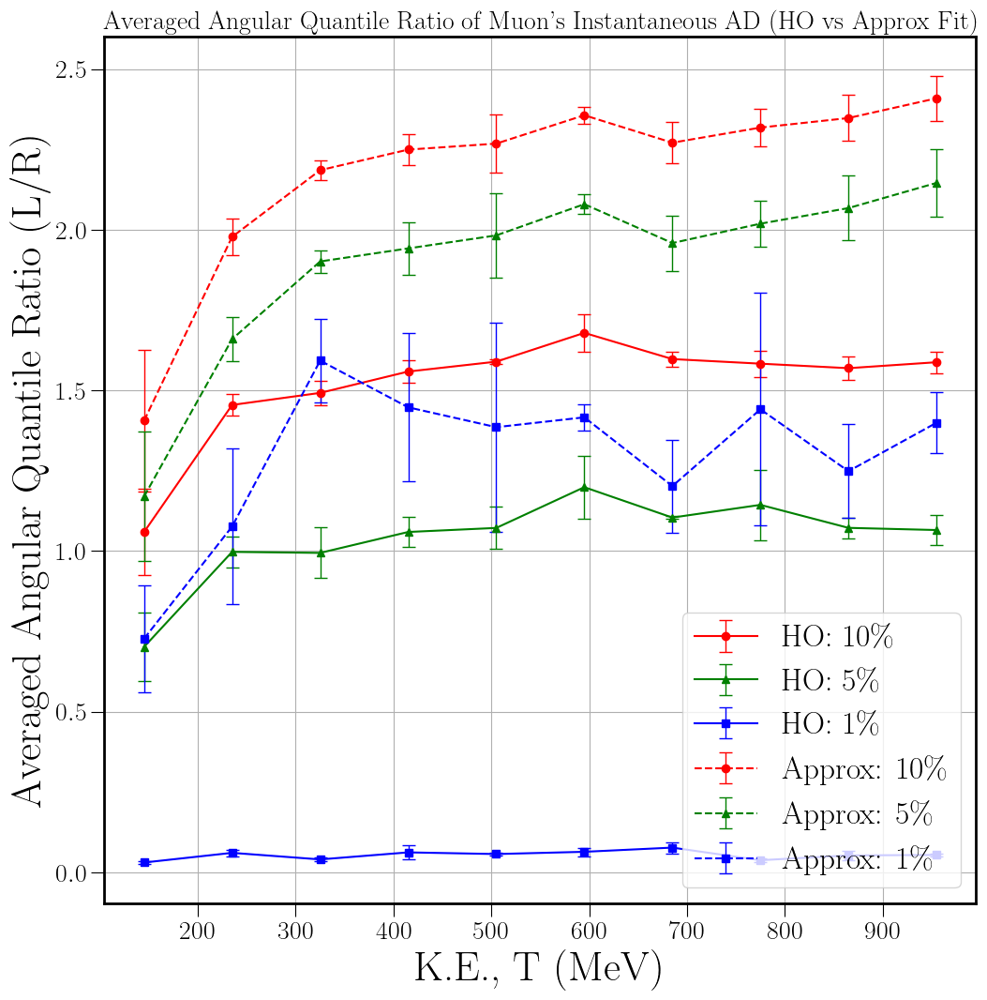

In [45]:
#Linear space in K.E.
# tp = np.linspace(500, 1500, 41)
tm = np.linspace(100, 1000, 37)
# print(t)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'K.E., T (MeV)', size= 32)
ax.set_ylabel(r'Averaged Angular Quantile Ratio (L/R)', size= 32)
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Averaged Angular Quantile Ratio of Muon\'s Instantaneous AD (HO vs Approx Fit)', fontsize=20)
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)

# # ax.plot(t, nbyapps10, linewidth=4, c='r', label="Approx: 10\%", ls='dashdot')
# # ax.plot(t, nbyapps05, linewidth=4, c='g', label="Approx: 5\%", ls='dashdot')
# # ax.plot(t, nbyapps01, linewidth=4, c='b', label="Approx: 1\%", ls='dashdot')

# # ax.plot(t, nbyaphs10, linewidth=4, c='r', label="HO: 10\%")
# # ax.plot(t, nbyaphs05, linewidth=4, c='g', label="HO: 5\%")
# # ax.plot(t, nbyaphs01, linewidth=4, c='b', label="HO: 1\%")

# plt.plot(bin_centers4, bin_means4, color='red', marker='o', linestyle='--', label='Approx 10\%')
# plt.plot(bin_centers5, bin_means5, color='green', marker='^', linestyle='--', label='Approx 5\%')
# plt.plot(bin_centers6, bin_means6, color='blue', marker='s', linestyle='--', label='Approx 1\%')

# plt.plot(bin_centers4h, bin_means4h, color='red', marker='o', linestyle='solid', label='HO 10\%')
# plt.plot(bin_centers5h, bin_means5h, color='green', marker='^', linestyle='solid', label='HO 5\%')
# plt.plot(bin_centers6h, bin_means6h, color='blue', marker='s', linestyle='solid', label='HO 1\%')


# # Add a vertical arrow
# # x, y: starting point of the arrow
# # dx, dy: length of the arrow along x and y directions
# plt.arrow(x=1400, y=1.25, dx=0, dy=0.40, width=0.5, head_width=3.5, head_length=0.05, fc='r', ec='r')


# Define labels and colors for cleaner code
datasets1 = [
    (bin_centers1h, means_10h, errs_10h, 'red', 'o', '10\%'),
    (bin_centers2h, means_05h, errs_05h, 'green', '^', '5\%'),
    (bin_centers3h, means_01h, errs_01h, 'blue', 's', '1\%')
]

for x, y, yerr, color, marker, label in datasets1:
    # Convert to numpy arrays to handle indexing/NaNs
    x, y, yerr = np.array(x), np.array(y), np.array(yerr)
    mask = ~np.isnan(y)
    
    plt.errorbar(x[mask], y[mask], yerr=yerr[mask], 
                 fmt=marker, color=color, linestyle='solid', 
                 capsize=5, elinewidth=1, label=f'HO: {label}')

# Define labels and colors for cleaner code
datasets2 = [
    (bin_centers1, means_10, errs_10, 'red', 'o', '10\%'),
    (bin_centers2, means_05, errs_05, 'green', '^', '5\%'),
    (bin_centers3, means_01, errs_01, 'blue', 's', '1\%')
]

for x, y, yerr, color, marker, label in datasets2:
    # Convert to numpy arrays to handle indexing/NaNs
    x, y, yerr = np.array(x), np.array(y), np.array(yerr)
    mask = ~np.isnan(y)
    
    plt.errorbar(x[mask], y[mask], yerr=yerr[mask], 
                 fmt=marker, color=color, linestyle='--', 
                 capsize=5, elinewidth=1, label=f'Approx: {label}') #f'Binned {label}'


ax.grid()
ax.legend()

plt.savefig('binned_avg_nbyas_ho_vs_approxfit_Cherenkov_IAD_Muon_allTs_10_5_1_perc_from_saved_data_jackknife_err_corrected', bbox_inches='tight')
# plt.savefig('binned_avg_nbyas_ho_vs_approxfit_Cherenkov_IAD_Proton_allTs_10_perc_from_saved_data', bbox_inches='tight')
# plt.savefig('binned_avg_nbyas_hofit_Cherenkov_IAD_Proton_allT_from_saved_data', bbox_inches='tight')

plt.show()


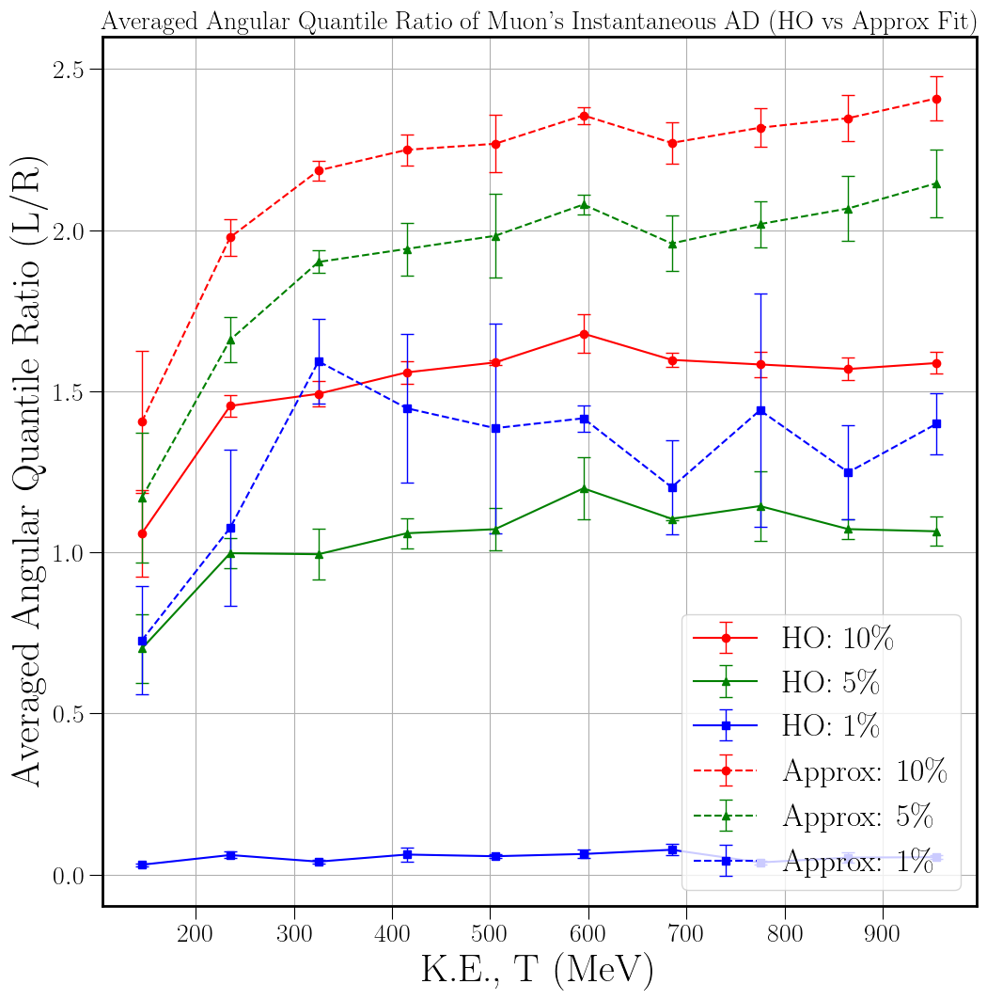

In [135]:
#Linear space in K.E.
# tp = np.linspace(500, 1500, 41)
tm = np.linspace(100, 1000, 37)
# print(t)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'K.E., T (MeV)', size= 30)
ax.set_ylabel(r'Averaged Angular Quantile Ratio (L/R)', size= 30)
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Averaged Angular Quantile Ratio of Muon\'s Instantaneous AD (HO vs Approx Fit)', fontsize=20)
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)

# # ax.plot(t, nbyapps10, linewidth=4, c='r', label="Approx: 10\%", ls='dashdot')
# # ax.plot(t, nbyapps05, linewidth=4, c='g', label="Approx: 5\%", ls='dashdot')
# # ax.plot(t, nbyapps01, linewidth=4, c='b', label="Approx: 1\%", ls='dashdot')

# # ax.plot(t, nbyaphs10, linewidth=4, c='r', label="HO: 10\%")
# # ax.plot(t, nbyaphs05, linewidth=4, c='g', label="HO: 5\%")
# # ax.plot(t, nbyaphs01, linewidth=4, c='b', label="HO: 1\%")

# plt.plot(bin_centers4, bin_means4, color='red', marker='o', linestyle='--', label='Approx 10\%')
# plt.plot(bin_centers5, bin_means5, color='green', marker='^', linestyle='--', label='Approx 5\%')
# plt.plot(bin_centers6, bin_means6, color='blue', marker='s', linestyle='--', label='Approx 1\%')

# plt.plot(bin_centers4h, bin_means4h, color='red', marker='o', linestyle='solid', label='HO 10\%')
# plt.plot(bin_centers5h, bin_means5h, color='green', marker='^', linestyle='solid', label='HO 5\%')
# plt.plot(bin_centers6h, bin_means6h, color='blue', marker='s', linestyle='solid', label='HO 1\%')


# # Add a vertical arrow
# # x, y: starting point of the arrow
# # dx, dy: length of the arrow along x and y directions
# plt.arrow(x=1400, y=1.25, dx=0, dy=0.40, width=0.5, head_width=3.5, head_length=0.05, fc='r', ec='r')


# Proto (HO Fit): Define labels and colors for cleaner code 
datasets1 = [
    (bin_centers1h, means_10h, errs_10h, 'red', 'o', '10\%'),
    (bin_centers2h, means_05h, errs_05h, 'green', '^', '5\%'),
    (bin_centers3h, means_01h, errs_01h, 'blue', 's', '1\%')
]

for x, y, yerr, color, marker, label in datasets1:
    # Convert to numpy arrays to handle indexing/NaNs
    x, y, yerr = np.array(x), np.array(y), np.array(yerr)
    mask = ~np.isnan(y)
    
    plt.errorbar(x[mask], y[mask], yerr=yerr[mask], 
                 fmt=marker, color=color, linestyle='solid', 
                 capsize=5, elinewidth=1, label=f'HO: {label}')


# Muon (HO Fit): Define labels and colors for cleaner code
datasets2 = [
    (bin_centers1h, means_10h, errs_10h, 'red', 'o', '10\%'),
    (bin_centers2h, means_05h, errs_05h, 'green', '^', '5\%'),
    (bin_centers3h, means_01h, errs_01h, 'blue', 's', '1\%')
]

for x, y, yerr, color, marker, label in datasets1:
    # Convert to numpy arrays to handle indexing/NaNs
    x, y, yerr = np.array(x), np.array(y), np.array(yerr)
    mask = ~np.isnan(y)
    
    plt.errorbar(x[mask], y[mask], yerr=yerr[mask], 
                 fmt=marker, color=color, linestyle='solid', 
                 capsize=5, elinewidth=1, label=f'HO: {label}')



# # Approx Fit: Define labels and colors for cleaner code
# datasets2 = [
#     (bin_centers1, means_10, errs_10, 'red', 'o', '10\%'),
#     (bin_centers2, means_05, errs_05, 'green', '^', '5\%'),
#     (bin_centers3, means_01, errs_01, 'blue', 's', '1\%')
# ]

# for x, y, yerr, color, marker, label in datasets2:
#     # Convert to numpy arrays to handle indexing/NaNs
#     x, y, yerr = np.array(x), np.array(y), np.array(yerr)
#     mask = ~np.isnan(y)
    
#     plt.errorbar(x[mask], y[mask], yerr=yerr[mask], 
#                  fmt=marker, color=color, linestyle='--', 
#                  capsize=5, elinewidth=1, label=f'Approx: {label}') #f'Binned {label}'


# # Define labels and colors for cleaner code
# datasets2 = [
#     (bin_centers1, means_10, errs_10, 'red', 'o', '10\%'),
#     (bin_centers2, means_05, errs_05, 'green', '^', '5\%'),
#     (bin_centers3, means_01, errs_01, 'blue', 's', '1\%')
# ]

# for x, y, yerr, color, marker, label in datasets2:
#     # Convert to numpy arrays to handle indexing/NaNs
#     x, y, yerr = np.array(x), np.array(y), np.array(yerr)
#     mask = ~np.isnan(y)
    
#     plt.errorbar(x[mask], y[mask], yerr=yerr[mask], 
#                  fmt=marker, color=color, linestyle='--', 
#                  capsize=5, elinewidth=1, label=f'Approx: {label}') #f'Binned {label}'






ax.grid()
ax.legend()

# plt.savefig('binned_avg_nbyas_ho_vs_approxfit_Cherenkov_IAD_Muon_allTs_10_5_1_perc_from_saved_data_jackknife_err_corrected', bbox_inches='tight')
# plt.savefig('binned_avg_nbyas_ho_vs_approxfit_Cherenkov_IAD_Proton_allTs_10_perc_from_saved_data', bbox_inches='tight')
# plt.savefig('binned_avg_nbyas_hofit_Cherenkov_IAD_Proton_allT_from_saved_data', bbox_inches='tight')

plt.show()


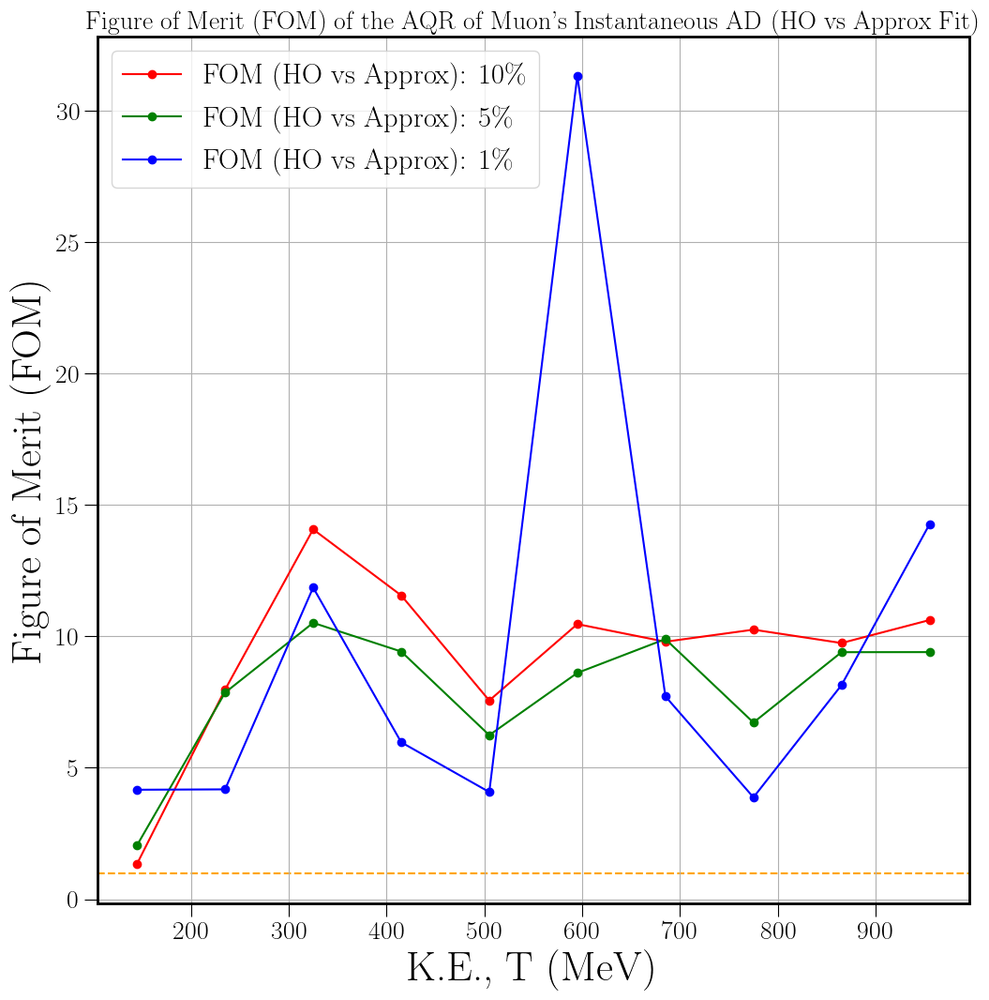

In [49]:
import matplotlib.pyplot as plt
import numpy as np

# ... [Previous setup code for fig and ax remains the same] ...
#Compare between AQRs of Muon's Integrated AD using HO vs Approx fit w/ Figure of Merit (FOM)

#Linear space in K.E.
# t = np.linspace(500, 1500, 41)
# print(t)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'K.E., T (MeV)', size= 32)
ax.set_ylabel(r'Figure of Merit (FOM)', size= 32)
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Figure of Merit (FOM) of the AQR of Muon\'s Instantaneous AD (HO vs Approx Fit)', fontsize=20)
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)


# --- Process HO Fit Datasets ---

# Define labels and colors for cleaner code: HO Fit
datasets1 = [
    (bin_centers1h, means_10h, errs_10h, 'red', 'o', '10\%'),
    (bin_centers2h, means_05h, errs_05h, 'green', '^', '5\%'),
    (bin_centers3h, means_01h, errs_01h, 'blue', 's', '1\%')
]

x1_list, y1_list, yerr1_list = [], [], []
for x_data, y_data, err_data, color, marker, label in datasets1:
    x_np, y_np, yerr_np = np.array(x_data), np.array(y_data), np.array(err_data)
    x1_list.append(x_np)
    y1_list.append(y_np)
    yerr1_list.append(yerr_np)


# --- Process Approx Fit Datasets ---

# Define labels and colors for cleaner code: Approx Fit

datasets2 = [
    (bin_centers1, means_10, errs_10, 'red', 'o', '10\%'),
    (bin_centers2, means_05, errs_05, 'green', '^', '5\%'),
    (bin_centers3, means_01, errs_01, 'blue', 's', '1\%')
]

x2_list, y2_list, yerr2_list = [], [], []
for x_data, y_data, err_data, color, marker, label in datasets2:
    x_np, y_np, yerr_np = np.array(x_data), np.array(y_data), np.array(err_data)
    x2_list.append(x_np)
    y2_list.append(y_np)
    yerr2_list.append(yerr_np)

# --- FOM calculation ---
# Convert lists to NumPy arrays so we can do math on them
# This creates arrays of shape (3, N)
Y1 = np.array(y1_list)
Y2 = np.array(y2_list)
E1 = np.array(yerr1_list)
E2 = np.array(yerr2_list)
X2 = np.array(x2_list)

# Calculate FOM for all three datasets at once
# fom1 uses geometric mean of errors, fom2 uses quadrature (standard)
fom1 = abs(Y2 - Y1) / np.sqrt(E1 * E2)
fom2 = abs(Y2 - Y1) / np.sqrt(E1**2 + E2**2)

# --- Plotting the Results ---
# Loop through the calculated FOMs to plot each line
labels = ['10\%', '5\%', '1\%']
colors = ['red', 'green', 'blue']

for i in range(len(fom2)):
    mask = ~np.isnan(fom2[i])
    ax.plot(X2[i][mask], fom2[i][mask], 
            label=f'FOM (HO vs Approx): {labels[i]}', 
            color=colors[i], marker='o')

plt.axhline(y=1, color='orange', linestyle='--', zorder=0)

ax.grid()
ax.legend(fontsize=22)

plt.savefig('FOM_AQR_ho_vs_approxfit_Cherenkov_instantaneous_AD_Muon_allTs_10_5_1_perc', bbox_inches='tight')

plt.show()


In [140]:
# #Linear space in K.E.
# # tp = np.linspace(500, 1500, 41)
# tm = np.linspace(100, 1000, 37)
# # print(t)

# # Create a figure and an axes object for 3D plotting:
# fig = plt.figure(figsize=(12,12))
# # ax = fig.add_subplot(111, projection='3d')
# ax = fig.add_subplot(111)

# # Set labels and title:
# ax.set_xlabel(r'K.E., T (MeV)', size= 30)
# ax.set_ylabel(r'Averaged Quantile Ratio (L/R)', size= 30)
# # ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
# ax.set_title('Averaged Cherenkov Quantile Ratio (L/R) of Muons (HO vs Approx Fit)', fontsize=23)
# # ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
# ax.tick_params(axis='both',which='major',labelsize=20,length=10)

# # ax.plot(t, nbyapps10, linewidth=4, c='r', label="Approx: 10\%", ls='dashdot')
# # ax.plot(t, nbyapps05, linewidth=4, c='g', label="Approx: 5\%", ls='dashdot')
# # ax.plot(t, nbyapps01, linewidth=4, c='b', label="Approx: 1\%", ls='dashdot')

# # ax.plot(t, nbyaphs10, linewidth=4, c='r', label="HO: 10\%")
# # ax.plot(t, nbyaphs05, linewidth=4, c='g', label="HO: 5\%")
# # ax.plot(t, nbyaphs01, linewidth=4, c='b', label="HO: 1\%")

# plt.plot(bin_centers4, bin_means4, color='red', marker='o', linestyle='--', label='Approx 10\%')
# plt.plot(bin_centers5, bin_means5, color='green', marker='^', linestyle='--', label='Approx 5\%')
# plt.plot(bin_centers6, bin_means6, color='blue', marker='s', linestyle='--', label='Approx 1\%')

# plt.plot(bin_centers4h, bin_means4h, color='red', marker='o', linestyle='solid', label='HO 10\%')
# plt.plot(bin_centers5h, bin_means5h, color='green', marker='^', linestyle='solid', label='HO 5\%')
# plt.plot(bin_centers6h, bin_means6h, color='blue', marker='s', linestyle='solid', label='HO 1\%')

# # plt.errorbar(x_values, y_estimates, yerr=jackknife_errors, fmt='o', capsize=4, ecolor='red', markersize=5)  #Jackknife errorbar
# plt.errorbar(bin_centers4, bin_means4, yerr=np.sqrt(var_jack10mu), fmt='o', capsize=4, ecolor='hotpink', markersize=5)  #Jackknife errorbar for 10% Q.ratio
# plt.errorbar(bin_centers5, bin_means5, yerr=np.sqrt(var_jack05mu), fmt='^', capsize=4, ecolor='olive', markersize=5)  #Jackknife errorbar for 10% Q.ratio
# plt.errorbar(bin_centers6, bin_means6, yerr=np.sqrt(var_jack01mu), fmt='s', capsize=4, ecolor='deepskyblue', markersize=5)  #Jackknife errorbar for 10% Q.ratio

# # plt.errorbar(x_values, y_estimates, yerr=jackknife_errors, fmt='o', capsize=4, ecolor='red', markersize=5)  #Jackknife errorbar
# plt.errorbar(bin_centers4h, bin_means4h, yerr=np.sqrt(var_jack10muh), fmt='o', capsize=4, ecolor='red', markersize=5, label='HO 10\% err')  #Jackknife errorbar for 10% Q.ratio
# plt.errorbar(bin_centers5h, bin_means5h, yerr=np.sqrt(var_jack05muh), fmt='^', capsize=4, ecolor='green', markersize=5, label='HO 5\% err')  #Jackknife errorbar for 10% Q.ratio
# plt.errorbar(bin_centers6h, bin_means6h, yerr=np.sqrt(var_jack01muh), fmt='s', capsize=4, ecolor='blue', markersize=5, label='HO 1\% err')  #Jackknife errorbar for 10% Q.ratio


# # # Add a vertical arrow
# # # x, y: starting point of the arrow
# # # dx, dy: length of the arrow along x and y directions
# # plt.arrow(x=1400, y=1.25, dx=0, dy=0.40, width=0.5, head_width=3.5, head_length=0.05, fc='r', ec='r')

# ax.grid()
# ax.legend()
# # plt.savefig('binned_avg_nbyas_hofit_Cherenkov_IAD_Proton_allT_from_saved_data', bbox_inches='tight')
# # plt.savefig('binned_avg_nbyas_ho_vs_approxfit_Cherenkov_IAD_Muon_allTs_10_5_1_perc_from_saved_data_w_jackknife_err_mplot5b', bbox_inches='tight')
# # plt.savefig('binned_avg_nbyas_ho_vs_approxfit_Cherenkov_IAD_Proton_allTs_10_perc_from_saved_data', bbox_inches='tight')


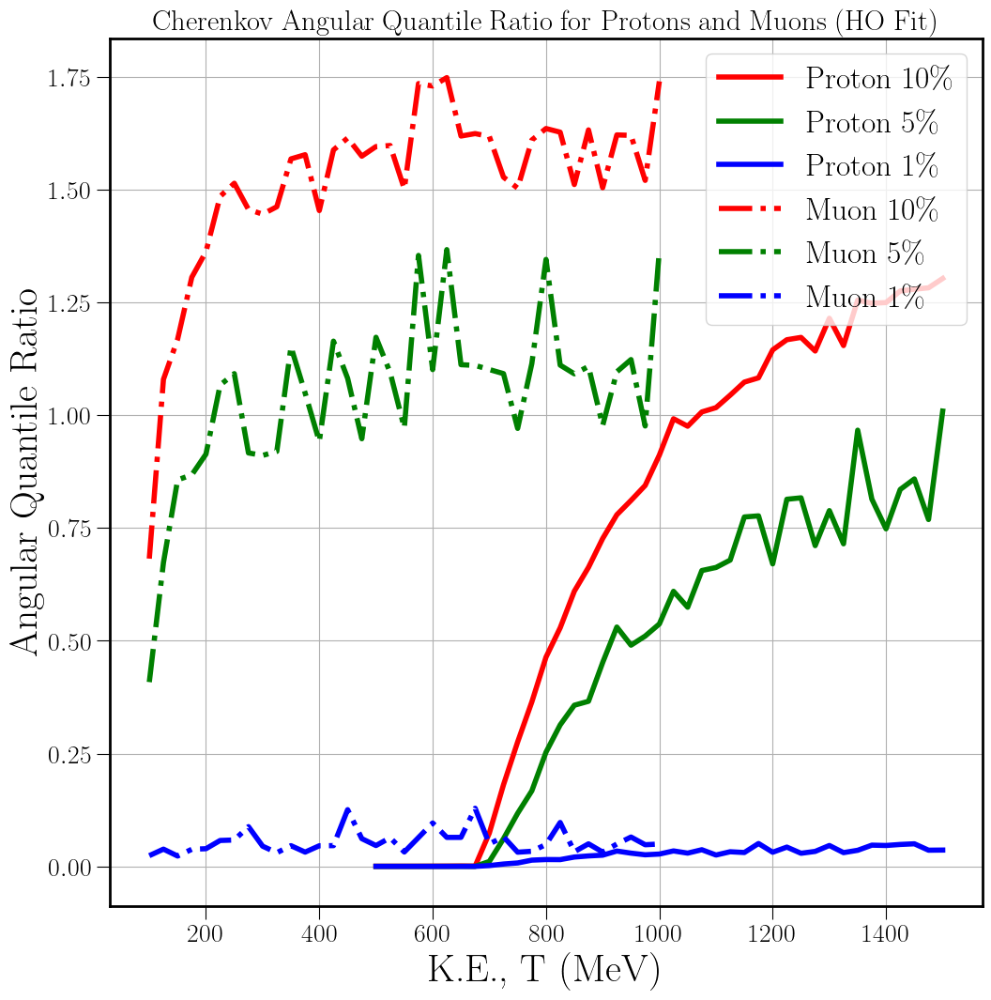

In [141]:
#Linear space in K.E.
tp = np.linspace(500, 1500, 41)
tm = np.linspace(100, 1000, 37)
# print(t)


# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'K.E., T (MeV)', size= 30)
ax.set_ylabel(r'Angular Quantile Ratio', size= 30) #$\frac{N}{A}$
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}

# ax.set_title('Cherenkov Angular Quantile Ratio for Protons (Approx Fit)')
# ax.set_title('Cherenkov Angular Quantile Ratio for Muons (Approx Fit)')
ax.set_title('Cherenkov Angular Quantile Ratio for Protons and Muons (HO Fit)', fontsize=22)

ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.plot(tp, nbyaphs10, linewidth=4, c='r', label='Proton $10\%$')
ax.plot(tp, nbyaphs05, linewidth=4, c='g', label='Proton $5\%$')
ax.plot(tp, nbyaphs01, linewidth=4, c='b', label='Proton $1\%$')

ax.plot(tm, nbyamuhs10, linewidth=4, ls='dashdot', c='r', label='Muon $10\%$')
ax.plot(tm, nbyamuhs05, linewidth=4, ls='dashdot', c='g', label='Muon $5\%$')
ax.plot(tm, nbyamuhs01, linewidth=4, ls='dashdot', c='b', label='Muon $1\%$')


ax.grid()
ax.legend()
# plt.savefig('nbyas_10_5_1_perc_hofit_Cherenkov_IAD_Proton_allT_from_saved_data', bbox_inches='tight')
# plt.savefig('nbyas_10_5_1_perc_hofit_Cherenkov_IAD_Muon_allT_from_saved_data', bbox_inches='tight')
# plt.savefig('nbyas_10_5_1_perc_hofit_Cherenkov_IAD_Proton_Muon_allT_from_saved_data_mplot2', bbox_inches='tight')
plt.show()


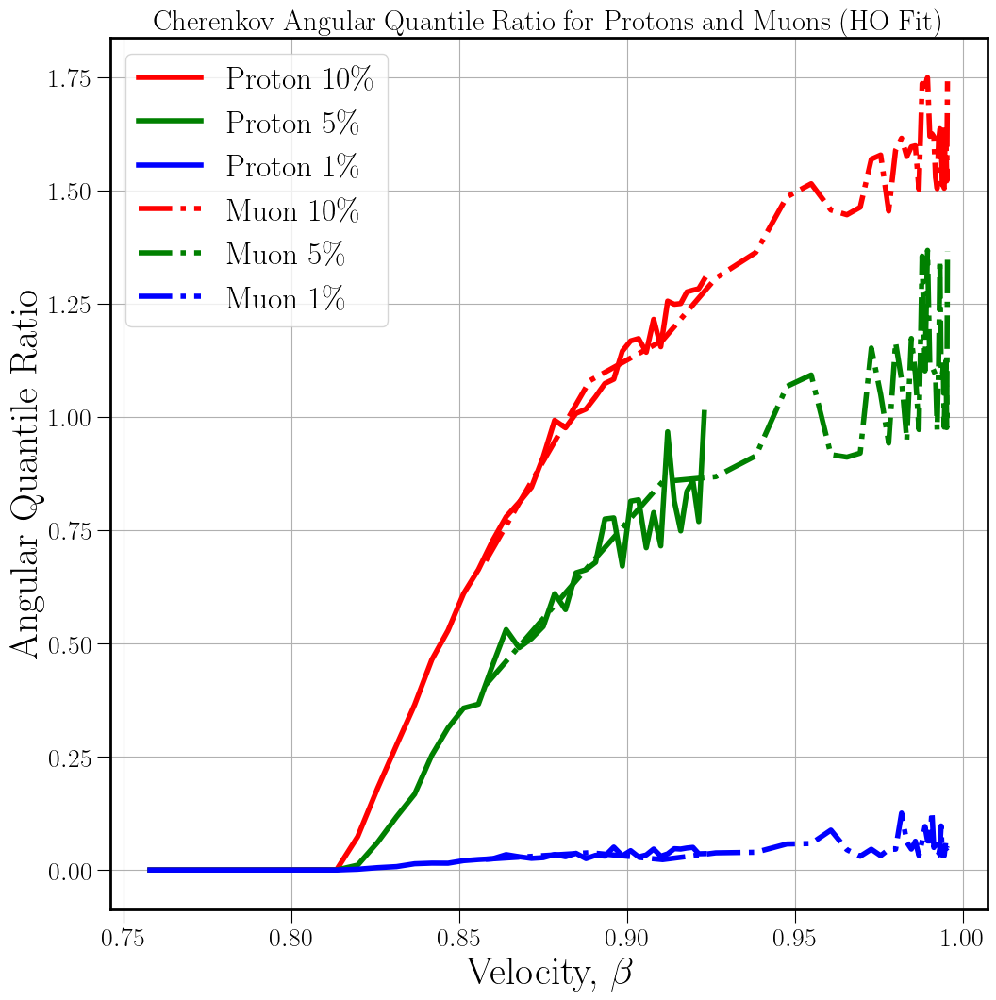

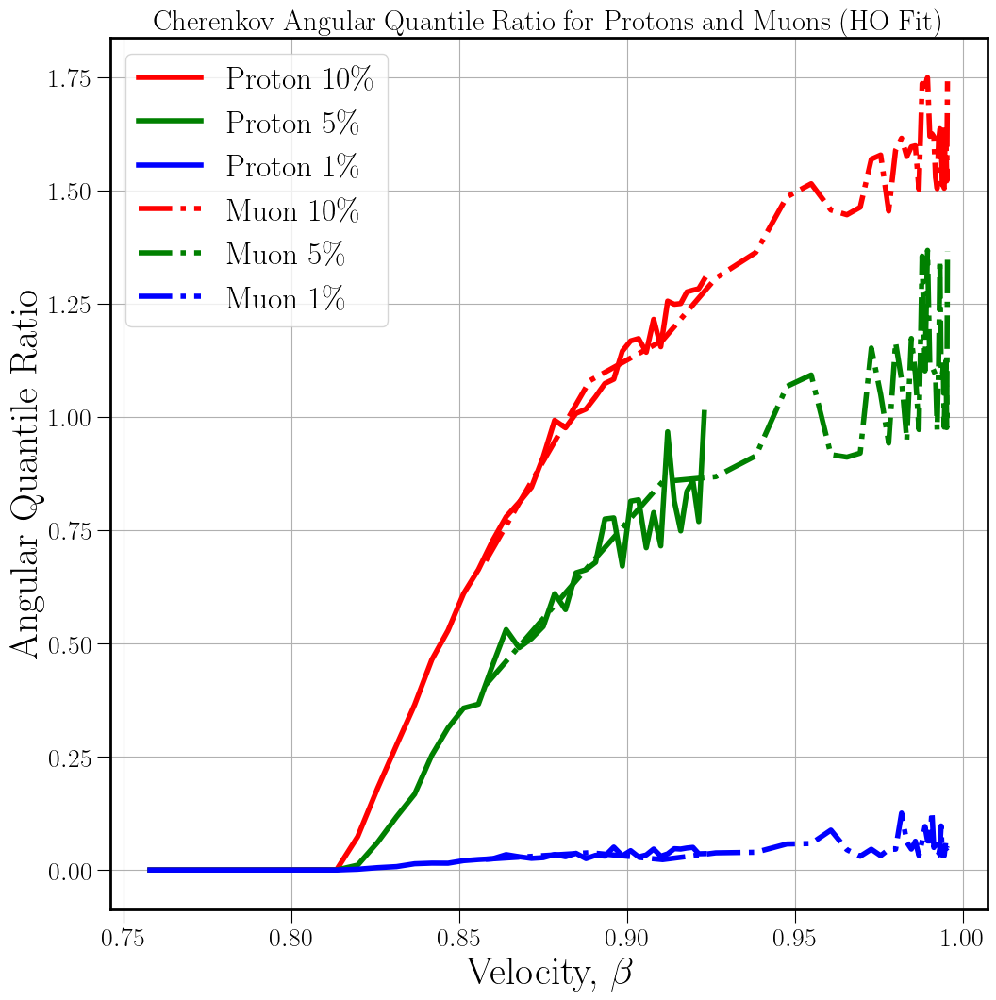

In [148]:
#Linear space in K.E.
tp = np.linspace(500, 1500, 41)
tm = np.linspace(100, 1000, 37)
# print(t)

#Mass of the particle travelling
mp = 938 #Proton's mass
mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²

betap  = np.sqrt(1 - (1/(1 + tp/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD
betamu  = np.sqrt(1 - (1/(1 + tm/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

# print (tp, betap, np.round(betap, 4))
# print (tm, betamu, np.round(betamu, 4))

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'Velocity, $\beta$', size= 30)
ax.set_ylabel(r'Angular Quantile Ratio', size= 30) #$\frac{N}{A}$
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}

# ax.set_title('Cherenkov Angular Quantile Ratio for Protons (Approx Fit)')
# ax.set_title('Cherenkov Angular Quantile Ratio for Muons (Approx Fit)')
ax.set_title('Cherenkov Angular Quantile Ratio for Protons and Muons (HO Fit)', fontsize=22)

ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.plot(betap, nbyaphs10, linewidth=4, c='r', label='Proton $10\%$')
ax.plot(betap, nbyaphs05, linewidth=4, c='g', label='Proton $5\%$')
ax.plot(betap, nbyaphs01, linewidth=4, c='b', label='Proton $1\%$')

ax.plot(betamu, nbyamuhs10, linewidth=4, ls='dashdot', c='r', label='Muon $10\%$')
ax.plot(betamu, nbyamuhs05, linewidth=4, ls='dashdot', c='g', label='Muon $5\%$')
ax.plot(betamu, nbyamuhs01, linewidth=4, ls='dashdot', c='b', label='Muon $1\%$')


ax.grid()
ax.legend()
# plt.savefig('nbyas_10_5_1_perc_hofit_Cherenkov_IAD_Proton_allbetas_from_saved_data', bbox_inches='tight')
# plt.savefig('nbyas_10_5_1_perc_hofit_Cherenkov_IAD_Muon_allbetas_from_saved_data', bbox_inches='tight')
# plt.savefig('nbyas_10_5_1_perc_hofit_Cherenkov_IAD_Proton_Muon_allbetas_from_saved_data', bbox_inches='tight')

plt.show()


# Instantaneous AD Quantile Ratio as a function of beta (Universal Scale)

[ 100.  125.  150.  175.  200.  225.  250.  275.  300.  325.  350.  375.
  400.  425.  450.  475.  500.  525.  550.  575.  600.  625.  650.  675.
  700.  725.  750.  775.  800.  825.  850.  875.  900.  925.  950.  975.
 1000. 1025. 1050. 1075. 1100. 1125. 1150. 1175. 1200. 1225. 1250. 1275.
 1300. 1325. 1350. 1375. 1400. 1425. 1450. 1475. 1500.]


ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

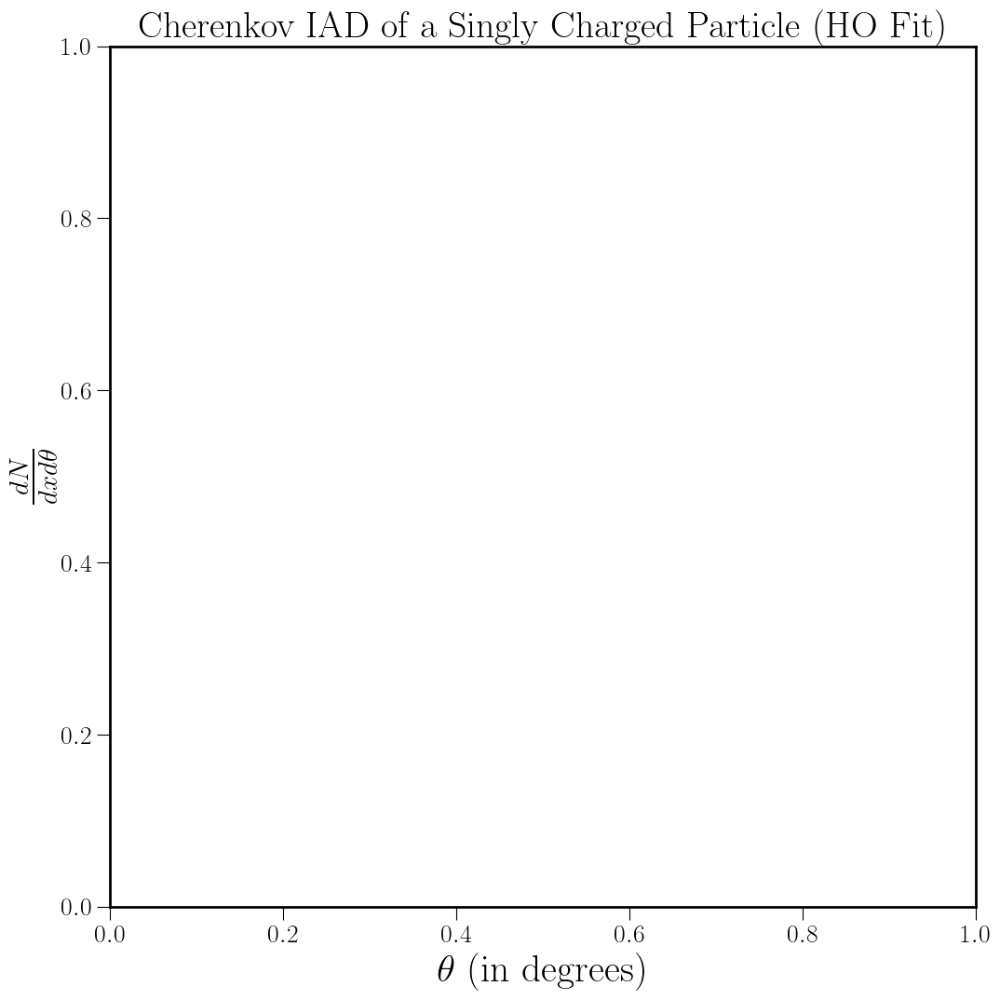

In [117]:
#HO Fit: Proton & Muon 
#Import libraries
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np


#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

# matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
# plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'$\theta$ (in degrees)', size= 30)
ax.set_ylabel(r'$\frac{dN}{dx d\theta}$', size= 30)
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Cherenkov IAD of a Singly Charged Particle (HO Fit)')
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)


# #Defining integration window

# theta_window = (thetamax - thetamin)/10 #10% of databins # dp = (thetamax - thetamin)/(180/(2*2000)) 

# dp = np.round(2000*2*theta_window/180) #no. of datapoints within theta_window

# min_window = thetamin + theta_window

# max_window = thetamax - theta_window 



#Define a function to find the index of the desired element

def find_nearest_index_numpy(arr, value):
    """
    Finds the index of the element closest to 'value' in a NumPy array.
    """
    arr = np.array(arr)  # Ensure it's a NumPy array
    idx = np.abs(arr - value).argmin()
    return idx

#Explanation:
# np.abs(arr - value) calculates the absolute difference between each element in the array and the value.
# .argmin() returns the index of the minimum value in the resulting array of absolute differences, which corresponds to the element closest to value.

#Linear space in K.E.
tp = np.linspace(500, 1500, 41)
tm = np.linspace(100, 1000, 37)
t = np.linspace(100, 1500, 57) 
print(t)

mp = 938  #Proton's mass in MeV
betap  = np.sqrt(1 - (1/(1 + tp/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD
mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²
betamu  = np.sqrt(1 - (1/(1 + tm/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

if t < 500:
    print(t)
#     beta = np.sqrt(1 - (1/(1 + t/mm)**2))
# else: 
#     beta = np.sqrt(1 - (1/(1 + t/mp)**2))
    
# print (t, np.round(betap,4), np.round(betamu,4), np.round(beta,4) )

# n_peakr = 1.3605
# n_500 = 1.2278

# cos_ang_min = []
# con_ang_maxn = []
# thetamax = []
# thetamin = []


# # Load the .npz file
# #HO fit
# # pdata500ho = np.load('IAD_new_data_for_PID\\iCherenkovdata_p_500_ho.npz')

# # Create an empty dictionary to store the data.
# data_dict = {}

# # itotalts = []
# # inormalts = []
# # ianomts = []

# # itotalbts = []

# itotalths = []
# inormalths = []
# ianomths = []

# # itotalbts = []

# itpnormhs10 = []
# itpanomhs10 = []
# nbyamuhs10 = []
# abynmuhs10 = []

# itpnormhs05 = []
# itpanomhs05 = []
# nbyamuhs05 = []
# abynmuhs05 = []

# itpnormhs01 = []
# itpanomhs01 = []
# nbyamuhs01 = []
# abynmuhs01 = []

# # Loop through your values
# for val in i:
#     # Use an f-string to generate the key for the dictionary. (HO)
#     # key = f"pdata_{val:.0f}_ho"
#     ho = f"mudata_{val:.0f}_ho"
    
#     # Use another f-string to generate the filename for loading.
#     filename5 = fr"IAD_new_data_for_PID\iCherenkovdata_mu_{val:.0f}_ho.npz"
    
#     # Store the loaded data in the dictionary using the generated key.
#     # data_dict[key] = np.load(filename)
#     data_dict[ho] = np.load(filename2) 

#     costhetah = data_dict[ho]['costheta']
#     thetah = data_dict[ho]['theta']
#     itotalh = data_dict[ho]['itotalho']
#     inormalh = data_dict[ho]['inormalho']
#     ianomh = data_dict[ho]['ianomalousho']
#     thetadegh = thetah*(180/np.pi) 
#     itotalth = itotalh*np.sin(thetah)
#     inormalth = inormalh*np.sin(thetah)
#     ianomth = ianomh*np.sin(thetah)
#     # print(costheta)
    
#     ax.plot(thetadegh, itotalth, label='Total')
#     # ax.plot(thetadeg, inormalt, label='Normal')
#     # ax.plot(thetadeg, ianomt, label='Anomalous')

    
#     # itotalts.append(itotalt.tolist())  
#     # inormalts.append(inormalt)
#     # ianomts.append(ianomt)
    
#     itotalths.append(itotalth)

#     # i  = np.sqrt(1 - (1/(1 + val/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD
#     i  = np.sqrt(1 - (1/(1 + val/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD


#     #Quantile Window: Integration Stepsize 
    
#     cos_ang_minh = 1/(i * n_peakr)
#     thetamaxh = np.arccos(cos_ang_minh)*(180/np.pi)
    
#     cos_ang_maxh = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
#     # cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
#     thetaminh = np.arccos(cos_ang_maxh)*(180/np.pi)

#     #Defining integration window

#     theta_windowh10 = (thetamaxh - thetaminh)/10 #10% of databins # dp = (thetamax - thetamin)/(180/(2*2000))
#     theta_windowh05 = (thetamaxh - thetaminh)/20 #5% of databins # dp = (thetamax - thetamin)/(180/(2*2000))
#     theta_windowh01 = (thetamaxh - thetaminh)/100 #1% of databins # dp = (thetamax - thetamin)/(180/(2*2000))
    
#     dph10 = np.round(2000*2*theta_windowh10/180) #no. of datapoints within theta_window
#     dph05 = np.round(2000*2*theta_windowh05/180) #no. of datapoints within theta_window
#     dph01 = np.round(2000*2*theta_windowh01/180) #no. of datapoints within theta_window
    
#     min_windowh10 = thetaminh + theta_windowh10
#     max_windowh10 = thetamaxh - theta_windowh10 

#     min_windowh05 = thetaminh + theta_windowh05
#     max_windowh05 = thetamaxh - theta_windowh05 

#     min_windowh01 = thetaminh + theta_windowh01
#     max_windowh01 = thetamaxh - theta_windowh01 

    
#     # print(i, thetamin, min_window, max_window, thetamax)
#     print('K.E.={}, beta={}, dp={}, theta_windowh={}, thetaminh={}, min_windowh={}, max_windowh={}, thetamaxh={}'.format(val, i, dph10, theta_windowh10, thetaminh, min_windowh10, max_windowh10, thetamaxh)) 
    
    
#     # Example usage:
#     my_array = thetadegh

#     #10% Quantile
    
#     #Theta_min
#     min_valueh = thetaminh
#     min_indexh = find_nearest_index_numpy(my_array, min_valueh)
#     print(f"The element closest to {min_valueh} is at index: {min_indexh}")
#     print(f"The closest element is: {my_array[min_indexh]}")
    
#     #Min_window
#     min_window_valueh = thetaminh + theta_windowh10
#     min_window_indexh = find_nearest_index_numpy(my_array, min_window_valueh)
#     print(f"The element closest to {min_window_valueh} is at index: {min_window_indexh}")
#     print(f"The closest element is: {my_array[min_window_indexh]}")
    
#     #Max_window
#     max_window_valueh = thetamaxh - theta_windowh10
#     max_window_indexh = find_nearest_index_numpy(my_array, max_window_valueh)
#     print(f"The element closest to {max_window_valueh} is at index: {max_window_indexh}")
#     print(f"The closest element is: {my_array[max_window_indexh]}")
    
#     #Theta_max
#     max_valueh = thetamaxh
#     max_indexh = find_nearest_index_numpy(my_array, max_valueh)
#     print(f"The element closest to {max_valueh} is at index: {max_indexh}")
#     print(f"The closest element is: {my_array[max_indexh]}")
    
#     # Sum i-th to j-th elements of an array) 
    
#     itotalnormh10 = itotalth[min_indexh:min_window_indexh]    
#     itotalanomh10 = itotalth[max_window_indexh:max_indexh]
    
#     print('{} MeV Muon: 10 % Normal Quantile = {}, 10 % Anomalous Quantile = {}'.format(val, itotalnormh10, itotalanomh10))
    
#     # itnorm = sum(itotalnorm)* (thetamin + min_window)/2 
#     # itanom = sum(itotalanom)* (max_window + thetamax)/2 
    
#     # print('For {} MeV Proton: theta_window/dp = {}'.format(val, theta_window/dp))
    
#     itnormh10 = sum(itotalnormh10) * (theta_windowh10/dph10) 
#     itanomh10 = sum(itotalanomh10) * (theta_windowh10/dph10) 
    
#     nbyamuh10 = itnormh10 / itanomh10
#     abynmuh10 = itanomh10 / itnormh10
    
#     print('{} MeV Muon: Sum of 10 % Normal Quantile = {}, Sum of 10 % Anomalous Quantile = {}, 10 %  Normal/Anomalous = {}, 10 % Anomalous/Normal = {}'.format(val, itnormh10, itanomh10, nbyamuh10, 1/nbyamuh10))

#     # itotalts.append(itotalt.tolist())  

#     itpnormhs10.append(itnormh10)
#     itpanomhs10.append(itanomh10)
#     nbyamuhs10.append(nbyamuh10)
#     abynmuhs10.append(abynmuh10)

#     #5% Quantile

#     print('K.E.={}, beta={}, dp={}, theta_windowh={}, thetaminh={}, min_windowh={}, max_windowh={}, thetamaxh={}'.format(val, i, dph05, theta_windowh05, thetaminh, min_windowh05, max_windowh05, thetamaxh)) 
    
    
#     #Theta_min
#     min_valueh = thetaminh
#     min_indexh = find_nearest_index_numpy(my_array, min_valueh)
#     print(f"The element closest to {min_valueh} is at index: {min_indexh}")
#     print(f"The closest element is: {my_array[min_indexh]}")
    
#     #Min_window
#     min_window_valueh = thetaminh + theta_windowh05
#     min_window_indexh = find_nearest_index_numpy(my_array, min_window_valueh)
#     print(f"The element closest to {min_window_valueh} is at index: {min_window_indexh}")
#     print(f"The closest element is: {my_array[min_window_indexh]}")
    
#     #Max_window
#     max_window_valueh = thetamaxh - theta_windowh05
#     max_window_indexh = find_nearest_index_numpy(my_array, max_window_valueh)
#     print(f"The element closest to {max_window_valueh} is at index: {max_window_indexh}")
#     print(f"The closest element is: {my_array[max_window_indexh]}")
    
#     #Theta_max
#     max_valueh = thetamaxh
#     max_indexh = find_nearest_index_numpy(my_array, max_valueh)
#     print(f"The element closest to {max_valueh} is at index: {max_indexh}")
#     print(f"The closest element is: {my_array[max_indexh]}")
    
#     # Sum i-th to j-th elements of an array) 
    
#     itotalnormh05 = itotalth[min_indexh:min_window_indexh]     
#     itotalanomh05 = itotalth[max_window_indexh:max_indexh]
    
#     print('{} MeV Muon: 5 % Normal Quantile = {}, 5 % Anomalous Quantile = {}'.format(val, itotalnormh05, itotalanomh05))
    
#     # itnorm = sum(itotalnorm)* (thetamin + min_window)/2 
#     # itanom = sum(itotalanom)* (max_window + thetamax)/2 
    
#     # print('For {} MeV Proton: theta_window/dp = {}'.format(val, theta_window/dp))
    
#     itnormh05 = sum(itotalnormh05) * (theta_windowh05/dph05) 
#     itanomh05 = sum(itotalanomh05) * (theta_windowh05/dph05) 
    
#     nbyamuh05 = itnormh05 / itanomh05
#     abynmuh05 = itanomh05 / itnormh05
    
#     print('{} MeV Muon: Sum of 5 % Normal Quantile = {}, Sum of 5 % Anomalous Quantile = {}, 5 % Normal/Anomalous = {}, 5 % Anomalous/Normal = {}'.format(val, itnormh05, itanomh05, nbyamuh05, 1/nbyamuh05))

#     # itotalts.append(itotalt.tolist())  

#     itpnormhs05.append(itnormh05)
#     itpanomhs05.append(itanomh05)
#     nbyamuhs05.append(nbyamuh05)
#     abynmuhs05.append(abynmuh05)

#     #1% Quantile

#     print('K.E.={}, beta={}, dp={}, theta_windowh={}, thetaminh={}, min_windowh={}, max_windowh={}, thetamaxh={}'.format(val, i, dph01, theta_windowh01, thetaminh, min_windowh01, max_windowh01, thetamaxh)) 
    
    
#     #Theta_min
#     min_valueh = thetaminh
#     min_indexh = find_nearest_index_numpy(my_array, min_valueh)
#     print(f"The element closest to {min_valueh} is at index: {min_indexh}")
#     print(f"The closest element is: {my_array[min_indexh]}")
    
#     #Min_window
#     min_window_valueh = thetaminh + theta_windowh01
#     min_window_indexh = find_nearest_index_numpy(my_array, min_window_valueh)
#     print(f"The element closest to {min_window_valueh} is at index: {min_window_indexh}")
#     print(f"The closest element is: {my_array[min_window_indexh]}")
    
#     #Max_window
#     max_window_valueh = thetamaxh - theta_windowh01
#     max_window_indexh = find_nearest_index_numpy(my_array, max_window_valueh)
#     print(f"The element closest to {max_window_valueh} is at index: {max_window_indexh}")
#     print(f"The closest element is: {my_array[max_window_indexh]}")
    
#     #Theta_max
#     max_valueh = thetamaxh
#     max_indexh = find_nearest_index_numpy(my_array, max_valueh)
#     print(f"The element closest to {max_valueh} is at index: {max_indexh}")
#     print(f"The closest element is: {my_array[max_indexh]}")
    
#     # Sum i-th to j-th elements of an array) 
    
#     itotalnormh01 = itotalth[min_indexh:min_window_indexh] 
#     itotalanomh01 = itotalth[max_window_indexh:max_indexh]
    
#     print('{} MeV Muon: 1 % Normal Quantile = {}, 1 % Anomalous Quantile = {}'.format(val, itotalnormh01, itotalanomh01))
    
#     # itnorm = sum(itotalnorm)* (thetamin + min_window)/2 
#     # itanom = sum(itotalanom)* (max_window + thetamax)/2 
    
#     # print('For {} MeV Proton: theta_window/dp = {}'.format(val, theta_window/dp))
    
#     itnormh01 = sum(itotalnormh01) * (theta_windowh01/dph01) 
#     itanomh01 = sum(itotalanomh01) * (theta_windowh01/dph01) 
    
#     nbyamuh01 = itnormh01 / itanomh01
#     abynmuh01 = itanomh01 / itnormh01
    
#     print('{} MeV Muon: Sum of 1 % Normal Quantile = {}, Sum of 1 % Anomalous Quantile = {}, 1 % Normal/Anomalous = {}, 1 % Anomalous/Normal = {}'.format(val, itnormh01, itanomh01, nbyamuh01, 1/nbyamuh01))

#     # itotalts.append(itotalt.tolist())  

#     itpnormhs01.append(itnormh01)
#     itpanomhs01.append(itanomh01)
#     nbyamuhs01.append(nbyamuh01)
#     abynmuhs01.append(abynmuh01)



# # print(np.shape(itpnormps05), np.shape(itpanomps05))
# # print(itotalts.flatten())


# ################################################################################################################################
# # ax.legend(fontsize=18)
# ax.set_xlim(0,50)
# ax.grid()

# # plt.savefig('Cherenkov_IAD_Proton_Muon_allbetas_new_data_ho', bbox_inches='tight')
# # plt.savefig('Cherenkov_IAD_Proton_Muon_allbetas_new_data_ho', bbox_inches='tight')
# # plt.savefig('Cherenkov_IAD_Proton_Muon_allbetas_new_data_babicz', bbox_inches='tight')
# # plt.savefig('Cherenkov_IAD_Proton_Muon_allbetas_new_data_ho', bbox_inches='tight')

# # Close the file
# # ho.close()
# # pdata500ho.close()
# # pdata800ho.close()
# # pdata1000ho.close()

# Quantile Ratio (L/R ~ N/A) from Proton's AD (Approx fit)

In [89]:
# Linear space in K.E.
tp = np.linspace(500, 1500, 41)
# print(t)

mp = 938  #Proton's mass in MeV
betap  = np.sqrt(1 - (1/(1 + tp/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

print("Proton: {}, {}, {}".format(tp, betap, np.round(betap,4)))

# #Linear space in K.E.
tm = np.linspace(100, 1000, 37)
# # print(t)

# #Mass of the particle travelling
# # mp = 938 #Proton's mass
mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²

betamu  = np.sqrt(1 - (1/(1 + tm/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

print("Muon: {}, {}, {}".format( tm, betamu, np.round(betamu, 4)))


Proton: [ 500.  525.  550.  575.  600.  625.  650.  675.  700.  725.  750.  775.
  800.  825.  850.  875.  900.  925.  950.  975. 1000. 1025. 1050. 1075.
 1100. 1125. 1150. 1175. 1200. 1225. 1250. 1275. 1300. 1325. 1350. 1375.
 1400. 1425. 1450. 1475. 1500.], [0.75796532 0.76741698 0.77628968 0.78463315 0.79249149 0.79990401
 0.80690583 0.81352846 0.81980026 0.82574686 0.83139144 0.83675507
 0.8418569  0.84671442 0.8513436  0.85575908 0.85997431 0.86400164
 0.86785245 0.87153724 0.87506571 0.87844687 0.88168902 0.88479989
 0.88778668 0.89065607 0.89341428 0.89606712 0.89862002 0.90107804
 0.90344595 0.90572818 0.9079289  0.91005203 0.91210124 0.91407999
 0.91599153 0.91783893 0.91962507 0.92135268 0.92302433], [0.758  0.7674 0.7763 0.7846 0.7925 0.7999 0.8069 0.8135 0.8198 0.8257
 0.8314 0.8368 0.8419 0.8467 0.8513 0.8558 0.86   0.864  0.8679 0.8715
 0.8751 0.8784 0.8817 0.8848 0.8878 0.8907 0.8934 0.8961 0.8986 0.9011
 0.9034 0.9057 0.9079 0.9101 0.9121 0.9141 0.916  0.9178 0.9196 0.9

In [342]:
approx = np.load('Cherenkov_data_for_PID\\Cherenkovdata_p500_approx.npz', allow_pickle=True)
# ho = np.load('Cherenkov_data_for_PID\\Cherenkovdata_p1500_ho.npz', allow_pickle=True)
# Cherenkovdata_p1000_ho.npz

print(approx.files)

print(approx['theta']) #theta saved in radian unit
print(np.nonzero(approx['totalapprox']))
# print(approx['totalapprox'][607:893])
# print(approx['inormalapprox'])
# print(approx['ianomalousapprox'])

# List the names of the arrays in the file
# print(pdata500ho.files)
# print(pdata500b.files)



['theta', 'costheta', 'totalapprox', 'normalapprox', 'anomalousapprox', 'scint']
[0.00000000e+00 7.85791059e-04 1.57158212e-03 ... 1.56922474e+00
 1.57001054e+00 1.57079633e+00]
(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 14

[ 500.  525.  550.  575.  600.  625.  650.  675.  700.  725.  750.  775.
  800.  825.  850.  875.  900.  925.  950.  975. 1000. 1025. 1050. 1075.
 1100. 1125. 1150. 1175. 1200. 1225. 1250. 1275. 1300. 1325. 1350. 1375.
 1400. 1425. 1450. 1475. 1500.]
K.E.=500.0, beta=0.7579653181328908, dp=48.0, theta_windowp=2.16158657550971, thetaminp=0.0, min_windowp=2.16158657550971, max_windowp=19.454279179587388, thetamaxp=21.615865755097097
The element closest to 0.0 is at index: 0
The closest element is: 0.0
The element closest to 2.16158657550971 is at index: 48
The closest element is: 2.161080540270135
The element closest to 19.454279179587388 is at index: 432
The closest element is: 19.449724862431218
The element closest to 21.615865755097097 is at index: 480
The closest element is: 21.610805402701352
500.0 MeV Proton: 10% Normal Quantile = [0.00000000e+00 1.85337034e-04 1.48316159e-03 5.00847255e-03
 1.18823776e-02 2.32394375e-02 3.98356144e-02 6.33058778e-02
 9.45897292e-02 1.34851216e-01 

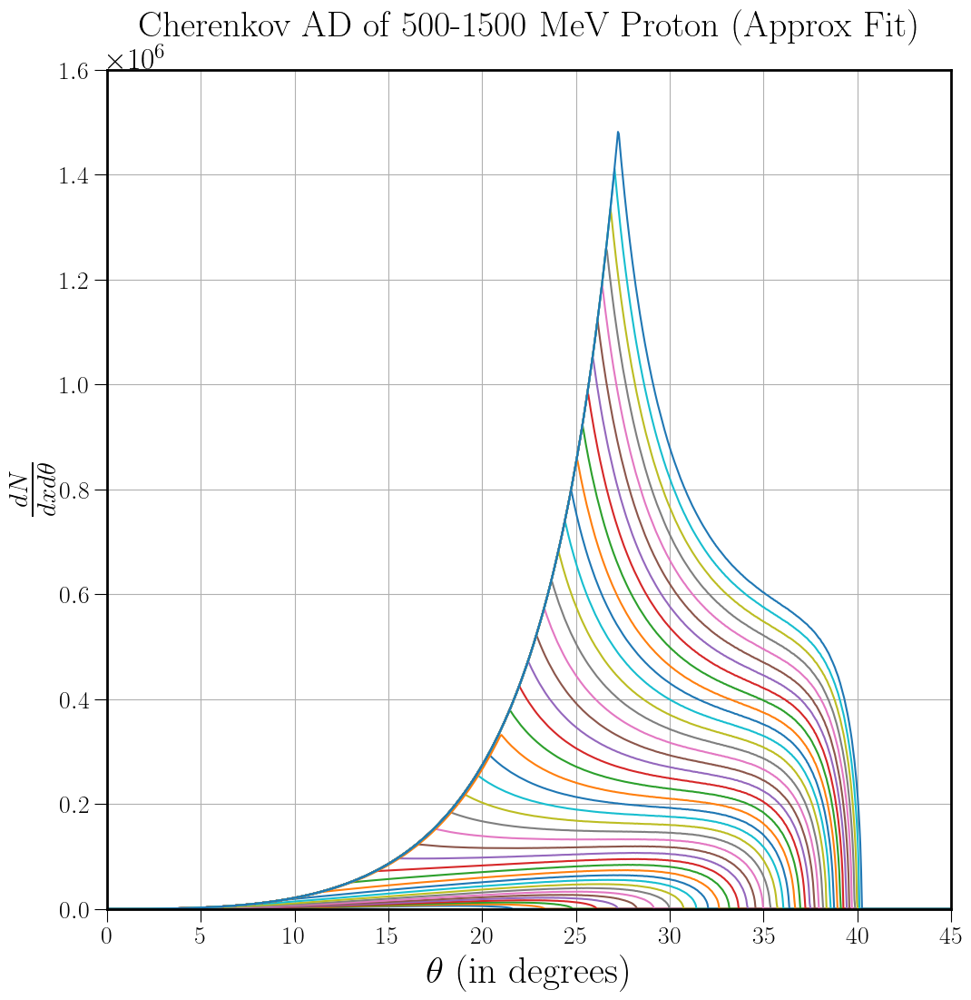

In [91]:
#Approx Fit 
#Import libraries
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

#Our (PVS) Fit: 
    
alpha = 1/137 #Fine-structure (EM coupling) constant 
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652
n_max = 1.4191220261503081

#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #absorptive model peak

# lamd_uv = 106.6 #lambda_UV = 106.6 nm
# lamd_ir = 908.3 #lambda_IR = 908.3 nm 

# lamd = np.linspace(90,700,2000)

n_uvr = a_0j #when lamd -> lamd_UV
n_500 = 1.2278
# n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf


# print("n_uv = {}, n_peak = {}, n_500= {}, n_asymtote = {}".format(n_uvr, n_peakr, n_500, n_asymtoter))

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

# matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
# plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'$\theta$ (in degrees)', size= 30)
ax.set_ylabel(r'$\frac{dN}{dx d\theta}$', size= 30)
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
# ax.set_title('Cherenkov IAD of a Proton (HO Fit)')
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.set_title('Cherenkov AD of 500-1500 MeV Proton (Approx Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)


#Define a function to find the index of the desired element

def find_nearest_index_numpy(arr, value):
    """
    Finds the index of the element closest to 'value' in a NumPy array.
    """
    arr = np.array(arr)  # Ensure it's a NumPy array
    idx = np.abs(arr - value).argmin()
    return idx

#Explanation:
# np.abs(arr - value) calculates the absolute difference between each element in the array and the value.
# .argmin() returns the index of the minimum value in the resulting array of absolute differences, which corresponds to the element closest to value.


#Linear space in K.E.
t = np.linspace(500, 1500, 41)
print(t)

mp = 938  #Proton's mass in MeV
betap  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

# print (t, betap, np.round(betap,3))

cos_ang_minp = []
con_ang_maxnp = []
thetamaxp = []
thetaminp = []



# Load the .npz file
#HO fit
# pdata500ho = np.load('IAD_new_data_for_PID\\iCherenkovdata_p_500_ho.npz')
#Babicz fit
# pdata500b = np.load('IAD_new_data_for_PID\\iCherenkovdata_p_500_babicz.npz')


# Create an empty dictionary to store the data.
data_dict = {}

totalts = []
normalts = []
anomts = []

totaltps = []
normaltps = []
anomtps = []

# itotalbts = []

tpnormps10 = []
tpanomps10 = []
nbyapps10 = []
abynpps10 = []

tpnormps05 = []
tpanomps05 = []
nbyapps05 = []
abynpps05 = []

tpnormps01 = []
tpanomps01 = []
nbyapps01 = []
abynpps01 = []


# Loop through your values
for val in t:
    # Use an f-string to generate the key for the dictionary. (HO)
    # key = f"pdata_{val:.0f}_ho"
    # ho = f"pdata_{val:.0f}_ho"
    ap = f"pdata_{val:.0f}_approx"
    
    # Use another f-string to generate the filename for loading.
    # filename1 = fr"IAD_new_data_for_PID\iCherenkovdata_p_{val:.0f}_ho.npz"
    filename3 = fr"Cherenkov_new_data_for_PID\Cherenkovdata_p{val:.0f}_approx.npz"
    
    # Store the loaded data in the dictionary using the generated key.
    # data_dict[key] = np.load(filename)
    # #HO Fit
    # data_dict[ho] = np.load(filename1) 

    # costheta = data_dict[ho]['costheta']
    # theta = data_dict[ho]['theta']
    # itotal = data_dict[ho]['itotalho']
    # inormal = data_dict[ho]['inormalho']
    # ianom = data_dict[ho]['ianomalousho']
    # thetadeg = theta*(180/np.pi) 
    # itotalt = itotal*np.sin(theta)
    # inormalt = inormal*np.sin(theta)
    # ianomt = ianom*np.sin(theta)
    # # print(costheta)

    #Approx Fit
    data_dict[ap] = np.load(filename3, allow_pickle=True) 

    costhetap = data_dict[ap]['costheta']
    thetap = data_dict[ap]['theta']
    totalp = data_dict[ap]['totalapprox']
    # inormalp = data_dict[ap]['inormalapprox']
    # ianomp = data_dict[ap]['ianomalousapprox']
    thetadegp = thetap*(180/np.pi) 
    totaltp = totalp*np.sin(thetap)
    # normaltp = normalp*np.sin(thetap)
    # anomtp = anomp*np.sin(thetap)
    
    # ax.plot(thetadeg, itotalt, label='Total (HO)')
    # ax.plot(thetadeg, inormalt, label='Normal (HO)')
    # ax.plot(thetadeg, ianomt, label='Anomalous (HO)')

    ax.plot(thetadegp, totaltp, label='Total (Approx)')
    # ax.plot(thetadegp, inormaltp, label='Normal (Approx)')
    # ax.plot(thetadegp, ianomtp, label='Anomalous (Approx)')

    # ax.plot(theta*(180/np.pi), itotalbt, label='Babicz')
    
    # ax.plot(theta*(180/np.pi), itotalbt, label='Total')

    # itotalts.append(itotalt) #.tolist())  
    # inormalts.append(inormalt)
    # ianomts.append(ianomt)

    totaltps.append(totaltp) #.tolist())  
    # inormaltps.append(inormaltp)
    # ianomtps.append(ianomtp)
    
    # itotalbts.append(itotalbt)

    
    # itotalts.append(itotalt.tolist())  
    # inormalts.append(inormalt)
    # ianomts.append(ianomt)
    
    # itotalbts.append(itotalbt)

    
    i  = np.sqrt(1 - (1/(1 + val/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD


    #Quantile Window: Integration Stepsize 
    
    cos_ang_minp = 1/(i * n_max) #Approx Fit
    thetamaxp = np.arccos(cos_ang_minp)*(180/np.pi)
    
    cos_ang_maxnp = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
    # cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
    thetaminp = np.arccos(cos_ang_maxnp)*(180/np.pi)

    
    #Defining integration window

    theta_windowp10 = (thetamaxp - thetaminp)/10 #10% of databins # dp = (thetamax - thetamin)/(180/(2*2000))
    theta_windowp05 = (thetamaxp - thetaminp)/20 #5% of databins # dp = (thetamax - thetamin)/(180/(2*2000))
    theta_windowp01 = (thetamaxp - thetaminp)/100 #1% of databins # dp = (thetamax - thetamin)/(180/(2*2000))
    
    dpp10 = np.round(2000*2*theta_windowp10/180) #no. of datapoints within theta_window
    dpp05 = np.round(2000*2*theta_windowp05/180) #no. of datapoints within theta_window
    dpp01 = np.round(2000*2*theta_windowp01/180) #no. of datapoints within theta_window
    
    min_windowp10 = thetaminp + theta_windowp10
    max_windowp10 = thetamaxp - theta_windowp10 

    min_windowp05 = thetaminp + theta_windowp05
    max_windowp05 = thetamaxp - theta_windowp05 

    min_windowp01 = thetaminp + theta_windowp01
    max_windowp01 = thetamaxp - theta_windowp01 

    
    # print(i, thetamin, min_window, max_window, thetamax)
    print('K.E.={}, beta={}, dp={}, theta_windowp={}, thetaminp={}, min_windowp={}, max_windowp={}, thetamaxp={}'.format(val, i, dpp10, theta_windowp10, thetaminp, min_windowp10, max_windowp10, thetamaxp)) 
    
    
    # Example usage:
    my_array = thetadegp

    #10% Quantile
    
    #Theta_min
    min_valuep = thetaminp
    min_indexp = find_nearest_index_numpy(my_array, min_valuep)
    print(f"The element closest to {min_valuep} is at index: {min_indexp}")
    print(f"The closest element is: {my_array[min_indexp]}")
    
    #Min_window
    min_window_valuep = thetaminp + theta_windowp10
    min_window_indexp = find_nearest_index_numpy(my_array, min_window_valuep)
    print(f"The element closest to {min_window_valuep} is at index: {min_window_indexp}")
    print(f"The closest element is: {my_array[min_window_indexp]}")
    
    #Max_window
    max_window_valuep = thetamaxp - theta_windowp10
    max_window_indexp = find_nearest_index_numpy(my_array, max_window_valuep)
    print(f"The element closest to {max_window_valuep} is at index: {max_window_indexp}")
    print(f"The closest element is: {my_array[max_window_indexp]}")
    
    #Theta_max
    max_valuep = thetamaxp
    max_indexp = find_nearest_index_numpy(my_array, max_valuep)
    print(f"The element closest to {max_valuep} is at index: {max_indexp}")
    print(f"The closest element is: {my_array[max_indexp]}")
    
    # Sum i-th to j-th elements of an array) 
    
    totalnormp10 = totaltp[min_indexp:min_window_indexp] 
    
    totalanomp10 = totaltp[max_window_indexp:max_indexp]
    
    print('{} MeV Proton: 10% Normal Quantile = {}, 10% Anomalous Quantile = {}'.format(val, totalnormp10, totalanomp10))
    
    # itnorm = sum(itotalnorm)* (thetamin + min_window)/2 
    # itanom = sum(itotalanom)* (max_window + thetamax)/2 
    
    # print('For {} MeV Proton: theta_window/dp = {}'.format(val, theta_window/dp))
    
    tnormp10 = sum(totalnormp10) * (theta_windowp10/dpp10) 
    tanomp10 = sum(totalanomp10) * (theta_windowp10/dpp10) 
    
    nbyapp10 = tnormp10 / tanomp10
    abynpp10 = tanomp10 / tnormp10
    
    print('{} MeV Proton: Sum of 10% Normal Quantile = {}, Sum of 10% Anomalous Quantile = {}, 10% Normal/Anomalous = {}, 10% Anomalous/Normal = {}'.format(val, tnormp10, tanomp10, nbyapp10, 1/nbyapp10))

    # itotalts.append(itotalt.tolist())  

    tpnormps10.append(tnormp10)
    tpanomps10.append(tanomp10)
    nbyapps10.append(nbyapp10)
    abynpps10.append(abynpp10)

    #5% Quantile

    print('K.E.={}, beta={}, dp={}, theta_windowp={}, thetaminp={}, min_windowp={}, max_windowp={}, thetamaxp={}'.format(val, i, dpp05, theta_windowp05, thetaminp, min_windowp05, max_windowp05, thetamaxp)) 
    
    
    #Theta_min
    min_valuep = thetaminp
    min_indexp = find_nearest_index_numpy(my_array, min_valuep)
    print(f"The element closest to {min_valuep} is at index: {min_indexp}")
    print(f"The closest element is: {my_array[min_indexp]}")
    
    #Min_window
    min_window_valuep = thetaminp + theta_windowp05
    min_window_indexp = find_nearest_index_numpy(my_array, min_window_valuep)
    print(f"The element closest to {min_window_valuep} is at index: {min_window_indexp}")
    print(f"The closest element is: {my_array[min_window_indexp]}")
    
    #Max_window
    max_window_valuep = thetamaxp - theta_windowp05
    max_window_indexp = find_nearest_index_numpy(my_array, max_window_valuep)
    print(f"The element closest to {max_window_valuep} is at index: {max_window_indexp}")
    print(f"The closest element is: {my_array[max_window_indexp]}")
    
    #Theta_max
    max_valuep = thetamaxp
    max_indexp = find_nearest_index_numpy(my_array, max_valuep)
    print(f"The element closest to {max_valuep} is at index: {max_indexp}")
    print(f"The closest element is: {my_array[max_indexp]}")
    
    # Sum i-th to j-th elements of an array) 
    
    totalnormp05 = totaltp[min_indexp:min_window_indexp] 
    
    totalanomp05 = totaltp[max_window_indexp:max_indexp]
    
    print('{} MeV Proton: 5% Normal Quantile = {}, 5% Anomalous Quantile = {}'.format(val, totalnormp05, totalanomp05))
    
    # itnorm = sum(itotalnorm)* (thetamin + min_window)/2 
    # itanom = sum(itotalanom)* (max_window + thetamax)/2 
    
    # print('For {} MeV Proton: theta_window/dp = {}'.format(val, theta_window/dp))
    
    tnormp05 = sum(totalnormp05) * (theta_windowp05/dpp05) 
    tanomp05 = sum(totalanomp05) * (theta_windowp05/dpp05) 
    
    nbyapp05 = tnormp05 / tanomp05
    abynpp05 = tanomp05 / tnormp05
    
    print('{} MeV Proton: Sum of 5% Normal Quantile = {}, Sum of 5% Anomalous Quantile = {}, 5% Normal/Anomalous = {}, 5% Anomalous/Normal = {}'.format(val, tnormp05, tanomp05, nbyapp05, 1/nbyapp05))

    # itotalts.append(itotalt.tolist())  

    tpnormps05.append(tnormp05)
    tpanomps05.append(tanomp05)
    nbyapps05.append(nbyapp05)
    abynpps05.append(abynpp05)

    #1% Quantile

    print('K.E.={}, beta={}, dp={}, theta_windowp={}, thetaminp={}, min_windowp={}, max_windowp={}, thetamaxp={}'.format(val, i, dpp01, theta_windowp01, thetaminp, min_windowp01, max_windowp01, thetamaxp)) 
    
    
    #Theta_min
    min_valuep = thetaminp
    min_indexp = find_nearest_index_numpy(my_array, min_valuep)
    print(f"The element closest to {min_valuep} is at index: {min_indexp}")
    print(f"The closest element is: {my_array[min_indexp]}")
    
    #Min_window
    min_window_valuep = thetaminp + theta_windowp01
    min_window_indexp = find_nearest_index_numpy(my_array, min_window_valuep)
    print(f"The element closest to {min_window_valuep} is at index: {min_window_indexp}")
    print(f"The closest element is: {my_array[min_window_indexp]}")
    
    #Max_window
    max_window_valuep = thetamaxp - theta_windowp01
    max_window_indexp = find_nearest_index_numpy(my_array, max_window_valuep)
    print(f"The element closest to {max_window_valuep} is at index: {max_window_indexp}")
    print(f"The closest element is: {my_array[max_window_indexp]}")
    
    #Theta_max
    max_valuep = thetamaxp
    max_indexp = find_nearest_index_numpy(my_array, max_valuep)
    print(f"The element closest to {max_valuep} is at index: {max_indexp}")
    print(f"The closest element is: {my_array[max_indexp]}")
    
    # Sum i-th to j-th elements of an array) 
    
    totalnormp01 = totaltp[min_indexp:min_window_indexp] 
    
    totalanomp01 = totaltp[max_window_indexp:max_indexp]
    
    print('{} MeV Proton: 1% Normal Quantile = {}, 1% Anomalous Quantile = {}'.format(val, totalnormp01, totalanomp01))
    
    # itnorm = sum(itotalnorm)* (thetamin + min_window)/2 
    # itanom = sum(itotalanom)* (max_window + thetamax)/2 
    
    # print('For {} MeV Proton: theta_window/dp = {}'.format(val, theta_window/dp))
    
    tnormp01 = sum(totalnormp01) * (theta_windowp01/dpp01) 
    tanomp01 = sum(totalanomp01) * (theta_windowp01/dpp01) 
    
    nbyapp01 = tnormp01 / tanomp01
    abynpp01 = tanomp01 / tnormp01
    
    print('{} MeV Proton: Sum of 1% Normal Quantile = {}, Sum of 1% Anomalous Quantile = {}, 1% Normal/Anomalous = {}, 1% Anomalous/Normal = {}'.format(val, tnormp01, tanomp01, nbyapp01, 1/nbyapp01))

    # itotalts.append(itotalt.tolist())  

    tpnormps01.append(tnormp01)
    tpanomps01.append(tanomp01)
    nbyapps01.append(nbyapp01)
    abynpps01.append(abynpp01)



# print(np.shape(itpnormps05), np.shape(itpanomps05))
# print(itotalts.flatten())


################################################################################################################################
# ax.legend(fontsize=18)
ax.set_xlim(0,45)
ax.set_ylim(0,1.6e6)

ax.grid()


plt.savefig('Cherenkov_AD_Proton_allTs_new_data_approx', bbox_inches='tight')
# plt.savefig('Cherenkov_AD_Proton_allTs_new_data_approx', bbox_inches='tight')
# plt.savefig('Cherenkov_AD_Proton_500_600_800_1000_MeV_new_data_ho', bbox_inches='tight')
# plt.savefig('Cherenkov_AD_Proton_allTs_new_data_babicz', bbox_inches='tight')


# print(data_dict[ho].files)
# print(data_dict[ap].files)
# print(data_dict[b].files)

# print(itotalts.files)

# Close the file
# data.close()

[ 500.  500.  500. ... 1500. 1500. 1500.] [0.00000000e+00 4.50225113e-02 9.00450225e-02 ... 8.99099550e+01
 8.99549775e+01 9.00000000e+01] [0.         0.00018534 0.00148316 ... 0.         0.         0.        ]
(82000,) (82000,) (82000,)


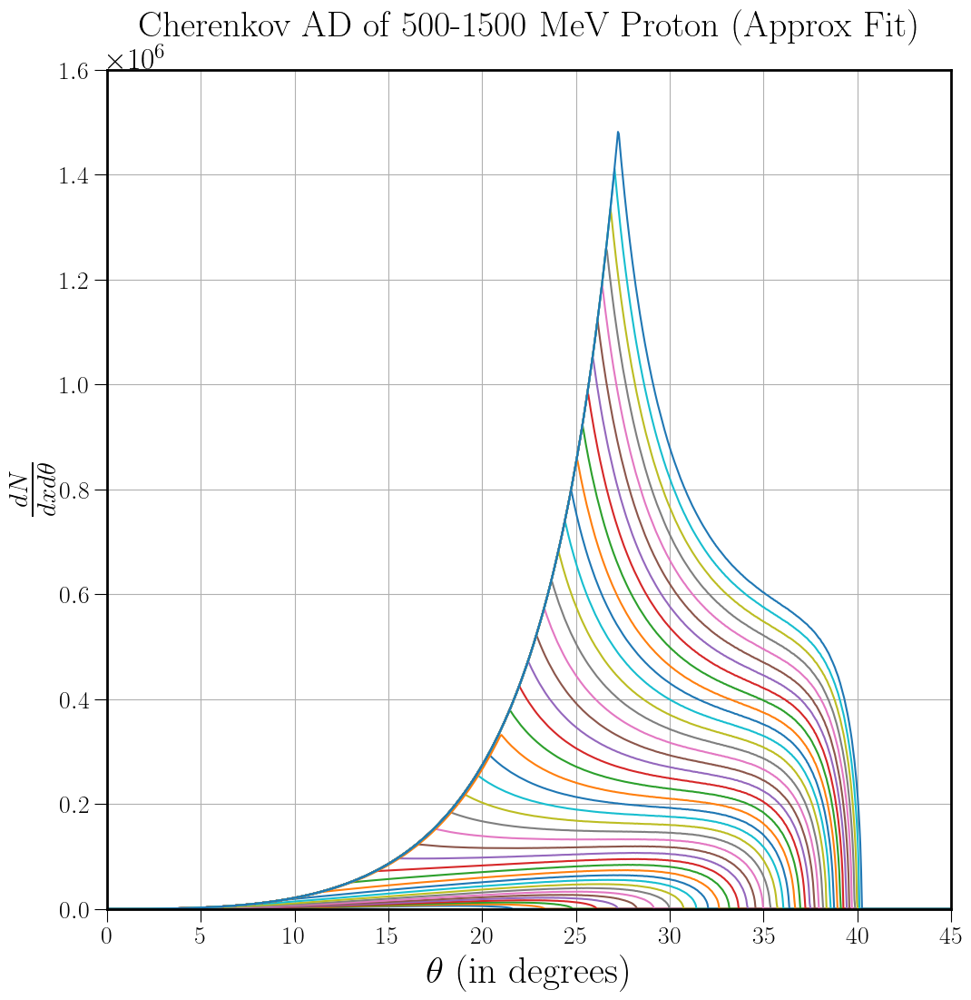

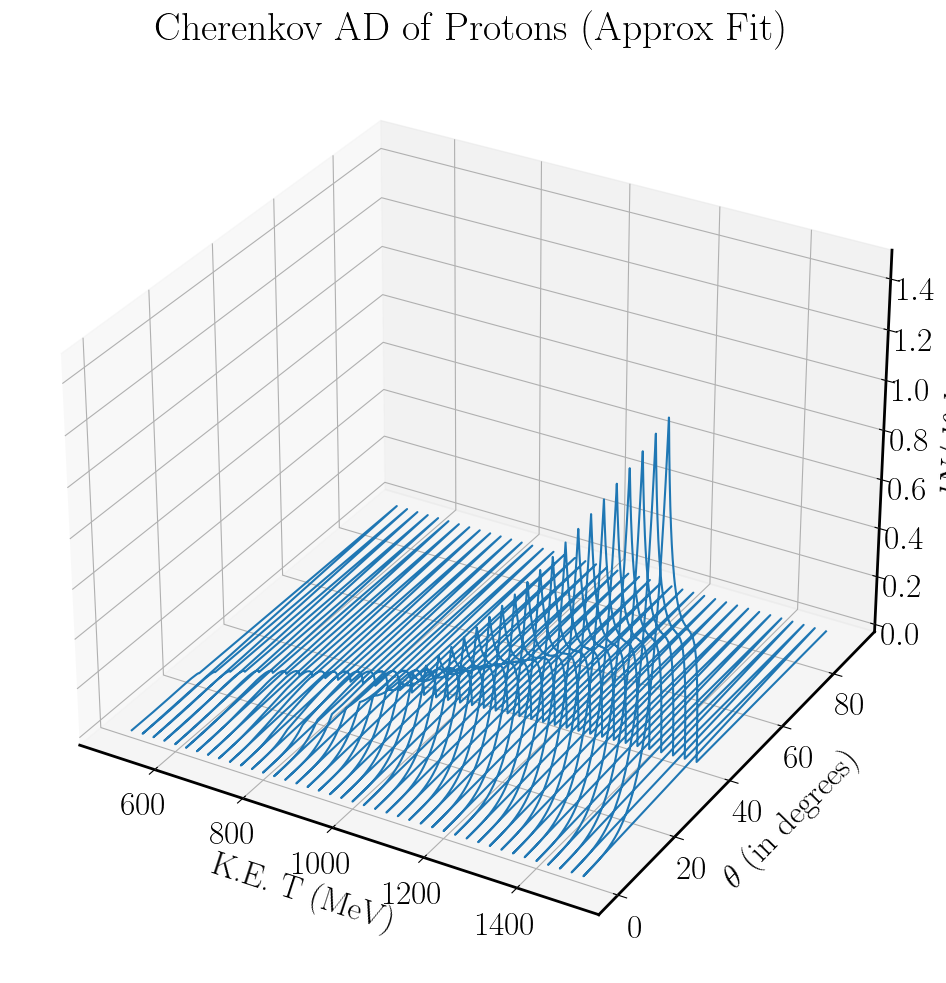

In [345]:
#Import libraries
import matplotlib as mpl
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm # for colormaps
import numpy as np


# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111, projection='3d')

# Set labels and title:
ax.set_xlabel('\n K.E. T (MeV)')
ax.set_ylabel('\n' r'$\theta$ (in degrees)')
ax.set_zlabel('\n' r'$dN/d\theta dx$') #\frac{dN}{d\cos\theta} #'\n'
ax.set_title('Cherenkov AD of Protons (Approx Fit)')
# ax.tick_params(axis='both',which='major',labelsize=20,length=10)
# ax.zaxis.labelpad = -10 # Adjust as needed
# ax.set_zticklabels(ax.get_zticklabels(), rotation=45, ha="right") 

# mpl.rcParams['xtick.major.pad'] = 30 # Adjust padding as needed
# # or for a specific axis:
# ax.tick_params(axis='x', pad=30)

# Assuming 'ax' is your Axes object
# ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right") 
# or for a simpler approach:
# plt.yticks(rotation=45, ha="right") 

t = np.linspace(500, 1500, 41)

X = []

for val in t:  
    x = np.linspace(val, val, 2000) #K.E., T in MeV (or mom or beta): Proton
    X.append(x)
X = np.array(X).flatten()
Y = np.linspace(thetadegp, thetadegp, 41).flatten() #cosine of Cherenkov angle, cos(theta)
Z = np.array([totaltps]).flatten()  #Total AD
# c=X
print(X, Y, Z)
print(np.shape(X), np.shape(Y), np.shape(Z))
# ax.plot_surface(X, Y, Z, cmap='viridis')

# colors = ['r', 'g', 'b', 'c', 'm', 'y', 'k'] # or hex codes like '#FF0000'
# colors = '#FF0000'
    # For 3D bar plots:
    # ax.bar3d(xpos, ypos, zpos, dx, dy, dz, color=colors[i % len(colors)])

# ax.scatter(X, Y, Z, c=c, cmap=cm.viridis) #c=color_data, cmap=cm.viridis #color=colors[i % len(colors)]
ax.plot(X,Y,Z) #'green' c='#FF00FF' #c=plt.cm.jet(Z/max(Z)) # c='green'


# ax.plot(thetadegp, totaltp, label='Total (Approx)')

# plt.savefig("3D_Cherenkov_AD_approxfit_PID_proton_allTs_500to1500MeV_theta_newdata.jpg", bbox_inches= 'tight')
# plt.savefig("3D_Cherenkov_PID_proton_T500-700_theta.jpg", bbox_inches= 'tight')
plt.show()



[ 500.  525.  550.  575.  600.  625.  650.  675.  700.  725.  750.  775.
  800.  825.  850.  875.  900.  925.  950.  975. 1000. 1025. 1050. 1075.
 1100. 1125. 1150. 1175. 1200. 1225. 1250. 1275. 1300. 1325. 1350. 1375.
 1400. 1425. 1450. 1475. 1500.] [0.0011257671372090587, 0.0012126623680992952, 0.0013084622635881555, 0.00146865503685732, 0.0015715236822583896, 0.0019210766935859932, 0.0022441139167931157, 0.002719034920301463, 0.1827738617117523, 0.4164642835474872, 0.6693295847709472, 0.9093097891824967, 1.1360917382366935, 1.3314147839469888, 1.5104776063680663, 1.702022631483911, 1.86016823237131, 1.978297205319721, 2.1169208921837903, 2.2664402967780415, 2.4574245916857294, 2.4431594998593917, 2.5942810486135426, 2.587022288714211, 2.7001244066999255, 2.8538964854363558, 2.79073831187133, 2.8750404226439588, 2.959133598151586, 2.9872573434658545, 2.9813042134742385, 3.192810823165168, 3.1266114102554203, 3.1970297652720134, 3.1707908930143076, 3.2640793643015025, 3.25816023179131

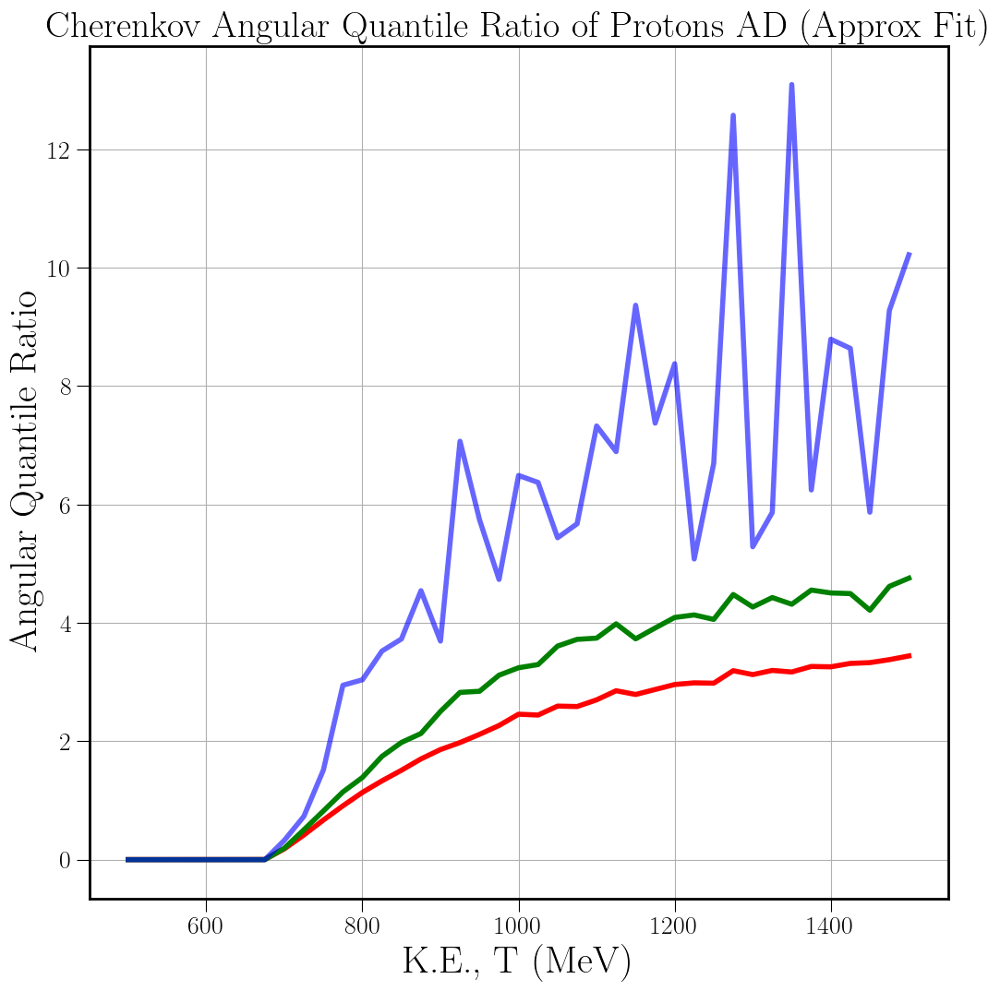

In [346]:
t = np.linspace(500, 1500, 41)
# print(t)

print(t, nbyapps10, nbyapps05, nbyapps01)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'K.E., T (MeV)', size= 30)
ax.set_ylabel(r'Angular Quantile Ratio', size= 30) #$\frac{N}{A}$
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Cherenkov Angular Quantile Ratio of Protons AD (Approx Fit)')
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)
ax.plot(t, nbyapps10, linewidth=4, c='r', label='$10 \%$')
ax.plot(t, nbyapps05, linewidth=4, c='g', label='$5 \%$')
ax.plot(t, nbyapps01, linewidth=4, c='b', label='$1 \%$', alpha=0.6)
ax.grid()
# ax.legend()
# plt.xlim(650,800) #650,800
# plt.ylim(0, 0.6)
# plt.savefig('nbyas_10_5_1_perc_approxfit_Cherenkov_AD_Proton_allT_from_saved_data', bbox_inches='tight') #_zoom
plt.show()
# Binning:  
#     1.)  define bins for x axis
#     2.)  average all points in the bin to obtain the central value
#     3.)  calculate the uncertainty in the central value using JackKnife Resampling

# % https://en.wikipedia.org/wiki/Jackknife_resampling


In [347]:
# t = np.linspace(500, 1500, 41)
# print(t)

# Linear space in K.E.
tp = np.linspace(500, 1500, 41)

mp = 938  #Proton's mass in MeV
betap  = np.sqrt(1 - (1/(1 + tp/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

print("Proton: {}, {}, {}".format(tp, betap, np.round(betap,4)))

# # #Linear space in K.E.
# tm = np.linspace(100, 1000, 37)
# # # print(t)

# # #Mass of the particle travelling
# # # mp = 938 #Proton's mass
# mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²

# betamu  = np.sqrt(1 - (1/(1 + tm/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

# print("Muon: {}, {}, {}".format( tm, betamu, np.round(betamu, 4)))


# print(t, nbyapps10, nbyapps05, nbyapps01)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'Velocity, $\beta$', size= 30)
ax.set_ylabel(r'Angular Quantile Ratio', size= 30) #$\frac{N}{A}$
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Cherenkov Angular Quantile Ratio from Protons AD (Approx Fit)')
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)
ax.plot(betap, nbyapps10, linewidth=4, c='r', label='$10 \%$')
ax.plot(betap, nbyapps05, linewidth=4, c='g', label='$5 \%$')
ax.plot(betap, nbyapps01, linewidth=4, c='b', label='$1 \%$', alpha=0.6)
ax.grid()
ax.legend()
# plt.xlim(650,800) #650,800
# plt.ylim(0, 0.6)
# plt.savefig('nbyas_10_5_1_perc_approxfit_Cherenkov_AD_Proton_allbetas_from_saved_data', bbox_inches='tight') #_zoom
# plt.show()


Proton: [ 500.  525.  550.  575.  600.  625.  650.  675.  700.  725.  750.  775.
  800.  825.  850.  875.  900.  925.  950.  975. 1000. 1025. 1050. 1075.
 1100. 1125. 1150. 1175. 1200. 1225. 1250. 1275. 1300. 1325. 1350. 1375.
 1400. 1425. 1450. 1475. 1500.], [0.75796532 0.76741698 0.77628968 0.78463315 0.79249149 0.79990401
 0.80690583 0.81352846 0.81980026 0.82574686 0.83139144 0.83675507
 0.8418569  0.84671442 0.8513436  0.85575908 0.85997431 0.86400164
 0.86785245 0.87153724 0.87506571 0.87844687 0.88168902 0.88479989
 0.88778668 0.89065607 0.89341428 0.89606712 0.89862002 0.90107804
 0.90344595 0.90572818 0.9079289  0.91005203 0.91210124 0.91407999
 0.91599153 0.91783893 0.91962507 0.92135268 0.92302433], [0.758  0.7674 0.7763 0.7846 0.7925 0.7999 0.8069 0.8135 0.8198 0.8257
 0.8314 0.8368 0.8419 0.8467 0.8513 0.8558 0.86   0.864  0.8679 0.8715
 0.8751 0.8784 0.8817 0.8848 0.8878 0.8907 0.8934 0.8961 0.8986 0.9011
 0.9034 0.9057 0.9079 0.9101 0.9121 0.9141 0.916  0.9178 0.9196 0.9

[array([0.00112577, 0.00121266, 0.00130846, 0.00146866]), array([0.00157152, 0.00192108, 0.00224411, 0.00271903]), array([0.18277386, 0.41646428, 0.66932958, 0.90930979]), array([1.13609174, 1.33141478, 1.51047761, 1.70202263]), array([1.86016823, 1.97829721, 2.11692089, 2.2664403 ]), array([2.45742459, 2.4431595 , 2.59428105, 2.58702229]), array([2.70012441, 2.85389649, 2.79073831, 2.87504042]), array([2.9591336 , 2.98725734, 2.98130421, 3.19281082]), array([3.12661141, 3.19702977, 3.17079089, 3.26407936]), array([3.25816023, 3.31550408, 3.32891816, 3.37932919])] [1.27888670e-03 2.11393730e-03 5.44469380e-01 1.42000169e+00
 2.05545666e+00 2.52047186e+00 2.80494991e+00 3.03012649e+00
 3.18962786e+00 3.32047791e+00]
[array([0.00017225, 0.00018606, 0.00021247, 0.00023035]), array([0.00025107, 0.00027912, 0.0003254 , 0.00041166]), array([0.1935476 , 0.50467493, 0.82265321, 1.14414386]), array([1.38895453, 1.74441579, 1.98024467, 2.13174075]), array([2.50482837, 2.82596755, 2.84482065, 3.1

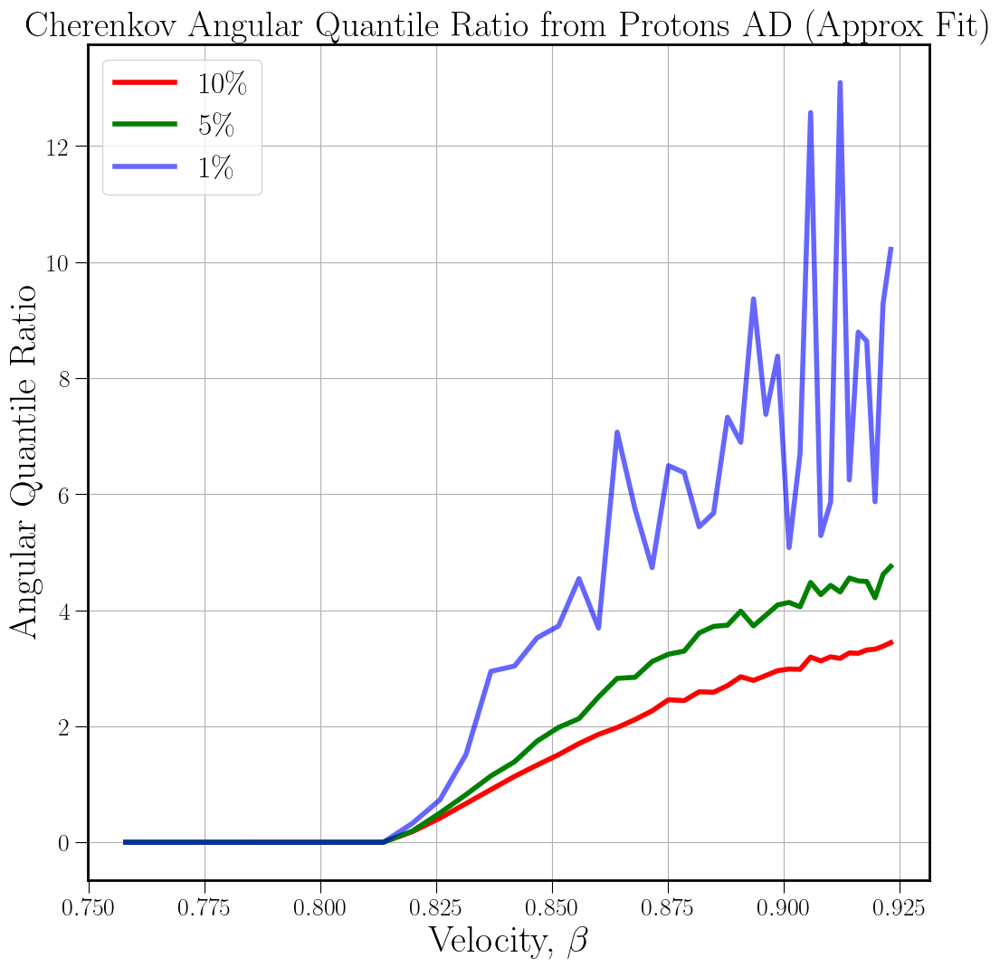

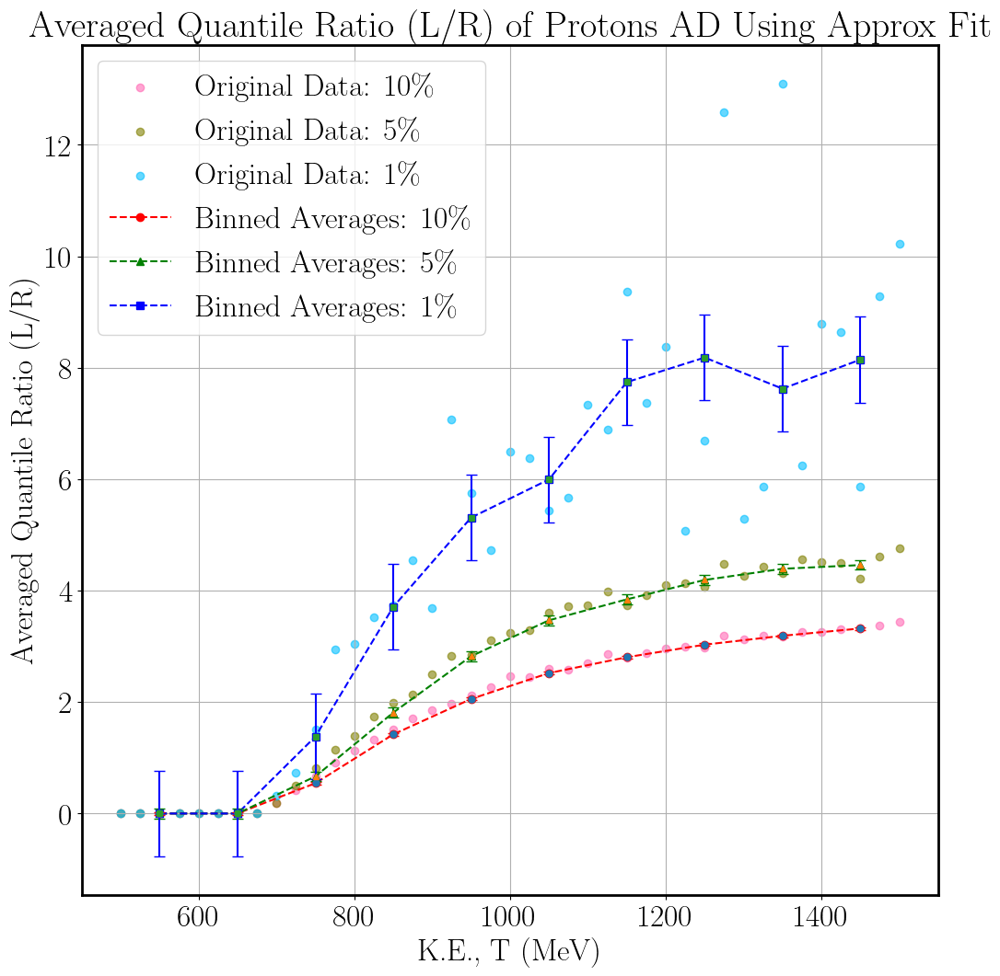

In [348]:
# Averaging elements within bins and then plotting these averages in Python can be achieved using libraries like NumPy and Matplotlib.
import numpy as np
import matplotlib.pyplot as plt
# !pip install resample
import resample

# 1. Generate or load your data
# For demonstration, let's create some sample data
np.random.seed(0) # for reproducibility
# x_data = np.random.rand(100) * 10 # x-values for binning
# y_data = 2 * x_data + np.random.randn(100) * 5 # y-values to be averaged

t = np.linspace(500, 1500, 41)

x_data = t # x-values for binning
y_data1 = np.array(nbyapps10) # y-values to be averaged
y_data2 = np.array(nbyapps05)
y_data3 = np.array(nbyapps01)
 
# 2. Define the bins
num_bins = 10
# You can define custom bin edges or let NumPy determine them
bin_edges = np.linspace(min(x_data), max(x_data), num_bins + 1)

# 3. Bin the data and calculate the mean for each bin
# Use np.digitize to assign each x_data point to a bin index
bin_indices = np.digitize(x_data, bin_edges)

# Calculate the mean of y_data for each bin
bin_means1 = []
bin_centers1 = []

bin_means2 = []
bin_centers2 = []

bin_means3 = []
bin_centers3 = []

elements_in_bins_10 = []
elements_in_bins_05 = []
elements_in_bins_01 = []

bin_means_10 = []
bin_means_05 = []
bin_means_01 = []

#10% Q. ratios
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin1 = y_data1[bin_indices == i]
    if len(elements_in_bin1) > 0: # Avoid division by zero for empty bins
        bin_means1.append(np.mean(elements_in_bin1))
        # Calculate bin center for plotting
        bin_centers1.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means1.append(np.nan)
        bin_centers1.append((bin_edges[i-1] + bin_edges[i]) / 2)

    elements_in_bins_10.append(elements_in_bin1)
    # bin_means_10.append(np.array(bin_means1[-1])) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_10, bin_means_10) 

#5% Q. ratios
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin2 = y_data2[bin_indices == i]    
    if len(elements_in_bin2) > 0: # Avoid division by zero for empty bins
        bin_means2.append(np.mean(elements_in_bin2))
        # Calculate bin center for plotting
        bin_centers2.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means2.append(np.nan)
        bin_centers2.append((bin_edges[i-1] + bin_edges[i]) / 2)

    elements_in_bins_05.append(elements_in_bin2)
    # bin_means_05.append(bin_means2[-1]) ##bin_means1[-1]: value of the last element of an array/list      
# print(elements_in_bins_05, bin_means_05)


#1% Q. ratios
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin3 = y_data3[bin_indices == i]
    if len(elements_in_bin3) > 0: # Avoid division by zero for empty bins
        bin_means3.append(np.mean(elements_in_bin3))
        # Calculate bin center for plotting
        bin_centers3.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means3.append(np.nan)
        bin_centers3.append((bin_edges[i-1] + bin_edges[i]) / 2)
    
    elements_in_bins_01.append(elements_in_bin3)
    # bin_means_01.append(bin_means3[-1]) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_01, bin_means_01)    


# Remove NaN values if you don't want to plot empty bins
bin_centers1 = np.array(bin_centers1)[~np.isnan(bin_means1)]
bin_means1 = np.array(bin_means1)[~np.isnan(bin_means1)]

bin_centers2 = np.array(bin_centers2)[~np.isnan(bin_means2)]
bin_means2 = np.array(bin_means2)[~np.isnan(bin_means2)]

bin_centers3 = np.array(bin_centers3)[~np.isnan(bin_means3)]
bin_means3 = np.array(bin_means3)[~np.isnan(bin_means3)]

# print(bin_means1, bin_means2, bin_means3)

print(elements_in_bins_10, bin_means1)
print(elements_in_bins_05, bin_means2)
print(elements_in_bins_01, bin_means3)

#Jackknife resampling with my data 

def jackknife_statistic(data, statistic):
    n = len(data)
    jackknife_samples = np.zeros(n)

    for i in range(n):
        sample = np.delete(data, i)
        jackknife_samples[i] = statistic(sample)

    jackknife_mean = np.mean(jackknife_samples)
    variance = (n - 1) / n * np.sum((jackknife_samples - jackknife_mean)**2)
    bias = (n - 1) * (jackknife_mean - statistic(data))
    
    return jackknife_mean, variance, bias

# Example
# data = np.array([2, 4, 6, 8, 10])
#Real Data
data10 = elements_in_bins_10
data05 = elements_in_bins_05
data01 = elements_in_bins_01
# print("data10 = {}, data05 = {}, data01 = {}".format(data10, data05, data01))
stat = np.mean

# # mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
# mean_jack10, var_jack10, bias_jack10 = jackknife_statistic(data10, stat)
# mean_jack05, var_jack05, bias_jack05 = jackknife_statistic(data05, stat)
# mean_jack01, var_jack01, bias_jack01 = jackknife_statistic(data01, stat)


for i in data10: 
# mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
    mean_jack10, var_jack10, bias_jack10 = jackknife_statistic(i, stat)
    # mean_jack05, var_jack05, bias_jack05 = jackknife_statistic(data05, stat)
    # mean_jack01, var_jack01, bias_jack01 = jackknife_statistic(data01, stat)
    print("Jackknife 10 %: mean={}, var={}, bias={}".format(mean_jack10, var_jack10, bias_jack10))

for j in data05: 
# mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
    # mean_jack10, var_jack10, bias_jack10 = jackknife_statistic(i, stat)
    mean_jack05, var_jack05, bias_jack05 = jackknife_statistic(j, stat)
    # mean_jack01, var_jack01, bias_jack01 = jackknife_statistic(data01, stat)
    print("Jackknife 5 %: mean={}, var={}, bias={}".format(mean_jack05, var_jack05, bias_jack05))


for k in data01: 
# mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
    # mean_jack10, var_jack10, bias_jack10 = jackknife_statistic(i, stat)
    # mean_jack05, var_jack05, bias_jack05 = jackknife_statistic(data05, stat)
    mean_jack01, var_jack01, bias_jack01 = jackknife_statistic(k, stat)
    print("Jackknife 1 %: mean={}, var={}, bias={}".format(mean_jack01, var_jack01, bias_jack01))


    # print("Jackknife Means:", mean_jack10, mean_jack05, mean_jack01)
    # print("Jackknife Variances:", var_jack10, var_jack05, var_jack01)
    # print("Jackknife Biases:", bias_jack10, bias_jack05, bias_jack01)


# 4. Plot the results
plt.figure(figsize=(12, 12))

plt.scatter(x_data, y_data1, alpha=0.6, c='hotpink', label='Original Data: 10\%')
plt.scatter(x_data, y_data2, alpha=0.6, c='olive', label='Original Data: 5\%')
plt.scatter(x_data, y_data3, alpha=0.6, c='deepskyblue', label='Original Data: 1\%')

plt.plot(bin_centers1, bin_means1, color='red', marker='o', linestyle='--', label='Binned Averages: 10\%')
plt.plot(bin_centers2, bin_means2, color='green', marker='^', linestyle='--', label='Binned Averages: 5\%')
plt.plot(bin_centers3, bin_means3, color='blue', marker='s', linestyle='--', label='Binned Averages: 1\%')

# plt.errorbar(x_values, y_estimates, yerr=jackknife_errors, fmt='o', capsize=4, ecolor='red', markersize=5)  #Jackknife errorbar
plt.errorbar(bin_centers1, bin_means1, yerr=np.sqrt(var_jack10), fmt='o', capsize=4, ecolor='red', markersize=5)  #Jackknife errorbar for 10% Q.ratio
plt.errorbar(bin_centers2, bin_means2, yerr=np.sqrt(var_jack05), fmt='^', capsize=4, ecolor='green', markersize=5)  #Jackknife errorbar for 10% Q.ratio
plt.errorbar(bin_centers3, bin_means3, yerr=np.sqrt(var_jack01), fmt='s', capsize=4, ecolor='blue', markersize=5)  #Jackknife errorbar for 10% Q.ratio

plt.xlabel('K.E., T (MeV)') #(Binned Variable)
plt.ylabel('Averaged Quantile Ratio (L/R)') # (Averaged Variable)')
plt.title('Averaged Quantile Ratio (L/R) of Protons AD Using Approx Fit') #in Bins of K.E. 
plt.legend()
plt.grid(True)

# plt.savefig('binned_avg_nbyas_10_5_1_perc_approxfit_Cherenkov_AD_Proton_allT_from_saved_data_w_jackknife_err', bbox_inches='tight') #_zoom
plt.show()

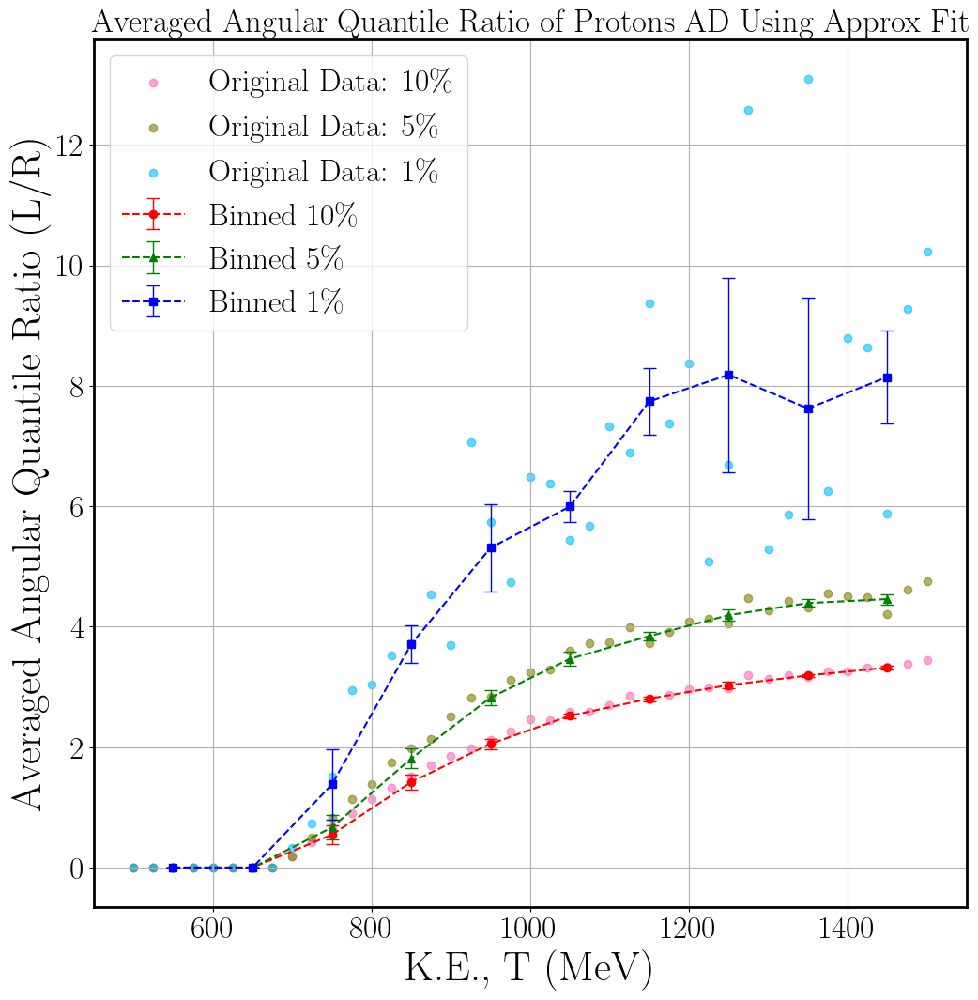

In [93]:
# Averaging elements within bins and then plotting these averages in Python can be achieved using libraries like NumPy and Matplotlib.
import numpy as np
import matplotlib.pyplot as plt
# !pip install resample
import resample

# 1. Generate or load your data
# For demonstration, let's create some sample data
np.random.seed(0) # for reproducibility
# x_data = np.random.rand(100) * 10 # x-values for binning
# y_data = 2 * x_data + np.random.randn(100) * 5 # y-values to be averaged

t = np.linspace(500, 1500, 41)

x_data = t # x-values for binning
y_data1 = np.array(nbyapps10) # y-values to be averaged
y_data2 = np.array(nbyapps05)
y_data3 = np.array(nbyapps01)
 
# 2. Define the bins
num_bins = 10
# You can define custom bin edges or let NumPy determine them
bin_edges = np.linspace(min(x_data), max(x_data), num_bins + 1)

# 3. Bin the data and calculate the mean for each bin
# Use np.digitize to assign each x_data point to a bin index
bin_indices = np.digitize(x_data, bin_edges)

# Calculate the mean of y_data for each bin
bin_means1 = []
bin_centers1 = []

bin_means2 = []
bin_centers2 = []

bin_means3 = []
bin_centers3 = []

elements_in_bins_10 = []
elements_in_bins_05 = []
elements_in_bins_01 = []

bin_means_10 = []
bin_means_05 = []
bin_means_01 = []

#10% Q.ratio
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin1 = y_data1[bin_indices == i]
    if len(elements_in_bin1) > 0: # Avoid division by zero for empty bins
        bin_means1.append(np.mean(elements_in_bin1))
        # Calculate bin center for plotting
        bin_centers1.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means1.append(np.nan)
        bin_centers1.append((bin_edges[i-1] + bin_edges[i]) / 2)
    elements_in_bins_10.append(elements_in_bin1)
    # bin_means_10.append(np.array(bin_means1[-1])) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_10, bin_means_10) 


#5% Q.ratio    
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin2 = y_data2[bin_indices == i]
    if len(elements_in_bin2) > 0: # Avoid division by zero for empty bins
        bin_means2.append(np.mean(elements_in_bin2))
        # Calculate bin center for plotting
        bin_centers2.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means2.append(np.nan)
        bin_centers2.append((bin_edges[i-1] + bin_edges[i]) / 2)
    elements_in_bins_05.append(elements_in_bin2)
    # bin_means_05.append(bin_means2[-1]) ##bin_means1[-1]: value of the last element of an array/list      
# print(elements_in_bins_05, bin_means_05)


#1% Q.ratio
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin3 = y_data3[bin_indices == i]
    if len(elements_in_bin3) > 0: # Avoid division by zero for empty bins
        bin_means3.append(np.mean(elements_in_bin3))
        # Calculate bin center for plotting
        bin_centers3.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means3.append(np.nan)
        bin_centers3.append((bin_edges[i-1] + bin_edges[i]) / 2)

    elements_in_bins_01.append(elements_in_bin3)
    # bin_means_01.append(bin_means3[-1]) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_01, bin_means_01)    


# Remove NaN values if you don't want to plot empty bins
bin_centers1 = np.array(bin_centers1)[~np.isnan(bin_means1)]
bin_means1 = np.array(bin_means1)[~np.isnan(bin_means1)]

bin_centers2 = np.array(bin_centers2)[~np.isnan(bin_means2)]
bin_means2 = np.array(bin_means2)[~np.isnan(bin_means2)]

bin_centers3 = np.array(bin_centers3)[~np.isnan(bin_means3)]
bin_means3 = np.array(bin_means3)[~np.isnan(bin_means3)]


# print(bin_means1, bin_means2, bin_means3)

# print(elements_in_bins_10, bin_means1)
# print(elements_in_bins_05, bin_means2)
# print(elements_in_bins_01, bin_means3)

#Jackknife resampling with my data 

def jackknife_statistic(data, statistic):
    n = len(data)
    jackknife_samples = np.zeros(n)

    for i in range(n):
        sample = np.delete(data, i)
        jackknife_samples[i] = statistic(sample)

    jackknife_mean = np.mean(jackknife_samples)
    variance = (n - 1) / n * np.sum((jackknife_samples - jackknife_mean)**2)
    bias = (n - 1) * (jackknife_mean - statistic(data))
    
    return jackknife_mean, variance, bias

# Example
# data = np.array([2, 4, 6, 8, 10])
#Real Data
data10 = elements_in_bins_10
data05 = elements_in_bins_05
data01 = elements_in_bins_01
# print("data10 = {}, data05 = {}, data01 = {}".format(data10, data05, data01))
stat = np.mean


# Initialize empty lists to store results for each bin
means_10, errs_10 = [], []
means_05, errs_05 = [], []
means_01, errs_01 = [], []

# Loop for 10% data
for bin_data in elements_in_bins_10:
    if len(bin_data) > 1: # Jackknife requires at least 2 points
        m, v, b = jackknife_statistic(bin_data, np.mean)
        means_10.append(m)
        errs_10.append(np.sqrt(v)) # Error bar is square root of variance
    else:
        means_10.append(np.nan)
        errs_10.append(np.nan)

# Loop for 5% data
for bin_data in elements_in_bins_05:
    if len(bin_data) > 1:
        m, v, b = jackknife_statistic(bin_data, np.mean)
        means_05.append(m)
        errs_05.append(np.sqrt(v))
    else:
        means_05.append(np.nan)
        errs_05.append(np.nan)

# Loop for 1% data
for bin_data in elements_in_bins_01:
    if len(bin_data) > 1:
        m, v, b = jackknife_statistic(bin_data, np.mean)
        means_01.append(m)
        errs_01.append(np.sqrt(v))
    else:
        means_01.append(np.nan)
        errs_01.append(np.nan)


#Plotting 

plt.figure(figsize=(12, 12))

plt.scatter(x_data, y_data1, alpha=0.6, c='hotpink', label='Original Data: 10\%')
plt.scatter(x_data, y_data2, alpha=0.6, c='olive', label='Original Data: 5\%')
plt.scatter(x_data, y_data3, alpha=0.6, c='deepskyblue', label='Original Data: 1\%')


# Define labels and colors for cleaner code
datasets = [
    (bin_centers1, means_10, errs_10, 'red', 'o', '10\%'),
    (bin_centers2, means_05, errs_05, 'green', '^', '5\%'),
    (bin_centers3, means_01, errs_01, 'blue', 's', '1\%')
]

for x, y, yerr, color, marker, label in datasets:
    # Convert to numpy arrays to handle indexing/NaNs
    x, y, yerr = np.array(x), np.array(y), np.array(yerr)
    mask = ~np.isnan(y)
    
    plt.errorbar(x[mask], y[mask], yerr=yerr[mask], 
                 fmt=marker, color=color, linestyle='--', 
                 capsize=5, elinewidth=1, label=f'Binned {label}') #f'Binned {label}'
    
plt.xlabel('K.E., T (MeV)', size=32) #(Binned Variable)
plt.ylabel('Averaged Angular Quantile Ratio (L/R)', size=32) # (Averaged Variable)')
plt.title('Averaged Angular Quantile Ratio of Protons AD Using Approx Fit', size=25) #in Bins of K.E. 
plt.legend()
plt.grid(True)

# plt.savefig('binned_avg_nbyas_10_5_1_perc_approxfit_Cherenkov_AD_Proton_allT_from_saved_data_w_jackknife_err_corrected', bbox_inches='tight') #_zoom
plt.show()

# Quantile Ratio (L/R ~ N/A) from Proton's AD (HO fit) 

In [375]:
#HO Fit
# K.E or Beta
# t = 500

#Linear space in K.E.
t = np.linspace(500, 1500, 41)
# print(t)

mp = 938  #Proton's mass in MeV
betap  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

print (t, betap, np.round(betap,3))

n_peakr = 1.3605
n_500 = 1.2278

cos_ang_min = []
con_ang_maxn = []
thetamax = []
thetamin = []

for i in betap: 
        
    #Quantile Window: Integration Stepsize 
    
    cos_ang_min = 1/(i * n_peakr)
    thetamax = np.arccos(cos_ang_min)*(180/np.pi)
    
    cos_ang_maxn =  min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
    # cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
    thetamin = np.arccos(cos_ang_maxn)*(180/np.pi)
    
    
    dp = (thetamax - thetamin)/(180/(2*2000)) #No of data points
    
    
    theta_window = (thetamax - thetamin)/10 #10% of databins 
    
    min_window = thetamin + theta_window
    
    max_window = thetamax - theta_window 

    print(i, thetamin, min_window, max_window, thetamax) 

[ 500.  525.  550.  575.  600.  625.  650.  675.  700.  725.  750.  775.
  800.  825.  850.  875.  900.  925.  950.  975. 1000. 1025. 1050. 1075.
 1100. 1125. 1150. 1175. 1200. 1225. 1250. 1275. 1300. 1325. 1350. 1375.
 1400. 1425. 1450. 1475. 1500.] [0.75796532 0.76741698 0.77628968 0.78463315 0.79249149 0.79990401
 0.80690583 0.81352846 0.81980026 0.82574686 0.83139144 0.83675507
 0.8418569  0.84671442 0.8513436  0.85575908 0.85997431 0.86400164
 0.86785245 0.87153724 0.87506571 0.87844687 0.88168902 0.88479989
 0.88778668 0.89065607 0.89341428 0.89606712 0.89862002 0.90107804
 0.90344595 0.90572818 0.9079289  0.91005203 0.91210124 0.91407999
 0.91599153 0.91783893 0.91962507 0.92135268 0.92302433] [0.758 0.767 0.776 0.785 0.792 0.8   0.807 0.814 0.82  0.826 0.831 0.837
 0.842 0.847 0.851 0.856 0.86  0.864 0.868 0.872 0.875 0.878 0.882 0.885
 0.888 0.891 0.893 0.896 0.899 0.901 0.903 0.906 0.908 0.91  0.912 0.914
 0.916 0.918 0.92  0.921 0.923]
0.7579653181328908 0.0 1.41326869015289

In [377]:
# approx = np.load('Cherenkov_data_for_PID\\Cherenkovdata_p_1500_approx.npz', allow_pickle=True)
ho = np.load('Cherenkov_data_for_PID\\Cherenkovdata_p1500_ho.npz', allow_pickle=True)
# Cherenkovdata_p1000_ho.npz

print(ho.files)

print(ho['theta']) #theta saved in radian unit
print(np.nonzero(ho['totalho']))
print(ho['totalho'][607:893])
# print(ho['normalho'])
# print(ho['anomalousho'])

# List the names of the arrays in the file
# print(pdata500ho.files)
# print(pdata500b.files)



['theta', 'costheta', 'totalho', 'normalho', 'anomalousho', 'scint']
[0.00000000e+00 7.85791059e-04 1.57158212e-03 ... 1.56922474e+00
 1.57001054e+00 1.57079633e+00]
(array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
       105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
       118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130,
       131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
       144, 145, 146, 147, 148, 149, 150,

[ 500.  525.  550.  575.  600.  625.  650.  675.  700.  725.  750.  775.
  800.  825.  850.  875.  900.  925.  950.  975. 1000. 1025. 1050. 1075.
 1100. 1125. 1150. 1175. 1200. 1225. 1250. 1275. 1300. 1325. 1350. 1375.
 1400. 1425. 1450. 1475. 1500.]
K.E.=500.0, beta=0.7579653181328908, dp=31.0, theta_windowh=1.4132686901528966, thetaminh=0.0, min_windowh=1.4132686901528966, max_windowh=12.719418211376068, thetamaxh=14.132686901528965
The element closest to 0.0 is at index: 0
The closest element is: 0.0
The element closest to 1.4132686901528966 is at index: 31
The closest element is: 1.3956978489244622
The element closest to 12.719418211376068 is at index: 283
The closest element is: 12.741370685342671
The element closest to 14.132686901528965 is at index: 314
The closest element is: 14.137068534267135
500.0 MeV Proton: 10 % Normal Quantile = [0.00000000e+00 1.80023626e-04 1.44022498e-03 4.86135908e-03
 1.15261527e-02 2.25153683e-02 3.89236547e-02 6.18293401e-02
 9.23564845e-02 1.31578

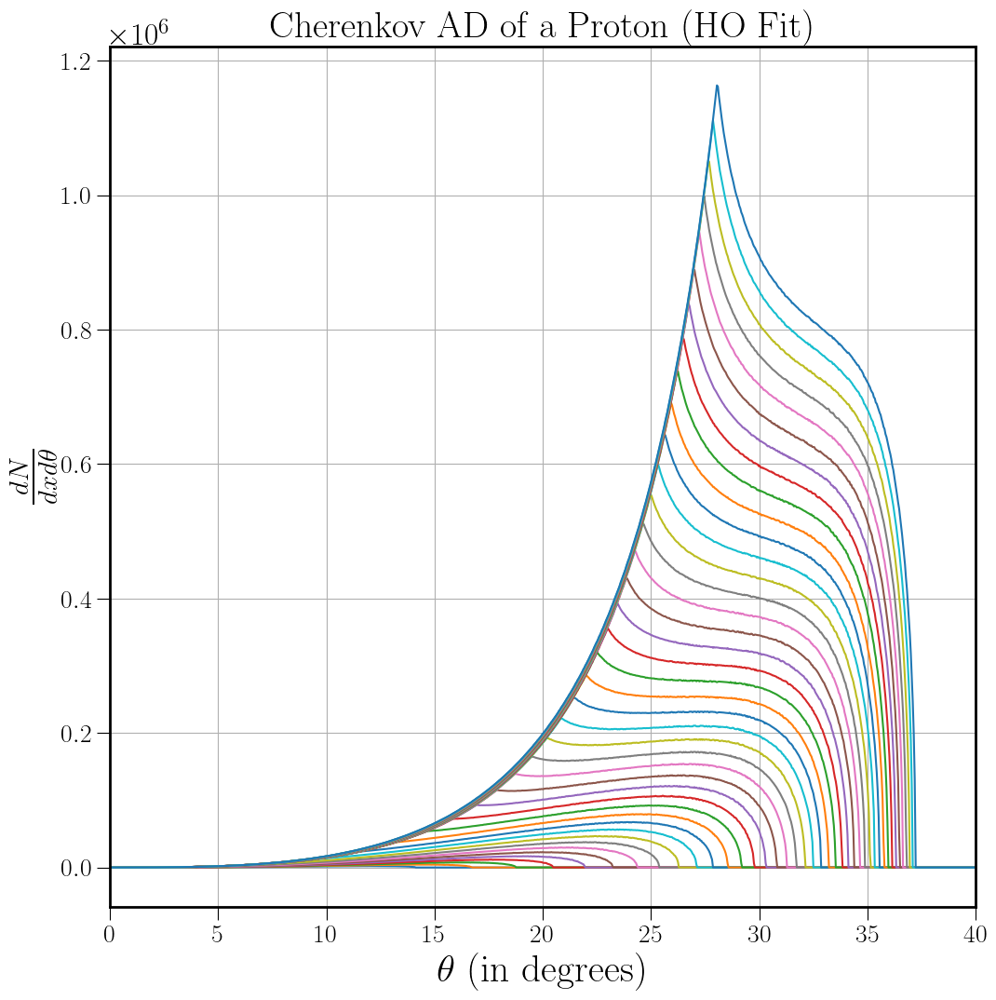

In [95]:
#Import libraries
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np


#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

# matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
# plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'$\theta$ (in degrees)', size= 30)
ax.set_ylabel(r'$\frac{dN}{dx d\theta}$', size= 30)
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Cherenkov AD of a Proton (HO Fit)')
# ax.set_title('Cherenkov AD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)


# #Defining integration window

# theta_window = (thetamax - thetamin)/10 #10% of databins # dp = (thetamax - thetamin)/(180/(2*2000)) 

# dp = np.round(2000*2*theta_window/180) #no. of datapoints within theta_window

# min_window = thetamin + theta_window

# max_window = thetamax - theta_window 



#Define a function to find the index of the desired element

def find_nearest_index_numpy(arr, value):
    """
    Finds the index of the element closest to 'value' in a NumPy array.
    """
    arr = np.array(arr)  # Ensure it's a NumPy array
    idx = np.abs(arr - value).argmin()
    return idx

#Explanation:
# np.abs(arr - value) calculates the absolute difference between each element in the array and the value.
# .argmin() returns the index of the minimum value in the resulting array of absolute differences, which corresponds to the element closest to value.

#Linear space in K.E.
t = np.linspace(500, 1500, 41)
# t = np.linspace(500, 1500, 21)
print(t)

mp = 938  #Proton's mass in MeV
# betap  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

# print (t, betap, np.round(betap,4))

n_peakr = 1.3605
n_500 = 1.2278

cos_ang_minh = []
con_ang_maxh = []
thetamaxh = []
thetaminh = []


# Load the .npz file
#HO fit
# pdata500ho = np.load('IAD_new_data_for_PID\\iCherenkovdata_p_500_ho.npz')

# Create an empty dictionary to store the data.
data_dict = {}

# itotalts = []
# inormalts = []
# ianomts = []

totalths = []
normalths = []
anomths = []

# itotalbts = []

tpnormhs10 = []
tpanomhs10 = []
nbyaphs10 = []
abynphs10 = []

tpnormhs05 = []
tpanomhs05 = []
nbyaphs05 = []
abynphs05 = []

tpnormhs01 = []
tpanomhs01 = []
nbyaphs01 = []
abynphs01 = []

# Loop through your values
for val in t:
    # Use an f-string to generate the key for the dictionary. (HO)
    # key = f"pdata_{val:.0f}_ho"
    ho = f"pdata_{val:.0f}_ho"
    
    # Use another f-string to generate the filename for loading.
    filename1 = fr"Cherenkov_new_data_for_PID\Cherenkovdata_p{val:.0f}_ho.npz"
    
    # Store the loaded data in the dictionary using the generated key.
    # data_dict[key] = np.load(filename)
    data_dict[ho] = np.load(filename1) 
    # data_dict[ap] = np.load(filename3, allow_pickle=True) 

    costhetah = data_dict[ho]['costheta']
    thetah = data_dict[ho]['theta']
    totalh = data_dict[ho]['totalho']
    normalh = data_dict[ho]['normalho']
    anomh = data_dict[ho]['anomalousho']
    thetadegh = thetah*(180/np.pi) 
    totalth = totalh*np.sin(thetah)
    normalth = normalh*np.sin(thetah)
    anomth = anomh*np.sin(thetah)
    # print(costheta)
    
    ax.plot(thetadegh, totalth, label='Total')
    # ax.plot(thetadeg, inormalt, label='Normal')
    # ax.plot(thetadeg, ianomt, label='Anomalous')

    
    # itotalts.append(itotalt.tolist())  
    # inormalts.append(inormalt)
    # ianomts.append(ianomt)
    
    totalths.append(totalth)

    i  = np.sqrt(1 - (1/(1 + val/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD


    #Quantile Window: Integration Stepsize 
    
    cos_ang_minh = 1/(i * n_peakr)
    thetamaxh = np.arccos(cos_ang_minh)*(180/np.pi)
    
    cos_ang_maxh = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
    # cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
    thetaminh = np.arccos(cos_ang_maxh)*(180/np.pi)

    #Defining integration window

    theta_windowh10 = (thetamaxh - thetaminh)/10 #10% of databins # dp = (thetamax - thetamin)/(180/(2*2000))
    theta_windowh05 = (thetamaxh - thetaminh)/20 #5% of databins # dp = (thetamax - thetamin)/(180/(2*2000))
    theta_windowh01 = (thetamaxh - thetaminh)/100 #1% of databins # dp = (thetamax - thetamin)/(180/(2*2000))
    
    dph10 = np.round(2000*2*theta_windowh10/180) #no. of datapoints within theta_window
    dph05 = np.round(2000*2*theta_windowh05/180) #no. of datapoints within theta_window
    dph01 = np.round(2000*2*theta_windowh01/180) #no. of datapoints within theta_window
    
    min_windowh10 = thetaminh + theta_windowh10
    max_windowh10 = thetamaxh - theta_windowh10 

    min_windowh05 = thetaminh + theta_windowh05
    max_windowh05 = thetamaxh - theta_windowh05 

    min_windowh01 = thetaminh + theta_windowh01
    max_windowh01 = thetamaxh - theta_windowh01 

    
    # print(i, thetamin, min_window, max_window, thetamax)
    print('K.E.={}, beta={}, dp={}, theta_windowh={}, thetaminh={}, min_windowh={}, max_windowh={}, thetamaxh={}'.format(val, i, dph10, theta_windowh10, thetaminh, min_windowh10, max_windowh10, thetamaxh)) 
    
    
    # Example usage:
    my_array = thetadegh

    #10% Quantile
    
    #Theta_min
    min_valueh = thetaminh
    min_indexh = find_nearest_index_numpy(my_array, min_valueh)
    print(f"The element closest to {min_valueh} is at index: {min_indexh}")
    print(f"The closest element is: {my_array[min_indexh]}")
    
    #Min_window
    min_window_valueh = thetaminh + theta_windowh10
    min_window_indexh = find_nearest_index_numpy(my_array, min_window_valueh)
    print(f"The element closest to {min_window_valueh} is at index: {min_window_indexh}")
    print(f"The closest element is: {my_array[min_window_indexh]}")
    
    #Max_window
    max_window_valueh = thetamaxh - theta_windowh10
    max_window_indexh = find_nearest_index_numpy(my_array, max_window_valueh)
    print(f"The element closest to {max_window_valueh} is at index: {max_window_indexh}")
    print(f"The closest element is: {my_array[max_window_indexh]}")
    
    #Theta_max
    max_valueh = thetamaxh
    max_indexh = find_nearest_index_numpy(my_array, max_valueh)
    print(f"The element closest to {max_valueh} is at index: {max_indexh}")
    print(f"The closest element is: {my_array[max_indexh]}")
    
    # Sum i-th to j-th elements of an array) 
    
    totalnormh10 = totalth[min_indexh:min_window_indexh]    
    totalanomh10 = totalth[max_window_indexh:max_indexh]
    
    print('{} MeV Proton: 10 % Normal Quantile = {}, 10 % Anomalous Quantile = {}'.format(val, totalnormh10, totalanomh10))
    
    # itnorm = sum(itotalnorm)* (thetamin + min_window)/2 
    # itanom = sum(itotalanom)* (max_window + thetamax)/2 
    
    # print('For {} MeV Proton: theta_window/dp = {}'.format(val, theta_window/dp))
    
    tnormh10 = sum(totalnormh10) * (theta_windowh10/dph10) 
    tanomh10 = sum(totalanomh10) * (theta_windowh10/dph10) 
    
    nbyaph10 = tnormh10 / tanomh10
    abynph10 = tanomh10 / tnormh10
    
    print('{} MeV Proton: Sum of 10 % Normal Quantile = {}, Sum of 10 % Anomalous Quantile = {}, 10 %  Normal/Anomalous = {}, 10 % Anomalous/Normal = {}'.format(val, tnormh10, tanomh10, nbyaph10, 1/nbyaph10))

    # itotalts.append(itotalt.tolist())  

    tpnormhs10.append(tnormh10)
    tpanomhs10.append(tanomh10)
    nbyaphs10.append(nbyaph10)
    abynphs10.append(abynph10)

    #5% Quantile

    print('K.E.={}, beta={}, dp={}, theta_windowh={}, thetaminh={}, min_windowh={}, max_windowh={}, thetamaxh={}'.format(val, i, dph05, theta_windowh05, thetaminh, min_windowh05, max_windowh05, thetamaxh)) 
    
    
    #Theta_min
    min_valueh = thetaminh
    min_indexh = find_nearest_index_numpy(my_array, min_valueh)
    print(f"The element closest to {min_valueh} is at index: {min_indexh}")
    print(f"The closest element is: {my_array[min_indexh]}")
    
    #Min_window
    min_window_valueh = thetaminh + theta_windowh05
    min_window_indexh = find_nearest_index_numpy(my_array, min_window_valueh)
    print(f"The element closest to {min_window_valueh} is at index: {min_window_indexh}")
    print(f"The closest element is: {my_array[min_window_indexh]}")
    
    #Max_window
    max_window_valueh = thetamaxh - theta_windowh05
    max_window_indexh = find_nearest_index_numpy(my_array, max_window_valueh)
    print(f"The element closest to {max_window_valueh} is at index: {max_window_indexh}")
    print(f"The closest element is: {my_array[max_window_indexh]}")
    
    #Theta_max
    max_valueh = thetamaxh
    max_indexh = find_nearest_index_numpy(my_array, max_valueh)
    print(f"The element closest to {max_valueh} is at index: {max_indexh}")
    print(f"The closest element is: {my_array[max_indexh]}")
    
    # Sum i-th to j-th elements of an array) 
    
    totalnormh05 = totalth[min_indexh:min_window_indexh]     
    totalanomh05 = totalth[max_window_indexh:max_indexh]
    
    print('{} MeV Proton: 5 % Normal Quantile = {}, 5 % Anomalous Quantile = {}'.format(val, totalnormh05, totalanomh05))
    
    # itnorm = sum(itotalnorm)* (thetamin + min_window)/2 
    # itanom = sum(itotalanom)* (max_window + thetamax)/2 
    
    # print('For {} MeV Proton: theta_window/dp = {}'.format(val, theta_window/dp))
    
    tnormh05 = sum(totalnormh05) * (theta_windowh05/dph05) 
    tanomh05 = sum(totalanomh05) * (theta_windowh05/dph05) 
    
    nbyaph05 = tnormh05 / tanomh05
    abynph05 = tanomh05 / tnormh05
    
    print('{} MeV Proton: Sum of 5 % Normal Quantile = {}, Sum of 5 % Anomalous Quantile = {}, 5 % Normal/Anomalous = {}, 5 % Anomalous/Normal = {}'.format(val, tnormh05, tanomh05, nbyaph05, 1/nbyaph05))

    # itotalts.append(itotalt.tolist())  

    tpnormhs05.append(tnormh05)
    tpanomhs05.append(tanomh05)
    nbyaphs05.append(nbyaph05)
    abynphs05.append(abynph05)

    #1% Quantile

    print('K.E.={}, beta={}, dp={}, theta_windowh={}, thetaminh={}, min_windowh={}, max_windowh={}, thetamaxh={}'.format(val, i, dph01, theta_windowh01, thetaminh, min_windowh01, max_windowh01, thetamaxh)) 
    
    
    #Theta_min
    min_valueh = thetaminh
    min_indexh = find_nearest_index_numpy(my_array, min_valueh)
    print(f"The element closest to {min_valueh} is at index: {min_indexh}")
    print(f"The closest element is: {my_array[min_indexh]}")
    
    #Min_window
    min_window_valueh = thetaminh + theta_windowh01
    min_window_indexh = find_nearest_index_numpy(my_array, min_window_valueh)
    print(f"The element closest to {min_window_valueh} is at index: {min_window_indexh}")
    print(f"The closest element is: {my_array[min_window_indexh]}")
    
    #Max_window
    max_window_valueh = thetamaxh - theta_windowh01
    max_window_indexh = find_nearest_index_numpy(my_array, max_window_valueh)
    print(f"The element closest to {max_window_valueh} is at index: {max_window_indexh}")
    print(f"The closest element is: {my_array[max_window_indexh]}")
    
    #Theta_max
    max_valueh = thetamaxh
    max_indexh = find_nearest_index_numpy(my_array, max_valueh)
    print(f"The element closest to {max_valueh} is at index: {max_indexh}")
    print(f"The closest element is: {my_array[max_indexh]}")
    
    # Sum i-th to j-th elements of an array) 
    
    totalnormh01 = totalth[min_indexh:min_window_indexh] #Left quantile
    totalanomh01 = totalth[max_window_indexh:max_indexh] #Right quantile
    
    print('{} MeV Proton: 1 % Normal Quantile = {}, 1 % Anomalous Quantile = {}'.format(val, totalnormh01, totalanomh01))
    
    # itnorm = sum(itotalnorm)* (thetamin + min_window)/2 
    # itanom = sum(itotalanom)* (max_window + thetamax)/2 
    
    # print('For {} MeV Proton: theta_window/dp = {}'.format(val, theta_window/dp))
    
    tnormh01 = sum(totalnormh01) * (theta_windowh01/dph01) 
    tanomh01 = sum(totalanomh01) * (theta_windowh01/dph01) 
    
    nbyaph01 = tnormh01 / tanomh01
    abynph01 = tanomh01 / tnormh01
    
    print('{} MeV Proton: Sum of 1 % Normal Quantile = {}, Sum of 1 % Anomalous Quantile = {}, 1 % Normal/Anomalous = {}, 1 % Anomalous/Normal = {}'.format(val, tnormh01, tanomh01, nbyaph01, 1/nbyaph01))

    # itotalts.append(itotalt.tolist())  

    tpnormhs01.append(tnormh01)
    tpanomhs01.append(tanomh01)
    nbyaphs01.append(nbyaph01)
    abynphs01.append(abynph01)



# print(np.shape(itpnormps05), np.shape(itpanomps05))
# print(itotalts.flatten())


################################################################################################################################
# ax.legend(fontsize=18)
ax.set_xlim(0,40)
ax.grid()

# plt.savefig('Cherenkov_AD_Proton_allTs_new_data_ho', bbox_inches='tight')
# plt.savefig('Cherenkov_AD_Proton_500_600_800_1000_MeV_new_data_ho', bbox_inches='tight')
# plt.savefig('Cherenkov_AD_Proton_allTs_new_data_babicz', bbox_inches='tight')

# Close the file
# data.close()
# pdata500ho.close()
# pdata800ho.close()
# pdata1000ho.close()

In [380]:
# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'K.E., T (MeV)', size= 30)
ax.set_ylabel(r'Angular Quantile Ratio (L/R)', size= 30) #$\frac{N}{A}$
# ax.set_ylabel(r'Angular Quantile Ratio (R/L)', size= 30) #$\frac{N}{A}$
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Cherenkov Angular Quantile Ratio for Protons (HO Fit)')
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.plot(t, nbyaphs10, linewidth=4, c='r', label='$10 \%$')
ax.plot(t, nbyaphs05, linewidth=4, c='g', label='$5 \%$')
ax.plot(t, nbyaphs01, linewidth=4, c='b', label='$1 \%$')

# ax.plot(t, abynphs10, linewidth=4, c='r', label='$10 \%$')
# ax.plot(t, abynphs05, linewidth=4, c='g', label='$5 \%$')
# ax.plot(t, abynphs01, linewidth=4, c='b', label='$1 \%$')

ax.grid()
ax.legend()
# plt.savefig('nbyas_10_5_1_perc_hofit_Cherenkov_AD_Proton_allT_from_saved_data', bbox_inches='tight')
# plt.savefig('abyns_10_5_1_perc_hofit_Cherenkov_AD_Proton_allT_from_saved_data', bbox_inches='tight')
# plt.show()


Proton: [ 500.  525.  550.  575.  600.  625.  650.  675.  700.  725.  750.  775.
  800.  825.  850.  875.  900.  925.  950.  975. 1000. 1025. 1050. 1075.
 1100. 1125. 1150. 1175. 1200. 1225. 1250. 1275. 1300. 1325. 1350. 1375.
 1400. 1425. 1450. 1475. 1500.], [0.75796532 0.76741698 0.77628968 0.78463315 0.79249149 0.79990401
 0.80690583 0.81352846 0.81980026 0.82574686 0.83139144 0.83675507
 0.8418569  0.84671442 0.8513436  0.85575908 0.85997431 0.86400164
 0.86785245 0.87153724 0.87506571 0.87844687 0.88168902 0.88479989
 0.88778668 0.89065607 0.89341428 0.89606712 0.89862002 0.90107804
 0.90344595 0.90572818 0.9079289  0.91005203 0.91210124 0.91407999
 0.91599153 0.91783893 0.91962507 0.92135268 0.92302433], [0.758  0.7674 0.7763 0.7846 0.7925 0.7999 0.8069 0.8135 0.8198 0.8257
 0.8314 0.8368 0.8419 0.8467 0.8513 0.8558 0.86   0.864  0.8679 0.8715
 0.8751 0.8784 0.8817 0.8848 0.8878 0.8907 0.8934 0.8961 0.8986 0.9011
 0.9034 0.9057 0.9079 0.9101 0.9121 0.9141 0.916  0.9178 0.9196 0.9

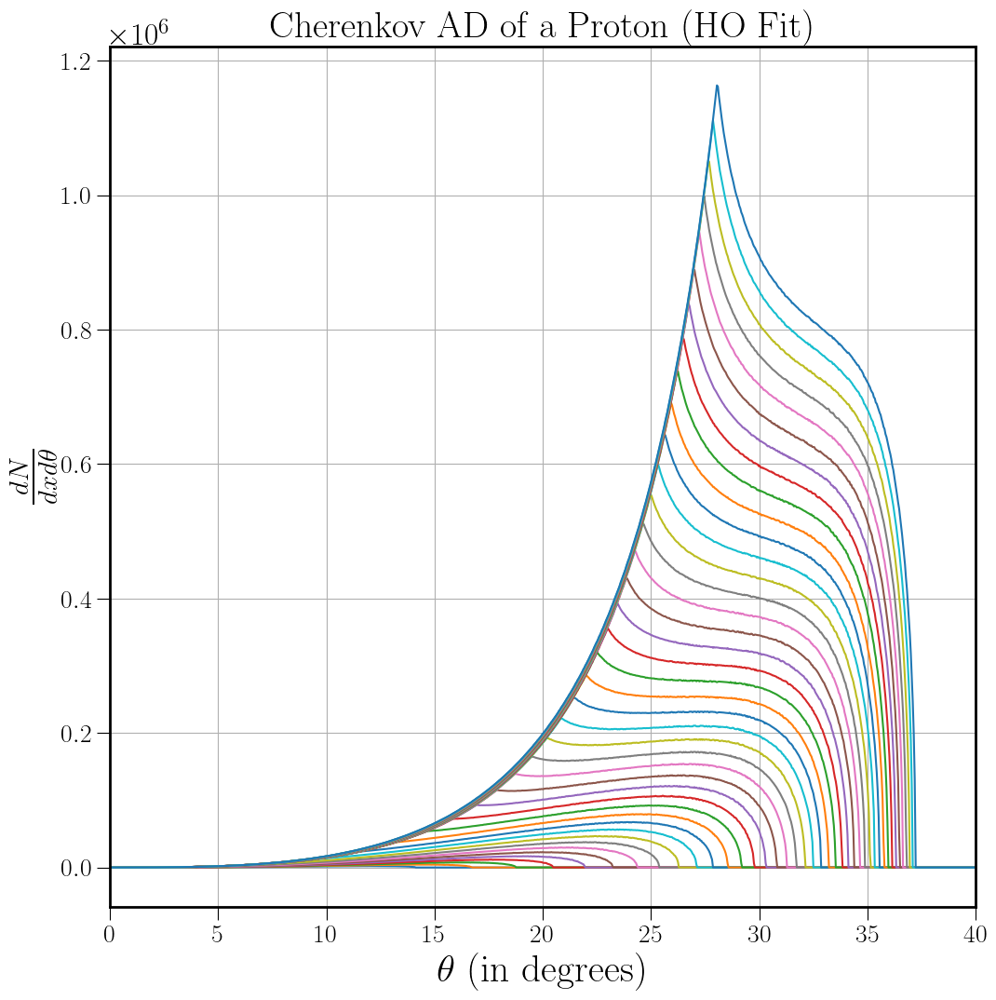

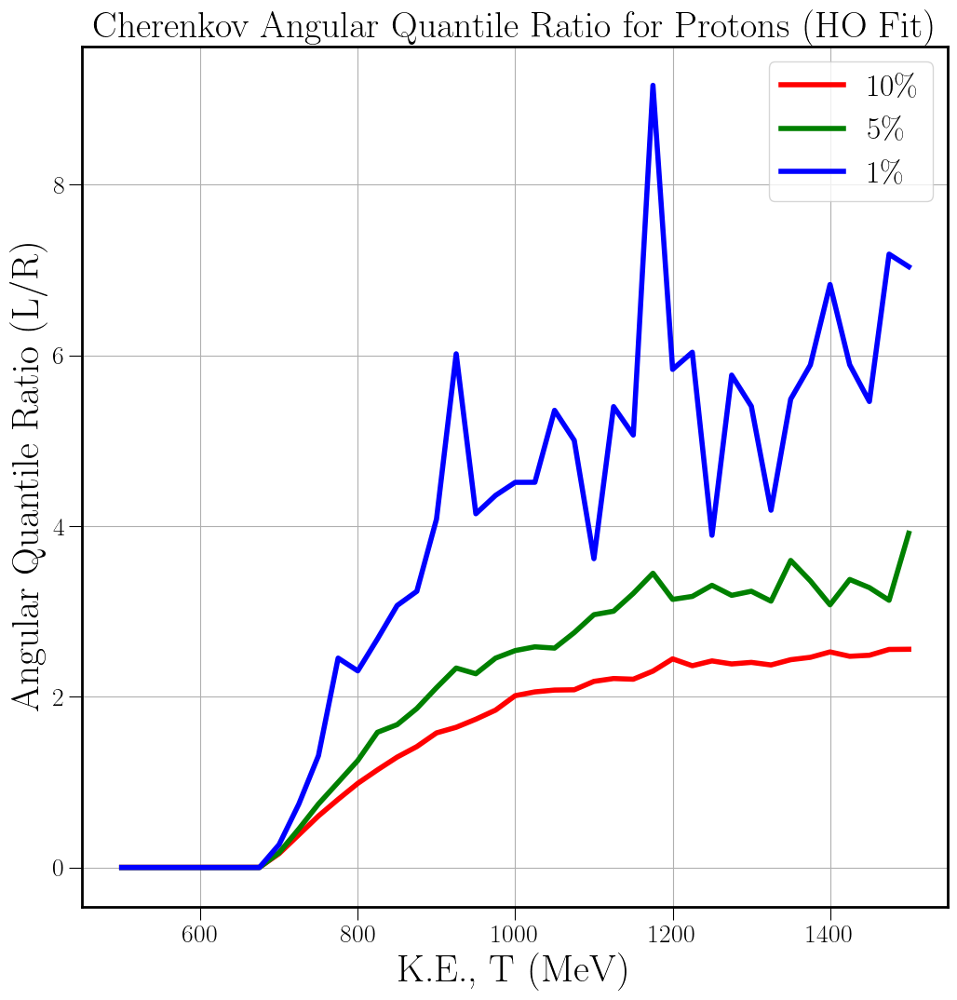

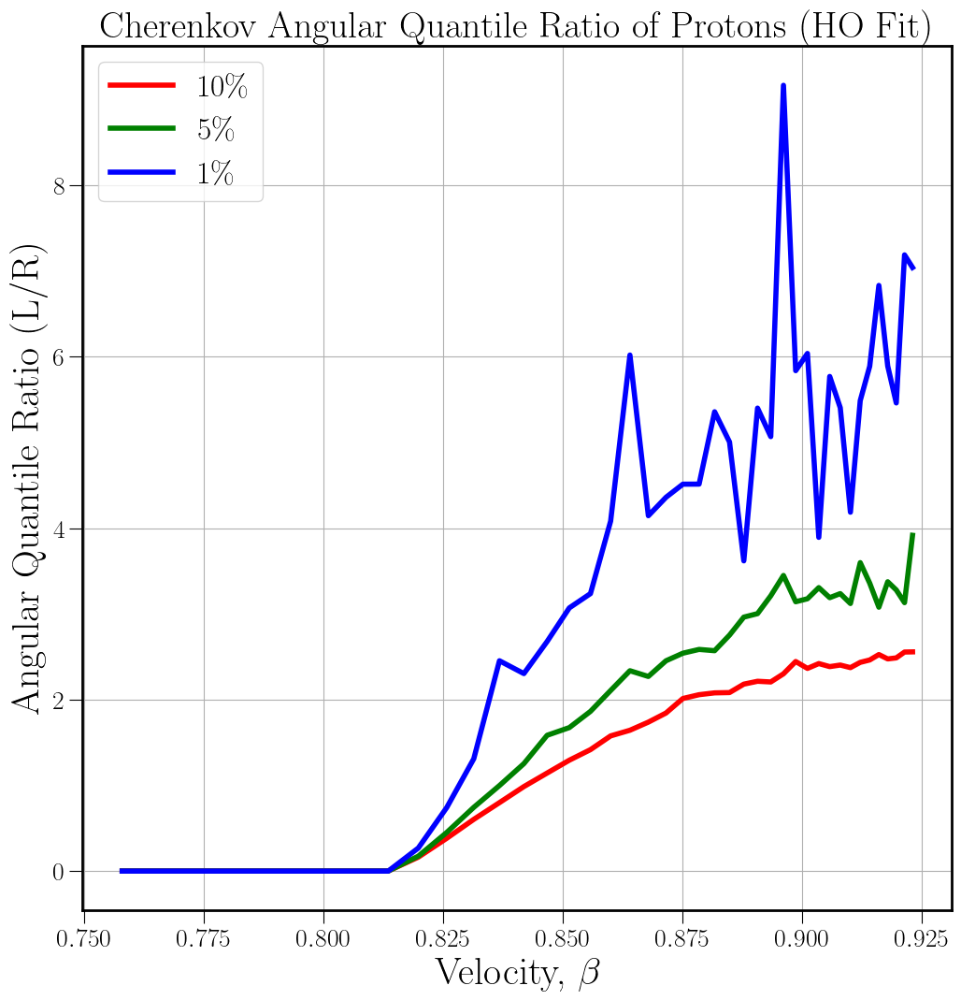

In [381]:
# Linear space in K.E.
# tp = np.linspace(500, 1500, 41)
tp = np.linspace(500, 1500, 41)

mp = 938  #Proton's mass in MeV
betap  = np.sqrt(1 - (1/(1 + tp/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

print("Proton: {}, {}, {}".format(tp, betap, np.round(betap,4)))

# # #Linear space in K.E.
# tm = np.linspace(100, 1000, 37)
# # # print(t)

# # #Mass of the particle travelling
# # # mp = 938 #Proton's mass
# mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²

# betamu  = np.sqrt(1 - (1/(1 + tm/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

# print("Muon: {}, {}, {}".format( tm, betamu, np.round(betamu, 4)))

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'Velocity, $\beta$', size= 30)
ax.set_ylabel(r'Angular Quantile Ratio (L/R)', size= 30) #$\frac{N}{A}$
# ax.set_ylabel(r'Angular Quantile Ratio (R/L)', size= 30) #$\frac{N}{A}$
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Cherenkov Angular Quantile Ratio of Protons (HO Fit)')
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.plot(betap, nbyaphs10, linewidth=4, c='r', label='$10 \%$')
ax.plot(betap, nbyaphs05, linewidth=4, c='g', label='$5 \%$')
ax.plot(betap, nbyaphs01, linewidth=4, c='b', label='$1 \%$')

# ax.plot(t, abynphs10, linewidth=4, c='r', label='$10 \%$')
# ax.plot(t, abynphs05, linewidth=4, c='g', label='$5 \%$')
# ax.plot(t, abynphs01, linewidth=4, c='b', label='$1 \%$')

ax.grid()
ax.legend()
# plt.savefig('nbyas_10_5_1_perc_hofit_Cherenkov_AD_Proton_allbetas_from_saved_data', bbox_inches='tight')
# plt.savefig('abyns_10_5_1_perc_hofit_Cherenkov_IAD_Proton_allbetas_from_saved_data', bbox_inches='tight')
plt.show()

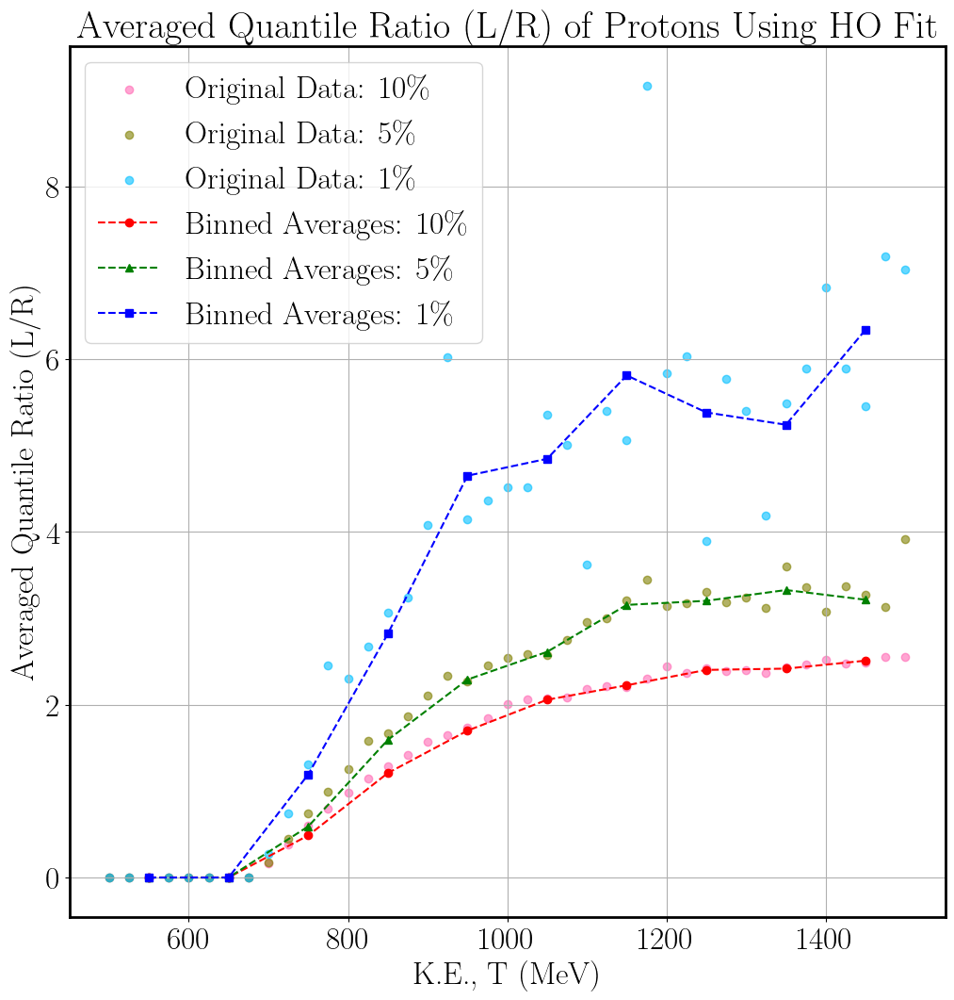

In [407]:
# Averaging elements within bins and then plotting these averages in Python can be achieved using libraries like NumPy and Matplotlib.
import numpy as np
import matplotlib.pyplot as plt

# 1. Generate or load your data
# For demonstration, let's create some sample data
np.random.seed(0) # for reproducibility
# x_data = np.random.rand(100) * 10 # x-values for binning
# y_data = 2 * x_data + np.random.randn(100) * 5 # y-values to be averaged

x_data = t # x-values for binning
y_data1h = np.array(nbyaphs10) # y-values to be averaged
y_data2h = np.array(nbyaphs05)
y_data3h = np.array(nbyaphs01)
 
# 2. Define the bins
num_bins = 10
# You can define custom bin edges or let NumPy determine them
bin_edges = np.linspace(min(x_data), max(x_data), num_bins + 1)

# 3. Bin the data and calculate the mean for each bin
# Use np.digitize to assign each x_data point to a bin index
bin_indices = np.digitize(x_data, bin_edges)

# Calculate the mean of y_data for each bin
bin_means1h = []
bin_centers1h = []

bin_means2h = []
bin_centers2h = []

bin_means3h = []
bin_centers3h = []

for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin1h = y_data1h[bin_indices == i]
    if len(elements_in_bin1h) > 0: # Avoid division by zero for empty bins
        bin_means1h.append(np.mean(elements_in_bin1h))
        # Calculate bin center for plotting
        bin_centers1h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means1h.append(np.nan)
        bin_centers1h.append((bin_edges[i-1] + bin_edges[i]) / 2)

for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin2h = y_data2h[bin_indices == i]
    if len(elements_in_bin2h) > 0: # Avoid division by zero for empty bins
        bin_means2h.append(np.mean(elements_in_bin2h))
        # Calculate bin center for plotting
        bin_centers2h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means2h.append(np.nan)
        bin_centers2h.append((bin_edges[i-1] + bin_edges[i]) / 2)

for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin3h = y_data3h[bin_indices == i]
    if len(elements_in_bin3h) > 0: # Avoid division by zero for empty bins
        bin_means3h.append(np.mean(elements_in_bin3h))
        # Calculate bin center for plotting
        bin_centers3h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means3h.append(np.nan)
        bin_centers3h.append((bin_edges[i-1] + bin_edges[i]) / 2)

# Remove NaN values if you don't want to plot empty bins
bin_centers1h = np.array(bin_centers1h)[~np.isnan(bin_means1h)]
bin_means1h = np.array(bin_means1h)[~np.isnan(bin_means1h)]

bin_centers2h = np.array(bin_centers2h)[~np.isnan(bin_means2h)]
bin_means2h = np.array(bin_means2h)[~np.isnan(bin_means2h)]

bin_centers3h = np.array(bin_centers3h)[~np.isnan(bin_means3h)]
bin_means3h = np.array(bin_means3h)[~np.isnan(bin_means3h)]

# 4. Plot the results
plt.figure(figsize=(12, 12))

plt.scatter(x_data, y_data1h, alpha=0.6, c='hotpink', label='Original Data: 10\%')
plt.scatter(x_data, y_data2h, alpha=0.6, c='olive', label='Original Data: 5\%')
plt.scatter(x_data, y_data3h, alpha=0.6, c='deepskyblue', label='Original Data: 1\%')

plt.plot(bin_centers1h, bin_means1h, color='red', marker='o', linestyle='--', label='Binned Averages: 10\%')
plt.plot(bin_centers2h, bin_means2h, color='green', marker='^', linestyle='--', label='Binned Averages: 5\%')
plt.plot(bin_centers3h, bin_means3h, color='blue', marker='s', linestyle='--', label='Binned Averages: 1\%')

plt.xlabel('K.E., T (MeV)') #(Binned Variable)
plt.ylabel('Averaged Quantile Ratio (L/R)') # (Averaged Variable)')
plt.title('Averaged Quantile Ratio (L/R) of Protons Using HO Fit') #in Bins of K.E. 
plt.legend()
plt.grid(True)

# plt.savefig('binned_avg_nbyas_10_5_1_perc_hofit_Cherenkov_AD_Proton_allT_from_saved_data', bbox_inches='tight') #_zoom
plt.show()

[array([0.00084561, 0.000926  , 0.0010213 , 0.00099863]), array([0.00115933, 0.0012596 , 0.00135886, 0.00155906]), array([0.16235796, 0.3825983 , 0.60344443, 0.79843308]), array([0.98549312, 1.14361349, 1.29319627, 1.41633901]), array([1.57679318, 1.64264796, 1.73736511, 1.84365058]), array([2.01301473, 2.05728588, 2.07863383, 2.08204551]), array([2.18050479, 2.21389026, 2.20582358, 2.30090124]), array([2.44442838, 2.3638087 , 2.4202585 , 2.38488488]), array([2.40300118, 2.37297734, 2.43441047, 2.46232074]), array([2.52557633, 2.47459119, 2.48662405, 2.55477801])] [9.47884262e-04 1.33421270e-03 4.86708442e-01 1.20966047e+00
 1.70011421e+00 2.05774499e+00 2.22527997e+00 2.40334512e+00
 2.41817743e+00 2.51039239e+00]
[array([0.0001306 , 0.00015312, 0.0001474 , 0.00015891]), array([0.00015415, 0.00018676, 0.00020153, 0.00023186]), array([0.17388265, 0.45070275, 0.74360851, 0.9975356 ]), array([1.25329489, 1.5840131 , 1.67357297, 1.86271846]), array([2.10640793, 2.33683767, 2.26996025, 2.4

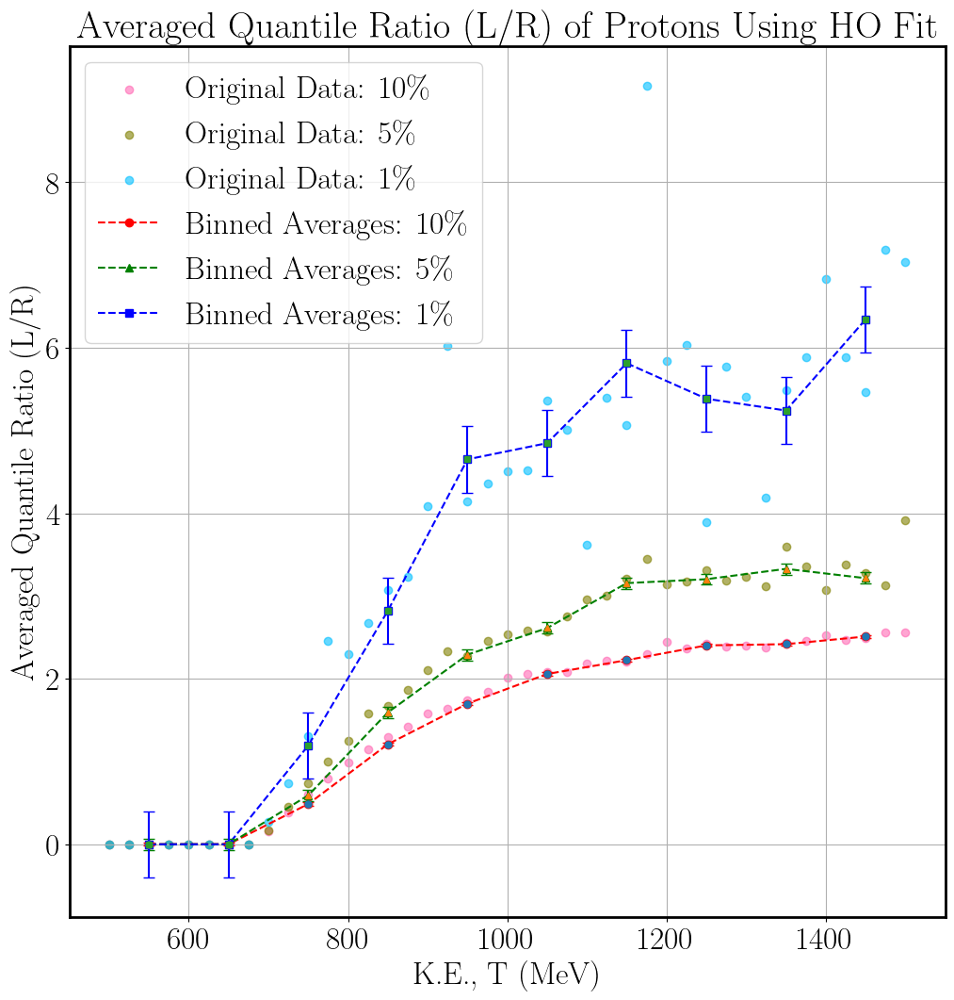

In [408]:
# Averaging elements within bins and then plotting these averages in Python can be achieved using libraries like NumPy and Matplotlib.
import numpy as np
import matplotlib.pyplot as plt

# 1. Generate or load your data
# For demonstration, let's create some sample data
np.random.seed(0) # for reproducibility
# x_data = np.random.rand(100) * 10 # x-values for binning
# y_data = 2 * x_data + np.random.randn(100) * 5 # y-values to be averaged

x_data = t # x-values for binning
y_data1h = np.array(nbyaphs10) # y-values to be averaged
y_data2h = np.array(nbyaphs05)
y_data3h = np.array(nbyaphs01)
 
# 2. Define the bins
num_bins = 10
# You can define custom bin edges or let NumPy determine them
bin_edges = np.linspace(min(x_data), max(x_data), num_bins + 1)

# 3. Bin the data and calculate the mean for each bin
# Use np.digitize to assign each x_data point to a bin index
bin_indices = np.digitize(x_data, bin_edges)

# Calculate the mean of y_data for each bin
bin_means1h = []
bin_centers1h = []

bin_means2h = []
bin_centers2h = []

bin_means3h = []
bin_centers3h = []


elements_in_bins_10h = []
elements_in_bins_05h = []
elements_in_bins_01h = []

bin_means_10h = []
bin_means_05h = []
bin_means_01h = []


#10% Q.ratio
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin1h = y_data1h[bin_indices == i]
    if len(elements_in_bin1h) > 0: # Avoid division by zero for empty bins
        bin_means1h.append(np.mean(elements_in_bin1h))
        # Calculate bin center for plotting
        bin_centers1h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means1h.append(np.nan)
        bin_centers1h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    elements_in_bins_10h.append(elements_in_bin1h)
    # bin_means_10.append(np.array(bin_means1[-1])) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_10, bin_means_10) 


#5% Q.ratio    
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin2h = y_data2h[bin_indices == i]
    if len(elements_in_bin2h) > 0: # Avoid division by zero for empty bins
        bin_means2h.append(np.mean(elements_in_bin2h))
        # Calculate bin center for plotting
        bin_centers2h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means2h.append(np.nan)
        bin_centers2h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    elements_in_bins_05h.append(elements_in_bin2h)
    # bin_means_05.append(bin_means2[-1]) ##bin_means1[-1]: value of the last element of an array/list      
# print(elements_in_bins_05, bin_means_05)


#1% Q.ratio
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin3h = y_data3h[bin_indices == i]
    if len(elements_in_bin3h) > 0: # Avoid division by zero for empty bins
        bin_means3h.append(np.mean(elements_in_bin3h))
        # Calculate bin center for plotting
        bin_centers3h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means3h.append(np.nan)
        bin_centers3h.append((bin_edges[i-1] + bin_edges[i]) / 2)

    elements_in_bins_01h.append(elements_in_bin3h)
    # bin_means_01.append(bin_means3[-1]) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_01, bin_means_01)    


# Remove NaN values if you don't want to plot empty bins
bin_centers1h = np.array(bin_centers1h)[~np.isnan(bin_means1h)]
bin_means1h = np.array(bin_means1h)[~np.isnan(bin_means1h)]

bin_centers2h = np.array(bin_centers2h)[~np.isnan(bin_means2h)]
bin_means2h = np.array(bin_means2h)[~np.isnan(bin_means2h)]

bin_centers3h = np.array(bin_centers3h)[~np.isnan(bin_means3h)]
bin_means3h = np.array(bin_means3h)[~np.isnan(bin_means3h)]


# print(bin_means1h, bin_means2h, bin_means3h)

print(elements_in_bins_10h, bin_means1h)
print(elements_in_bins_05h, bin_means2h)
print(elements_in_bins_01h, bin_means3h)

#Jackknife resampling with my data 

def jackknife_statistic(data, statistic):
    n = len(data)
    jackknife_samples = np.zeros(n)

    for i in range(n):
        sample = np.delete(data, i)
        jackknife_samples[i] = statistic(sample)

    jackknife_mean = np.mean(jackknife_samples)
    variance = (n - 1) / n * np.sum((jackknife_samples - jackknife_mean)**2)
    bias = (n - 1) * (jackknife_mean - statistic(data))
    
    return jackknife_mean, variance, bias

# Example
# data = np.array([2, 4, 6, 8, 10])
#Real Data
data10h = elements_in_bins_10h
data05h = elements_in_bins_05h
data01h = elements_in_bins_01h
# print("data10 = {}, data05 = {}, data01 = {}".format(data10, data05, data01))
stat = np.mean

# # mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
# mean_jack10, var_jack10, bias_jack10 = jackknife_statistic(data10, stat)
# mean_jack05, var_jack05, bias_jack05 = jackknife_statistic(data05, stat)
# mean_jack01, var_jack01, bias_jack01 = jackknife_statistic(data01, stat)


for i in data10h: 
# mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
    mean_jack10h, var_jack10h, bias_jack10h = jackknife_statistic(i, stat)
    # mean_jack05, var_jack05, bias_jack05 = jackknife_statistic(data05, stat)
    # mean_jack01, var_jack01, bias_jack01 = jackknife_statistic(data01, stat)
    print("Jackknife 10 %: mean={}, var={}, bias={}".format(mean_jack10h, var_jack10h, bias_jack10h))

for j in data05h: 
# mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
    # mean_jack10, var_jack10, bias_jack10 = jackknife_statistic(i, stat)
    mean_jack05h, var_jack05h, bias_jack05h = jackknife_statistic(j, stat)
    # mean_jack01, var_jack01, bias_jack01 = jackknife_statistic(data01, stat)
    print("Jackknife 5 %: mean={}, var={}, bias={}".format(mean_jack05h, var_jack05h, bias_jack05h))


for k in data01h: 
# mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
    # mean_jack10, var_jack10, bias_jack10 = jackknife_statistic(i, stat)
    # mean_jack05, var_jack05, bias_jack05 = jackknife_statistic(data05, stat)
    mean_jack01h, var_jack01h, bias_jack01h = jackknife_statistic(k, stat)
    print("Jackknife 1 %: mean={}, var={}, bias={}".format(mean_jack01h, var_jack01h, bias_jack01h))


    # print("Jackknife Means:", mean_jack10, mean_jack05, mean_jack01)
    # print("Jackknife Variances:", var_jack10, var_jack05, var_jack01)
    # print("Jackknife Biases:", bias_jack10, bias_jack05, bias_jack01)


# 4. Plot the results
plt.figure(figsize=(12, 12))

plt.scatter(x_data, y_data1h, alpha=0.6, c='hotpink', label='Original Data: 10\%')
plt.scatter(x_data, y_data2h, alpha=0.6, c='olive', label='Original Data: 5\%')
plt.scatter(x_data, y_data3h, alpha=0.6, c='deepskyblue', label='Original Data: 1\%')

plt.plot(bin_centers1h, bin_means1h, color='red', marker='o', linestyle='--', label='Binned Averages: 10\%')
plt.plot(bin_centers2h, bin_means2h, color='green', marker='^', linestyle='--', label='Binned Averages: 5\%')
plt.plot(bin_centers3h, bin_means3h, color='blue', marker='s', linestyle='--', label='Binned Averages: 1\%')

# plt.errorbar(x_values, y_estimates, yerr=jackknife_errors, fmt='o', capsize=4, ecolor='red', markersize=5)  #Jackknife errorbar
plt.errorbar(bin_centers1h, bin_means1h, yerr=np.sqrt(var_jack10h), fmt='o', capsize=4, ecolor='red', markersize=5)  #Jackknife errorbar for 10% Q.ratio
plt.errorbar(bin_centers2h, bin_means2h, yerr=np.sqrt(var_jack05h), fmt='^', capsize=4, ecolor='green', markersize=5)  #Jackknife errorbar for 10% Q.ratio
plt.errorbar(bin_centers3h, bin_means3h, yerr=np.sqrt(var_jack01h), fmt='s', capsize=4, ecolor='blue', markersize=5)  #Jackknife errorbar for 10% Q.ratio

plt.xlabel('K.E., T (MeV)') #(Binned Variable)
plt.ylabel('Averaged Quantile Ratio (L/R)') # (Averaged Variable)')
plt.title('Averaged Quantile Ratio (L/R) of Protons Using HO Fit') #in Bins of K.E. 
plt.legend()
plt.grid(True)

# plt.savefig('binned_avg_nbyas_10_5_1_perc_hofit_Cherenkov_AD_Proton_allT_from_saved_data_w_jackknife_err', bbox_inches='tight') #_zoom
plt.show()

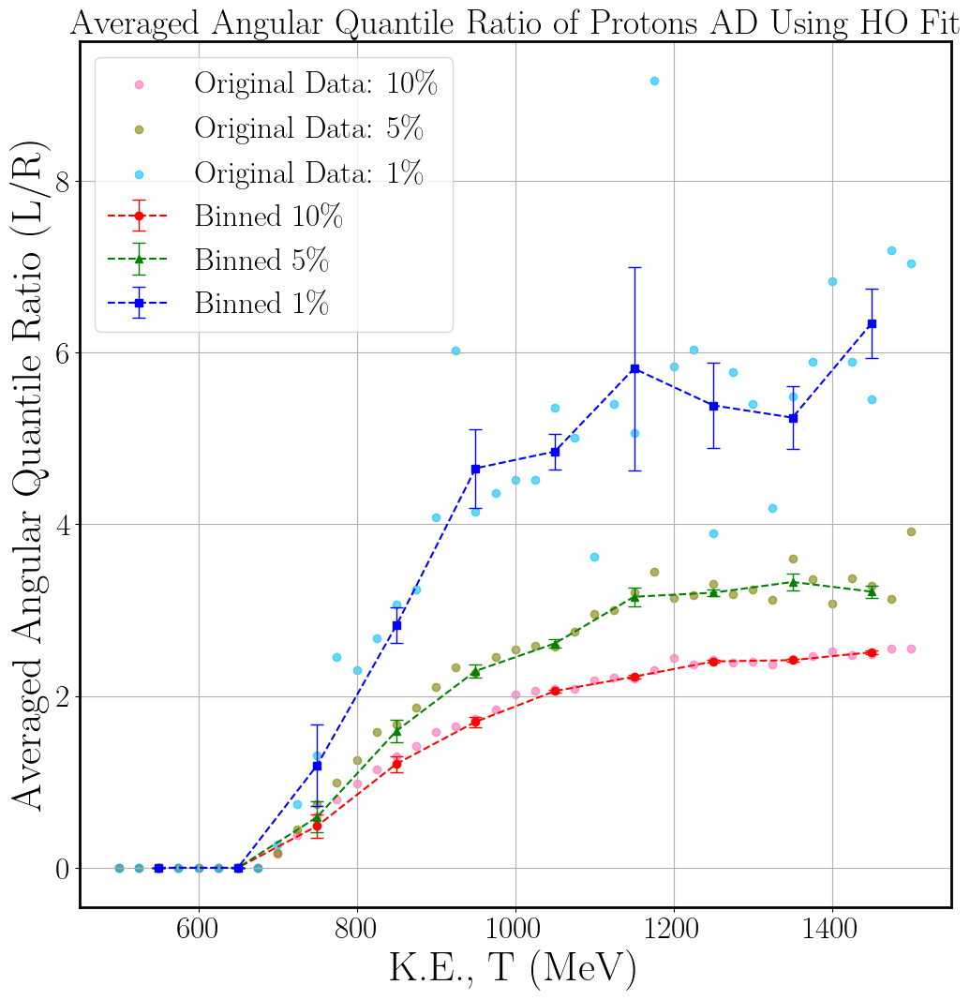

In [97]:
# Averaging elements within bins and then plotting these averages in Python can be achieved using libraries like NumPy and Matplotlib.
import numpy as np
import matplotlib.pyplot as plt

# 1. Generate or load your data
# For demonstration, let's create some sample data
np.random.seed(0) # for reproducibility
# x_data = np.random.rand(100) * 10 # x-values for binning
# y_data = 2 * x_data + np.random.randn(100) * 5 # y-values to be averaged

x_data = t # x-values for binning
y_data1h = np.array(nbyaphs10) # y-values to be averaged
y_data2h = np.array(nbyaphs05)
y_data3h = np.array(nbyaphs01)
 
# 2. Define the bins
num_bins = 10
# You can define custom bin edges or let NumPy determine them
bin_edges = np.linspace(min(x_data), max(x_data), num_bins + 1)

# 3. Bin the data and calculate the mean for each bin
# Use np.digitize to assign each x_data point to a bin index
bin_indices = np.digitize(x_data, bin_edges)

# Calculate the mean of y_data for each bin
bin_means1h = []
bin_centers1h = []

bin_means2h = []
bin_centers2h = []

bin_means3h = []
bin_centers3h = []


elements_in_bins_10h = []
elements_in_bins_05h = []
elements_in_bins_01h = []

bin_means_10h = []
bin_means_05h = []
bin_means_01h = []



#10% Q.ratio
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin1h = y_data1h[bin_indices == i]
    if len(elements_in_bin1h) > 0: # Avoid division by zero for empty bins
        bin_means1h.append(np.mean(elements_in_bin1h))
        # Calculate bin center for plotting
        bin_centers1h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means1h.append(np.nan)
        bin_centers1h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    elements_in_bins_10h.append(elements_in_bin1h)
    # bin_means_10.append(np.array(bin_means1[-1])) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_10, bin_means_10) 


#5% Q.ratio    
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin2h = y_data2h[bin_indices == i]
    if len(elements_in_bin2h) > 0: # Avoid division by zero for empty bins
        bin_means2h.append(np.mean(elements_in_bin2h))
        # Calculate bin center for plotting
        bin_centers2h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means2h.append(np.nan)
        bin_centers2h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    elements_in_bins_05h.append(elements_in_bin2h)
    # bin_means_05.append(bin_means2[-1]) ##bin_means1[-1]: value of the last element of an array/list      
# print(elements_in_bins_05, bin_means_05)


#1% Q.ratio
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin3h = y_data3h[bin_indices == i]
    if len(elements_in_bin3h) > 0: # Avoid division by zero for empty bins
        bin_means3h.append(np.mean(elements_in_bin3h))
        # Calculate bin center for plotting
        bin_centers3h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means3h.append(np.nan)
        bin_centers3h.append((bin_edges[i-1] + bin_edges[i]) / 2)

    elements_in_bins_01h.append(elements_in_bin3h)
    # bin_means_01.append(bin_means3[-1]) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_01, bin_means_01)    


# Remove NaN values if you don't want to plot empty bins
bin_centers1h = np.array(bin_centers1h)[~np.isnan(bin_means1h)]
bin_means1h = np.array(bin_means1h)[~np.isnan(bin_means1h)]

bin_centers2h = np.array(bin_centers2h)[~np.isnan(bin_means2h)]
bin_means2h = np.array(bin_means2h)[~np.isnan(bin_means2h)]

bin_centers3h = np.array(bin_centers3h)[~np.isnan(bin_means3h)]
bin_means3h = np.array(bin_means3h)[~np.isnan(bin_means3h)]


# print(bin_means1h, bin_means2h, bin_means3h)

# print(elements_in_bins_10h, bin_means1h)
# print(elements_in_bins_05h, bin_means2h)
# print(elements_in_bins_01h, bin_means3h)

#Jackknife resampling with my data 

def jackknife_statistic(data, statistic):
    n = len(data)
    jackknife_samples = np.zeros(n)

    for i in range(n):
        sample = np.delete(data, i)
        jackknife_samples[i] = statistic(sample)

    jackknife_mean = np.mean(jackknife_samples)
    variance = (n - 1) / n * np.sum((jackknife_samples - jackknife_mean)**2)
    bias = (n - 1) * (jackknife_mean - statistic(data))
    
    return jackknife_mean, variance, bias

# Example
# data = np.array([2, 4, 6, 8, 10])
#Real Data
data10h = elements_in_bins_10h
data05h = elements_in_bins_05h
data01h = elements_in_bins_01h
# print("data10 = {}, data05 = {}, data01 = {}".format(data10, data05, data01))
stat = np.mean


# Initialize empty lists to store results for each bin
means_10h, errs_10h = [], []
means_05h, errs_05h = [], []
means_01h, errs_01h = [], []

# Loop for 10% data
for bin_data in elements_in_bins_10h:
    if len(bin_data) > 1: # Jackknife requires at least 2 points
        m, v, b = jackknife_statistic(bin_data, np.mean)
        means_10h.append(m)
        errs_10h.append(np.sqrt(v)) # Error bar is square root of variance
    else:
        means_10h.append(np.nan)
        errs_10h.append(np.nan)

# Loop for 5% data
for bin_data in elements_in_bins_05h:
    if len(bin_data) > 1:
        m, v, b = jackknife_statistic(bin_data, np.mean)
        means_05h.append(m)
        errs_05h.append(np.sqrt(v))
    else:
        means_05h.append(np.nan)
        errs_05h.append(np.nan)

# Loop for 1% data
for bin_data in elements_in_bins_01h:
    if len(bin_data) > 1:
        m, v, b = jackknife_statistic(bin_data, np.mean)
        means_01h.append(m)
        errs_01h.append(np.sqrt(v))
    else:
        means_01h.append(np.nan)
        errs_01h.append(np.nan)

#Plotting

plt.figure(figsize=(12, 12))

plt.scatter(x_data, y_data1h, alpha=0.6, c='hotpink', label='Original Data: 10\%')
plt.scatter(x_data, y_data2h, alpha=0.6, c='olive', label='Original Data: 5\%')
plt.scatter(x_data, y_data3h, alpha=0.6, c='deepskyblue', label='Original Data: 1\%')


# Define labels and colors for cleaner code
datasets = [
    (bin_centers1h, means_10h, errs_10h, 'red', 'o', '10\%'),
    (bin_centers2h, means_05h, errs_05h, 'green', '^', '5\%'),
    (bin_centers3h, means_01h, errs_01h, 'blue', 's', '1\%')
]

for x, y, yerr, color, marker, label in datasets:
    # Convert to numpy arrays to handle indexing/NaNs
    x, y, yerr = np.array(x), np.array(y), np.array(yerr)
    mask = ~np.isnan(y)
    
    plt.errorbar(x[mask], y[mask], yerr=yerr[mask], 
                 fmt=marker, color=color, linestyle='--', 
                 capsize=5, elinewidth=1, label=f'Binned {label}')

plt.xlabel('K.E., T (MeV)', size=32)
plt.ylabel('Averaged Angular Quantile Ratio (L/R)', size=32)
plt.title('Averaged Angular Quantile Ratio of Protons AD Using HO Fit', size=27) #in Bins of K.E. 
plt.legend()
plt.grid(True)

plt.savefig('binned_avg_nbyas_10_5_1_perc_hofit_Cherenkov_AD_Proton_allT_from_saved_data_w_jackknife_err_corrected', bbox_inches='tight') #_zoom
plt.show()

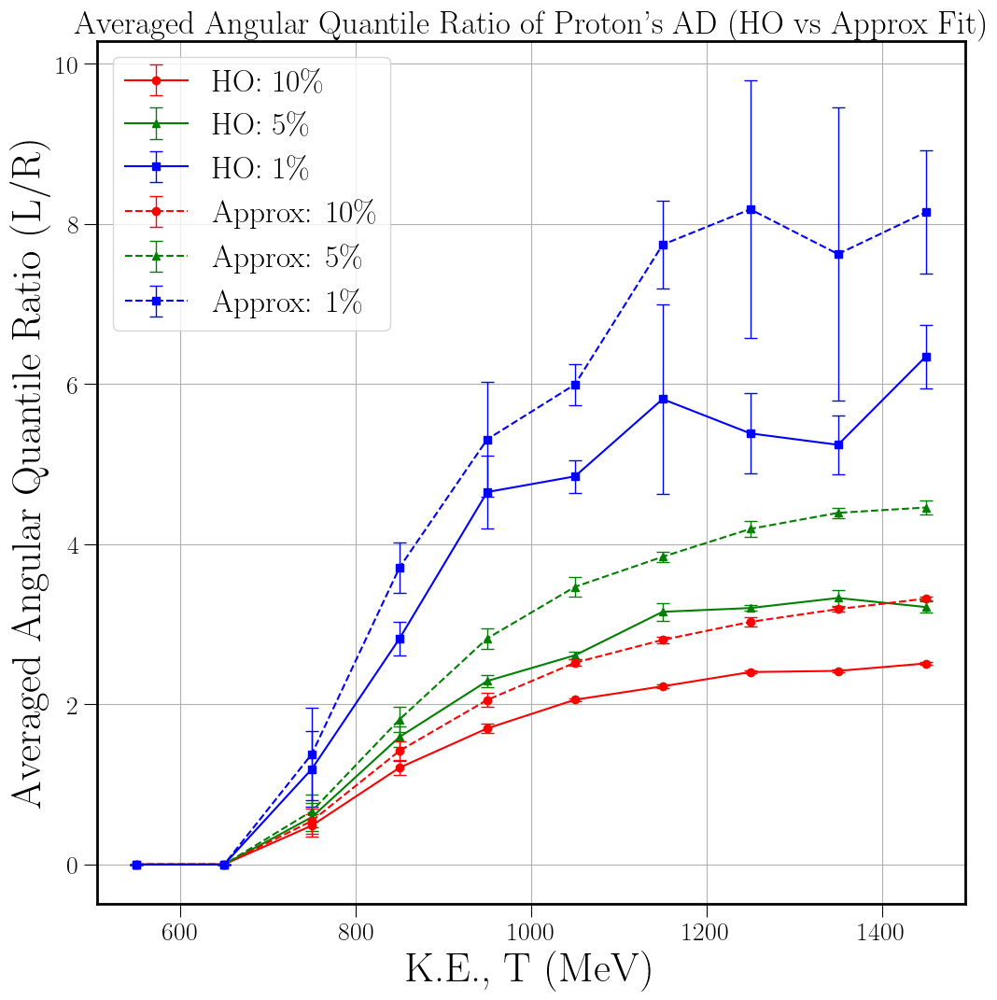

In [99]:
#Linear space in K.E.
# t = np.linspace(500, 1500, 41)
# print(t)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'K.E., T (MeV)', size= 32)
ax.set_ylabel(r'Averaged Angular Quantile Ratio (L/R)', size= 32)
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Averaged Angular Quantile Ratio of Proton\'s AD (HO vs Approx Fit)', fontsize=25)
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)


# plt.scatter(x_data, y_data1h, alpha=0.6, c='hotpink', label='Original Data: 10\%')
# plt.scatter(x_data, y_data2h, alpha=0.6, c='olive', label='Original Data: 5\%')
# plt.scatter(x_data, y_data3h, alpha=0.6, c='deepskyblue', label='Original Data: 1\%')


# Define labels and colors for cleaner code
datasets1 = [
    (bin_centers1h, means_10h, errs_10h, 'red', 'o', '10\%'),
    (bin_centers2h, means_05h, errs_05h, 'green', '^', '5\%'),
    (bin_centers3h, means_01h, errs_01h, 'blue', 's', '1\%')
]

for x, y, yerr, color, marker, label in datasets1:
    # Convert to numpy arrays to handle indexing/NaNs
    x, y, yerr = np.array(x), np.array(y), np.array(yerr)
    mask = ~np.isnan(y)
    
    plt.errorbar(x[mask], y[mask], yerr=yerr[mask], 
                 fmt=marker, color=color, linestyle='solid', 
                 capsize=5, elinewidth=1, label=f'HO: {label}')


# Define labels and colors for cleaner code
datasets2 = [
    (bin_centers1, means_10, errs_10, 'red', 'o', '10\%'),
    (bin_centers2, means_05, errs_05, 'green', '^', '5\%'),
    (bin_centers3, means_01, errs_01, 'blue', 's', '1\%')
]

for x, y, yerr, color, marker, label in datasets2:
    # Convert to numpy arrays to handle indexing/NaNs
    x, y, yerr = np.array(x), np.array(y), np.array(yerr)
    mask = ~np.isnan(y)
    
    plt.errorbar(x[mask], y[mask], yerr=yerr[mask], 
                 fmt=marker, color=color, linestyle='--', 
                 capsize=5, elinewidth=1, label=f'Approx: {label}')



# # Add a vertical arrow
# # x, y: starting point of the arrow
# # dx, dy: length of the arrow along x and y directions
# plt.arrow(x=1400, y=1.25, dx=0, dy=0.40, width=0.5, head_width=3.5, head_length=0.05, fc='r', ec='r')

ax.grid()
ax.legend()

# plt.savefig('binned_avg_AQR_ho_vs_approxfit_Cherenkov_AD_Proton_allTs_10_5_1_perc_from_saved_data_w_jackknife_err_corrected', bbox_inches='tight')
# plt.savefig('binned_avg_nbyas_hofit_Cherenkov_IAD_Proton_allT_from_saved_data', bbox_inches='tight')
# plt.savefig('binned_avg_nbyas_ho_vs_approxfit_Cherenkov_IAD_Proton_allTs_10_perc_from_saved_data', bbox_inches='tight')
plt.show()

In [413]:
#Linear space in K.E.
t = np.linspace(500, 1500, 41)
# print(t)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'K.E., T (MeV)', size= 30)
ax.set_ylabel(r'Ratio of Normal to Anomalous Quantile (L/R)', size= 30)
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Cherenkov Quantile Ratio of Protons (HO vs Approx Fit)')
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.plot(t, nbyapps10, linewidth=4, c='r', label="Approx: 10\%", ls='dashdot')
ax.plot(t, nbyapps05, linewidth=4, c='g', label="Approx: 5\%", ls='dashdot')
ax.plot(t, nbyapps01, linewidth=4, c='b', label="Approx: 1\%", ls='dashdot')

ax.plot(t, nbyaphs10, linewidth=4, c='r', label="HO: 10\%")
ax.plot(t, nbyaphs05, linewidth=4, c='g', label="HO: 5\%")
ax.plot(t, nbyaphs01, linewidth=4, c='b', label="HO: 1\%")

# Add a vertical arrow
# x, y: starting point of the arrow
# dx, dy: length of the arrow along x and y directions
plt.arrow(x=1400, y=1.25, dx=0, dy=0.40, width=0.5, head_width=3.5, head_length=0.05, fc='r', ec='r')

ax.grid()
ax.legend()
# plt.savefig('nbyas_hofit_Cherenkov_AD_Proton_allT_from_saved_data', bbox_inches='tight')
# plt.savefig('nbyas_ho_vs_approxfit_Cherenkov_AD_Proton_allTs_10_5_1_perc_from_saved_data_mplot4_arrow', bbox_inches='tight')
# plt.savefig('nbyas_ho_vs_approxfit_Cherenkov_AD_Proton_allTs_10_perc_from_saved_data', bbox_inches='tight')


NameError: name 'var_jack10' is not defined

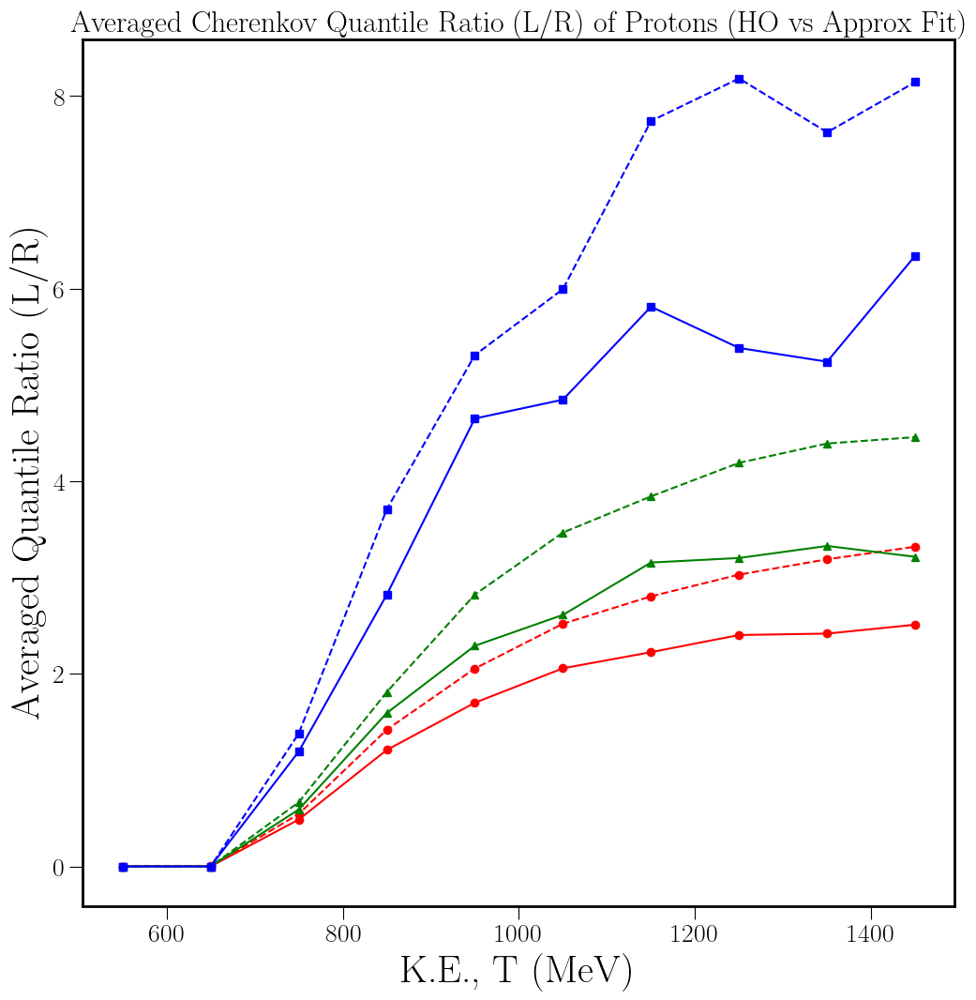

In [101]:
#Linear space in K.E.
t = np.linspace(500, 1500, 41)
# print(t)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'K.E., T (MeV)', size= 30)
ax.set_ylabel(r'Averaged Quantile Ratio (L/R)', size= 30)
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Averaged Cherenkov Quantile Ratio (L/R) of Protons (HO vs Approx Fit)', fontsize=23)
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)

# ax.plot(t, nbyapps10, linewidth=4, c='r', label="Approx: 10\%", ls='dashdot')
# ax.plot(t, nbyapps05, linewidth=4, c='g', label="Approx: 5\%", ls='dashdot')
# ax.plot(t, nbyapps01, linewidth=4, c='b', label="Approx: 1\%", ls='dashdot')

# ax.plot(t, nbyaphs10, linewidth=4, c='r', label="HO: 10\%")
# ax.plot(t, nbyaphs05, linewidth=4, c='g', label="HO: 5\%")
# ax.plot(t, nbyaphs01, linewidth=4, c='b', label="HO: 1\%")

plt.plot(bin_centers1, bin_means1, color='red', marker='o', linestyle='--', label='Approx 10\%')
plt.plot(bin_centers2, bin_means2, color='green', marker='^', linestyle='--', label='Approx 5\%')
plt.plot(bin_centers3, bin_means3, color='blue', marker='s', linestyle='--', label='Approx 1\%')

plt.plot(bin_centers1h, bin_means1h, color='red', marker='o', linestyle='solid', label='HO 10\%')
plt.plot(bin_centers2h, bin_means2h, color='green', marker='^', linestyle='solid', label='HO 5\%')
plt.plot(bin_centers3h, bin_means3h, color='blue', marker='s', linestyle='solid', label='HO 1\%')

# plt.errorbar(x_values, y_estimates, yerr=jackknife_errors, fmt='o', capsize=4, ecolor='red', markersize=5)  #Jackknife errorbar
plt.errorbar(bin_centers1, bin_means1, yerr=np.sqrt(var_jack10), fmt='o', capsize=4, ecolor='hotpink', markersize=5)  #Jackknife errorbar for 10% Q.ratio
plt.errorbar(bin_centers2, bin_means2, yerr=np.sqrt(var_jack05), fmt='^', capsize=4, ecolor='olive', markersize=5)  #Jackknife errorbar for 10% Q.ratio
plt.errorbar(bin_centers3, bin_means3, yerr=np.sqrt(var_jack01), fmt='s', capsize=4, ecolor='deepskyblue', markersize=5)  #Jackknife errorbar for 10% Q.ratio

# plt.errorbar(x_values, y_estimates, yerr=jackknife_errors, fmt='o', capsize=4, ecolor='red', markersize=5)  #Jackknife errorbar
plt.errorbar(bin_centers1h, bin_means1h, yerr=np.sqrt(var_jack10h), fmt='o', capsize=4, ecolor='red', markersize=5)  #Jackknife errorbar for 10% Q.ratio
plt.errorbar(bin_centers2h, bin_means2h, yerr=np.sqrt(var_jack05h), fmt='^', capsize=4, ecolor='green', markersize=5)  #Jackknife errorbar for 10% Q.ratio
plt.errorbar(bin_centers3h, bin_means3h, yerr=np.sqrt(var_jack01h), fmt='s', capsize=4, ecolor='blue', markersize=5)  #Jackknife errorbar for 10% Q.ratio



# # Add a vertical arrow
# # x, y: starting point of the arrow
# # dx, dy: length of the arrow along x and y directions
# plt.arrow(x=1400, y=1.25, dx=0, dy=0.40, width=0.5, head_width=3.5, head_length=0.05, fc='r', ec='r')

ax.grid()
ax.legend()
# plt.savefig('binned_avg_nbyas_hofit_Cherenkov_IAD_Proton_allT_from_saved_data', bbox_inches='tight')
# plt.savefig('binned_avg_nbyas_ho_vs_approxfit_Cherenkov_AD_Proton_allTs_10_5_1_perc_from_saved_data_w_jackknife_err_mplot4b', bbox_inches='tight')
# plt.savefig('binned_avg_nbyas_ho_vs_approxfit_Cherenkov_IAD_Proton_allTs_10_perc_from_saved_data', bbox_inches='tight')
plt.show()

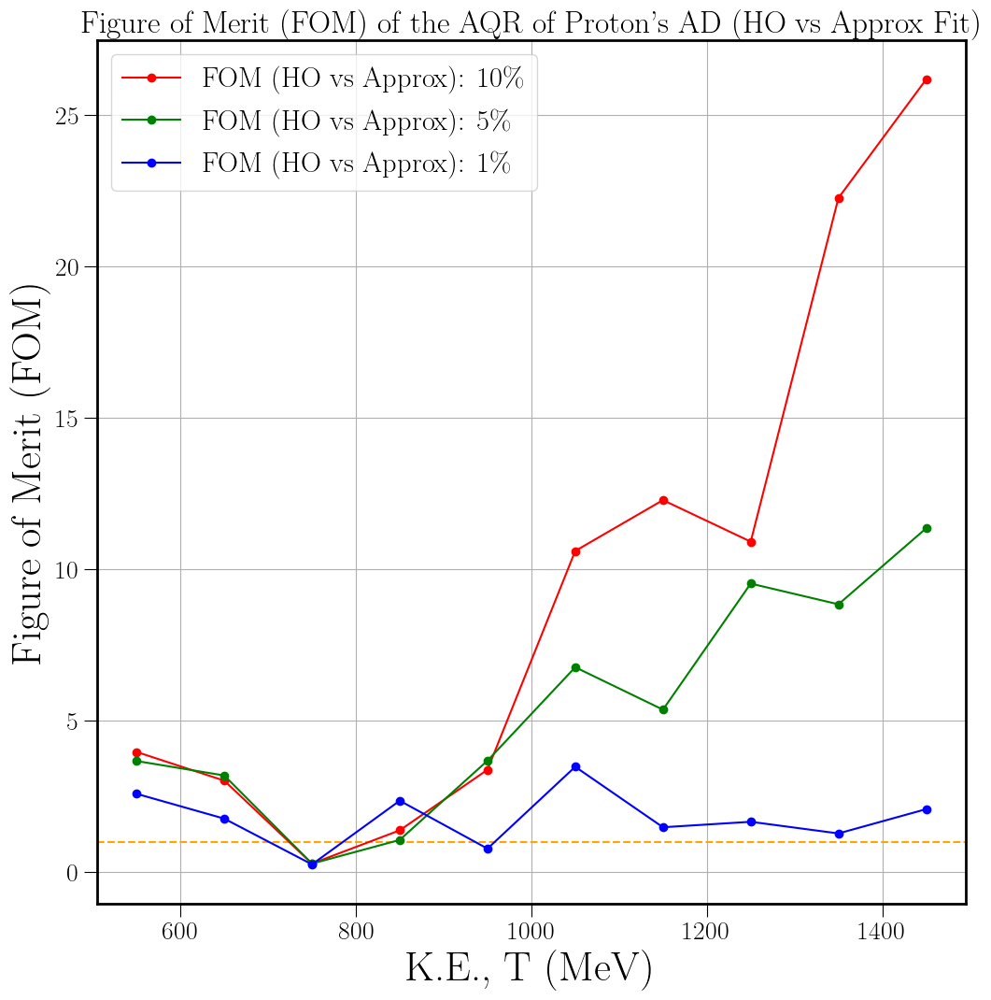

In [105]:
import matplotlib.pyplot as plt
import numpy as np

# ... [Previous setup code for fig and ax remains the same] ...
#Compare between AQRs of Muon's Integrated AD using HO vs Approx fit w/ Figure of Merit (FOM)

#Linear space in K.E.
# t = np.linspace(500, 1500, 41)
# print(t)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'K.E., T (MeV)', size= 32)
ax.set_ylabel(r'Figure of Merit (FOM)', size= 32)
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Figure of Merit (FOM) of the AQR of Proton\'s AD (HO vs Approx Fit)', fontsize=24)
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)


# --- Process HO Fit Datasets ---

# Define labels and colors for cleaner code: HO Fit
datasets1 = [
    (bin_centers1h, means_10h, errs_10h, 'red', 'o', '10\%'),
    (bin_centers2h, means_05h, errs_05h, 'green', '^', '5\%'),
    (bin_centers3h, means_01h, errs_01h, 'blue', 's', '1\%')
]

x1_list, y1_list, yerr1_list = [], [], []
for x_data, y_data, err_data, color, marker, label in datasets1:
    x_np, y_np, yerr_np = np.array(x_data), np.array(y_data), np.array(err_data)
    x1_list.append(x_np)
    y1_list.append(y_np)
    yerr1_list.append(yerr_np)


# --- Process Approx Fit Datasets ---

# Define labels and colors for cleaner code: Approx Fit

datasets2 = [
    (bin_centers1, means_10, errs_10, 'red', 'o', '10\%'),
    (bin_centers2, means_05, errs_05, 'green', '^', '5\%'),
    (bin_centers3, means_01, errs_01, 'blue', 's', '1\%')
]

x2_list, y2_list, yerr2_list = [], [], []
for x_data, y_data, err_data, color, marker, label in datasets2:
    x_np, y_np, yerr_np = np.array(x_data), np.array(y_data), np.array(err_data)
    x2_list.append(x_np)
    y2_list.append(y_np)
    yerr2_list.append(yerr_np)

# --- FOM calculation ---
# Convert lists to NumPy arrays so we can do math on them
# This creates arrays of shape (3, N)
Y1 = np.array(y1_list)
Y2 = np.array(y2_list)
E1 = np.array(yerr1_list)
E2 = np.array(yerr2_list)
X2 = np.array(x2_list)

# Calculate FOM for all three datasets at once
# fom1 uses geometric mean of errors, fom2 uses quadrature (standard)
fom1 = abs(Y2 - Y1) / np.sqrt(E1 * E2)
fom2 = abs(Y2 - Y1) / np.sqrt(E1**2 + E2**2)

# --- Plotting the Results ---
# Loop through the calculated FOMs to plot each line
labels = ['10\%', '5\%', '1\%']
colors = ['red', 'green', 'blue']

for i in range(len(fom2)):
    mask = ~np.isnan(fom2[i])
    ax.plot(X2[i][mask], fom2[i][mask], 
            label=f'FOM (HO vs Approx): {labels[i]}', 
            color=colors[i], marker='o')

plt.axhline(y=1, color='orange', linestyle='--', zorder=0)

ax.grid()
ax.legend(fontsize=22)

# plt.savefig('FOM_AQR_ho_vs_approxfit_Cherenkov_AD_Proton_allTs_10_5_1_perc', bbox_inches='tight')

plt.show()


# Quantile Ratio (L/R ~ N/A) from Muon's AD (Approx fit)

In [117]:
# Linear space in K.E.
tp = np.linspace(500, 1500, 41)
tm = np.linspace(50, 1000, 39)
# print(t)
#Mass of the particle travelling
mp = 938 #Proton's mass
mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²

betap  = np.sqrt(1 - (1/(1 + tm/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD
print("Proton: {}, {}, {}".format(tp, betap, np.round(betap,4)))


betamu  = np.sqrt(1 - (1/(1 + tm/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

print("Muon: {}, {}, {}".format(tm, betamu, np.round(betamu,4)))

# # #Linear space in K.E.
# tm = np.linspace(100, 1000, 37)
# # # print(t)

# # #Mass of the particle travelling
# # # mp = 938 #Proton's mass
# mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²

# betamu  = np.sqrt(1 - (1/(1 + tm/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

# print("Muon: {}, {}, {}".format( tm, betamu, np.round(betamu, 4)))


Proton: [ 500.  525.  550.  575.  600.  625.  650.  675.  700.  725.  750.  775.
  800.  825.  850.  875.  900.  925.  950.  975. 1000. 1025. 1050. 1075.
 1100. 1125. 1150. 1175. 1200. 1225. 1250. 1275. 1300. 1325. 1350. 1375.
 1400. 1425. 1450. 1475. 1500.], [0.31409151 0.37761551 0.42824876 0.47048446 0.50668314 0.53827807
 0.56622157 0.59118658 0.61367043 0.63405328 0.6526336  0.66965074
 0.68530001 0.69974315 0.71311572 0.72553258 0.73709191 0.74787834
 0.75796532 0.76741698 0.77628968 0.78463315 0.79249149 0.79990401
 0.80690583 0.81352846 0.81980026 0.82574686 0.83139144 0.83675507
 0.8418569  0.84671442 0.8513436  0.85575908 0.85997431 0.86400164
 0.86785245 0.87153724 0.87506571], [0.3141 0.3776 0.4282 0.4705 0.5067 0.5383 0.5662 0.5912 0.6137 0.6341
 0.6526 0.6697 0.6853 0.6997 0.7131 0.7255 0.7371 0.7479 0.758  0.7674
 0.7763 0.7846 0.7925 0.7999 0.8069 0.8135 0.8198 0.8257 0.8314 0.8368
 0.8419 0.8467 0.8513 0.8558 0.86   0.864  0.8679 0.8715 0.8751]
Muon: [  50.   75.  100.

In [359]:
approx = np.load('Cherenkov_data_for_PID\\Cherenkovdata_mu100_approx.npz', allow_pickle=True)
# ho = np.load('Cherenkov_data_for_PID\\Cherenkovdata_p1500_ho.npz', allow_pickle=True)
# Cherenkovdata_p1000_ho.npz

print(approx.files)

print(approx['theta']) #theta saved in radian unit
print(np.nonzero(approx['totalapprox']))
# print(approx['totalapprox'][607:893])
# print(approx['inormalapprox'])
# print(approx['ianomalousapprox'])

# List the names of the arrays in the file
# print(pdata500ho.files)
# print(pdata500b.files)

#Linear space in K.E.
t = np.linspace(50, 1000, 39)
print(t)

['theta', 'costheta', 'totalapprox', 'normalapprox', 'anomalousapprox', 'scint']
[0.00000000e+00 7.85791059e-04 1.57158212e-03 ... 1.56922474e+00
 1.57001054e+00 1.57079633e+00]
(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 14

[  50.   75.  100.  125.  150.  175.  200.  225.  250.  275.  300.  325.
  350.  375.  400.  425.  450.  475.  500.  525.  550.  575.  600.  625.
  650.  675.  700.  725.  750.  775.  800.  825.  850.  875.  900.  925.
  950.  975. 1000.] [0.73433512 0.81113748 0.85793361 0.88891261 0.91060252 0.92642891
 0.93835312 0.94757187 0.95485213 0.96070526 0.96548344 0.96943599
 0.97274358 0.97553983 0.97792534 0.97997704 0.98175461 0.98330494
 0.98466527 0.98586549 0.98692983 0.98787809 0.98872659 0.98948888
 0.99017626 0.99079826 0.99136291 0.99187708 0.99234661 0.99277653
 0.99317117 0.9935343  0.99386919 0.9941787  0.99446532 0.99473127
 0.99497848 0.99520868 0.9954234 ]
K.E.=50.0, beta=0.7343351229183378, dp=36.0, theta_windowp=1.6343782392965198, thetaminp=0.0, min_windowp=1.6343782392965198, max_windowp=14.709404153668679, thetamaxp=16.3437823929652
The element closest to 0.0 is at index: 0
The closest element is: 0.0
The element closest to 1.6343782392965198 is at index: 36
The closest

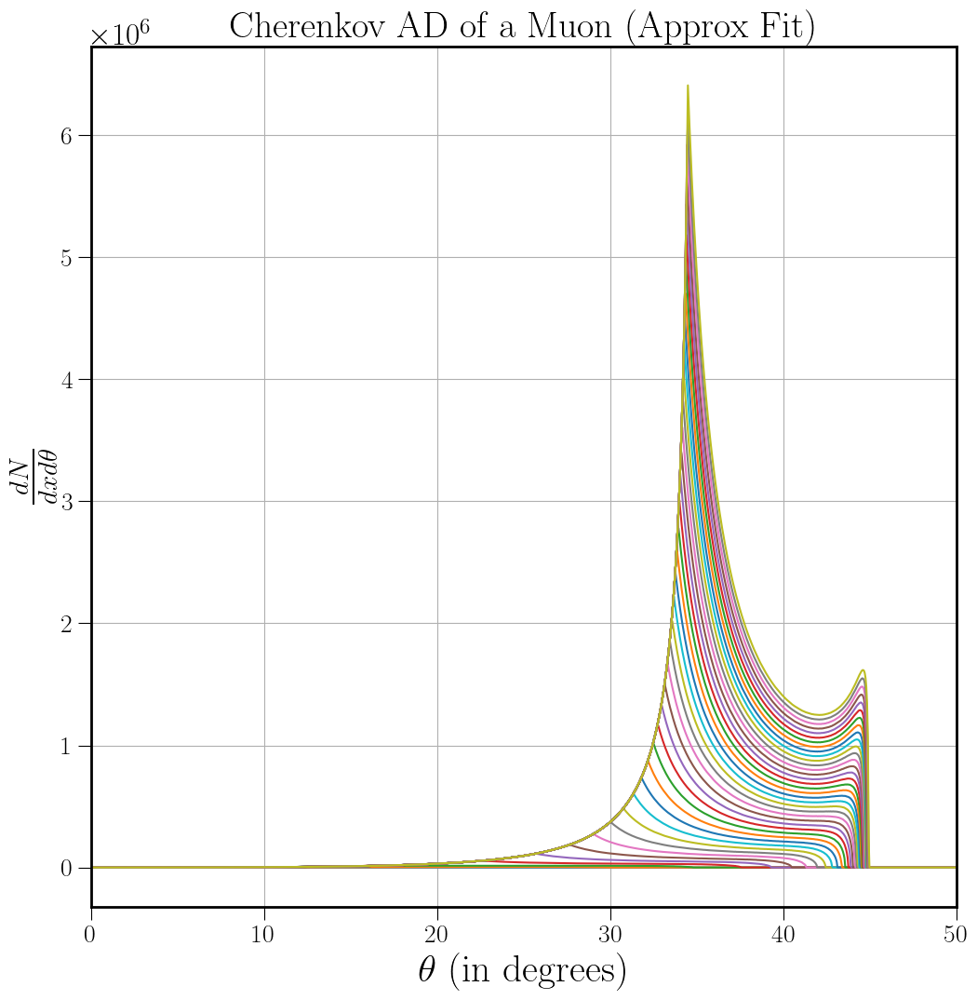

In [119]:
#Approx Fit 
#Import libraries
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

#Our (PVS) Fit: 
    
alpha = 1/137 #Fine-structure (EM coupling) constant 
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652
n_max = 1.4191220261503081

#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #absorptive model peak

# lamd_uv = 106.6 #lambda_UV = 106.6 nm
# lamd_ir = 908.3 #lambda_IR = 908.3 nm 

# lamd = np.linspace(90,700,2000)

n_uvr = a_0j #when lamd -> lamd_UV
n_500 = 1.2278
# n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf


# print("n_uv = {}, n_peak = {}, n_500= {}, n_asymtote = {}".format(n_uvr, n_peakr, n_500, n_asymtoter))

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

# matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
# plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'$\theta$ (in degrees)', size= 30)
ax.set_ylabel(r'$\frac{dN}{dx d\theta}$', size= 30)
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
# ax.set_title('Cherenkov IAD of a Proton (HO Fit)')
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.set_title('Cherenkov AD of a Muon (Approx Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)


#Define a function to find the index of the desired element

def find_nearest_index_numpy(arr, value):
    """
    Finds the index of the element closest to 'value' in a NumPy array.
    """
    arr = np.array(arr)  # Ensure it's a NumPy array
    idx = np.abs(arr - value).argmin()
    return idx

#Explanation:
# np.abs(arr - value) calculates the absolute difference between each element in the array and the value.
# .argmin() returns the index of the minimum value in the resulting array of absolute differences, which corresponds to the element closest to value.


#Linear space in K.E.
tm = np.linspace(50, 1000, 39)
# print(t)

mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²
betamu  = np.sqrt(1 - (1/(1 + tm/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD
print(tm, betamu)

# print (t, betap, np.round(betap,3))

cos_ang_minp = []
con_ang_maxnp = []
thetamaxp = []
thetaminp = []



# Load the .npz file
#HO fit
# pdata500ho = np.load('IAD_new_data_for_PID\\iCherenkovdata_p_500_ho.npz')
#Babicz fit
# pdata500b = np.load('IAD_new_data_for_PID\\iCherenkovdata_p_500_babicz.npz')


# Create an empty dictionary to store the data.
data_dict = {}

totalts = []
normalts = []
anomts = []

totaltps = []
normaltps = []
anomtps = []

# itotalbts = []

tmunormps10 = []
tmuanomps10 = []
nbyamups10 = []
abynmups10 = []

tmunormps05 = []
tmuanomps05 = []
nbyamups05 = []
abynmups05 = []

tmunormps01 = []
tmuanomps01 = []
nbyamups01 = []
abynmups01 = []


# Loop through your values
for val in tm:
    # Use an f-string to generate the key for the dictionary. (HO)
    # key = f"pdata_{val:.0f}_ho"
    # ho = f"pdata_{val:.0f}_ho"
    a = f"mudata_{val:.0f}_approx"
    
    # Use another f-string to generate the filename for loading.
    # filename1 = fr"IAD_new_data_for_PID\Cherenkovdata_p_{val:.0f}_ho.npz"
    filename3 = fr"Cherenkov_data_for_PID\Cherenkovdata_mu{val:.0f}_approx.npz"
    
    # Store the loaded data in the dictionary using the generated key.
    # data_dict[key] = np.load(filename)
    # #HO Fit
    # data_dict[ho] = np.load(filename1) 

    # costheta = data_dict[ho]['costheta']
    # theta = data_dict[ho]['theta']
    # itotal = data_dict[ho]['itotalho']
    # inormal = data_dict[ho]['inormalho']
    # ianom = data_dict[ho]['ianomalousho']
    # thetadeg = theta*(180/np.pi) 
    # itotalt = itotal*np.sin(theta)
    # inormalt = inormal*np.sin(theta)
    # ianomt = ianom*np.sin(theta)
    # # print(costheta)

    #Approx Fit
    data_dict[a] = np.load(filename3, allow_pickle=True) 

    costheta = data_dict[a]['costheta']
    thetap = data_dict[a]['theta']
    totalp = data_dict[a]['totalapprox']
    normalp = data_dict[a]['normalapprox']
    anomp = data_dict[a]['anomalousapprox']
    thetadegp = thetap*(180/np.pi) 
    totaltp = totalp*np.sin(thetap)
    normaltp = normalp*np.sin(thetap)
    anomtp = anomp*np.sin(thetap)
    
    # ax.plot(thetadeg, itotalt, label='Total (HO)')
    # ax.plot(thetadeg, inormalt, label='Normal (HO)')
    # ax.plot(thetadeg, ianomt, label='Anomalous (HO)')

    ax.plot(thetadegp, totaltp, label='Total (Approx)')
    # ax.plot(thetadegp, normaltp, label='Normal (Approx)')
    # ax.plot(thetadegp, anomtp, label='Anomalous (Approx)')

    # ax.plot(theta*(180/np.pi), itotalbt, label='Babicz')
    
    # ax.plot(theta*(180/np.pi), itotalbt, label='Total')

    # itotalts.append(itotalt) #.tolist())  
    # inormalts.append(inormalt)
    # ianomts.append(ianomt)

    totaltps.append(totaltp) #.tolist())  
    normaltps.append(normaltp)
    anomtps.append(anomtp)
    
    # itotalbts.append(itotalbt)

    
    # itotalts.append(itotalt.tolist())  
    # inormalts.append(inormalt)
    # ianomts.append(ianomt)
    
    # itotalbts.append(itotalbt)

    
    i  = np.sqrt(1 - (1/(1 + val/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD
    # print("beta: {}".format(i))


    #Quantile Window: Integration Stepsize 
    
    cos_ang_minp = 1/(i * n_max) #Approx Fit
    thetamaxp = np.arccos(cos_ang_minp)*(180/np.pi)
    
    cos_ang_maxnp = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
    # cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
    thetaminp = np.arccos(cos_ang_maxnp)*(180/np.pi)

    
    #Defining integration window

    theta_windowp10 = (thetamaxp - thetaminp)/10 #10% of databins # dp = (thetamax - thetamin)/(180/(2*2000))
    theta_windowp05 = (thetamaxp - thetaminp)/20 #5% of databins # dp = (thetamax - thetamin)/(180/(2*2000))
    theta_windowp01 = (thetamaxp - thetaminp)/100 #1% of databins # dp = (thetamax - thetamin)/(180/(2*2000))
    
    dpp10 = np.round(2000*2*theta_windowp10/180) #no. of datapoints within theta_window
    dpp05 = np.round(2000*2*theta_windowp05/180) #no. of datapoints within theta_window
    dpp01 = np.round(2000*2*theta_windowp01/180) #no. of datapoints within theta_window
    
    min_windowp10 = thetaminp + theta_windowp10
    max_windowp10 = thetamaxp - theta_windowp10 

    min_windowp05 = thetaminp + theta_windowp05
    max_windowp05 = thetamaxp - theta_windowp05 

    min_windowp01 = thetaminp + theta_windowp01
    max_windowp01 = thetamaxp - theta_windowp01 

    
    # print(i, thetamin, min_window, max_window, thetamax)
    print('K.E.={}, beta={}, dp={}, theta_windowp={}, thetaminp={}, min_windowp={}, max_windowp={}, thetamaxp={}'.format(val, i, dpp10, theta_windowp10, thetaminp, min_windowp10, max_windowp10, thetamaxp)) 
    
    
    # Example usage:
    my_array = thetadegp

    #10% Quantile
    
    #Theta_min
    min_valuep = thetaminp
    min_indexp = find_nearest_index_numpy(my_array, min_valuep)
    print(f"The element closest to {min_valuep} is at index: {min_indexp}")
    print(f"The closest element is: {my_array[min_indexp]}")
    
    #Min_window
    min_window_valuep = thetaminp + theta_windowp10
    min_window_indexp = find_nearest_index_numpy(my_array, min_window_valuep)
    print(f"The element closest to {min_window_valuep} is at index: {min_window_indexp}")
    print(f"The closest element is: {my_array[min_window_indexp]}")
    
    #Max_window
    max_window_valuep = thetamaxp - theta_windowp10
    max_window_indexp = find_nearest_index_numpy(my_array, max_window_valuep)
    print(f"The element closest to {max_window_valuep} is at index: {max_window_indexp}")
    print(f"The closest element is: {my_array[max_window_indexp]}")
    
    #Theta_max
    max_valuep = thetamaxp
    max_indexp = find_nearest_index_numpy(my_array, max_valuep)
    print(f"The element closest to {max_valuep} is at index: {max_indexp}")
    print(f"The closest element is: {my_array[max_indexp]}")
    
    # Sum i-th to j-th elements of an array) 
    
    totalnormp10 = totaltp[min_indexp:min_window_indexp] 
    
    totalanomp10 = totaltp[max_window_indexp:max_indexp]
    
    print('{} MeV Muon: 10% Normal Quantile = {}, 10% Anomalous Quantile = {}'.format(val, totalnormp10, totalanomp10))
    
    # itnorm = sum(itotalnorm)* (thetamin + min_window)/2 
    # itanom = sum(itotalanom)* (max_window + thetamax)/2 
    
    # print('For {} MeV Proton: theta_window/dp = {}'.format(val, theta_window/dp))
    
    tnormp10 = sum(totalnormp10) * (theta_windowp10/dpp10) 
    tanomp10 = sum(totalanomp10) * (theta_windowp10/dpp10) 
    
    nbyamup10 = tnormp10 / tanomp10
    abynmup10 = tanomp10 / tnormp10
    
    print('{} MeV Muon: Sum of 10% Normal Quantile = {}, Sum of 10% Anomalous Quantile = {}, 10% Normal/Anomalous = {}, 10% Anomalous/Normal = {}'.format(val, tnormp10, tanomp10, nbyamup10, 1/nbyamup10))

    # itotalts.append(itotalt.tolist())  

    tmunormps10.append(tnormp10)
    tmuanomps10.append(tanomp10)
    nbyamups10.append(nbyamup10)
    abynmups10.append(abynmup10)

    #5% Quantile

    print('K.E.={}, beta={}, dp={}, theta_windowp={}, thetaminp={}, min_windowp={}, max_windowp={}, thetamaxp={}'.format(val, i, dpp05, theta_windowp05, thetaminp, min_windowp05, max_windowp05, thetamaxp)) 
    
    
    #Theta_min
    min_valuep = thetaminp
    min_indexp = find_nearest_index_numpy(my_array, min_valuep)
    print(f"The element closest to {min_valuep} is at index: {min_indexp}")
    print(f"The closest element is: {my_array[min_indexp]}")
    
    #Min_window
    min_window_valuep = thetaminp + theta_windowp05
    min_window_indexp = find_nearest_index_numpy(my_array, min_window_valuep)
    print(f"The element closest to {min_window_valuep} is at index: {min_window_indexp}")
    print(f"The closest element is: {my_array[min_window_indexp]}")
    
    #Max_window
    max_window_valuep = thetamaxp - theta_windowp05
    max_window_indexp = find_nearest_index_numpy(my_array, max_window_valuep)
    print(f"The element closest to {max_window_valuep} is at index: {max_window_indexp}")
    print(f"The closest element is: {my_array[max_window_indexp]}")
    
    #Theta_max
    max_valuep = thetamaxp
    max_indexp = find_nearest_index_numpy(my_array, max_valuep)
    print(f"The element closest to {max_valuep} is at index: {max_indexp}")
    print(f"The closest element is: {my_array[max_indexp]}")
    
    # Sum i-th to j-th elements of an array) 
    
    totalnormp05 = totaltp[min_indexp:min_window_indexp] 
    
    totalanomp05 = totaltp[max_window_indexp:max_indexp]
    
    print('{} MeV Muon: 5% Normal Quantile = {}, 5% Anomalous Quantile = {}'.format(val, totalnormp05, totalanomp05))
    
    # itnorm = sum(itotalnorm)* (thetamin + min_window)/2 
    # itanom = sum(itotalanom)* (max_window + thetamax)/2 
    
    # print('For {} MeV Proton: theta_window/dp = {}'.format(val, theta_window/dp))
    
    tnormp05 = sum(totalnormp05) * (theta_windowp05/dpp05) 
    tanomp05 = sum(totalanomp05) * (theta_windowp05/dpp05) 
    
    nbyamup05 = tnormp05 / tanomp05
    abynmup05 = tanomp05 / tnormp05
    
    print('{} MeV Muon: Sum of 5% Normal Quantile = {}, Sum of 5% Anomalous Quantile = {}, 5% Normal/Anomalous = {}, 5% Anomalous/Normal = {}'.format(val, tnormp05, tanomp05, nbyamup05, 1/nbyamup05))

    # itotalts.append(itotalt.tolist())  

    tmunormps05.append(tnormp05)
    tmuanomps05.append(tanomp05)
    nbyamups05.append(nbyamup05)
    abynmups05.append(abynmup05)

    #1% Quantile

    print('K.E.={}, beta={}, dp={}, theta_windowp={}, thetaminp={}, min_windowp={}, max_windowp={}, thetamaxp={}'.format(val, i, dpp01, theta_windowp01, thetaminp, min_windowp01, max_windowp01, thetamaxp)) 
    
    
    #Theta_min
    min_valuep = thetaminp
    min_indexp = find_nearest_index_numpy(my_array, min_valuep)
    print(f"The element closest to {min_valuep} is at index: {min_indexp}")
    print(f"The closest element is: {my_array[min_indexp]}")
    
    #Min_window
    min_window_valuep = thetaminp + theta_windowp01
    min_window_indexp = find_nearest_index_numpy(my_array, min_window_valuep)
    print(f"The element closest to {min_window_valuep} is at index: {min_window_indexp}")
    print(f"The closest element is: {my_array[min_window_indexp]}")
    
    #Max_window
    max_window_valuep = thetamaxp - theta_windowp01
    max_window_indexp = find_nearest_index_numpy(my_array, max_window_valuep)
    print(f"The element closest to {max_window_valuep} is at index: {max_window_indexp}")
    print(f"The closest element is: {my_array[max_window_indexp]}")
    
    #Theta_max
    max_valuep = thetamaxp
    max_indexp = find_nearest_index_numpy(my_array, max_valuep)
    print(f"The element closest to {max_valuep} is at index: {max_indexp}")
    print(f"The closest element is: {my_array[max_indexp]}")
    
    # Sum i-th to j-th elements of an array) 
    
    totalnormp01 = totaltp[min_indexp:min_window_indexp] 
    
    totalanomp01 = totaltp[max_window_indexp:max_indexp]
    
    print('{} MeV Muon: 1% Normal Quantile = {}, 1% Anomalous Quantile = {}'.format(val, totalnormp01, totalanomp01))
    
    # itnorm = sum(itotalnorm)* (thetamin + min_window)/2 
    # itanom = sum(itotalanom)* (max_window + thetamax)/2 
    
    # print('For {} MeV Proton: theta_window/dp = {}'.format(val, theta_window/dp))
    
    tnormp01 = sum(totalnormp01) * (theta_windowp01/dpp01) 
    tanomp01 = sum(totalanomp01) * (theta_windowp01/dpp01) 
    
    nbyamup01 = tnormp01 / tanomp01
    abynmup01 = tanomp01 / tnormp01
    
    print('{} MeV Muon: Sum of 1% Normal Quantile = {}, Sum of 1% Anomalous Quantile = {}, 1% Normal/Anomalous = {}, 1% Anomalous/Normal = {}'.format(val, tnormp01, tanomp01, nbyamup01, 1/nbyamup01))

    # itotalts.append(itotalt.tolist())  

    tmunormps01.append(tnormp01)
    tmuanomps01.append(tanomp01)
    nbyamups01.append(nbyamup01)
    abynmups01.append(abynmup01)



# print(np.shape(itpnormps05), np.shape(itpanomps05))
# print(itotalts.flatten())


################################################################################################################################
# ax.legend(fontsize=18)
ax.set_xlim(0,50)
ax.grid()

# plt.savefig('Cherenkov_AD_Muon_allTs_new_data_approxfit', bbox_inches='tight')

# plt.savefig('Cherenkov_AD_Muon_allTs_new_data_approx', bbox_inches='tight')
# plt.savefig('Cherenkov_AD_Muon_500_600_800_1000_MeV_new_data_ho', bbox_inches='tight')
# plt.savefig('Cherenkov_AD_Muon_allTs_new_data_babicz', bbox_inches='tight')

plt.show()

# print(data_dict[ho].files)
# print(data_dict[a].files)
# print(data_dict[b].files)

# print(itotalts.files)

# Close the file
# data.close()

[  50.   50.   50. ... 1000. 1000. 1000.] [0.00000000e+00 4.50225113e-02 9.00450225e-02 ... 8.99099550e+01
 8.99549775e+01 9.00000000e+01] [0.00000000e+00 1.17003031e-05 9.37259472e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
(78000,) (78000,) (78000,)


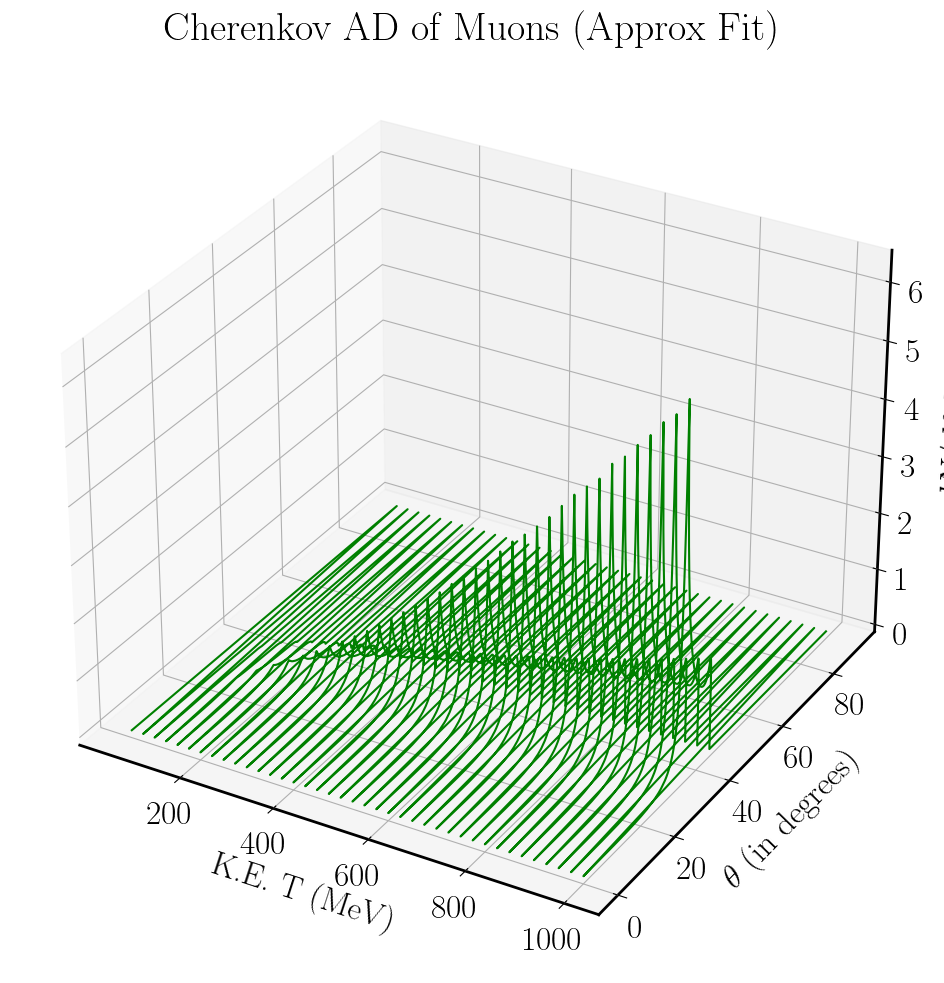

In [361]:
#Import libraries
import matplotlib as mpl
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm # for colormaps
import numpy as np


# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111, projection='3d')

# Set labels and title:
ax.set_xlabel('\n K.E. T (MeV)')
ax.set_ylabel('\n' r'$\theta$ (in degrees)')
ax.set_zlabel('\n' r'$dN/d\theta dx$') #\frac{dN}{d\cos\theta} #'\n'
ax.set_title('Cherenkov AD of Muons (Approx Fit)')
# ax.tick_params(axis='both',which='major',labelsize=20,length=10)
# ax.zaxis.labelpad = -10 # Adjust as needed
# ax.set_zticklabels(ax.get_zticklabels(), rotation=45, ha="right") 

# mpl.rcParams['xtick.major.pad'] = 30 # Adjust padding as needed
# # or for a specific axis:
# ax.tick_params(axis='x', pad=30)

# Assuming 'ax' is your Axes object
# ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right") 
# or for a simpler approach:
# plt.yticks(rotation=45, ha="right") 

t = np.linspace(50, 1000, 39)

X = []

for val in t:  
    x = np.linspace(val, val, 2000) #K.E., T in MeV (or mom or beta): Proton
    X.append(x)


X = np.array(X).flatten()
Y = np.linspace(thetadegp, thetadegp, 39).flatten() #cosine of Cherenkov angle, cos(theta)
Z = np.array([totaltps]).flatten()  #Total AD
# c=X
print(X, Y, Z)
print(np.shape(X), np.shape(Y), np.shape(Z))
# ax.plot_surface(X, Y, Z, cmap='viridis')

# colors = ['r', 'g', 'b', 'c', 'm', 'y', 'k'] # or hex codes like '#FF0000'
# colors = '#FF0000'
    # For 3D bar plots:
    # ax.bar3d(xpos, ypos, zpos, dx, dy, dz, color=colors[i % len(colors)])

# ax.scatter(X, Y, Z, c=c, cmap=cm.viridis) #c=color_data, cmap=cm.viridis #color=colors[i % len(colors)]
ax.plot(X,Y,Z, c='green') #'green' c='#FF00FF' #c=plt.cm.jet(Z/max(Z))


# ax.plot(thetadegp, itotaltp, label='Total (Approx)')

# plt.savefig("3D_Cherenkov_AD_approxfit_PID_muon_allTs_50to1000MeV_theta_newdata.jpg", bbox_inches= 'tight')
# plt.savefig("3D_Cherenkov_PID_proton_T500-700_theta.jpg", bbox_inches= 'tight')
plt.show()



[  50.   75.  100.  125.  150.  175.  200.  225.  250.  275.  300.  325.
  350.  375.  400.  425.  450.  475.  500.  525.  550.  575.  600.  625.
  650.  675.  700.  725.  750.  775.  800.  825.  850.  875.  900.  925.
  950.  975. 1000.] [0.0009528384790739052, 0.002473678448344127, 1.7431723351515092, 2.719525837138152, 3.2212540303339097, 3.38198203598591, 3.5034929167719584, 3.5270931049072556, 3.3965208606663215, 3.4819817263286366, 3.451863231281744, 3.3328377983471627, 3.359571856566235, 3.2997213419566096, 3.240881551794004, 3.2147522152776093, 3.257033236409811, 3.077702737793526, 3.1988949754294893, 2.8991249060549444, 2.962153109813118, 2.8899523160241025, 2.872495080352902, 2.813157549531664, 2.8037492495203784, 2.798609272750218, 2.795997483884887, 2.6719838555243856, 2.7139043385750172, 2.717888631714728, 2.6899713706845607, 2.6949207641559134, 2.624114666862182, 2.734232032982006, 2.6084215158704698, 2.5944604965118203, 2.6576448047602694, 2.5806398403123354, 2.569874130

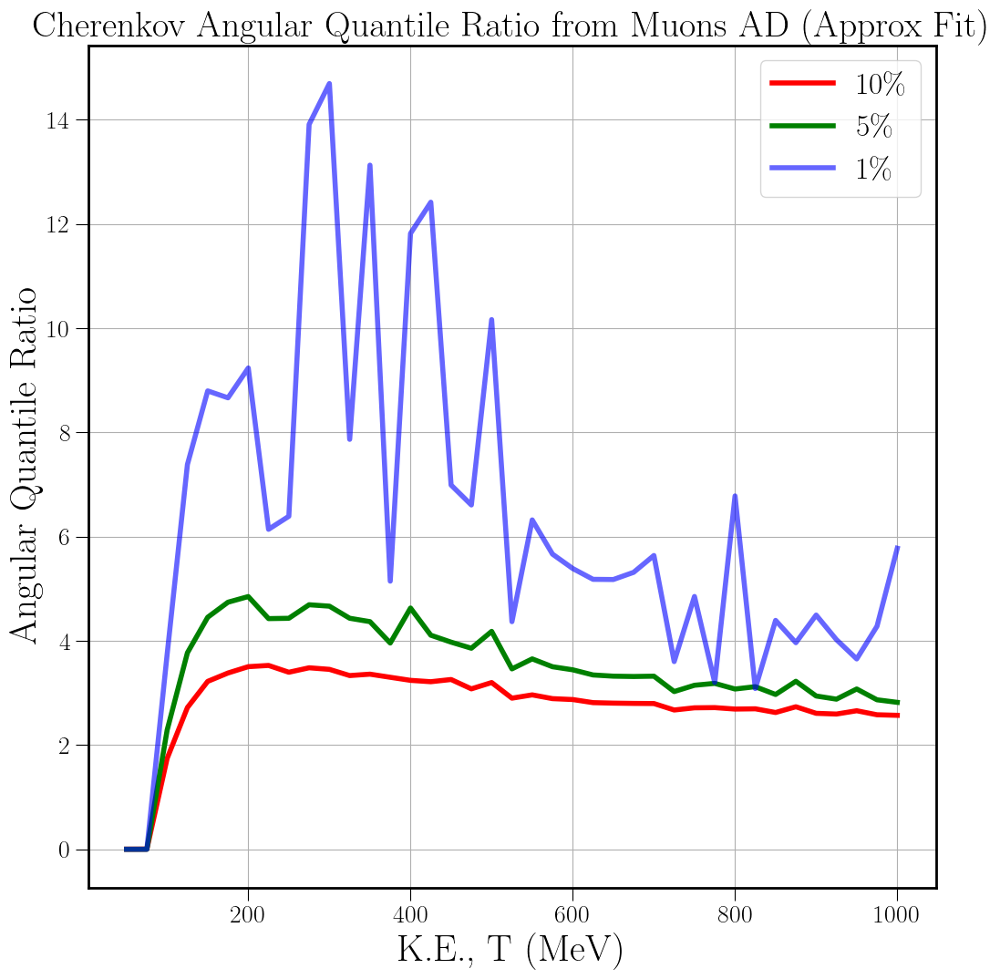

In [363]:
tm = np.linspace(50, 1000, 39)
# print(t)

print(t, nbyamups10, nbyamups05, nbyamups01)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'K.E., T (MeV)', size= 30)
ax.set_ylabel(r'Angular Quantile Ratio', size= 30) #$\frac{N}{A}$
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Cherenkov Angular Quantile Ratio from Muons AD (Approx Fit)')
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)
ax.plot(tm, nbyamups10, linewidth=4, c='r', label='$10 \%$')
ax.plot(tm, nbyamups05, linewidth=4, c='g', label='$5 \%$')
ax.plot(tm, nbyamups01, linewidth=4, c='b', label='$1 \%$', alpha=0.6)
ax.grid()
ax.legend()
# plt.xlim(650,800) #650,800
# plt.ylim(0, 0.6)
plt.savefig('nbyas_10_5_1_perc_approxfit_Cherenkov_AD_Muon_allT_from_saved_data', bbox_inches='tight') #_zoom
plt.show()
# Binning:  
#     1.)  define bins for x axis
#     2.)  average all points in the bin to obtain the central value
#     3.)  calculate the uncertainty in the central value using JackKnife Resampling

# % https://en.wikipedia.org/wiki/Jackknife_resampling



Muon: [  50.   75.  100.  125.  150.  175.  200.  225.  250.  275.  300.  325.
  350.  375.  400.  425.  450.  475.  500.  525.  550.  575.  600.  625.
  650.  675.  700.  725.  750.  775.  800.  825.  850.  875.  900.  925.
  950.  975. 1000.], [0.73433512 0.81113748 0.85793361 0.88891261 0.91060252 0.92642891
 0.93835312 0.94757187 0.95485213 0.96070526 0.96548344 0.96943599
 0.97274358 0.97553983 0.97792534 0.97997704 0.98175461 0.98330494
 0.98466527 0.98586549 0.98692983 0.98787809 0.98872659 0.98948888
 0.99017626 0.99079826 0.99136291 0.99187708 0.99234661 0.99277653
 0.99317117 0.9935343  0.99386919 0.9941787  0.99446532 0.99473127
 0.99497848 0.99520868 0.9954234 ], [0.7343 0.8111 0.8579 0.8889 0.9106 0.9264 0.9384 0.9476 0.9549 0.9607
 0.9655 0.9694 0.9727 0.9755 0.9779 0.98   0.9818 0.9833 0.9847 0.9859
 0.9869 0.9879 0.9887 0.9895 0.9902 0.9908 0.9914 0.9919 0.9923 0.9928
 0.9932 0.9935 0.9939 0.9942 0.9945 0.9947 0.995  0.9952 0.9954]


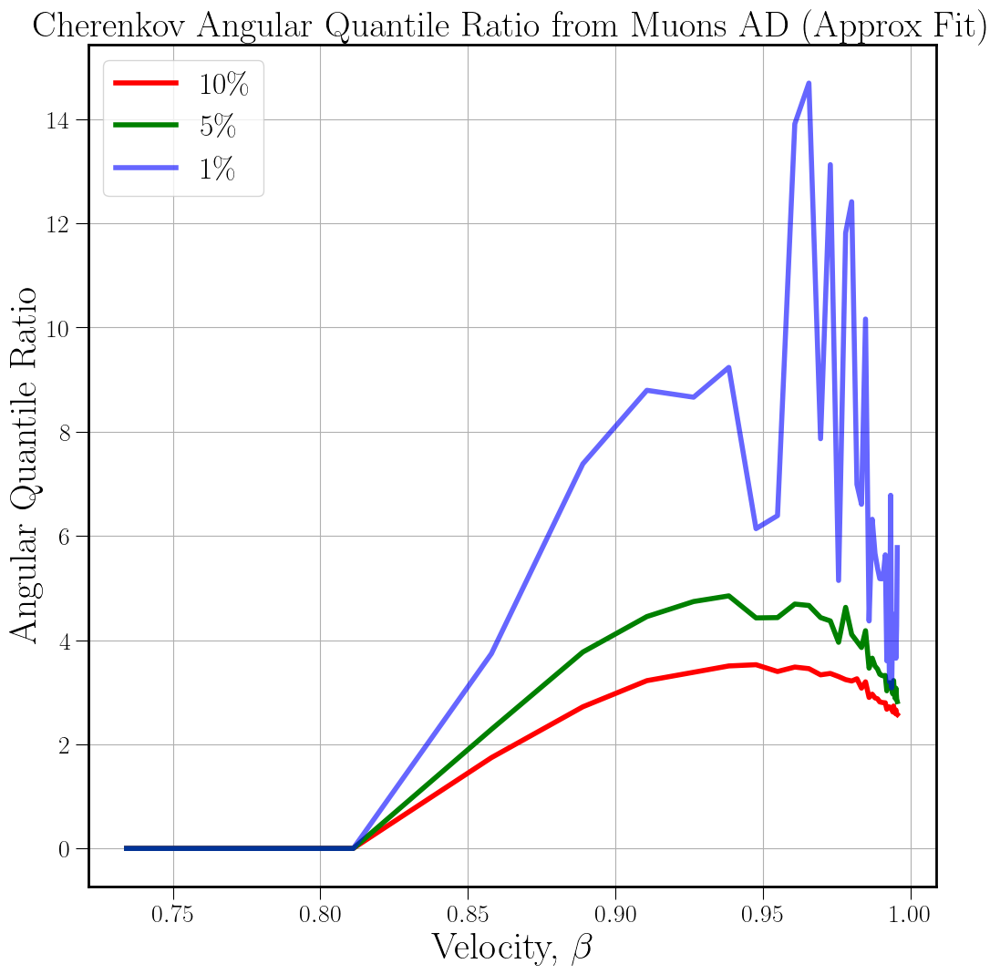

In [364]:
# t = np.linspace(500, 1500, 41)
# print(t)

# # Linear space in K.E.
# tp = np.linspace(500, 1500, 41)

# mp = 938  #Proton's mass in MeV
# betap  = np.sqrt(1 - (1/(1 + tp/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

# print("Proton: {}, {}, {}".format(tp, betap, np.round(betap,4)))

# #Linear space in K.E.
tm = np.linspace(50, 1000, 39)
# # print(t)

# #Mass of the particle travelling
# # mp = 938 #Proton's mass
mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²

betamu  = np.sqrt(1 - (1/(1 + tm/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

print("Muon: {}, {}, {}".format( tm, betamu, np.round(betamu, 4)))


# print(t, nbyapps10, nbyapps05, nbyapps01)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'Velocity, $\beta$', size= 30)
ax.set_ylabel(r'Angular Quantile Ratio', size= 30) #$\frac{N}{A}$
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Cherenkov Angular Quantile Ratio from Muons AD (Approx Fit)')
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)
ax.plot(betamu, nbyamups10, linewidth=4, c='r', label='$10 \%$')
ax.plot(betamu, nbyamups05, linewidth=4, c='g', label='$5 \%$')
ax.plot(betamu, nbyamups01, linewidth=4, c='b', label='$1 \%$', alpha=0.6)
ax.grid()
ax.legend()
# plt.xlim(650,800) #650,800
# plt.ylim(0, 0.6)
plt.savefig('nbyas_10_5_1_perc_approxfit_Cherenkov_AD_Muon_allbetas_from_saved_data', bbox_inches='tight') #_zoom
plt.show()


[array([9.52838479e-04, 2.47367845e-03, 1.74317234e+00, 2.71952584e+00]), array([3.22125403, 3.38198204, 3.50349292, 3.5270931 ]), array([3.39652086, 3.48198173, 3.45186323, 3.3328378 ]), array([3.35957186, 3.29972134, 3.24088155, 3.21475222]), array([3.25703324, 3.07770274, 3.19889498]), array([2.89912491, 2.96215311, 2.88995232, 2.87249508]), array([2.81315755, 2.80374925, 2.79860927, 2.79599748]), array([2.67198386, 2.71390434, 2.71788863, 2.68997137]), array([2.69492076, 2.62411467, 2.73423203, 2.60842152]), array([2.5944605 , 2.6576448 , 2.58063984])] [1.11653117 3.40845552 3.4158009  3.27873174 3.17787698 2.90593135
 2.80287839 2.69843705 2.66542224 2.61091505]
[array([1.47343805e-04, 3.82189029e-04, 2.28643642e+00, 3.77048849e+00]), array([4.45153981, 4.74021718, 4.84869146, 4.4257677 ]), array([4.43167123, 4.69141168, 4.66428383, 4.43240268]), array([4.36747931, 3.95720579, 4.62835837, 4.10722898]), array([3.97417058, 3.85720686, 4.1806281 ]), array([3.4611042 , 3.65273057, 3.5

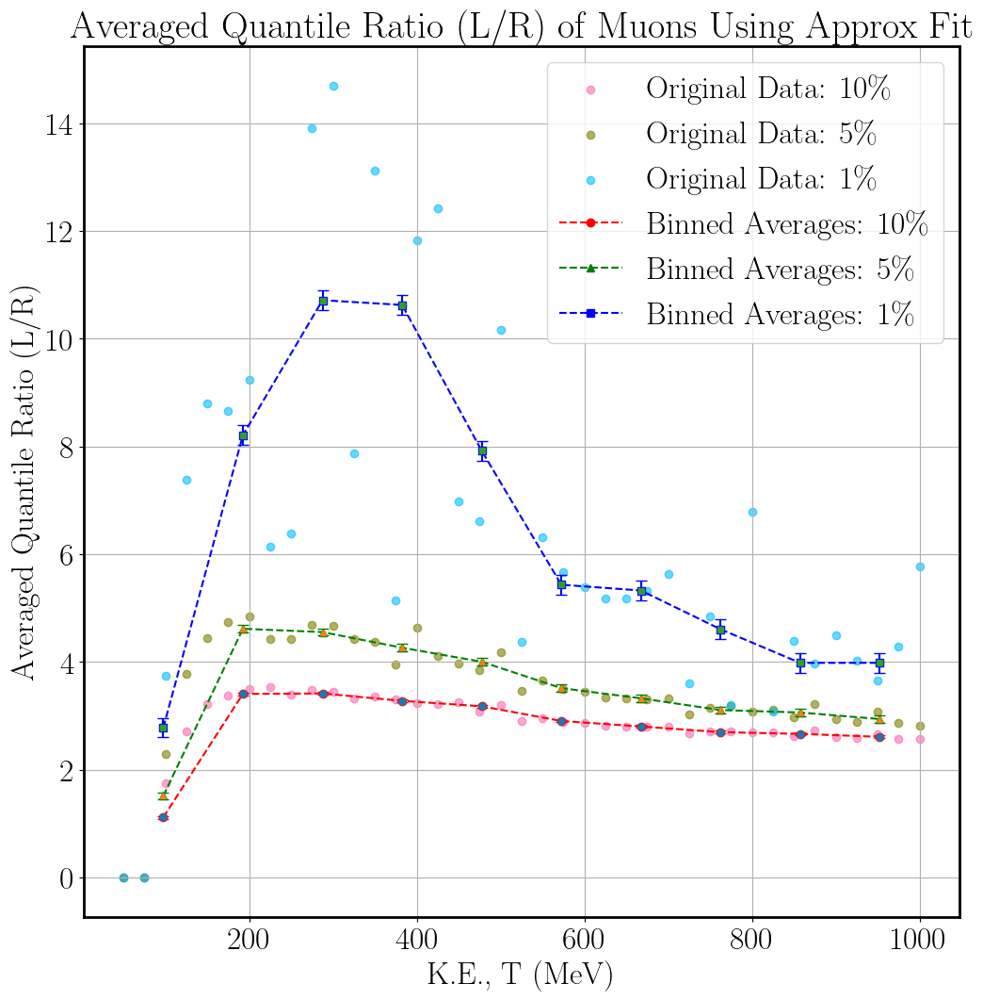

In [365]:
# Averaging elements within bins and then plotting these averages in Python can be achieved using libraries like NumPy and Matplotlib.
import numpy as np
import matplotlib.pyplot as plt
# !pip install resample
import resample

# 1. Generate or load your data
# For demonstration, let's create some sample data
np.random.seed(0) # for reproducibility
# x_data = np.random.rand(100) * 10 # x-values for binning
# y_data = 2 * x_data + np.random.randn(100) * 5 # y-values to be averaged

tm = np.linspace(50, 1000, 39)

x_data = tm # x-values for binning
y_data1 = np.array(nbyamups10) # y-values to be averaged
y_data2 = np.array(nbyamups05)
y_data3 = np.array(nbyamups01)
 
# 2. Define the bins
num_bins = 10
# You can define custom bin edges or let NumPy determine them
bin_edges = np.linspace(min(x_data), max(x_data), num_bins + 1)

# 3. Bin the data and calculate the mean for each bin
# Use np.digitize to assign each x_data point to a bin index
bin_indices = np.digitize(x_data, bin_edges)

# Calculate the mean of y_data for each bin
bin_means1 = []
bin_centers1 = []

bin_means2 = []
bin_centers2 = []

bin_means3 = []
bin_centers3 = []

elements_in_bins_10 = []
elements_in_bins_05 = []
elements_in_bins_01 = []

bin_means_10 = []
bin_means_05 = []
bin_means_01 = []

#10% Q. ratios
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin1 = y_data1[bin_indices == i]
    if len(elements_in_bin1) > 0: # Avoid division by zero for empty bins
        bin_means1.append(np.mean(elements_in_bin1))
        # Calculate bin center for plotting
        bin_centers1.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means1.append(np.nan)
        bin_centers1.append((bin_edges[i-1] + bin_edges[i]) / 2)

    elements_in_bins_10.append(elements_in_bin1)
    # bin_means_10.append(np.array(bin_means1[-1])) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_10, bin_means_10) 

#5% Q. ratios
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin2 = y_data2[bin_indices == i]    
    if len(elements_in_bin2) > 0: # Avoid division by zero for empty bins
        bin_means2.append(np.mean(elements_in_bin2))
        # Calculate bin center for plotting
        bin_centers2.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means2.append(np.nan)
        bin_centers2.append((bin_edges[i-1] + bin_edges[i]) / 2)

    elements_in_bins_05.append(elements_in_bin2)
    # bin_means_05.append(bin_means2[-1]) ##bin_means1[-1]: value of the last element of an array/list      
# print(elements_in_bins_05, bin_means_05)


#1% Q. ratios
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin3 = y_data3[bin_indices == i]
    if len(elements_in_bin3) > 0: # Avoid division by zero for empty bins
        bin_means3.append(np.mean(elements_in_bin3))
        # Calculate bin center for plotting
        bin_centers3.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means3.append(np.nan)
        bin_centers3.append((bin_edges[i-1] + bin_edges[i]) / 2)
    
    elements_in_bins_01.append(elements_in_bin3)
    # bin_means_01.append(bin_means3[-1]) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_01, bin_means_01)    


# Remove NaN values if you don't want to plot empty bins
bin_centers1 = np.array(bin_centers1)[~np.isnan(bin_means1)]
bin_means1 = np.array(bin_means1)[~np.isnan(bin_means1)]

bin_centers2 = np.array(bin_centers2)[~np.isnan(bin_means2)]
bin_means2 = np.array(bin_means2)[~np.isnan(bin_means2)]

bin_centers3 = np.array(bin_centers3)[~np.isnan(bin_means3)]
bin_means3 = np.array(bin_means3)[~np.isnan(bin_means3)]

# print(bin_means1, bin_means2, bin_means3)

print(elements_in_bins_10, bin_means1)
print(elements_in_bins_05, bin_means2)
print(elements_in_bins_01, bin_means3)

#Jackknife resampling with my data 

def jackknife_statistic(data, statistic):
    n = len(data)
    jackknife_samples = np.zeros(n)

    for i in range(n):
        sample = np.delete(data, i)
        jackknife_samples[i] = statistic(sample)

    jackknife_mean = np.mean(jackknife_samples)
    variance = (n - 1) / n * np.sum((jackknife_samples - jackknife_mean)**2)
    bias = (n - 1) * (jackknife_mean - statistic(data))
    
    return jackknife_mean, variance, bias

# Example
# data = np.array([2, 4, 6, 8, 10])
#Real Data
data10 = elements_in_bins_10
data05 = elements_in_bins_05
data01 = elements_in_bins_01
# print("data10 = {}, data05 = {}, data01 = {}".format(data10, data05, data01))
stat = np.mean

# # mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
# mean_jack10, var_jack10, bias_jack10 = jackknife_statistic(data10, stat)
# mean_jack05, var_jack05, bias_jack05 = jackknife_statistic(data05, stat)
# mean_jack01, var_jack01, bias_jack01 = jackknife_statistic(data01, stat)


for i in data10: 
# mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
    mean_jack10, var_jack10, bias_jack10 = jackknife_statistic(i, stat)
    # mean_jack05, var_jack05, bias_jack05 = jackknife_statistic(data05, stat)
    # mean_jack01, var_jack01, bias_jack01 = jackknife_statistic(data01, stat)
    print("Jackknife 10 %: mean={}, var={}, bias={}".format(mean_jack10, var_jack10, bias_jack10))

for j in data05: 
# mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
    # mean_jack10, var_jack10, bias_jack10 = jackknife_statistic(i, stat)
    mean_jack05, var_jack05, bias_jack05 = jackknife_statistic(j, stat)
    # mean_jack01, var_jack01, bias_jack01 = jackknife_statistic(data01, stat)
    print("Jackknife 5 %: mean={}, var={}, bias={}".format(mean_jack05, var_jack05, bias_jack05))


for k in data01: 
# mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
    # mean_jack10, var_jack10, bias_jack10 = jackknife_statistic(i, stat)
    # mean_jack05, var_jack05, bias_jack05 = jackknife_statistic(data05, stat)
    mean_jack01, var_jack01, bias_jack01 = jackknife_statistic(k, stat)
    print("Jackknife 1 %: mean={}, var={}, bias={}".format(mean_jack01, var_jack01, bias_jack01))


    # print("Jackknife Means:", mean_jack10, mean_jack05, mean_jack01)
    # print("Jackknife Variances:", var_jack10, var_jack05, var_jack01)
    # print("Jackknife Biases:", bias_jack10, bias_jack05, bias_jack01)


# 4. Plot the results
plt.figure(figsize=(12, 12))

plt.scatter(x_data, y_data1, alpha=0.6, c='hotpink', label='Original Data: 10\%')
plt.scatter(x_data, y_data2, alpha=0.6, c='olive', label='Original Data: 5\%')
plt.scatter(x_data, y_data3, alpha=0.6, c='deepskyblue', label='Original Data: 1\%')

plt.plot(bin_centers1, bin_means1, color='red', marker='o', linestyle='--', label='Binned Averages: 10\%')
plt.plot(bin_centers2, bin_means2, color='green', marker='^', linestyle='--', label='Binned Averages: 5\%')
plt.plot(bin_centers3, bin_means3, color='blue', marker='s', linestyle='--', label='Binned Averages: 1\%')

# plt.errorbar(x_values, y_estimates, yerr=jackknife_errors, fmt='o', capsize=4, ecolor='red', markersize=5)  #Jackknife errorbar
plt.errorbar(bin_centers1, bin_means1, yerr=np.sqrt(var_jack10), fmt='o', capsize=4, ecolor='red', markersize=5)  #Jackknife errorbar for 10% Q.ratio
plt.errorbar(bin_centers2, bin_means2, yerr=np.sqrt(var_jack05), fmt='^', capsize=4, ecolor='green', markersize=5)  #Jackknife errorbar for 10% Q.ratio
plt.errorbar(bin_centers3, bin_means3, yerr=np.sqrt(var_jack01), fmt='s', capsize=4, ecolor='blue', markersize=5)  #Jackknife errorbar for 10% Q.ratio

plt.xlabel('K.E., T (MeV)') #(Binned Variable)
plt.ylabel('Averaged Quantile Ratio (L/R)') # (Averaged Variable)')
plt.title('Averaged Quantile Ratio (L/R) of Muons Using Approx Fit') #in Bins of K.E. 
plt.legend()
plt.grid(True)

# plt.savefig('binned_avg_nbyas_10_5_1_perc_approxfit_Cherenkov_AD_Muon_allT_from_saved_data_w_jackknife_err', bbox_inches='tight') #_zoom
plt.show()

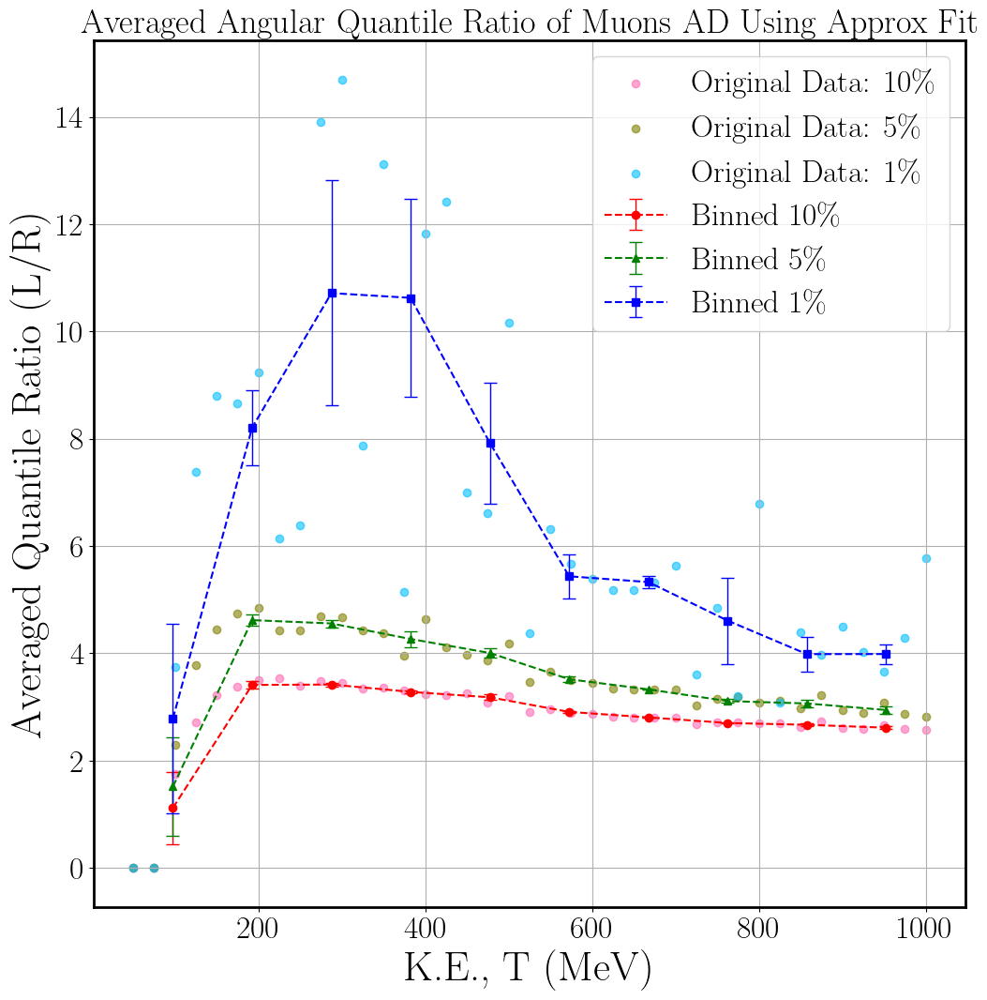

In [121]:
# Averaging elements within bins and then plotting these averages in Python can be achieved using libraries like NumPy and Matplotlib.
import numpy as np
import matplotlib.pyplot as plt
# !pip install resample
import resample

# 1. Generate or load your data
# For demonstration, let's create some sample data
np.random.seed(0) # for reproducibility
# x_data = np.random.rand(100) * 10 # x-values for binning
# y_data = 2 * x_data + np.random.randn(100) * 5 # y-values to be averaged

tm = np.linspace(50, 1000, 39)

x_data = tm # x-values for binning
y_data1 = np.array(nbyamups10) # y-values to be averaged
y_data2 = np.array(nbyamups05)
y_data3 = np.array(nbyamups01)
 
# 2. Define the bins
num_bins = 10
# You can define custom bin edges or let NumPy determine them
bin_edges = np.linspace(min(x_data), max(x_data), num_bins + 1)

# 3. Bin the data and calculate the mean for each bin
# Use np.digitize to assign each x_data point to a bin index
bin_indices = np.digitize(x_data, bin_edges)

# Calculate the mean of y_data for each bin
bin_means1 = []
bin_centers1 = []

bin_means2 = []
bin_centers2 = []

bin_means3 = []
bin_centers3 = []

elements_in_bins_10 = []
elements_in_bins_05 = []
elements_in_bins_01 = []

bin_means_10 = []
bin_means_05 = []
bin_means_01 = []

#10% Q.ratio
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin1 = y_data1[bin_indices == i]
    if len(elements_in_bin1) > 0: # Avoid division by zero for empty bins
        bin_means1.append(np.mean(elements_in_bin1))
        # Calculate bin center for plotting
        bin_centers1.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means1.append(np.nan)
        bin_centers1.append((bin_edges[i-1] + bin_edges[i]) / 2)
    elements_in_bins_10.append(elements_in_bin1)
    # bin_means_10.append(np.array(bin_means1[-1])) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_10, bin_means_10) 


#5% Q.ratio    
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin2 = y_data2[bin_indices == i]
    if len(elements_in_bin2) > 0: # Avoid division by zero for empty bins
        bin_means2.append(np.mean(elements_in_bin2))
        # Calculate bin center for plotting
        bin_centers2.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means2.append(np.nan)
        bin_centers2.append((bin_edges[i-1] + bin_edges[i]) / 2)
    elements_in_bins_05.append(elements_in_bin2)
    # bin_means_05.append(bin_means2[-1]) ##bin_means1[-1]: value of the last element of an array/list      
# print(elements_in_bins_05, bin_means_05)


#1% Q.ratio
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin3 = y_data3[bin_indices == i]
    if len(elements_in_bin3) > 0: # Avoid division by zero for empty bins
        bin_means3.append(np.mean(elements_in_bin3))
        # Calculate bin center for plotting
        bin_centers3.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means3.append(np.nan)
        bin_centers3.append((bin_edges[i-1] + bin_edges[i]) / 2)

    elements_in_bins_01.append(elements_in_bin3)
    # bin_means_01.append(bin_means3[-1]) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_01, bin_means_01)    


# Remove NaN values if you don't want to plot empty bins
bin_centers1 = np.array(bin_centers1)[~np.isnan(bin_means1)]
bin_means1 = np.array(bin_means1)[~np.isnan(bin_means1)]

bin_centers2 = np.array(bin_centers2)[~np.isnan(bin_means2)]
bin_means2 = np.array(bin_means2)[~np.isnan(bin_means2)]

bin_centers3 = np.array(bin_centers3)[~np.isnan(bin_means3)]
bin_means3 = np.array(bin_means3)[~np.isnan(bin_means3)]


# print(bin_means1, bin_means2, bin_means3)

# print(elements_in_bins_10, bin_means1)
# print(elements_in_bins_05, bin_means2)
# print(elements_in_bins_01, bin_means3)

#Jackknife resampling with my data 

def jackknife_statistic(data, statistic):
    n = len(data)
    jackknife_samples = np.zeros(n)

    for i in range(n):
        sample = np.delete(data, i)
        jackknife_samples[i] = statistic(sample)

    jackknife_mean = np.mean(jackknife_samples)
    variance = (n - 1) / n * np.sum((jackknife_samples - jackknife_mean)**2)
    bias = (n - 1) * (jackknife_mean - statistic(data))
    
    return jackknife_mean, variance, bias

# Example
# data = np.array([2, 4, 6, 8, 10])
#Real Data
data10 = elements_in_bins_10
data05 = elements_in_bins_05
data01 = elements_in_bins_01
# print("data10 = {}, data05 = {}, data01 = {}".format(data10, data05, data01))
stat = np.mean


# Initialize empty lists to store results for each bin
means_10, errs_10 = [], []
means_05, errs_05 = [], []
means_01, errs_01 = [], []

# Loop for 10% data
for bin_data in elements_in_bins_10:
    if len(bin_data) > 1: # Jackknife requires at least 2 points
        m, v, b = jackknife_statistic(bin_data, np.mean)
        means_10.append(m)
        errs_10.append(np.sqrt(v)) # Error bar is square root of variance
    else:
        means_10.append(np.nan)
        errs_10.append(np.nan)

# Loop for 5% data
for bin_data in elements_in_bins_05:
    if len(bin_data) > 1:
        m, v, b = jackknife_statistic(bin_data, np.mean)
        means_05.append(m)
        errs_05.append(np.sqrt(v))
    else:
        means_05.append(np.nan)
        errs_05.append(np.nan)

# Loop for 1% data
for bin_data in elements_in_bins_01:
    if len(bin_data) > 1:
        m, v, b = jackknife_statistic(bin_data, np.mean)
        means_01.append(m)
        errs_01.append(np.sqrt(v))
    else:
        means_01.append(np.nan)
        errs_01.append(np.nan)


#Plotting 

plt.figure(figsize=(12, 12))

plt.scatter(x_data, y_data1, alpha=0.6, c='hotpink', label='Original Data: 10\%')
plt.scatter(x_data, y_data2, alpha=0.6, c='olive', label='Original Data: 5\%')
plt.scatter(x_data, y_data3, alpha=0.6, c='deepskyblue', label='Original Data: 1\%')


# Define labels and colors for cleaner code
datasets = [
    (bin_centers1, means_10, errs_10, 'red', 'o', '10\%'),
    (bin_centers2, means_05, errs_05, 'green', '^', '5\%'),
    (bin_centers3, means_01, errs_01, 'blue', 's', '1\%')
]

for x, y, yerr, color, marker, label in datasets:
    # Convert to numpy arrays to handle indexing/NaNs
    x, y, yerr = np.array(x), np.array(y), np.array(yerr)
    mask = ~np.isnan(y)
    
    plt.errorbar(x[mask], y[mask], yerr=yerr[mask], 
                 fmt=marker, color=color, linestyle='--', 
                 capsize=5, elinewidth=1, label=f'Binned {label}') #f'Binned {label}'

plt.xlabel('K.E., T (MeV)', size=32) #(Binned Variable)
plt.ylabel('Averaged Quantile Ratio (L/R)', size=32) # (Averaged Variable)')
plt.title('Averaged Angular Quantile Ratio of Muons AD Using Approx Fit', size=26) #in Bins of K.E. 
plt.legend()
plt.grid(True)

# plt.savefig('binned_avg_nbyas_10_5_1_perc_approxfit_Cherenkov_AD_Muon_allT_from_saved_data_w_jackknife_err_corrected_v2', bbox_inches='tight') #_zoom
plt.show()


[0.75796532 0.76741698 0.77628968 0.78463315 0.79249149 0.79990401
 0.80690583 0.81352846 0.81980026 0.82574686 0.83139144 0.83675507
 0.8418569  0.84671442 0.8513436  0.85575908 0.85997431 0.86400164
 0.86785245 0.87153724 0.87506571 0.87844687 0.88168902 0.88479989
 0.88778668 0.89065607 0.89341428 0.89606712 0.89862002 0.90107804
 0.90344595 0.90572818 0.9079289  0.91005203 0.91210124 0.91407999
 0.91599153 0.91783893 0.91962507 0.92135268 0.92302433]
[4, 4, 4, 4, 4, 4, 4, 4, 4, 4]
[0.73433512 0.81113748 0.85793361 0.88891261 0.91060252 0.92642891
 0.93835312 0.94757187 0.95485213 0.96070526 0.96548344 0.96943599
 0.97274358 0.97553983 0.97792534 0.97997704 0.98175461 0.98330494
 0.98466527 0.98586549 0.98692983 0.98787809 0.98872659 0.98948888
 0.99017626 0.99079826 0.99136291 0.99187708 0.99234661 0.99277653
 0.99317117 0.9935343  0.99386919 0.9941787  0.99446532 0.99473127
 0.99497848 0.99520868 0.9954234 ]
[4, 4, 4, 4, 4, 4, 4, 4, 4, 4]


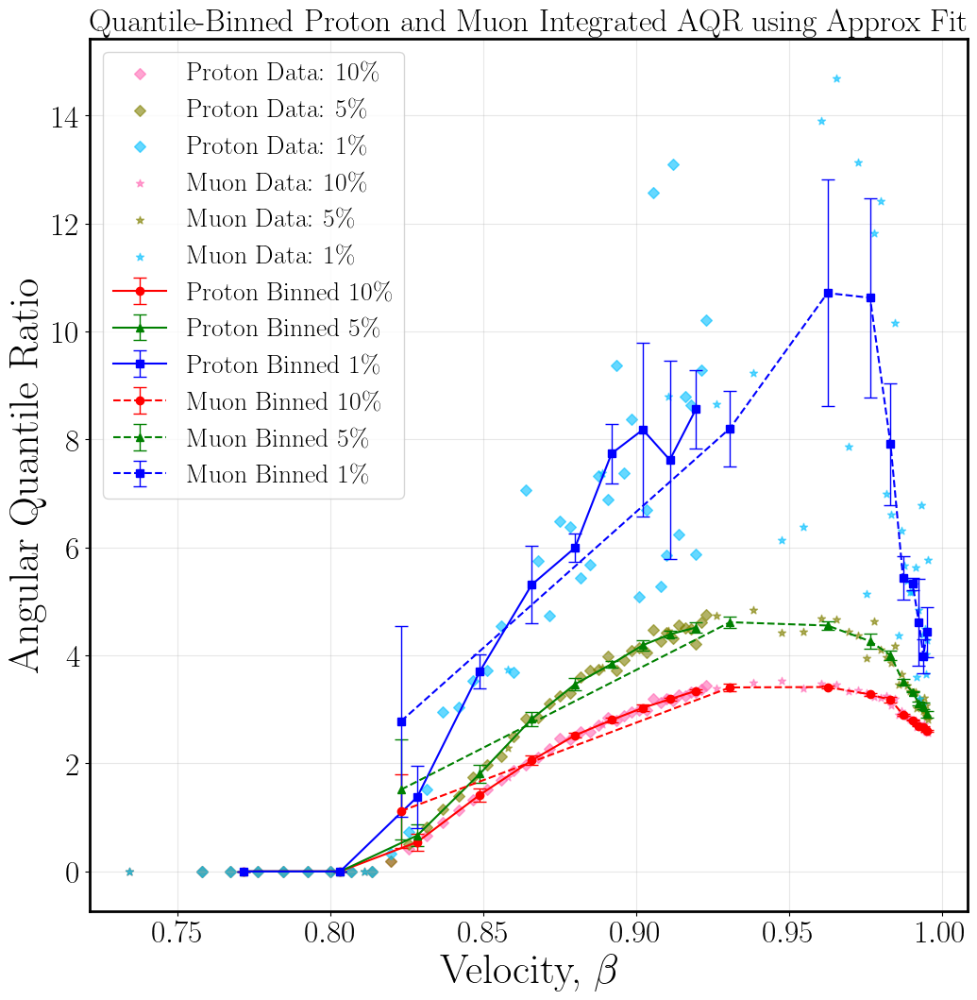

In [373]:
# 0. Definition 

# #Linear space in K.E.
# tp = np.linspace(500, 1500, 41)
# tm = np.linspace(100, 1000, 37)
# # print(t)

#Mass of the particle travelling
mp = 938 #Proton's mass
mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²

betap  = np.sqrt(1 - (1/(1 + tp/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD
betamu  = np.sqrt(1 - (1/(1 + tm/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

# print (tp, betap, np.round(betap, 4))
# print (tm, betamu, np.round(betamu, 4))


# 1. Define x_data (Velocity) & y_data (AQR)
x_data1 = betap 
print(x_data1)

y_data1p = np.array(nbyapps10) # y-values to be averaged
y_data2p = np.array(nbyapps05)
y_data3p = np.array(nbyapps01)


# 2. CREATE QUANTILE BINS
num_bins = 10
# This creates edges so that ~10% of the data points fall into each bin
bin_edges = np.quantile(x_data1, np.linspace(0, 1, num_bins + 1))

# 3. DIGITIZE & CALCULATE CENTERS
bin_indices = np.digitize(x_data1, bin_edges)
# Handle the edge case where a point equals the max value
bin_indices[bin_indices > num_bins] = num_bins

# We calculate the average x-position (beta) within each bin for more accuracy
bin_centersp = []
for i in range(1, num_bins + 1):
    points_in_bin = x_data1[bin_indices == i]
    if len(points_in_bin) > 0:
        bin_centersp.append(np.mean(points_in_bin))
    else:
        # Fallback to geometric center if bin is somehow empty
        bin_centersp.append((bin_edges[i-1] + bin_edges[i]) / 2)

bin_centersp = np.array(bin_centersp)

# 4. PLOTTING LOOP (Now with equal data counts per bin)
plt.figure(figsize=(12, 12))

plt.scatter(x_data1, y_data1p, alpha=0.6, c='hotpink', label='Proton Data: 10\%', marker='D')
plt.scatter(x_data1, y_data2p, alpha=0.6, c='olive', label='Proton Data: 5\%', marker='D')
plt.scatter(x_data1, y_data3p, alpha=0.6, c='deepskyblue', label='Proton Data: 1\%', marker='D')

print([len(b) for b in elements_in_bins_10h])


datasets = [
    (y_data1p, 'red', 'o', '10\%'),
    (y_data2p, 'green', '^', '5\%'),
    (y_data3p, 'blue', 's', '1\%')
]

for y_vals, color, marker, label in datasets:
    meansp, errsp = [], []
    
    for i in range(1, num_bins + 1):
        bin_data = y_vals[bin_indices == i]
        
        if len(bin_data) > 1:
            m, v, b = jackknife_statistic(bin_data, np.mean)
            meansp.append(m)
            errsp.append(np.sqrt(v))
        else:
            meansp.append(np.nan)
            errsp.append(np.nan)
            
    # Convert to arrays for masking
    meansp, errsp = np.array(meansp), np.array(errsp)
    mask = ~np.isnan(meansp)
    
    plt.errorbar(bin_centersp[mask], meansp[mask], yerr=errsp[mask], 
                 fmt=marker, color=color, linestyle='solid', 
                 capsize=5, elinewidth=1, label=f'Proton Binned {label}')



# 1. Define x_data (Velocity) & y_data (AQR)
x_data2 = betamu 
print(x_data2)

y_data1mu = np.array(nbyamups10) # y-values to be averaged
y_data2mu = np.array(nbyamups05)
y_data3mu = np.array(nbyamups01)


# 2. CREATE QUANTILE BINS
num_bins = 10
# This creates edges so that ~10% of the data points fall into each bin
bin_edges = np.quantile(x_data2, np.linspace(0, 1, num_bins + 1))

# 3. DIGITIZE & CALCULATE CENTERS
bin_indices = np.digitize(x_data2, bin_edges)
# Handle the edge case where a point equals the max value
bin_indices[bin_indices > num_bins] = num_bins


# We calculate the average x-position (beta) within each bin for more accuracy
bin_centersmu = []
for i in range(1, num_bins + 1):
    points_in_bin = x_data2[bin_indices == i]
    if len(points_in_bin) > 0:
        bin_centersmu.append(np.mean(points_in_bin))
    else:
        # Fallback to geometric center if bin is somehow empty
        bin_centersmu.append((bin_edges[i-1] + bin_edges[i]) / 2)

bin_centersmu = np.array(bin_centersmu)

# # 4. PLOTTING LOOP (Now with equal data counts per bin)
# plt.figure(figsize=(12, 12))


plt.scatter(x_data2, y_data1mu, alpha=0.6, c='hotpink', label='Muon Data: 10\%', marker='*')
plt.scatter(x_data2, y_data2mu, alpha=0.6, c='olive', label='Muon Data: 5\%', marker='*')
plt.scatter(x_data2, y_data3mu, alpha=0.6, c='deepskyblue', label='Muon Data: 1\%', marker='*')

print([len(b) for b in elements_in_bins_10h])


datasets = [
    (y_data1mu, 'red', 'o', '10\%'),
    (y_data2mu, 'green', '^', '5\%'),
    (y_data3mu, 'blue', 's', '1\%')
]

for y_vals, color, marker, label in datasets:
    meansmu, errsmu = [], []
    
    for i in range(1, num_bins + 1):
        bin_data = y_vals[bin_indices == i]
        
        if len(bin_data) > 1:
            m, v, b = jackknife_statistic(bin_data, np.mean)
            meansmu.append(m)
            errsmu.append(np.sqrt(v))
        else:
            meansmu.append(np.nan)
            errsmu.append(np.nan)
            
    # Convert to arrays for masking
    meansmu, errsmu = np.array(meansmu), np.array(errsmu)
    mask = ~np.isnan(meansmu)
    
    plt.errorbar(bin_centersmu[mask], meansmu[mask], yerr=errsmu[mask], 
                 fmt=marker, color=color, linestyle='--', 
                 capsize=5, elinewidth=1, label=f'Muon Binned {label}')

plt.xlabel(r'Velocity, $\beta$', size=32)
plt.ylabel('Angular Quantile Ratio', size=32)
plt.title('Quantile-Binned Proton and Muon Integrated AQR using Approx Fit', size=24) #with Jackknife Errors 
plt.legend(fontsize=20)
plt.grid(True, alpha=0.3)

# plt.savefig('quantile_binned_Proton_Muon_Cherenkov_AD_AQR_10_5_1_perc_approxfit_allbetas_w_jackknife_err_corrected2', bbox_inches='tight') #_zoom
plt.show()


# Quantile Ratio (L/R ~ N/A) from Muon's AD (HO fit) 

In [107]:
#HO Fit
# Linear space in K.E.
tp = np.linspace(500, 1500, 41)
tm = np.linspace(75, 1000, 38)
# tm = np.linspace(100,1000,19)
print(tp, tm)

# #Mass of the particle travelling
# mp = 938 #Proton's mass
# mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²

# betap  = np.sqrt(1 - (1/(1 + tm/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD
# print("Proton: {}, {}, {}".format(tp, betap, np.round(betap,4)))


# betamu  = np.sqrt(1 - (1/(1 + tm/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

# print("Muon: {}, {}, {}".format(tm, betamu, np.round(betamu,4)))

# # # #Linear space in K.E.
# # tm = np.linspace(100, 1000, 37)
# # # # print(t)

# # # #Mass of the particle travelling
# # # # mp = 938 #Proton's mass
# # mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²

# # betamu  = np.sqrt(1 - (1/(1 + tm/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

# # print("Muon: {}, {}, {}".format( tm, betamu, np.round(betamu, 4)))

# n_peakr = 1.3605
# n_500 = 1.2278

# cos_ang_min = []
# con_ang_maxn = []
# thetamax = []
# thetamin = []

# for i in betamu: 
        
#     #Quantile Window: Integration Stepsize 
    
#     cos_ang_min = 1/(i * n_peakr)
#     thetamax = np.arccos(cos_ang_min)*(180/np.pi)
    
#     cos_ang_maxn =  min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
#     # cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
#     thetamin = np.arccos(cos_ang_maxn)*(180/np.pi)
    
    
#     dp = (thetamax - thetamin)/(180/(2*2000)) #No of data points
    
    
#     theta_window = (thetamax - thetamin)/10 #10% of databins 
    
#     min_window = thetamin + theta_window
    
#     max_window = thetamax - theta_window 

#     print(i, thetamin, min_window, max_window, thetamax) 

[ 500.  525.  550.  575.  600.  625.  650.  675.  700.  725.  750.  775.
  800.  825.  850.  875.  900.  925.  950.  975. 1000. 1025. 1050. 1075.
 1100. 1125. 1150. 1175. 1200. 1225. 1250. 1275. 1300. 1325. 1350. 1375.
 1400. 1425. 1450. 1475. 1500.] [  75.  100.  125.  150.  175.  200.  225.  250.  275.  300.  325.  350.
  375.  400.  425.  450.  475.  500.  525.  550.  575.  600.  625.  650.
  675.  700.  725.  750.  775.  800.  825.  850.  875.  900.  925.  950.
  975. 1000.]


In [452]:
# approx = np.load('Cherenkov_data_for_PID\\Cherenkovdata_p_1500_approx.npz', allow_pickle=True)
# ho = np.load('Cherenkov_new_data_for_PID\\Cherenkovdata_mu1000_ho.npz', allow_pickle=True)
# # Cherenkovdata_p1000_ho.npz

# print(ho.files)

# print(ho['theta']) #theta saved in radian unit
# print(np.nonzero(ho['totalho']))
# print(ho['totalho'][607:893])
# # print(ho['normalho'])
# # print(ho['anomalousho'])

# # List the names of the arrays in the file
# # print(pdata500ho.files)
# # print(pdata500b.files)



[  75.  100.  125.  150.  175.  200.  225.  250.  275.  300.  325.  350.
  375.  400.  425.  450.  475.  500.  525.  550.  575.  600.  625.  650.
  675.  700.  725.  750.  775.  800.  825.  850.  875.  900.  925.  950.
  975. 1000.] [0.81113748 0.85793361 0.88891261 0.91060252 0.92642891 0.93835312
 0.94757187 0.95485213 0.96070526 0.96548344 0.96943599 0.97274358
 0.97553983 0.97792534 0.97997704 0.98175461 0.98330494 0.98466527
 0.98586549 0.98692983 0.98787809 0.98872659 0.98948888 0.99017626
 0.99079826 0.99136291 0.99187708 0.99234661 0.99277653 0.99317117
 0.9935343  0.99386919 0.9941787  0.99446532 0.99473127 0.99497848
 0.99520868 0.9954234 ] [0.8111 0.8579 0.8889 0.9106 0.9264 0.9384 0.9476 0.9549 0.9607 0.9655
 0.9694 0.9727 0.9755 0.9779 0.98   0.9818 0.9833 0.9847 0.9859 0.9869
 0.9879 0.9887 0.9895 0.9902 0.9908 0.9914 0.9919 0.9923 0.9928 0.9932
 0.9935 0.9939 0.9942 0.9945 0.9947 0.995  0.9952 0.9954]
K.E.=75.0, beta=0.811137478699423, dp=56.0, theta_windowh=2.5019435474

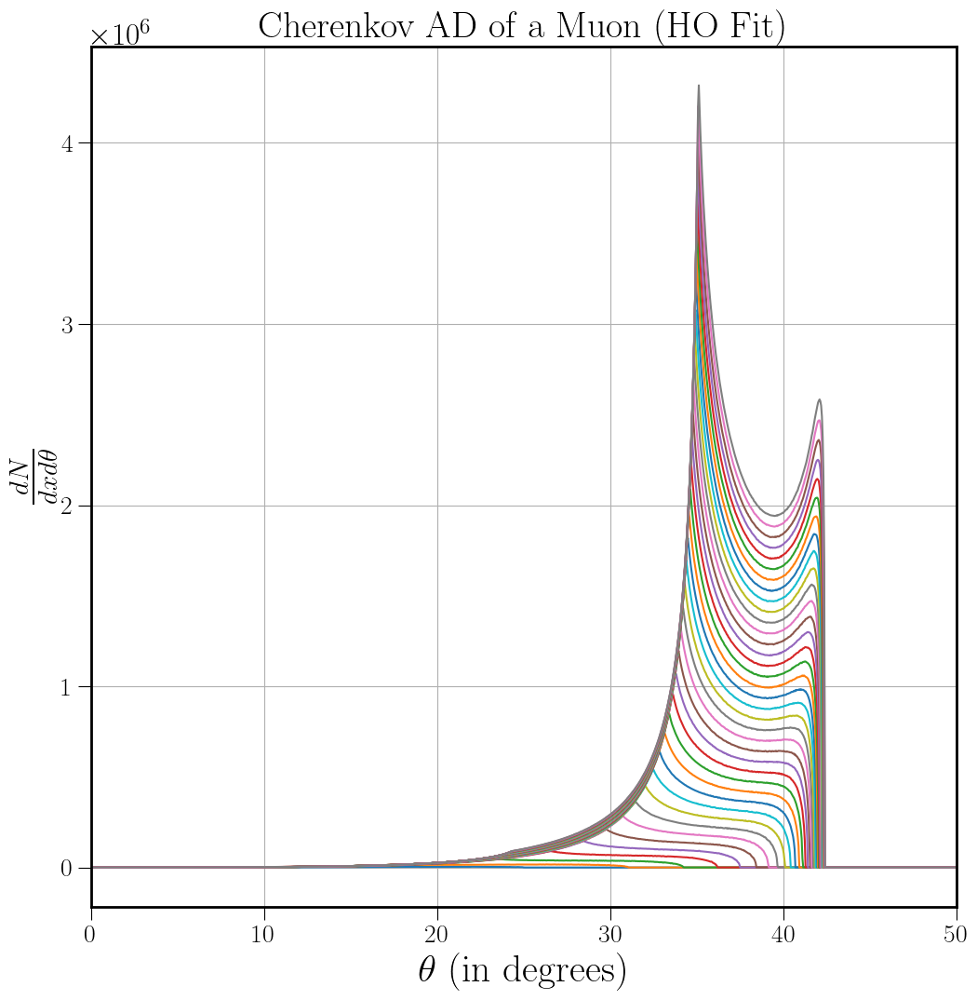

In [109]:
#Import libraries
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np


#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

# matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
# plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'$\theta$ (in degrees)', size= 30)
ax.set_ylabel(r'$\frac{dN}{dx d\theta}$', size= 30)
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Cherenkov AD of a Muon (HO Fit)')
# ax.set_title('Cherenkov AD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)


# #Defining integration window

# theta_window = (thetamax - thetamin)/10 #10% of databins # dp = (thetamax - thetamin)/(180/(2*2000)) 

# dp = np.round(2000*2*theta_window/180) #no. of datapoints within theta_window

# min_window = thetamin + theta_window

# max_window = thetamax - theta_window 



#Define a function to find the index of the desired element

def find_nearest_index_numpy(arr, value):
    """
    Finds the index of the element closest to 'value' in a NumPy array.
    """
    arr = np.array(arr)  # Ensure it's a NumPy array
    idx = np.abs(arr - value).argmin()
    return idx

#Explanation:
# np.abs(arr - value) calculates the absolute difference between each element in the array and the value.
# .argmin() returns the index of the minimum value in the resulting array of absolute differences, which corresponds to the element closest to value.

#Linear space in K.E.
tm = np.linspace(75, 1000, 38)
# tm = np.linspace(100, 1000, 19)
# t = np.linspace(500, 1500, 21)
# print(tm)

# tm = np.array([750])

# mp = 938  #Pro50ton's mass in MeV
# betap  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²
betamu  = np.sqrt(1 - (1/(1 + tm/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

print (tm, betamu, np.round(betamu,4))


n_peakr = 1.3605
n_500 = 1.2278

cos_ang_minh = []
con_ang_maxh = []
thetamaxh = []
thetaminh = []


# Load the .npz file
#HO fit
# pdata500ho = np.load('IAD_new_data_for_PID\\iCherenkovdata_p_500_ho.npz')

# Create an empty dictionary to store the data.
data_dict = {}

# itotalts = []
# inormalts = []
# ianomts = []

totalths = []
normalths = []
anomths = []

# itotalbts = []

tpnormhs10 = []
tpanomhs10 = []
nbyamuhs10 = []
abynmuhs10 = []

tpnormhs05 = []
tpanomhs05 = []
nbyamuhs05 = []
abynmuhs05 = []

tpnormhs01 = []
tpanomhs01 = []
nbyamuhs01 = []
abynmuhs01 = []

# Loop through your values
for val in tm:
    # Use an f-string to generate the key for the dictionary. (HO)
    # key = f"pdata_{val:.0f}_ho"
    ho = f"mudata_{val:.0f}_ho"
    
    # Use another f-string to generate the filename for loading.
    filename1 = fr"Cherenkov_new_data_for_PID\Cherenkovdata_mu{val:.0f}_ho.npz"
    
    # Store the loaded data in the dictionary using the generated key.
    # data_dict[key] = np.load(filename)
    data_dict[ho] = np.load(filename1) 
    # data_dict[ap] = np.load(filename3, allow_pickle=True) 

    costhetah = data_dict[ho]['costheta']
    thetah = data_dict[ho]['theta']
    totalh = data_dict[ho]['totalho']
    normalh = data_dict[ho]['normalho']
    anomh = data_dict[ho]['anomalousho']
    thetadegh = thetah*(180/np.pi) 
    totalth = totalh*np.sin(thetah)
    normalth = normalh*np.sin(thetah)
    anomth = anomh*np.sin(thetah)
    # print(costheta)
    
    ax.plot(thetadegh, totalth, label='Total')
    # ax.plot(thetadeg, inormalt, label='Normal')
    # ax.plot(thetadeg, ianomt, label='Anomalous')

    
    # itotalts.append(itotalt.tolist())  
    # inormalts.append(inormalt)
    # ianomts.append(ianomt)
    
    totalths.append(totalth)

    i  = np.sqrt(1 - (1/(1 + val/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD


    #Quantile Window: Integration Stepsize 
    
    cos_ang_minh = 1/(i * n_peakr)
    thetamaxh = np.arccos(cos_ang_minh)*(180/np.pi)
    
    cos_ang_maxh = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
    # cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
    thetaminh = np.arccos(cos_ang_maxh)*(180/np.pi)

    #Defining integration window

    theta_windowh10 = (thetamaxh - thetaminh)/10 #10% of databins # dp = (thetamax - thetamin)/(180/(2*2000))
    theta_windowh05 = (thetamaxh - thetaminh)/20 #5% of databins # dp = (thetamax - thetamin)/(180/(2*2000))
    theta_windowh01 = (thetamaxh - thetaminh)/100 #1% of databins # dp = (thetamax - thetamin)/(180/(2*2000))
    
    dph10 = np.round(2000*2*theta_windowh10/180) #no. of datapoints within theta_window
    dph05 = np.round(2000*2*theta_windowh05/180) #no. of datapoints within theta_window
    dph01 = np.round(2000*2*theta_windowh01/180) #no. of datapoints within theta_window
    
    min_windowh10 = thetaminh + theta_windowh10
    max_windowh10 = thetamaxh - theta_windowh10 

    min_windowh05 = thetaminh + theta_windowh05
    max_windowh05 = thetamaxh - theta_windowh05 

    min_windowh01 = thetaminh + theta_windowh01
    max_windowh01 = thetamaxh - theta_windowh01 

    
    # print(i, thetamin, min_window, max_window, thetamax)
    print('K.E.={}, beta={}, dp={}, theta_windowh={}, thetaminh={}, min_windowh={}, max_windowh={}, thetamaxh={}'.format(val, i, dph10, theta_windowh10, thetaminh, min_windowh10, max_windowh10, thetamaxh)) 
    
    
    # Example usage:
    my_array = thetadegh

    #10% Quantile
    
    #Theta_min
    min_valueh = thetaminh
    min_indexh = find_nearest_index_numpy(my_array, min_valueh)
    print(f"The element closest to {min_valueh} is at index: {min_indexh}")
    print(f"The closest element is: {my_array[min_indexh]}")
    
    #Min_window
    min_window_valueh = thetaminh + theta_windowh10
    min_window_indexh = find_nearest_index_numpy(my_array, min_window_valueh)
    print(f"The element closest to {min_window_valueh} is at index: {min_window_indexh}")
    print(f"The closest element is: {my_array[min_window_indexh]}")
    
    #Max_window
    max_window_valueh = thetamaxh - theta_windowh10
    max_window_indexh = find_nearest_index_numpy(my_array, max_window_valueh)
    print(f"The element closest to {max_window_valueh} is at index: {max_window_indexh}")
    print(f"The closest element is: {my_array[max_window_indexh]}")
    
    #Theta_max
    max_valueh = thetamaxh
    max_indexh = find_nearest_index_numpy(my_array, max_valueh)
    print(f"The element closest to {max_valueh} is at index: {max_indexh}")
    print(f"The closest element is: {my_array[max_indexh]}")
    
    # Sum i-th to j-th elements of an array) 
    
    totalnormh10 = totalth[min_indexh:min_window_indexh]    
    totalanomh10 = totalth[max_window_indexh:max_indexh]
    
    print('{} MeV Muon: 10 % Normal Quantile = {}, 10 % Anomalous Quantile = {}'.format(val, totalnormh10, totalanomh10))
    
    # itnorm = sum(itotalnorm)* (thetamin + min_window)/2 
    # itanom = sum(itotalanom)* (max_window + thetamax)/2 
    
    # print('For {} MeV Proton: theta_window/dp = {}'.format(val, theta_window/dp))
    
    tnormh10 = sum(totalnormh10) * (theta_windowh10/dph10) 
    tanomh10 = sum(totalanomh10) * (theta_windowh10/dph10) 
    
    nbyamuh10 = tnormh10 / tanomh10
    abynmuh10 = tanomh10 / tnormh10
    
    print('{} MeV Muon: Sum of 10 % Normal Quantile = {}, Sum of 10 % Anomalous Quantile = {}, 10 %  Normal/Anomalous = {}, 10 % Anomalous/Normal = {}'.format(val, tnormh10, tanomh10, nbyamuh10, 1/nbyamuh10))

    # itotalts.append(itotalt.tolist())  

    tpnormhs10.append(tnormh10)
    tpanomhs10.append(tanomh10)
    nbyamuhs10.append(nbyamuh10)
    abynmuhs10.append(abynmuh10)

    #5% Quantile

    print('K.E.={}, beta={}, dp={}, theta_windowh={}, thetaminh={}, min_windowh={}, max_windowh={}, thetamaxh={}'.format(val, i, dph05, theta_windowh05, thetaminh, min_windowh05, max_windowh05, thetamaxh)) 
    
    
    #Theta_min
    min_valueh = thetaminh
    min_indexh = find_nearest_index_numpy(my_array, min_valueh)
    print(f"The element closest to {min_valueh} is at index: {min_indexh}")
    print(f"The closest element is: {my_array[min_indexh]}")
    
    #Min_window
    min_window_valueh = thetaminh + theta_windowh05
    min_window_indexh = find_nearest_index_numpy(my_array, min_window_valueh)
    print(f"The element closest to {min_window_valueh} is at index: {min_window_indexh}")
    print(f"The closest element is: {my_array[min_window_indexh]}")
    
    #Max_window
    max_window_valueh = thetamaxh - theta_windowh05
    max_window_indexh = find_nearest_index_numpy(my_array, max_window_valueh)
    print(f"The element closest to {max_window_valueh} is at index: {max_window_indexh}")
    print(f"The closest element is: {my_array[max_window_indexh]}")
    
    #Theta_max
    max_valueh = thetamaxh
    max_indexh = find_nearest_index_numpy(my_array, max_valueh)
    print(f"The element closest to {max_valueh} is at index: {max_indexh}")
    print(f"The closest element is: {my_array[max_indexh]}")
    
    # Sum i-th to j-th elements of an array) 
    
    totalnormh05 = totalth[min_indexh:min_window_indexh]     
    totalanomh05 = totalth[max_window_indexh:max_indexh]
    
    print('{} MeV Muon: 5 % Normal Quantile = {}, 5 % Anomalous Quantile = {}'.format(val, totalnormh05, totalanomh05))
    
    # itnorm = sum(itotalnorm)* (thetamin + min_window)/2 
    # itanom = sum(itotalanom)* (max_window + thetamax)/2 
    
    # print('For {} MeV Proton: theta_window/dp = {}'.format(val, theta_window/dp))
    
    tnormh05 = sum(totalnormh05) * (theta_windowh05/dph05) 
    tanomh05 = sum(totalanomh05) * (theta_windowh05/dph05) 
    
    nbyamuh05 = tnormh05 / tanomh05
    abynmuh05 = tanomh05 / tnormh05
    
    print('{} MeV Muon: Sum of 5 % Normal Quantile = {}, Sum of 5 % Anomalous Quantile = {}, 5 % Normal/Anomalous = {}, 5 % Anomalous/Normal = {}'.format(val, tnormh05, tanomh05, nbyamuh05, 1/nbyamuh05))

    # itotalts.append(itotalt.tolist())  

    tpnormhs05.append(tnormh05)
    tpanomhs05.append(tanomh05)
    nbyamuhs05.append(nbyamuh05)
    abynmuhs05.append(abynmuh05)

    #1% Quantile

    print('K.E.={}, beta={}, dp={}, theta_windowh={}, thetaminh={}, min_windowh={}, max_windowh={}, thetamaxh={}'.format(val, i, dph01, theta_windowh01, thetaminh, min_windowh01, max_windowh01, thetamaxh)) 
    
    
    #Theta_min
    min_valueh = thetaminh
    min_indexh = find_nearest_index_numpy(my_array, min_valueh)
    print(f"The element closest to {min_valueh} is at index: {min_indexh}")
    print(f"The closest element is: {my_array[min_indexh]}")
    
    #Min_window
    min_window_valueh = thetaminh + theta_windowh01
    min_window_indexh = find_nearest_index_numpy(my_array, min_window_valueh)
    print(f"The element closest to {min_window_valueh} is at index: {min_window_indexh}")
    print(f"The closest element is: {my_array[min_window_indexh]}")
    
    #Max_window
    max_window_valueh = thetamaxh - theta_windowh01
    max_window_indexh = find_nearest_index_numpy(my_array, max_window_valueh)
    print(f"The element closest to {max_window_valueh} is at index: {max_window_indexh}")
    print(f"The closest element is: {my_array[max_window_indexh]}")
    
    #Theta_max
    max_valueh = thetamaxh
    max_indexh = find_nearest_index_numpy(my_array, max_valueh)
    print(f"The element closest to {max_valueh} is at index: {max_indexh}")
    print(f"The closest element is: {my_array[max_indexh]}")
    
    # Sum i-th to j-th elements of an array) 
    
    totalnormh01 = totalth[min_indexh:min_window_indexh] #Left quantile
    totalanomh01 = totalth[max_window_indexh:max_indexh] #Right quantile
    
    print('{} MeV Muon: 1 % Normal Quantile = {}, 1 % Anomalous Quantile = {}'.format(val, totalnormh01, totalanomh01))
    
    # itnorm = sum(itotalnorm)* (thetamin + min_window)/2 
    # itanom = sum(itotalanom)* (max_window + thetamax)/2 
    
    # print('For {} MeV Proton: theta_window/dp = {}'.format(val, theta_window/dp))
    
    tnormh01 = sum(totalnormh01) * (theta_windowh01/dph01) 
    tanomh01 = sum(totalanomh01) * (theta_windowh01/dph01) 
    
    nbyamuh01 = tnormh01 / tanomh01
    abynmuh01 = tanomh01 / tnormh01
    
    print('{} MeV Muon: Sum of 1 % Normal Quantile = {}, Sum of 1 % Anomalous Quantile = {}, 1 % Normal/Anomalous = {}, 1 % Anomalous/Normal = {}'.format(val, tnormh01, tanomh01, nbyamuh01, 1/nbyamuh01))

    # itotalts.append(itotalt.tolist())  

    tpnormhs01.append(tnormh01)
    tpanomhs01.append(tanomh01)
    nbyamuhs01.append(nbyamuh01)
    abynmuhs01.append(abynmuh01)



# print(np.shape(itpnormps05), np.shape(itpanomps05))
# print(itotalts.flatten())


################################################################################################################################
# ax.legend(fontsize=18)
ax.set_xlim(0,50)
ax.grid()

# plt.savefig('Cherenkov_AD_Muon_allTs_new_data_ho', bbox_inches='tight')
# plt.savefig('Cherenkov_AD_Proton_500_600_800_1000_MeV_new_data_ho', bbox_inches='tight')
# plt.savefig('Cherenkov_AD_Proton_allTs_new_data_babicz', bbox_inches='tight')

# Close the file
# data.close()
# pdata500ho.close()
# pdata800ho.close()
# pdata1000ho.close()

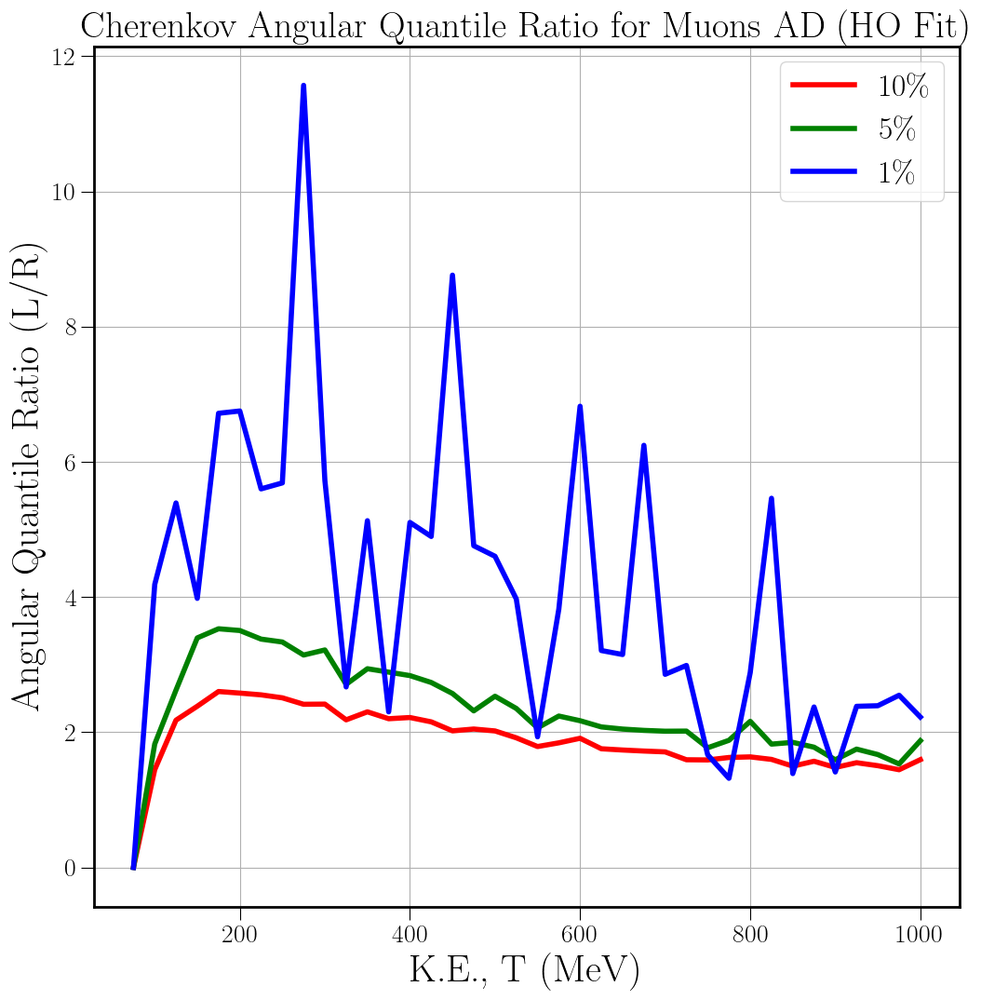

In [111]:
# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'K.E., T (MeV)', size= 30)
ax.set_ylabel(r'Angular Quantile Ratio (L/R)', size= 30) #$\frac{N}{A}$
# ax.set_ylabel(r'Angular Quantile Ratio (R/L)', size= 30) #$\frac{N}{A}$
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Cherenkov Angular Quantile Ratio for Muons AD (HO Fit)')
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.plot(tm, nbyamuhs10, linewidth=4, c='r', label='$10 \%$')
ax.plot(tm, nbyamuhs05, linewidth=4, c='g', label='$5 \%$')
ax.plot(tm, nbyamuhs01, linewidth=4, c='b', label='$1 \%$')

# ax.plot(t, abynphs10, linewidth=4, c='r', label='$10 \%$')
# ax.plot(t, abynphs05, linewidth=4, c='g', label='$5 \%$')
# ax.plot(t, abynphs01, linewidth=4, c='b', label='$1 \%$')

ax.grid()
ax.legend()
# plt.savefig('AQR_Cherenkov_AD_10_5_1_perc_Muon_allTs_hofit_from_saved_data', bbox_inches='tight')
# plt.savefig('AQR_Cherenkov_AD_10_5_1_perc_Proton_allTs_hofit_from_saved_data', bbox_inches='tight')
# plt.savefig('nbyas_10_5_1_perc_hofit_Cherenkov_AD_Muon_allT_from_saved_data', bbox_inches='tight')
# plt.savefig('abyns_10_5_1_perc_hofit_Cherenkov_AD_Muon_allT_from_saved_data', bbox_inches='tight')
plt.show()

Muon: [  75.  100.  125.  150.  175.  200.  225.  250.  275.  300.  325.  350.
  375.  400.  425.  450.  475.  500.  525.  550.  575.  600.  625.  650.
  675.  700.  725.  750.  775.  800.  825.  850.  875.  900.  925.  950.
  975. 1000.], [0.81113748 0.85793361 0.88891261 0.91060252 0.92642891 0.93835312
 0.94757187 0.95485213 0.96070526 0.96548344 0.96943599 0.97274358
 0.97553983 0.97792534 0.97997704 0.98175461 0.98330494 0.98466527
 0.98586549 0.98692983 0.98787809 0.98872659 0.98948888 0.99017626
 0.99079826 0.99136291 0.99187708 0.99234661 0.99277653 0.99317117
 0.9935343  0.99386919 0.9941787  0.99446532 0.99473127 0.99497848
 0.99520868 0.9954234 ], [0.8111 0.8579 0.8889 0.9106 0.9264 0.9384 0.9476 0.9549 0.9607 0.9655
 0.9694 0.9727 0.9755 0.9779 0.98   0.9818 0.9833 0.9847 0.9859 0.9869
 0.9879 0.9887 0.9895 0.9902 0.9908 0.9914 0.9919 0.9923 0.9928 0.9932
 0.9935 0.9939 0.9942 0.9945 0.9947 0.995  0.9952 0.9954]


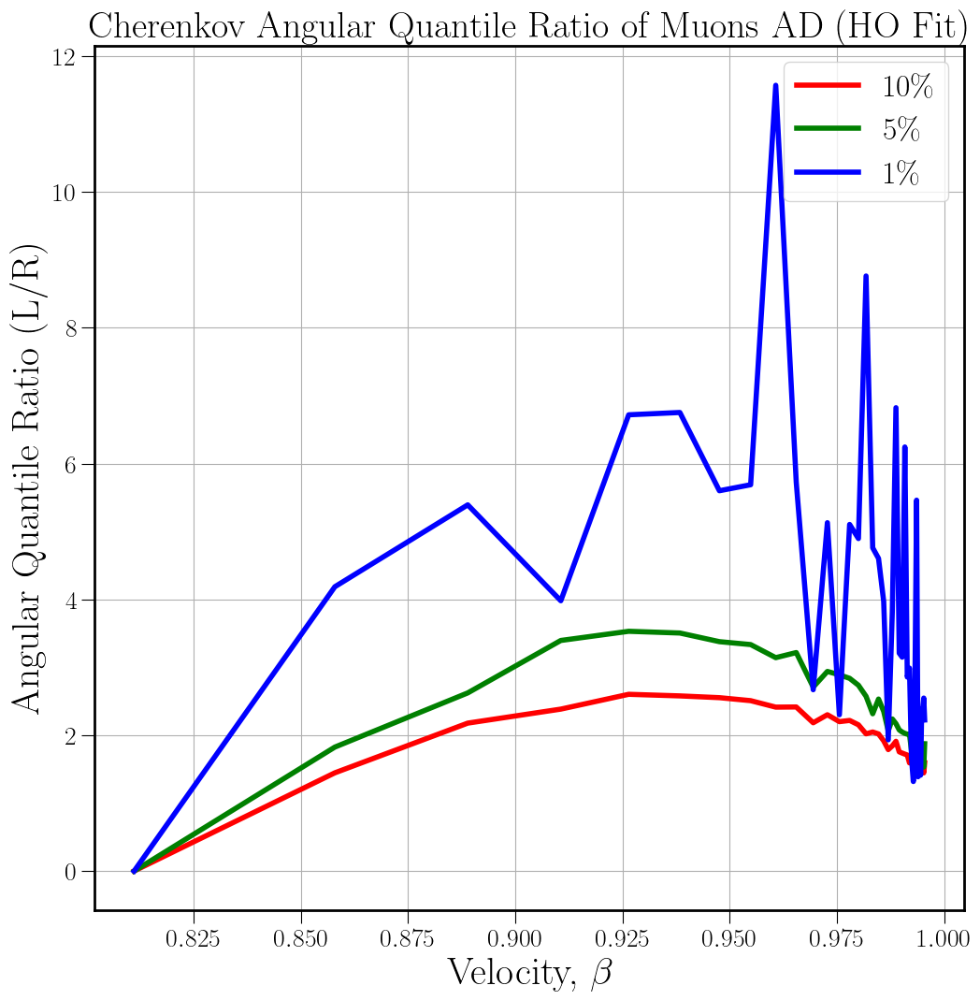

In [458]:
# Linear space in K.E.
# tp = np.linspace(500, 1500, 41)
# tm = np.linspace(100, 1000, 19)
tm = np.linspace(75, 1000, 38)

mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²
betamu  = np.sqrt(1 - (1/(1 + tm/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

print("Muon: {}, {}, {}".format(tm, betamu, np.round(betamu,4)))

# # #Linear space in K.E.
# tm = np.linspace(100, 1000, 37)
# # # print(t)

# # #Mass of the particle travelling
# # # mp = 938 #Proton's mass
# mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²

# betamu  = np.sqrt(1 - (1/(1 + tm/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

# print("Muon: {}, {}, {}".format( tm, betamu, np.round(betamu, 4)))

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'Velocity, $\beta$', size= 30)
ax.set_ylabel(r'Angular Quantile Ratio (L/R)', size= 30) #$\frac{N}{A}$
# ax.set_ylabel(r'Angular Quantile Ratio (R/L)', size= 30) #$\frac{N}{A}$
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Cherenkov Angular Quantile Ratio of Muons AD (HO Fit)')
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.plot(betamu, nbyamuhs10, linewidth=4, c='r', label='$10 \%$')
ax.plot(betamu, nbyamuhs05, linewidth=4, c='g', label='$5 \%$')
ax.plot(betamu, nbyamuhs01, linewidth=4, c='b', label='$1 \%$')

# ax.plot(t, abynphs10, linewidth=4, c='r', label='$10 \%$')
# ax.plot(t, abynphs05, linewidth=4, c='g', label='$5 \%$')
# ax.plot(t, abynphs01, linewidth=4, c='b', label='$1 \%$')

ax.grid()
ax.legend()
# plt.savefig('nbyas_10_5_1_perc_hofit_Cherenkov_AD_Muon_allbetas_from_saved_data', bbox_inches='tight')
# plt.savefig('abyns_10_5_1_perc_hofit_Cherenkov_IAD_Proton_allbetas_from_saved_data', bbox_inches='tight')
plt.show()

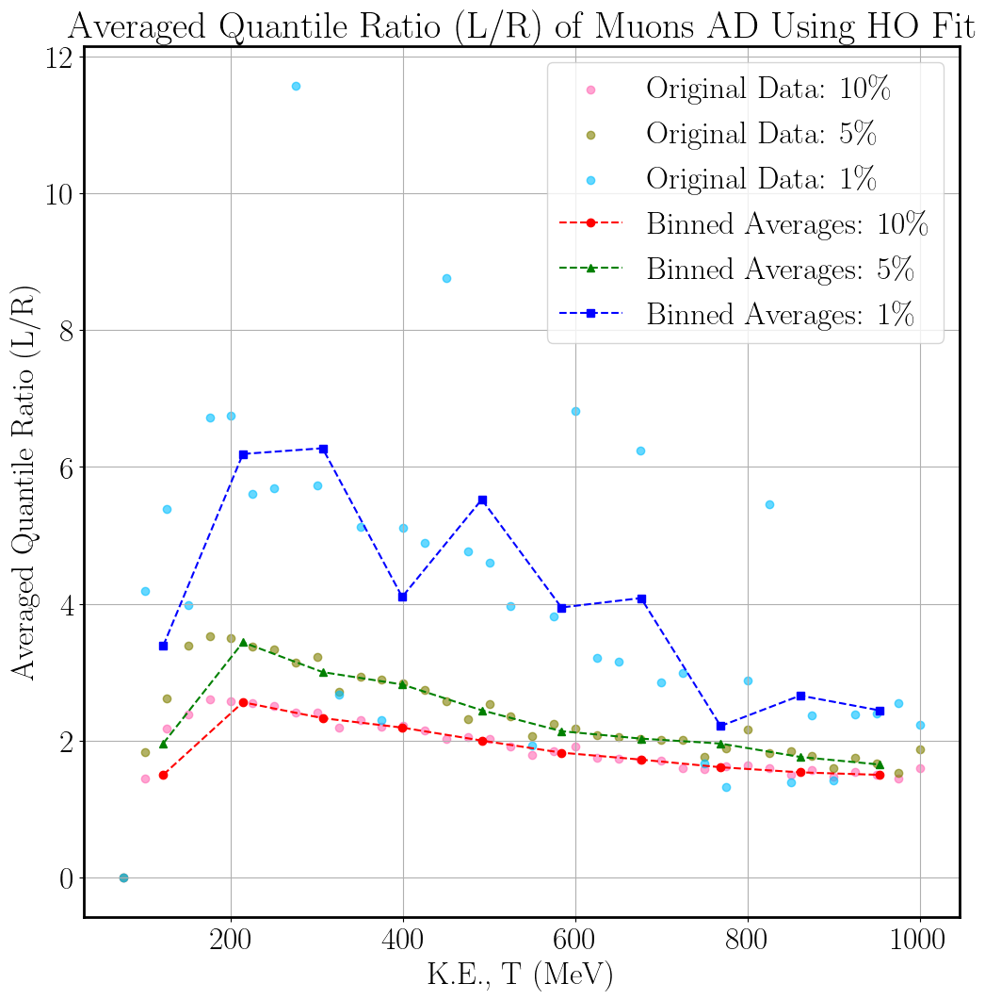

In [459]:
# Averaging elements within bins and then plotting these averages in Python can be achieved using libraries like NumPy and Matplotlib.
import numpy as np
import matplotlib.pyplot as plt

# 1. Generate or load your data
# For demonstration, let's create some sample data
np.random.seed(0) # for reproducibility
# x_data = np.random.rand(100) * 10 # x-values for binning
# y_data = 2 * x_data + np.random.randn(100) * 5 # y-values to be averaged

x_data = tm # x-values for binning
y_data1h = np.array(nbyamuhs10) # y-values to be averaged
y_data2h = np.array(nbyamuhs05)
y_data3h = np.array(nbyamuhs01)
 
# 2. Define the bins
num_bins = 10
# You can define custom bin edges or let NumPy determine them
bin_edges = np.linspace(min(x_data), max(x_data), num_bins + 1)

# 3. Bin the data and calculate the mean for each bin
# Use np.digitize to assign each x_data point to a bin index
bin_indices = np.digitize(x_data, bin_edges)

# Calculate the mean of y_data for each bin
bin_means1h = []
bin_centers1h = []

bin_means2h = []
bin_centers2h = []

bin_means3h = []
bin_centers3h = []

for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin1h = y_data1h[bin_indices == i]
    if len(elements_in_bin1h) > 0: # Avoid division by zero for empty bins
        bin_means1h.append(np.mean(elements_in_bin1h))
        # Calculate bin center for plotting
        bin_centers1h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means1h.append(np.nan)
        bin_centers1h.append((bin_edges[i-1] + bin_edges[i]) / 2)

for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin2h = y_data2h[bin_indices == i]
    if len(elements_in_bin2h) > 0: # Avoid division by zero for empty bins
        bin_means2h.append(np.mean(elements_in_bin2h))
        # Calculate bin center for plotting
        bin_centers2h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means2h.append(np.nan)
        bin_centers2h.append((bin_edges[i-1] + bin_edges[i]) / 2)

for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin3h = y_data3h[bin_indices == i]
    if len(elements_in_bin3h) > 0: # Avoid division by zero for empty bins
        bin_means3h.append(np.mean(elements_in_bin3h))
        # Calculate bin center for plotting
        bin_centers3h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means3h.append(np.nan)
        bin_centers3h.append((bin_edges[i-1] + bin_edges[i]) / 2)

# Remove NaN values if you don't want to plot empty bins
bin_centers1h = np.array(bin_centers1h)[~np.isnan(bin_means1h)]
bin_means1h = np.array(bin_means1h)[~np.isnan(bin_means1h)]

bin_centers2h = np.array(bin_centers2h)[~np.isnan(bin_means2h)]
bin_means2h = np.array(bin_means2h)[~np.isnan(bin_means2h)]

bin_centers3h = np.array(bin_centers3h)[~np.isnan(bin_means3h)]
bin_means3h = np.array(bin_means3h)[~np.isnan(bin_means3h)]

# 4. Plot the results
plt.figure(figsize=(12, 12))

plt.scatter(x_data, y_data1h, alpha=0.6, c='hotpink', label='Original Data: 10\%')
plt.scatter(x_data, y_data2h, alpha=0.6, c='olive', label='Original Data: 5\%')
plt.scatter(x_data, y_data3h, alpha=0.6, c='deepskyblue', label='Original Data: 1\%')

plt.plot(bin_centers1h, bin_means1h, color='red', marker='o', linestyle='--', label='Binned Averages: 10\%')
plt.plot(bin_centers2h, bin_means2h, color='green', marker='^', linestyle='--', label='Binned Averages: 5\%')
plt.plot(bin_centers3h, bin_means3h, color='blue', marker='s', linestyle='--', label='Binned Averages: 1\%')

plt.xlabel('K.E., T (MeV)') #(Binned Variable)
plt.ylabel('Averaged Quantile Ratio (L/R)') # (Averaged Variable)')
plt.title('Averaged Quantile Ratio (L/R) of Muons AD Using HO Fit') #in Bins of K.E. 
plt.legend()
plt.grid(True)

# plt.savefig('binned_avg_nbyas_10_5_1_perc_hofit_Cherenkov_AD_Muon_allT_from_saved_data', bbox_inches='tight') #_zoom
plt.show()

[array([1.52881502e-03, 1.44655541e+00, 2.17830060e+00, 2.38447802e+00]), array([2.60254302, 2.57900384, 2.55301221, 2.50898816]), array([2.41369204, 2.41605965, 2.18361997, 2.30183464]), array([2.19999876, 2.21777807, 2.1537877 ]), array([2.02035765, 2.04753827, 2.01918942, 1.91758643]), array([1.78866009, 1.84322265, 1.9105583 , 1.75549074]), array([1.73707019, 1.72191725, 1.70934048]), array([1.59311705, 1.59034447, 1.62663014, 1.63553825]), array([1.5984431 , 1.49850352, 1.57099353, 1.47923934]), array([1.54919866, 1.50520377, 1.44559465])] [1.50271571 2.56088681 2.32880157 2.19052151 2.00116794 1.82448294
 1.72277597 1.61140748 1.53679487 1.49999903]
[array([2.27315216e-04, 1.82551093e+00, 2.62307304e+00, 3.39520161e+00]), array([3.53022911, 3.50476338, 3.37758768, 3.33477926]), array([3.14197981, 3.21700709, 2.70869914, 2.93941253]), array([2.8890811 , 2.83772853, 2.7359926 ]), array([2.57307203, 2.31622172, 2.53262383, 2.35194356]), array([2.06420057, 2.23954235, 2.17052308, 2.0

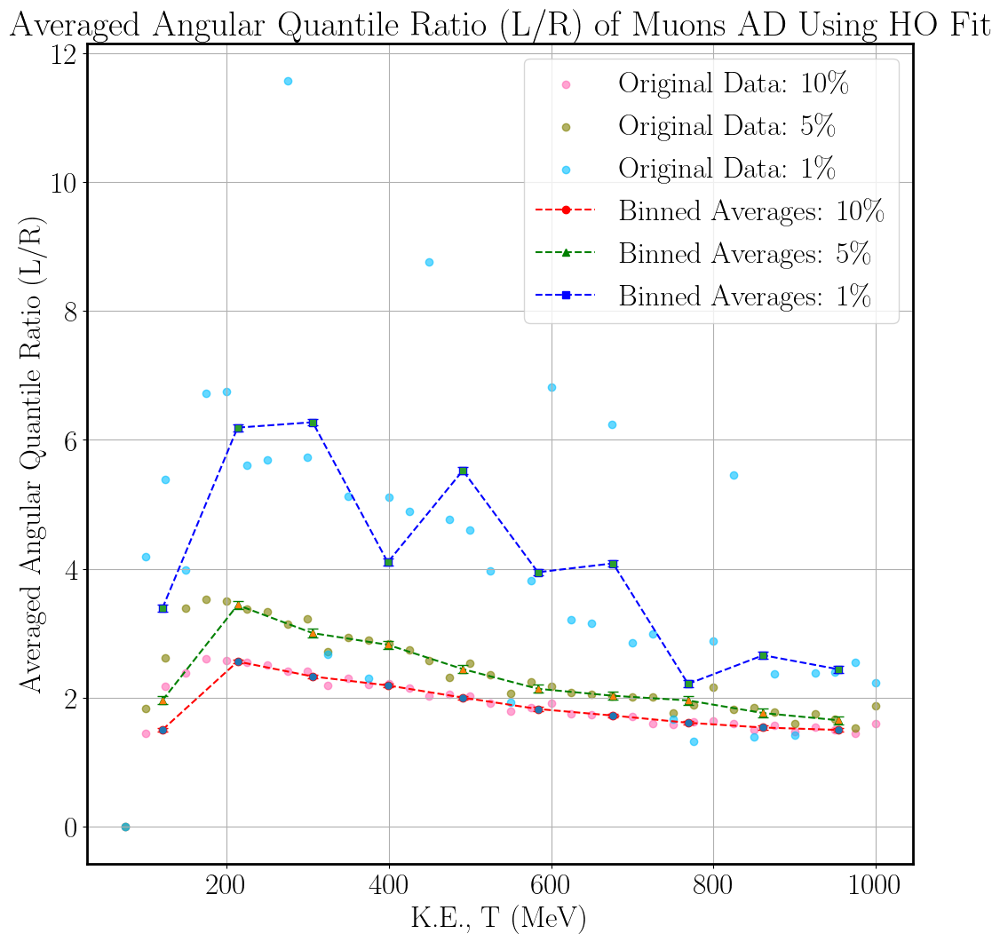

In [460]:
# Averaging elements within bins and then plotting these averages in Python can be achieved using libraries like NumPy and Matplotlib.
import numpy as np
import matplotlib.pyplot as plt

# 1. Generate or load your data
# For demonstration, let's create some sample data
np.random.seed(0) # for reproducibility
# x_data = np.random.rand(100) * 10 # x-values for binning
# y_data = 2 * x_data + np.random.randn(100) * 5 # y-values to be averaged

x_data = tm # x-values for binning
y_data1h = np.array(nbyamuhs10) # y-values to be averaged
y_data2h = np.array(nbyamuhs05)
y_data3h = np.array(nbyamuhs01)
 
# 2. Define the bins
num_bins = 10
# You can define custom bin edges or let NumPy determine them
bin_edges = np.linspace(min(x_data), max(x_data), num_bins + 1)

# 3. Bin the data and calculate the mean for each bin
# Use np.digitize to assign each x_data point to a bin index
bin_indices = np.digitize(x_data, bin_edges)

# Calculate the mean of y_data for each bin
bin_means1h = []
bin_centers1h = []

bin_means2h = []
bin_centers2h = []

bin_means3h = []
bin_centers3h = []


elements_in_bins_10h = []
elements_in_bins_05h = []
elements_in_bins_01h = []

bin_means_10h = []
bin_means_05h = []
bin_means_01h = []

# # 4. Plot the results
# plt.figure(figsize=(12, 12))

# plt.xlabel('K.E., T (MeV)') #(Binned Variable)
# plt.ylabel('Averaged Angular Quantile Ratio (L/R)') # (Averaged Variable)')
# plt.title('Averaged Angular Quantile Ratio (L/R) of Muons AD Using HO Fit') #in Bins of K.E. 


#10% Q.ratio
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin1h = y_data1h[bin_indices == i]
    if len(elements_in_bin1h) > 0: # Avoid division by zero for empty bins
        bin_means1h.append(np.mean(elements_in_bin1h))
        # Calculate bin center for plotting
        bin_centers1h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means1h.append(np.nan)
        bin_centers1h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    elements_in_bins_10h.append(elements_in_bin1h)
    # bin_means_10.append(np.array(bin_means1[-1])) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_10, bin_means_10) 


#5% Q.ratio    
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin2h = y_data2h[bin_indices == i]
    if len(elements_in_bin2h) > 0: # Avoid division by zero for empty bins
        bin_means2h.append(np.mean(elements_in_bin2h))
        # Calculate bin center for plotting
        bin_centers2h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means2h.append(np.nan)
        bin_centers2h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    elements_in_bins_05h.append(elements_in_bin2h)
    # bin_means_05.append(bin_means2[-1]) ##bin_means1[-1]: value of the last element of an array/list      
# print(elements_in_bins_05, bin_means_05)


#1% Q.ratio
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin3h = y_data3h[bin_indices == i]
    if len(elements_in_bin3h) > 0: # Avoid division by zero for empty bins
        bin_means3h.append(np.mean(elements_in_bin3h))
        # Calculate bin center for plotting
        bin_centers3h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means3h.append(np.nan)
        bin_centers3h.append((bin_edges[i-1] + bin_edges[i]) / 2)

    elements_in_bins_01h.append(elements_in_bin3h)
    # bin_means_01.append(bin_means3[-1]) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_01, bin_means_01)    


# Remove NaN values if you don't want to plot empty bins
bin_centers1h = np.array(bin_centers1h)[~np.isnan(bin_means1h)]
bin_means1h = np.array(bin_means1h)[~np.isnan(bin_means1h)]

bin_centers2h = np.array(bin_centers2h)[~np.isnan(bin_means2h)]
bin_means2h = np.array(bin_means2h)[~np.isnan(bin_means2h)]

bin_centers3h = np.array(bin_centers3h)[~np.isnan(bin_means3h)]
bin_means3h = np.array(bin_means3h)[~np.isnan(bin_means3h)]


# print(bin_means1h, bin_means2h, bin_means3h)

print(elements_in_bins_10h, bin_means1h)
print(elements_in_bins_05h, bin_means2h)
print(elements_in_bins_01h, bin_means3h)

#Jackknife resampling with my data 

def jackknife_statistic(data, statistic):
    n = len(data)
    jackknife_samples = np.zeros(n)

    for i in range(n):
        sample = np.delete(data, i)
        jackknife_samples[i] = statistic(sample)

    jackknife_mean = np.mean(jackknife_samples)
    variance = (n - 1) / n * np.sum((jackknife_samples - jackknife_mean)**2)
    bias = (n - 1) * (jackknife_mean - statistic(data))
    
    return jackknife_mean, variance, bias

# Example
# data = np.array([2, 4, 6, 8, 10])
#Real Data
data10h = elements_in_bins_10h
data05h = elements_in_bins_05h
data01h = elements_in_bins_01h
# print("data10 = {}, data05 = {}, data01 = {}".format(data10, data05, data01))
stat = np.mean

# # mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
# mean_jack10, var_jack10, bias_jack10 = jackknife_statistic(data10, stat)
# mean_jack05, var_jack05, bias_jack05 = jackknife_statistic(data05, stat)
# mean_jack01, var_jack01, bias_jack01 = jackknife_statistic(data01, stat)


# mean_jack10h = []
# mean_jack05h = []
# mean_jack01h = []

# var_jack10h = []
# var_jack05h = []
# var_jack01h = []

# bias_jack10h = []
# bias_jack05h = []
# bias_jack01h = []


for i in data10h: 
# mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
    mean_jack10h, var_jack10h, bias_jack10h = jackknife_statistic(i, stat)
    # mean_jack05, var_jack05, bias_jack05 = jackknife_statistic(data05, stat)
    # mean_jack01, var_jack01, bias_jack01 = jackknife_statistic(data01, stat)
    print("Jackknife 10 %: mean={}, var={}, bias={}".format(mean_jack10h, var_jack10h, bias_jack10h))

    # mean_jack10h.append(mean_jack10h)
    # var_jack10h.append(var_jack10h)
    # bias_jack10h.append(bias_jack10h)

for j in data05h: 
# mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
    # mean_jack10, var_jack10, bias_jack10 = jackknife_statistic(i, stat)
    mean_jack05h, var_jack05h, bias_jack05h = jackknife_statistic(j, stat)
    # mean_jack01, var_jack01, bias_jack01 = jackknife_statistic(data01, stat)
    print("Jackknife 5 %: mean={}, var={}, bias={}".format(mean_jack05h, var_jack05h, bias_jack05h))
# np.append(mean_jack05h, var_jack05h, bias_jack05h)
    # mean_jack05h.append(mean_jack05h)
    # var_jack05h.append(var_jack05h)
    # bias_jack05h.append(bias_jack05h)


for k in data01h: 
# mean_jack, var_jack, bias_jack = jackknife_statistic(data, stat)
    # mean_jack10, var_jack10, bias_jack10 = jackknife_statistic(i, stat)
    # mean_jack05, var_jack05, bias_jack05 = jackknife_statistic(data05, stat)
    mean_jack01h, var_jack01h, bias_jack01h = jackknife_statistic(k, stat)
    print("Jackknife 1 %: mean={}, var={}, bias={}".format(mean_jack01h, var_jack01h, bias_jack01h))
# np.append(mean_jack01h, var_jack01h, bias_jack01h)
    # mean_jack01h.append(mean_jack01h)
    # var_jack01h.append(var_jack01h)
    # bias_jack01h.append(bias_jack01h)


# print("Jackknife Means:", mean_jack10, mean_jack05, mean_jack01)
# print("Jackknife Variances:", var_jack10, var_jack05, var_jack01)
# print("Jackknife Biases:", bias_jack10, bias_jack05, bias_jack01)


# 4. Plot the results
plt.figure(figsize=(12, 12))

plt.xlabel('K.E., T (MeV)') #(Binned Variable)
plt.ylabel('Averaged Angular Quantile Ratio (L/R)') # (Averaged Variable)')
plt.title('Averaged Angular Quantile Ratio (L/R) of Muons AD Using HO Fit') #in Bins of K.E. 


plt.scatter(x_data, y_data1h, alpha=0.6, c='hotpink', label='Original Data: 10\%')
plt.scatter(x_data, y_data2h, alpha=0.6, c='olive', label='Original Data: 5\%')
plt.scatter(x_data, y_data3h, alpha=0.6, c='deepskyblue', label='Original Data: 1\%')

plt.plot(bin_centers1h, bin_means1h, color='red', marker='o', linestyle='--', label='Binned Averages: 10\%')
plt.plot(bin_centers2h, bin_means2h, color='green', marker='^', linestyle='--', label='Binned Averages: 5\%')
plt.plot(bin_centers3h, bin_means3h, color='blue', marker='s', linestyle='--', label='Binned Averages: 1\%')

# plt.errorbar(x_values, y_estimates, yerr=jackknife_errors, fmt='o', capsize=4, ecolor='red', markersize=5)  #Jackknife errorbar
plt.errorbar(bin_centers1h, bin_means1h, yerr=np.sqrt(var_jack10h), fmt='o', capsize=4, ecolor='red', markersize=5)  #Jackknife errorbar for 10% Q.ratio
plt.errorbar(bin_centers2h, bin_means2h, yerr=np.sqrt(var_jack05h), fmt='^', capsize=4, ecolor='green', markersize=5)  #Jackknife errorbar for 10% Q.ratio
plt.errorbar(bin_centers3h, bin_means3h, yerr=np.sqrt(var_jack01h), fmt='s', capsize=4, ecolor='blue', markersize=5)  #Jackknife errorbar for 10% Q.ratio

plt.legend()
plt.grid(True)

# plt.savefig('binned_avg_nbyas_10_5_1_perc_hofit_Cherenkov_AD_Muon_allT_from_saved_data_w_jackknife_err', bbox_inches='tight') #_zoom
plt.show()

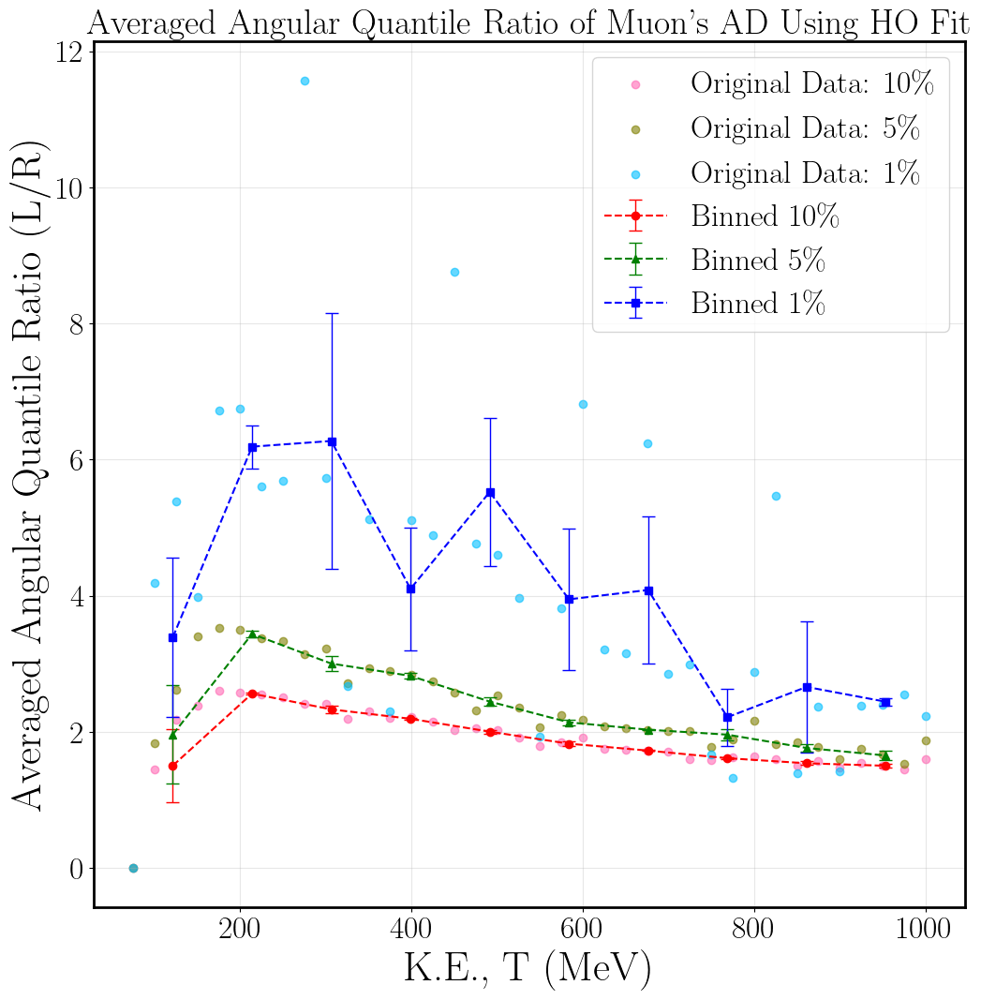

In [113]:
# Averaging elements within bins and then plotting these averages in Python can be achieved using libraries like NumPy and Matplotlib.
import numpy as np
import matplotlib.pyplot as plt

# 1. Generate or load your data
# For demonstration, let's create some sample data
np.random.seed(0) # for reproducibility
# x_data = np.random.rand(100) * 10 # x-values for binning
# y_data = 2 * x_data + np.random.randn(100) * 5 # y-values to be averaged

x_data = tm # x-values for binning
y_data1h = np.array(nbyamuhs10) # y-values to be averaged
y_data2h = np.array(nbyamuhs05)
y_data3h = np.array(nbyamuhs01)
 
# 2. Define the bins
num_bins = 10
# You can define custom bin edges or let NumPy determine them
bin_edges = np.linspace(min(x_data), max(x_data), num_bins + 1)

# 3. Bin the data and calculate the mean for each bin
# Use np.digitize to assign each x_data point to a bin index
bin_indices = np.digitize(x_data, bin_edges)

# Calculate the mean of y_data for each bin
bin_means1h = []
bin_centers1h = []

bin_means2h = []
bin_centers2h = []

bin_means3h = []
bin_centers3h = []


elements_in_bins_10h = []
elements_in_bins_05h = []
elements_in_bins_01h = []

bin_means_10h = []
bin_means_05h = []
bin_means_01h = []

# # 4. Plot the results
# plt.figure(figsize=(12, 12))

# plt.xlabel('K.E., T (MeV)') #(Binned Variable)
# plt.ylabel('Averaged Angular Quantile Ratio (L/R)') # (Averaged Variable)')
# plt.title('Averaged Angular Quantile Ratio (L/R) of Muons AD Using HO Fit') #in Bins of K.E. 


#10% Q.ratio
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin1h = y_data1h[bin_indices == i]
    if len(elements_in_bin1h) > 0: # Avoid division by zero for empty bins
        bin_means1h.append(np.mean(elements_in_bin1h))
        # Calculate bin center for plotting
        bin_centers1h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means1h.append(np.nan)
        bin_centers1h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    elements_in_bins_10h.append(elements_in_bin1h)
    # bin_means_10.append(np.array(bin_means1[-1])) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_10, bin_means_10) 


#5% Q.ratio    
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin2h = y_data2h[bin_indices == i]
    if len(elements_in_bin2h) > 0: # Avoid division by zero for empty bins
        bin_means2h.append(np.mean(elements_in_bin2h))
        # Calculate bin center for plotting
        bin_centers2h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means2h.append(np.nan)
        bin_centers2h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    elements_in_bins_05h.append(elements_in_bin2h)
    # bin_means_05.append(bin_means2[-1]) ##bin_means1[-1]: value of the last element of an array/list      
# print(elements_in_bins_05, bin_means_05)


#1% Q.ratio
for i in range(1, num_bins + 1): # Iterate through each bin
    elements_in_bin3h = y_data3h[bin_indices == i]
    if len(elements_in_bin3h) > 0: # Avoid division by zero for empty bins
        bin_means3h.append(np.mean(elements_in_bin3h))
        # Calculate bin center for plotting
        bin_centers3h.append((bin_edges[i-1] + bin_edges[i]) / 2)
    else:
        # Handle empty bins (e.g., append NaN or skip)
        bin_means3h.append(np.nan)
        bin_centers3h.append((bin_edges[i-1] + bin_edges[i]) / 2)

    elements_in_bins_01h.append(elements_in_bin3h)
    # bin_means_01.append(bin_means3[-1]) ##bin_means1[-1]: value of the last element of an array/list  
# print(elements_in_bins_01, bin_means_01)    


# Remove NaN values if you don't want to plot empty bins
bin_centers1h = np.array(bin_centers1h)[~np.isnan(bin_means1h)]
bin_means1h = np.array(bin_means1h)[~np.isnan(bin_means1h)]

bin_centers2h = np.array(bin_centers2h)[~np.isnan(bin_means2h)]
bin_means2h = np.array(bin_means2h)[~np.isnan(bin_means2h)]

bin_centers3h = np.array(bin_centers3h)[~np.isnan(bin_means3h)]
bin_means3h = np.array(bin_means3h)[~np.isnan(bin_means3h)]


# print(bin_means1h, bin_means2h, bin_means3h)

# print(elements_in_bins_10h, bin_means1h)
# print(elements_in_bins_05h, bin_means2h)
# print(elements_in_bins_01h, bin_means3h)

#Jackknife resampling with my data 

def jackknife_statistic(data, statistic):
    n = len(data)
    jackknife_samples = np.zeros(n)

    for i in range(n):
        sample = np.delete(data, i)
        jackknife_samples[i] = statistic(sample)

    jackknife_mean = np.mean(jackknife_samples)
    variance = (n - 1) / n * np.sum((jackknife_samples - jackknife_mean)**2)
    bias = (n - 1) * (jackknife_mean - statistic(data))
    
    return jackknife_mean, variance, bias

# Example
# data = np.array([2, 4, 6, 8, 10])
#Real Data
data10h = elements_in_bins_10h
data05h = elements_in_bins_05h
data01h = elements_in_bins_01h
# print("data10 = {}, data05 = {}, data01 = {}".format(data10, data05, data01))
stat = np.mean


# Initialize empty lists to store results for each bin
means_10h, errs_10h = [], []
means_05h, errs_05h = [], []
means_01h, errs_01h = [], []

# Loop for 10% data
for bin_data in elements_in_bins_10h:
    if len(bin_data) > 1: # Jackknife requires at least 2 points
        m, v, b = jackknife_statistic(bin_data, np.mean)
        means_10h.append(m)
        errs_10h.append(np.sqrt(v)) # Error bar is square root of variance
    else:
        means_10h.append(np.nan)
        errs_10h.append(np.nan)

# Loop for 5% data
for bin_data in elements_in_bins_05h:
    if len(bin_data) > 1:
        m, v, b = jackknife_statistic(bin_data, np.mean)
        means_05h.append(m)
        errs_05h.append(np.sqrt(v))
    else:
        means_05h.append(np.nan)
        errs_05h.append(np.nan)

# Loop for 1% data
for bin_data in elements_in_bins_01h:
    if len(bin_data) > 1:
        m, v, b = jackknife_statistic(bin_data, np.mean)
        means_01h.append(m)
        errs_01h.append(np.sqrt(v))
    else:
        means_01h.append(np.nan)
        errs_01h.append(np.nan)

#Plotting

plt.figure(figsize=(12, 12))

plt.scatter(x_data, y_data1h, alpha=0.6, c='hotpink', label='Original Data: 10\%')
plt.scatter(x_data, y_data2h, alpha=0.6, c='olive', label='Original Data: 5\%')
plt.scatter(x_data, y_data3h, alpha=0.6, c='deepskyblue', label='Original Data: 1\%')


# Define labels and colors for cleaner code
datasets = [
    (bin_centers1h, means_10h, errs_10h, 'red', 'o', '10\%'),
    (bin_centers2h, means_05h, errs_05h, 'green', '^', '5\%'),
    (bin_centers3h, means_01h, errs_01h, 'blue', 's', '1\%')
]

for x, y, yerr, color, marker, label in datasets:
    # Convert to numpy arrays to handle indexing/NaNs
    x, y, yerr = np.array(x), np.array(y), np.array(yerr)
    mask = ~np.isnan(y)
    
    plt.errorbar(x[mask], y[mask], yerr=yerr[mask], 
                 fmt=marker, color=color, linestyle='--', 
                 capsize=5, elinewidth=1, label=f'Binned {label}')

plt.xlabel('K.E., T (MeV)', size=32)
plt.ylabel('Averaged Angular Quantile Ratio (L/R)', size=32)
plt.title('Averaged Angular Quantile Ratio of Muon\'s AD Using HO Fit', size=27)
plt.legend()
plt.grid(True, alpha=0.3)

# plt.savefig('binned_avg_nbyas_10_5_1_perc_hofit_Cherenkov_AD_Muon_allT_from_saved_data_w_jackknife_err_corrected_v2', bbox_inches='tight') #_zoom
plt.show()


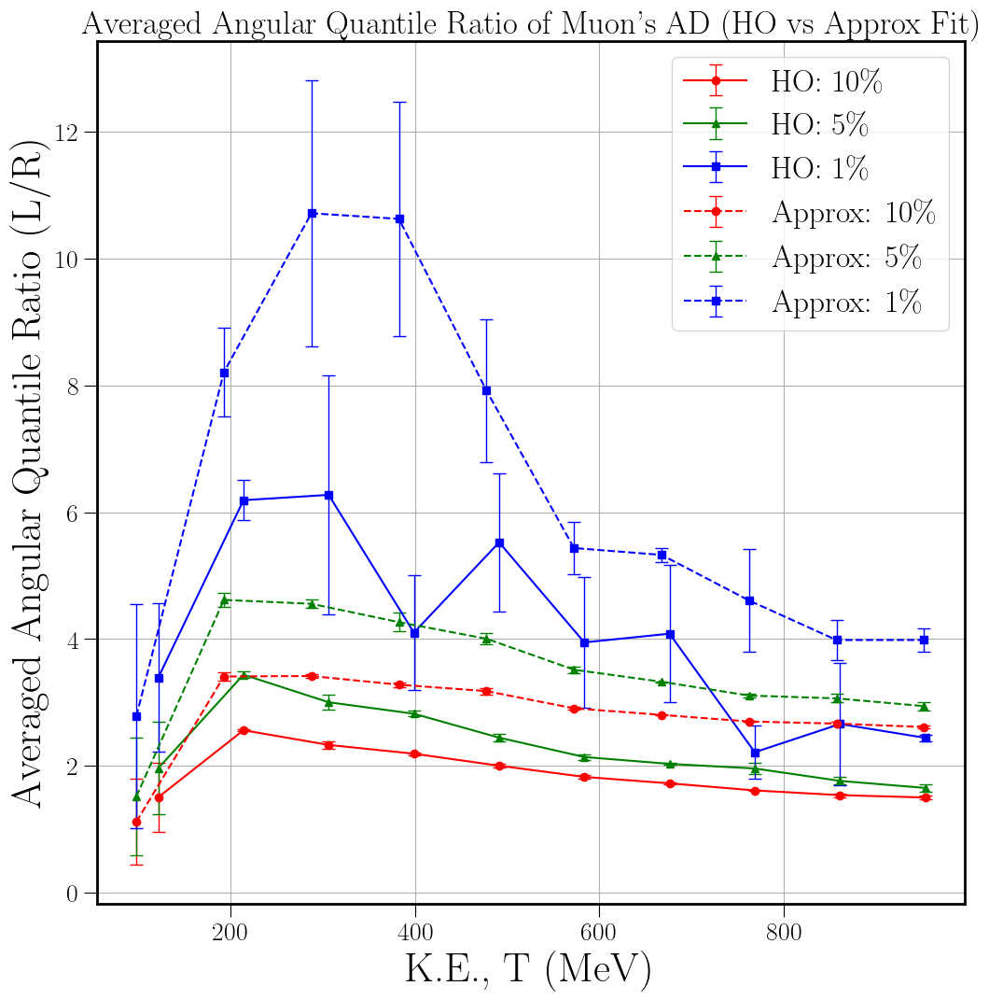

In [125]:
#Linear space in K.E.
# t = np.linspace(500, 1500, 41)
# print(t)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'K.E., T (MeV)', size= 32)
ax.set_ylabel(r'Averaged Angular Quantile Ratio (L/R)', size= 32)
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Averaged Angular Quantile Ratio of Muon\'s AD (HO vs Approx Fit)', fontsize=25)
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)

# ax.plot(t, nbyapps10, linewidth=4, c='r', label="Approx: 10\%", ls='dashdot')
# ax.plot(t, nbyapps05, linewidth=4, c='g', label="Approx: 5\%", ls='dashdot')
# ax.plot(t, nbyapps01, linewidth=4, c='b', label="Approx: 1\%", ls='dashdot')

# ax.plot(t, nbyaphs10, linewidth=4, c='r', label="HO: 10\%")
# ax.plot(t, nbyaphs05, linewidth=4, c='g', label="HO: 5\%")
# ax.plot(t, nbyaphs01, linewidth=4, c='b', label="HO: 1\%")

# plt.scatter(x_data, y_data1h, alpha=0.6, c='hotpink', label='Original Data: 10\%')
# plt.scatter(x_data, y_data2h, alpha=0.6, c='olive', label='Original Data: 5\%')
# plt.scatter(x_data, y_data3h, alpha=0.6, c='deepskyblue', label='Original Data: 1\%')


# plt.plot(bin_centers1, bin_means1, color='red', marker='o', linestyle='--', label='Approx 10\%')
# plt.plot(bin_centers2, bin_means2, color='green', marker='^', linestyle='--', label='Approx 5\%')
# plt.plot(bin_centers3, bin_means3, color='blue', marker='s', linestyle='--', label='Approx 1\%')

# plt.plot(bin_centers1h, bin_means1h, color='red', marker='o', linestyle='solid', label='HO 10\%')
# plt.plot(bin_centers2h, bin_means2h, color='green', marker='^', linestyle='solid', label='HO 5\%')
# plt.plot(bin_centers3h, bin_means3h, color='blue', marker='s', linestyle='solid', label='HO 1\%')

# # plt.errorbar(x_values, y_estimates, yerr=jackknife_errors, fmt='o', capsize=4, ecolor='red', markersize=5)  #Jackknife errorbar
# plt.errorbar(bin_centers1, bin_means1, yerr=np.sqrt(var_jack10), fmt='o', capsize=4, ecolor='hotpink', markersize=5)  #Jackknife errorbar for 10% Q.ratio
# plt.errorbar(bin_centers2, bin_means2, yerr=np.sqrt(var_jack05), fmt='^', capsize=4, ecolor='olive', markersize=5)  #Jackknife errorbar for 10% Q.ratio
# plt.errorbar(bin_centers3, bin_means3, yerr=np.sqrt(var_jack01), fmt='s', capsize=4, ecolor='deepskyblue', markersize=5)  #Jackknife errorbar for 10% Q.ratio

# # plt.errorbar(x_values, y_estimates, yerr=jackknife_errors, fmt='o', capsize=4, ecolor='red', markersize=5)  #Jackknife errorbar
# plt.errorbar(bin_centers1h, bin_means1h, yerr=np.sqrt(var_jack10h), fmt='o', capsize=4, ecolor='red', markersize=5)  #Jackknife errorbar for 10% Q.ratio
# plt.errorbar(bin_centers2h, bin_means2h, yerr=np.sqrt(var_jack05h), fmt='^', capsize=4, ecolor='green', markersize=5)  #Jackknife errorbar for 10% Q.ratio
# plt.errorbar(bin_centers3h, bin_means3h, yerr=np.sqrt(var_jack01h), fmt='s', capsize=4, ecolor='blue', markersize=5)  #Jackknife errorbar for 10% Q.ratio

# Define labels and colors for cleaner code
datasets1 = [
    (bin_centers1h, means_10h, errs_10h, 'red', 'o', '10\%'),
    (bin_centers2h, means_05h, errs_05h, 'green', '^', '5\%'),
    (bin_centers3h, means_01h, errs_01h, 'blue', 's', '1\%')
]

for x, y, yerr, color, marker, label in datasets1:
    # Convert to numpy arrays to handle indexing/NaNs
    x, y, yerr = np.array(x), np.array(y), np.array(yerr)
    mask = ~np.isnan(y)
    
    plt.errorbar(x[mask], y[mask], yerr=yerr[mask], 
                 fmt=marker, color=color, linestyle='solid', 
                 capsize=5, elinewidth=1, label=f'HO: {label}')


# Define labels and colors for cleaner code
datasets2 = [
    (bin_centers1, means_10, errs_10, 'red', 'o', '10\%'),
    (bin_centers2, means_05, errs_05, 'green', '^', '5\%'),
    (bin_centers3, means_01, errs_01, 'blue', 's', '1\%')
]

for x, y, yerr, color, marker, label in datasets2:
    # Convert to numpy arrays to handle indexing/NaNs
    x, y, yerr = np.array(x), np.array(y), np.array(yerr)
    mask = ~np.isnan(y)
    
    plt.errorbar(x[mask], y[mask], yerr=yerr[mask], 
                 fmt=marker, color=color, linestyle='--', 
                 capsize=5, elinewidth=1, label=f'Approx: {label}')



# # Add a vertical arrow
# # x, y: starting point of the arrow
# # dx, dy: length of the arrow along x and y directions
# plt.arrow(x=1400, y=1.25, dx=0, dy=0.40, width=0.5, head_width=3.5, head_length=0.05, fc='r', ec='r')

ax.grid()
ax.legend()

# plt.savefig('binned_avg_AQR_ho_vs_approxfit_Cherenkov_AD_Muon_allTs_10_5_1_perc_from_saved_data_w_jackknife_err_corrected', bbox_inches='tight')
# plt.savefig('binned_avg_nbyas_hofit_Cherenkov_IAD_Proton_allT_from_saved_data', bbox_inches='tight')
# plt.savefig('binned_avg_nbyas_ho_vs_approxfit_Cherenkov_IAD_Proton_allTs_10_perc_from_saved_data', bbox_inches='tight')
plt.show()

[ 500.  525.  550.  575.  600.  625.  650.  675.  700.  725.  750.  775.
  800.  825.  850.  875.  900.  925.  950.  975. 1000. 1025. 1050. 1075.
 1100. 1125. 1150. 1175. 1200. 1225. 1250. 1275. 1300. 1325. 1350. 1375.
 1400. 1425. 1450. 1475. 1500.] [  75.  100.  125.  150.  175.  200.  225.  250.  275.  300.  325.  350.
  375.  400.  425.  450.  475.  500.  525.  550.  575.  600.  625.  650.
  675.  700.  725.  750.  775.  800.  825.  850.  875.  900.  925.  950.
  975. 1000.]
[0.75796532 0.76741698 0.77628968 0.78463315 0.79249149 0.79990401
 0.80690583 0.81352846 0.81980026 0.82574686 0.83139144 0.83675507
 0.8418569  0.84671442 0.8513436  0.85575908 0.85997431 0.86400164
 0.86785245 0.87153724 0.87506571 0.87844687 0.88168902 0.88479989
 0.88778668 0.89065607 0.89341428 0.89606712 0.89862002 0.90107804
 0.90344595 0.90572818 0.9079289  0.91005203 0.91210124 0.91407999
 0.91599153 0.91783893 0.91962507 0.92135268 0.92302433]
[4, 4, 4, 3, 4, 4, 3, 4, 4, 3]
[0.81113748 0.85793361 0.8

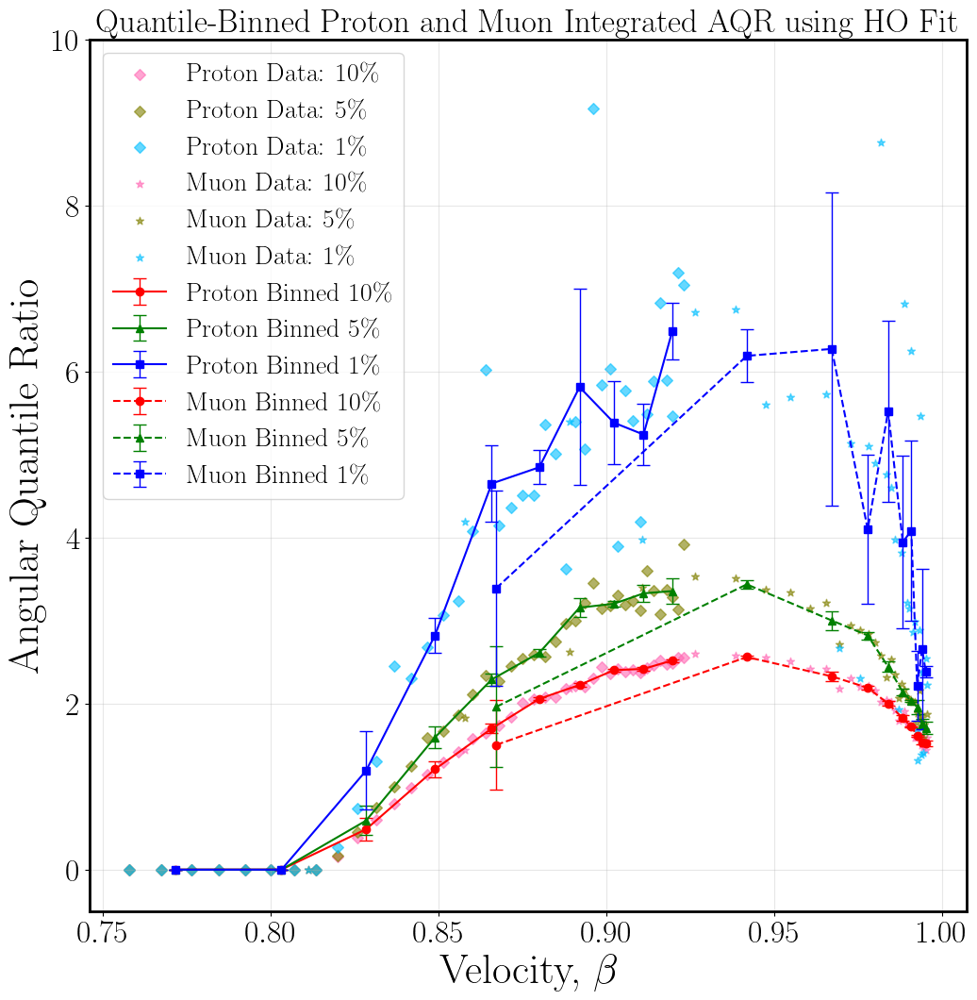

In [481]:
# 0. Definition 

#Linear space in K.E.
# Linear space in K.E.
tp = np.linspace(500, 1500, 41)
tm = np.linspace(75, 1000, 38)
# tm = np.linspace(100,1000,19)
print(tp, tm)

#Mass of the particle travelling
mp = 938 #Proton's mass
mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²

betap  = np.sqrt(1 - (1/(1 + tp/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD
betamu  = np.sqrt(1 - (1/(1 + tm/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

# print (tp, betap, np.round(betap, 4))
# print (tm, betamu, np.round(betamu, 4))


# 1. Define x_data (Velocity) & y_data (AQR)
x_data1 = betap 
print(x_data1)

y_data1hp = np.array(nbyaphs10) # y-values to be averaged
y_data2hp = np.array(nbyaphs05)
y_data3hp = np.array(nbyaphs01)

# 2. CREATE QUANTILE BINS
num_bins = 10
# This creates edges so that ~10% of the data points fall into each bin
bin_edges = np.quantile(x_data1, np.linspace(0, 1, num_bins + 1))

# 3. DIGITIZE & CALCULATE CENTERS
bin_indices = np.digitize(x_data1, bin_edges)
# Handle the edge case where a point equals the max value
bin_indices[bin_indices > num_bins] = num_bins

# We calculate the average x-position (beta) within each bin for more accuracy
bin_centershp = []
for i in range(1, num_bins + 1):
    points_in_bin = x_data1[bin_indices == i]
    if len(points_in_bin) > 0:
        bin_centershp.append(np.mean(points_in_bin))
    else:
        # Fallback to geometric center if bin is somehow empty
        bin_centershp.append((bin_edges[i-1] + bin_edges[i]) / 2)

bin_centershp = np.array(bin_centershp)

# 4. PLOTTING LOOP (Now with equal data counts per bin)
plt.figure(figsize=(12, 12))

plt.scatter(x_data1, y_data1hp, alpha=0.6, c='hotpink', label='Proton Data: 10\%', marker='D')
plt.scatter(x_data1, y_data2hp, alpha=0.6, c='olive', label='Proton Data: 5\%', marker='D')
plt.scatter(x_data1, y_data3hp, alpha=0.6, c='deepskyblue', label='Proton Data: 1\%', marker='D')

print([len(b) for b in elements_in_bins_10h])


datasets = [
    (y_data1hp, 'red', 'o', '10\%'),
    (y_data2hp, 'green', '^', '5\%'),
    (y_data3hp, 'blue', 's', '1\%')
]

for y_vals, color, marker, label in datasets:
    meanshp, errshp = [], []
    
    for i in range(1, num_bins + 1):
        bin_data = y_vals[bin_indices == i]
        
        if len(bin_data) > 1:
            m, v, b = jackknife_statistic(bin_data, np.mean)
            meanshp.append(m)
            errshp.append(np.sqrt(v))
        else:
            meanshp.append(np.nan)
            errshp.append(np.nan)
            
    # Convert to arrays for masking
    meanshp, errshp = np.array(meanshp), np.array(errshp)
    mask = ~np.isnan(meanshp)
    
    plt.errorbar(bin_centershp[mask], meanshp[mask], yerr=errshp[mask], 
                 fmt=marker, color=color, linestyle='solid', 
                 capsize=5, elinewidth=1, label=f'Proton Binned {label}')



# 1. Define x_data (Velocity) & y_data (AQR)
x_data2 = betamu 
print(x_data2)

y_data1hmu = np.array(nbyamuhs10) # y-values to be averaged
y_data2hmu = np.array(nbyamuhs05)
y_data3hmu = np.array(nbyamuhs01)



# 2. CREATE QUANTILE BINS
num_bins = 10
# This creates edges so that ~10% of the data points fall into each bin
bin_edges = np.quantile(x_data2, np.linspace(0, 1, num_bins + 1))

# 3. DIGITIZE & CALCULATE CENTERS
bin_indices = np.digitize(x_data2, bin_edges)
# Handle the edge case where a point equals the max value
bin_indices[bin_indices > num_bins] = num_bins


# We calculate the average x-position (beta) within each bin for more accuracy
bin_centershmu = []
for i in range(1, num_bins + 1):
    points_in_bin = x_data2[bin_indices == i]
    if len(points_in_bin) > 0:
        bin_centershmu.append(np.mean(points_in_bin))
    else:
        # Fallback to geometric center if bin is somehow empty
        bin_centershmu.append((bin_edges[i-1] + bin_edges[i]) / 2)

bin_centershmu = np.array(bin_centershmu)

# # 4. PLOTTING LOOP (Now with equal data counts per bin)
# plt.figure(figsize=(12, 12))


plt.scatter(x_data2, y_data1hmu, alpha=0.6, c='hotpink', label='Muon Data: 10\%', marker='*')
plt.scatter(x_data2, y_data2hmu, alpha=0.6, c='olive', label='Muon Data: 5\%', marker='*')
plt.scatter(x_data2, y_data3hmu, alpha=0.6, c='deepskyblue', label='Muon Data: 1\%', marker='*')

print([len(b) for b in elements_in_bins_10h])


datasets = [
    (y_data1hmu, 'red', 'o', '10\%'),
    (y_data2hmu, 'green', '^', '5\%'),
    (y_data3hmu, 'blue', 's', '1\%')
]

for y_vals, color, marker, label in datasets:
    meanshmu, errshmu = [], []
    
    for i in range(1, num_bins + 1):
        bin_data = y_vals[bin_indices == i]
        
        if len(bin_data) > 1:
            m, v, b = jackknife_statistic(bin_data, np.mean)
            meanshmu.append(m)
            errshmu.append(np.sqrt(v))
        else:
            meanshmu.append(np.nan)
            errshmu.append(np.nan)
            
    # Convert to arrays for masking
    meanshmu, errshmu = np.array(meanshmu), np.array(errshmu)
    mask = ~np.isnan(meanshmu)
    
    plt.errorbar(bin_centershmu[mask], meanshmu[mask], yerr=errshmu[mask], 
                 fmt=marker, color=color, linestyle='--', 
                 capsize=5, elinewidth=1, label=f'Muon Binned {label}')

plt.xlabel(r'Velocity, $\beta$', size=32)
plt.ylabel('Angular Quantile Ratio', size=32)
plt.title('Quantile-Binned Proton and Muon Integrated AQR using HO Fit', size=25) #with Jackknife Errors 
plt.legend(fontsize=20)
plt.grid(True, alpha=0.3)
plt.ylim(-0.5,10)
# plt.savefig('quantile_binned_Proton_Muon_Cherenkov_AD_AQR_10_5_1_perc_hofit_allbetas_w_jackknife_err_corrected3', bbox_inches='tight') #_zoom
plt.show()


HO Fit: 10\%
HO Fit: 5\%
HO Fit: 1\%
[array([121.25, 213.75, 306.25, 398.75, 491.25, 583.75, 676.25, 768.75,
       861.25, 953.75]), array([121.25, 213.75, 306.25, 398.75, 491.25, 583.75, 676.25, 768.75,
       861.25, 953.75]), array([121.25, 213.75, 306.25, 398.75, 491.25, 583.75, 676.25, 768.75,
       861.25, 953.75])] [array([1.50271571, 2.56088681, 2.32880157, 2.19052151, 2.00116794,
       1.82448294, 1.72277597, 1.61140748, 1.53679487, 1.49999903]), array([1.96100322, 3.43683986, 3.00177464, 2.82093408, 2.44346529,
       2.13818186, 2.02992605, 1.957383  , 1.76160952, 1.65059279]), array([3.38938837, 6.18898093, 6.27276259, 4.09994888, 5.52343163,
       3.94587632, 4.083182  , 2.21361588, 2.65872496, 2.44088214])] [array([0.53933878, 0.02003943, 0.05524587, 0.01907053, 0.02861977,
       0.03391576, 0.00801638, 0.01151888, 0.02850281, 0.03002091]), array([0.7279115 , 0.04766405, 0.11393155, 0.04498356, 0.06410558,
       0.04119027, 0.00924293, 0.08473467, 0.05828327, 0.0640

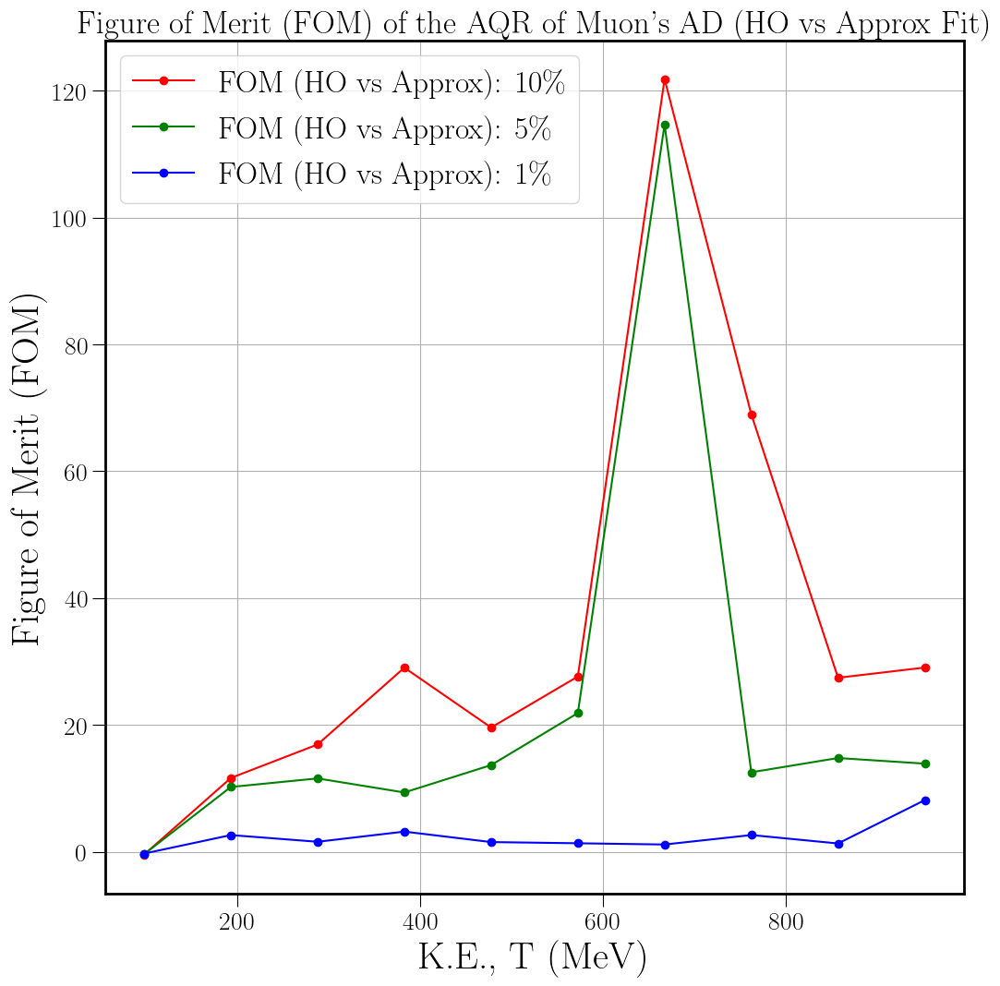

In [433]:
import matplotlib.pyplot as plt
import numpy as np

#Compare between AQRs of Muon's Integrated AD using HO vs Approx fit w/ Figure of Merit (FOM)

#Linear space in K.E.
# t = np.linspace(500, 1500, 41)
# print(t)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# # Set labels and title:
# ax.set_xlabel(r'K.E., T (MeV)', size= 30)
# ax.set_ylabel(r'Averaged Angular Quantile Ratio (L/R)', size= 30)
# # ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
# ax.set_title('Averaged Angular Quantile Ratio of Muon\'s AD (HO vs Approx Fit)', fontsize=25)
# # ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
# ax.tick_params(axis='both',which='major',labelsize=20,length=10)


# Set labels and title:
ax.set_xlabel(r'K.E., T (MeV)', size= 32)
ax.set_ylabel(r'Figure of Merit (FOM)', size= 32)
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Figure of Merit (FOM) of the AQR of Muon\'s AD (HO vs Approx Fit)', fontsize=25)
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)


# Define labels and colors for cleaner code: HO Fit
datasets1 = [
    (bin_centers1h, means_10h, errs_10h, 'red', 'o', '10\%'),
    (bin_centers2h, means_05h, errs_05h, 'green', '^', '5\%'),
    (bin_centers3h, means_01h, errs_01h, 'blue', 's', '1\%')
]

# x1 = []
# y1 = []
# yerr1 = []

# for x1, y1, yerr1, color, marker, label in datasets1:
#     # Convert to numpy arrays to handle indexing/NaNs
#     x1, y1, yerr1 = np.array(x1), np.array(y1), np.array(yerr1)
#     print("HO Fit: T, AQR, error(AQR)")
#     print(x1, y1, yerr1)
#     x1, y1, yerr1.append(x1, y1, yerr1)
#     mask = ~np.isnan(y1)
        
#     plt.errorbar(x1[mask], y1[mask], yerr=yerr1[mask], 
#                  fmt=marker, color=color, linestyle='solid', 
#                  capsize=5, elinewidth=1, label=f'HO: {label}')
# print(x1, y1, yerr1)


# 1. Rename these to avoid conflict with loop variables
x1 = []
y1 = []
yerr1 = []

# 2. Use different names for the variables coming out of datasets1
for x_data, y_data, err_data, color, marker, label in datasets1:
    # Convert individual dataset to numpy for masking
    x_np = np.array(x_data)
    y_np = np.array(y_data)
    yerr_np = np.array(err_data)
    
    print(f"HO Fit: {label}")
    mask = ~np.isnan(y_np)
        
    # plt.errorbar(x_np[mask], y_np[mask], yerr=yerr_np[mask], 
    #              fmt=marker, color=color, linestyle='solid', 
    #              capsize=5, elinewidth=1, label=f'HO: {label}')
    
    # 3. Append to the collection lists properly
    x1.append(x_np)
    y1.append(y_np)
    yerr1.append(yerr_np)

# Now these contain all your data from the loop
print(x1, y1, yerr1)



# Define labels and colors for cleaner code: Approx Fit

datasets2 = [
    (bin_centers1, means_10, errs_10, 'red', 'o', '10\%'),
    (bin_centers2, means_05, errs_05, 'green', '^', '5\%'),
    (bin_centers3, means_01, errs_01, 'blue', 's', '1\%')
]

# for x2, y2, yerr2, color, marker, label in datasets2:
#     # Convert to numpy arrays to handle indexing/NaNs
#     x2, y2, yerr2 = np.array(x2), np.array(y2), np.array(yerr2)
#     print(x2, y2, yerr2)
#     print("Approx Fit: T, AQR, error(AQR)")
#     mask = ~np.isnan(y2)

    # plt.errorbar(x2[mask], y2[mask], yerr=yerr2[mask], 
    #              fmt=marker, color=color, linestyle='--', 
    #              capsize=5, elinewidth=1, label=f'Approx: {label}')




# 1. Rename these to avoid conflict with loop variables
x2 = []
y2 = []
yerr2 = []

# 2. Use different names for the variables coming out of datasets1
for x_data, y_data, err_data, color, marker, label in datasets2:
    # Convert individual dataset to numpy for masking
    x_np = np.array(x_data)
    y_np = np.array(y_data)
    yerr_np = np.array(err_data)
    
    print(f"Approx Fit: {label}")
    mask = ~np.isnan(y_np)
        
    # plt.errorbar(x_np[mask], y_np[mask], yerr=yerr_np[mask], 
    #              fmt=marker, color=color, linestyle='--', 
    #              capsize=5, elinewidth=1, label=f'Approx: {label}')
    
    # 3. Append to the collection lists properly
    x2.append(x_np)
    y2.append(y_np)
    yerr2.append(yerr_np)

# Now these contain all your data from the loop
print(x2, y2, yerr2)


#FOM calculation
# --- FOM calculation ---
# Convert lists to NumPy arrays so we can do math on them
# This creates arrays of shape (3, N)
Y1 = np.array(y1)
Y2 = np.array(y2)
E1 = np.array(yerr1)
E2 = np.array(yerr2)
X2 = np.array(x2)

# Calculate FOM for all three datasets at once
# fom1 uses geometric mean of errors, fom2 uses quadrature (standard)
fom1 = (Y2 - Y1) / np.sqrt(E1 * E2)
fom2 = (Y2 - Y1) / np.sqrt(E1**2 + E2**2)

# --- Plotting the Results ---
# Loop through the calculated FOMs to plot each line
labels = ['10\%', '5\%', '1\%']
colors = ['red', 'green', 'blue']

for i in range(len(fom2)):
    mask = ~np.isnan(fom2[i])
    ax.plot(X2[i][mask], fom2[i][mask], 
            label=f'FOM (HO vs Approx): {labels[i]}', 
            color=colors[i], marker='o')

plt.axhline(y=1, color='orange', linestyle='--', zorder=0)

# # Add a vertical arrow
# # x, y: starting point of the arrow
# # dx, dy: length of the arrow along x and y directions
# plt.arrow(x=1400, y=1.25, dx=0, dy=0.40, width=0.5, head_width=3.5, head_length=0.05, fc='r', ec='r')

ax.grid()
ax.legend(fontsize=22)

# plt.savefig('binned_avg_AQR_ho_vs_approxfit_Cherenkov_AD_Muon_allTs_10_5_1_perc_from_saved_data_w_jackknife_err_corrected', bbox_inches='tight')
# plt.savefig('binned_avg_nbyas_hofit_Cherenkov_IAD_Proton_allT_from_saved_data', bbox_inches='tight')
# plt.savefig('binned_avg_nbyas_ho_vs_approxfit_Cherenkov_IAD_Proton_allTs_10_perc_from_saved_data', bbox_inches='tight')
plt.show()

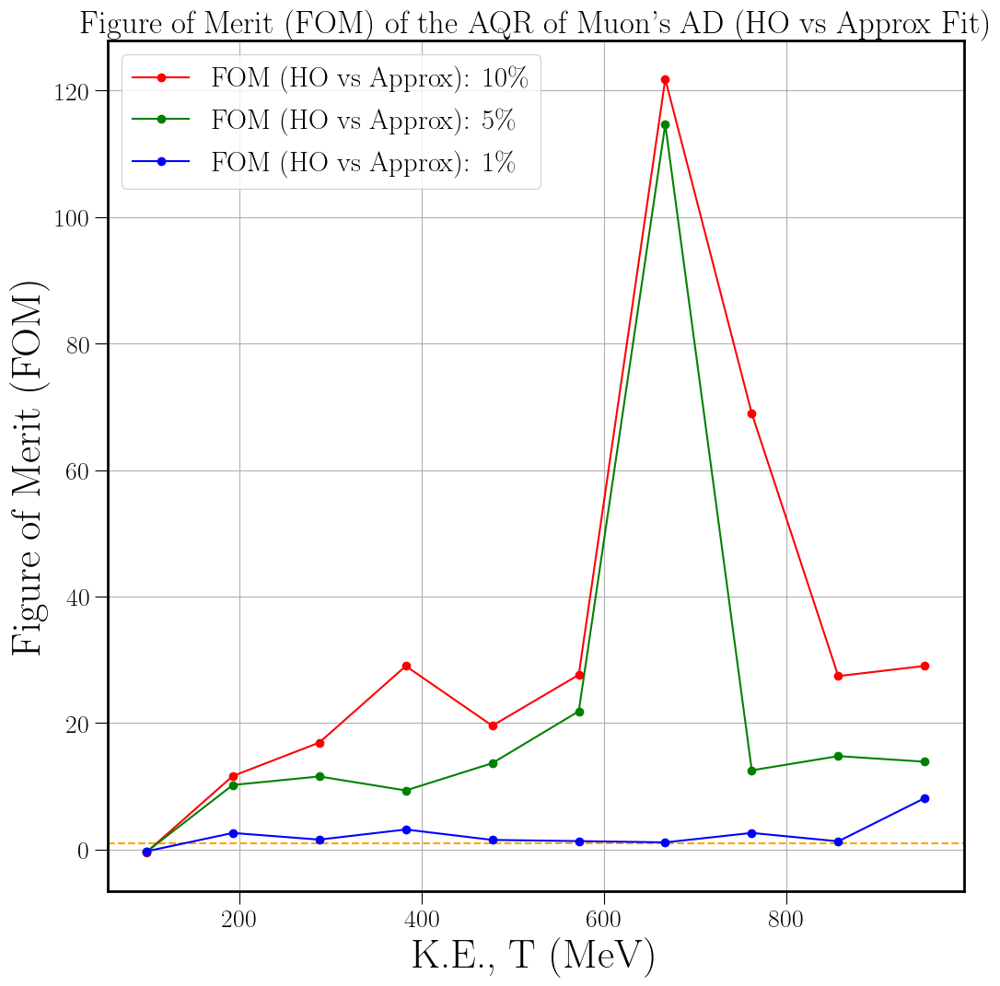

In [127]:
import matplotlib.pyplot as plt
import numpy as np

# ... [Previous setup code for fig and ax remains the same] ...
#Compare between AQRs of Muon's Integrated AD using HO vs Approx fit w/ Figure of Merit (FOM)

#Linear space in K.E.
# t = np.linspace(500, 1500, 41)
# print(t)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'K.E., T (MeV)', size= 32)
ax.set_ylabel(r'Figure of Merit (FOM)', size= 32)
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Figure of Merit (FOM) of the AQR of Muon\'s AD (HO vs Approx Fit)', fontsize=25)
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)


# --- Process HO Fit Datasets ---

# Define labels and colors for cleaner code: HO Fit
datasets1 = [
    (bin_centers1h, means_10h, errs_10h, 'red', 'o', '10\%'),
    (bin_centers2h, means_05h, errs_05h, 'green', '^', '5\%'),
    (bin_centers3h, means_01h, errs_01h, 'blue', 's', '1\%')
]

x1_list, y1_list, yerr1_list = [], [], []
for x_data, y_data, err_data, color, marker, label in datasets1:
    x_np, y_np, yerr_np = np.array(x_data), np.array(y_data), np.array(err_data)
    x1_list.append(x_np)
    y1_list.append(y_np)
    yerr1_list.append(yerr_np)

# --- Process Approx Fit Datasets ---

# Define labels and colors for cleaner code: Approx Fit

datasets2 = [
    (bin_centers1, means_10, errs_10, 'red', 'o', '10\%'),
    (bin_centers2, means_05, errs_05, 'green', '^', '5\%'),
    (bin_centers3, means_01, errs_01, 'blue', 's', '1\%')
]

x2_list, y2_list, yerr2_list = [], [], []
for x_data, y_data, err_data, color, marker, label in datasets2:
    x_np, y_np, yerr_np = np.array(x_data), np.array(y_data), np.array(err_data)
    x2_list.append(x_np)
    y2_list.append(y_np)
    yerr2_list.append(yerr_np)

# --- FOM calculation ---
# Convert lists to NumPy arrays so we can do math on them
# This creates arrays of shape (3, N)
Y1 = np.array(y1_list)
Y2 = np.array(y2_list)
E1 = np.array(yerr1_list)
E2 = np.array(yerr2_list)
X2 = np.array(x2_list)

# Calculate FOM for all three datasets at once
# fom1 uses geometric mean of errors, fom2 uses quadrature (standard)
fom1 = (Y2 - Y1) / np.sqrt(E1 * E2)
fom2 = (Y2 - Y1) / np.sqrt(E1**2 + E2**2)

# --- Plotting the Results ---
# Loop through the calculated FOMs to plot each line
labels = ['10\%', '5\%', '1\%']
colors = ['red', 'green', 'blue']

for i in range(len(fom2)):
    mask = ~np.isnan(fom2[i])
    ax.plot(X2[i][mask], fom2[i][mask], 
            label=f'FOM (HO vs Approx): {labels[i]}', 
            color=colors[i], marker='o')

plt.axhline(y=1, color='orange', linestyle='--', zorder=0)

ax.grid()
ax.legend(fontsize=22)

# plt.savefig('FOM_AQR_ho_vs_approxfit_Cherenkov_AD_Muon_allTs_10_5_1_perc', bbox_inches='tight')

plt.show()


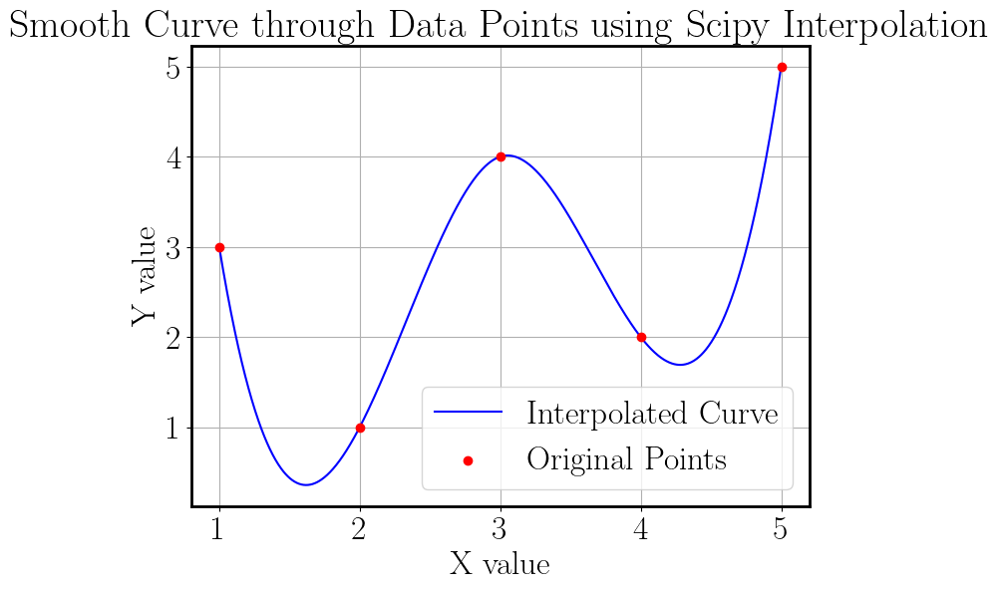

In [440]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# 1. Define your original data points
x_points = np.array([1, 2, 3, 4, 5])
y_points = np.array([3, 1, 4, 2, 5])

# 2. Create the interpolation function
# 'cubic' is a common choice for smooth curves. Other options include 'quadratic' or 'linear'.
f = interp1d(x_points, y_points, kind='cubic')

# 3. Generate a dense range of new x-values to make the curve look smooth
x_new = np.linspace(min(x_points), max(x_points), 1000) # 1000 points for a smooth appearance

# 4. Use the interpolation function to calculate the corresponding y-values
y_new = f(x_new)

# 5. Plot the results
plt.figure(figsize=(8, 6))
plt.plot(x_new, y_new, color='blue', label='Interpolated Curve')
# Optionally, plot the original data points as markers
plt.scatter(x_points, y_points, color='red', zorder=5, label='Original Points')

plt.title('Smooth Curve through Data Points using Scipy Interpolation')
plt.xlabel('X value')
plt.ylabel('Y value')
plt.legend()
plt.grid(True)
plt.show()


# Comparison between Proton and Muon's AQR from Integrated AD 

In [ ]:
#Linear space in K.E.
tp = np.linspace(500, 1500, 41)
tm = np.linspace(100,1000, 19)
# print(t)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'K.E., T (MeV)', size= 30)
ax.set_ylabel(r'Ratio of Normal to Anomalous Quantile (L/R)', size= 30)
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Cherenkov Quantile Ratio of Protons (HO vs Approx Fit)')
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.plot(tp, nbyapps10, linewidth=4, c='r', label="Approx: 10\%", ls='dashdot')
ax.plot(tp, nbyapps05, linewidth=4, c='g', label="Approx: 5\%", ls='dashdot')
ax.plot(tp, nbyapps01, linewidth=4, c='b', label="Approx: 1\%", ls='dashdot')

ax.plot(tp, nbyaphs10, linewidth=4, c='r', label="HO: 10\%")
ax.plot(tp, nbyaphs05, linewidth=4, c='g', label="HO: 5\%")
ax.plot(tp, nbyaphs01, linewidth=4, c='b', label="HO: 1\%")

# Add a vertical arrow
# x, y: starting point of the arrow
# dx, dy: length of the arrow along x and y directions
plt.arrow(x=1400, y=1.25, dx=0, dy=0.40, width=0.5, head_width=3.5, head_length=0.05, fc='r', ec='r')

ax.grid()
ax.legend()
# plt.savefig('nbyas_hofit_Cherenkov_IAD_Proton_allT_from_saved_data', bbox_inches='tight')
# plt.savefig('nbyas_ho_vs_approxfit_Cherenkov_IAD_Proton_allTs_10_5_1_perc_from_saved_data_mplot4_arrow', bbox_inches='tight')
# plt.savefig('nbyas_ho_vs_approxfit_Cherenkov_IAD_Proton_allTs_10_perc_from_saved_data', bbox_inches='tight')


In [140]:
#Linear space in K.E.
t = np.linspace(500, 1500, 41)
# print(t)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'K.E., T (MeV)', size= 30)
ax.set_ylabel(r'Averaged Quantile Ratio (L/R)', size= 30)
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Averaged Cherenkov Quantile Ratio (L/R) of Protons (HO vs Approx Fit)', fontsize=23)
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)

# ax.plot(t, nbyapps10, linewidth=4, c='r', label="Approx: 10\%", ls='dashdot')
# ax.plot(t, nbyapps05, linewidth=4, c='g', label="Approx: 5\%", ls='dashdot')
# ax.plot(t, nbyapps01, linewidth=4, c='b', label="Approx: 1\%", ls='dashdot')

# ax.plot(t, nbyaphs10, linewidth=4, c='r', label="HO: 10\%")
# ax.plot(t, nbyaphs05, linewidth=4, c='g', label="HO: 5\%")
# ax.plot(t, nbyaphs01, linewidth=4, c='b', label="HO: 1\%")

plt.plot(bin_centers1, bin_means1, color='red', marker='o', linestyle='--', label='Approx 10\%')
plt.plot(bin_centers2, bin_means2, color='green', marker='^', linestyle='--', label='Approx 5\%')
plt.plot(bin_centers3, bin_means3, color='blue', marker='s', linestyle='--', label='Approx 1\%')

plt.plot(bin_centers1h, bin_means1h, color='red', marker='o', linestyle='solid', label='HO 10\%')
plt.plot(bin_centers2h, bin_means2h, color='green', marker='^', linestyle='solid', label='HO 5\%')
plt.plot(bin_centers3h, bin_means3h, color='blue', marker='s', linestyle='solid', label='HO 1\%')


# # Add a vertical arrow
# # x, y: starting point of the arrow
# # dx, dy: length of the arrow along x and y directions
# plt.arrow(x=1400, y=1.25, dx=0, dy=0.40, width=0.5, head_width=3.5, head_length=0.05, fc='r', ec='r')

ax.grid()
ax.legend()
# plt.savefig('binned_avg_nbyas_hofit_Cherenkov_AD_Proton_allT_from_saved_data', bbox_inches='tight')
# plt.savefig('binned_avg_nbyas_ho_vs_approxfit_Cherenkov_AD_Proton_allTs_10_5_1_perc_from_saved_data_mplot4b', bbox_inches='tight')
# plt.savefig('binned_avg_nbyas_ho_vs_approxfit_Cherenkov_AD_Proton_allTs_10_perc_from_saved_data', bbox_inches='tight')


In [142]:
#Linear space in K.E.
t = np.linspace(500, 1500, 41)
# print(t)

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'K.E., T (MeV)', size= 30)
ax.set_ylabel(r'Averaged Quantile Ratio (L/R)', size= 30)
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}
ax.set_title('Averaged Cherenkov Quantile Ratio (L/R) of Protons (HO vs Approx Fit)', fontsize=23)
# ax.set_title('Cherenkov IAD of a Proton (Babicz Fit)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)

# ax.plot(t, nbyapps10, linewidth=4, c='r', label="Approx: 10\%", ls='dashdot')
# ax.plot(t, nbyapps05, linewidth=4, c='g', label="Approx: 5\%", ls='dashdot')
# ax.plot(t, nbyapps01, linewidth=4, c='b', label="Approx: 1\%", ls='dashdot')

# ax.plot(t, nbyaphs10, linewidth=4, c='r', label="HO: 10\%")
# ax.plot(t, nbyaphs05, linewidth=4, c='g', label="HO: 5\%")
# ax.plot(t, nbyaphs01, linewidth=4, c='b', label="HO: 1\%")

plt.plot(bin_centers1, bin_means1, color='red', marker='o', linestyle='--', label='Approx 10\%')
plt.plot(bin_centers2, bin_means2, color='green', marker='^', linestyle='--', label='Approx 5\%')
plt.plot(bin_centers3, bin_means3, color='blue', marker='s', linestyle='--', label='Approx 1\%')

plt.plot(bin_centers1h, bin_means1h, color='red', marker='o', linestyle='solid', label='HO 10\%')
plt.plot(bin_centers2h, bin_means2h, color='green', marker='^', linestyle='solid', label='HO 5\%')
plt.plot(bin_centers3h, bin_means3h, color='blue', marker='s', linestyle='solid', label='HO 1\%')

# plt.errorbar(x_values, y_estimates, yerr=jackknife_errors, fmt='o', capsize=4, ecolor='red', markersize=5)  #Jackknife errorbar
plt.errorbar(bin_centers1, bin_means1, yerr=np.sqrt(var_jack10), fmt='o', capsize=4, ecolor='hotpink', markersize=5)  #Jackknife errorbar for 10% Q.ratio
plt.errorbar(bin_centers2, bin_means2, yerr=np.sqrt(var_jack05), fmt='^', capsize=4, ecolor='olive', markersize=5)  #Jackknife errorbar for 10% Q.ratio
plt.errorbar(bin_centers3, bin_means3, yerr=np.sqrt(var_jack01), fmt='s', capsize=4, ecolor='deepskyblue', markersize=5)  #Jackknife errorbar for 10% Q.ratio

# plt.errorbar(x_values, y_estimates, yerr=jackknife_errors, fmt='o', capsize=4, ecolor='red', markersize=5)  #Jackknife errorbar
plt.errorbar(bin_centers1h, bin_means1h, yerr=np.sqrt(var_jack10h), fmt='o', capsize=4, ecolor='red', markersize=5)  #Jackknife errorbar for 10% Q.ratio
plt.errorbar(bin_centers2h, bin_means2h, yerr=np.sqrt(var_jack05h), fmt='^', capsize=4, ecolor='green', markersize=5)  #Jackknife errorbar for 10% Q.ratio
plt.errorbar(bin_centers3h, bin_means3h, yerr=np.sqrt(var_jack01h), fmt='s', capsize=4, ecolor='blue', markersize=5)  #Jackknife errorbar for 10% Q.ratio



# # Add a vertical arrow
# # x, y: starting point of the arrow
# # dx, dy: length of the arrow along x and y directions
# plt.arrow(x=1400, y=1.25, dx=0, dy=0.40, width=0.5, head_width=3.5, head_length=0.05, fc='r', ec='r')

ax.grid()
ax.legend()
# plt.savefig('binned_avg_nbyas_hofit_Cherenkov_IAD_Proton_allT_from_saved_data', bbox_inches='tight')
# plt.savefig('binned_avg_nbyas_ho_vs_approxfit_Cherenkov_IAD_Proton_allTs_10_5_1_perc_from_saved_data_w_jackknife_err_mplot4b', bbox_inches='tight')
# plt.savefig('binned_avg_nbyas_ho_vs_approxfit_Cherenkov_IAD_Proton_allTs_10_perc_from_saved_data', bbox_inches='tight')


# Integrated AD Quantile Ratio as a function of beta (Universal Scale)

[ 500.  525.  550.  575.  600.  625.  650.  675.  700.  725.  750.  775.
  800.  825.  850.  875.  900.  925.  950.  975. 1000. 1025. 1050. 1075.
 1100. 1125. 1150. 1175. 1200. 1225. 1250. 1275. 1300. 1325. 1350. 1375.
 1400. 1425. 1450. 1475. 1500.] [  50.   75.  100.  125.  150.  175.  200.  225.  250.  275.  300.  325.
  350.  375.  400.  425.  450.  475.  500.  525.  550.  575.  600.  625.
  650.  675.  700.  725.  750.  775.  800.  825.  850.  875.  900.  925.
  950.  975. 1000.]


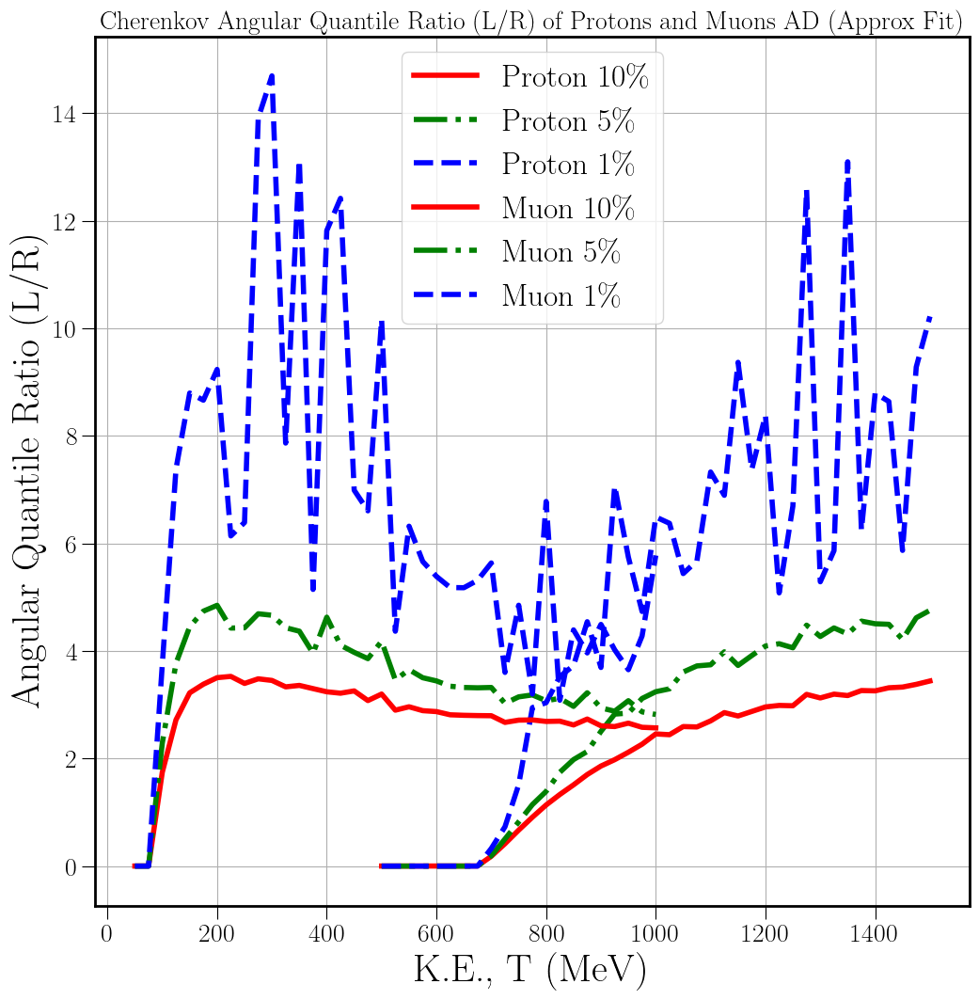

In [338]:
#Linear space in K.E.
tp = np.linspace(500, 1500, 41)
tm = np.linspace(50, 1000, 39)
print(tp, tm)

#Mass of the particle travelling
mp = 938 #Proton's mass
mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²

betap  = np.sqrt(1 - (1/(1 + tp/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD
betamu  = np.sqrt(1 - (1/(1 + tm/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

# print (tp, betap, np.round(betap, 4))
# print (tm, betamu, np.round(betamu, 4))


# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'K.E., T (MeV)', size= 30)
ax.set_ylabel(r'Angular Quantile Ratio (L/R)', size= 30) #$\frac{N}{A}$
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}

# ax.set_title('Cherenkov Angular Quantile Ratio for Protons (Approx Fit)')
# ax.set_title('Cherenkov Angular Quantile Ratio for Muons (Approx Fit)')
ax.set_title('Cherenkov Angular Quantile Ratio (L/R) of Protons and Muons AD (Approx Fit)', fontsize=20)

ax.tick_params(axis='both',which='major',labelsize=20,length=10)

# ax.plot(tp, nbyapps10, linewidth=4, c='g', label='Proton $10\%$')
# ax.plot(tm, nbyamups10, linewidth=4, c='r', label='Muon $10\%$')

# ax.plot(tp, nbyapps05, linewidth=4, ls='dashdot', c='g', label='Proton $5\%$')
# ax.plot(tm, nbyamups05, linewidth=4, ls='dashdot', c='r', label='Muon $5\%$')

# ax.plot(tp, nbyapps01, linewidth=4, ls='dashed', c='g', label='Proton $1\%$')
# ax.plot(tm, nbyamups01, linewidth=4, ls='dashed', c='r', label='Muon $1\%$')

ax.plot(tp, nbyapps10, linewidth=4, c='r', label='Proton $10\%$')
ax.plot(tp, nbyapps05, linewidth=4, ls='dashdot', c='g', label='Proton $5\%$')
ax.plot(tp, nbyapps01, linewidth=4, ls='dashed', c='b', label='Proton $1\%$')

ax.plot(tm, nbyamups10, linewidth=4, c='r', label='Muon $10\%$')
ax.plot(tm, nbyamups05, linewidth=4, ls='dashdot', c='g', label='Muon $5\%$')
ax.plot(tm, nbyamups01, linewidth=4, ls='dashed', c='b', label='Muon $1\%$')


ax.grid()
ax.legend()
# plt.savefig('nbyas_10_5_1_perc_approxfit_Cherenkov_AD_Proton_allT_from_saved_data', bbox_inches='tight')
# plt.savefig('nbyas_10_5_1_perc_approxfit_Cherenkov_AD_Muon_allT_from_saved_data', bbox_inches='tight')
plt.savefig('nbyas_10_5_1_perc_approxfit_Cherenkov_AD_Proton_Muon_allT_from_saved_data_mplot1', bbox_inches='tight')
plt.show()


In [ ]:
#Linear space in K.E.
tp = np.linspace(500, 1500, 41)
tm = np.linspace(50, 1000, 39)
print(tp, tm)

#Mass of the particle travelling
mp = 938 #Proton's mass
mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²

betap  = np.sqrt(1 - (1/(1 + tp/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD
betamu  = np.sqrt(1 - (1/(1 + tm/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

print (tp, betap, np.round(betap, 4))
print (tm, betamu, np.round(betamu, 4))

print(np.shape(betap), np.shape(nbyapps10))
print(np.shape(betamu), np.shape(nbyamups10))

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'Velocity, $\beta$', size= 30)
ax.set_ylabel(r'Angular Quantile Ratio (L/R)', size= 30) #$\frac{N}{A}$
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}

# ax.set_title('Cherenkov Angular Quantile Ratio for Protons (Approx Fit)')
# ax.set_title('Cherenkov Angular Quantile Ratio for Muons (Approx Fit)')
ax.set_title('Cherenkov Angular Quantile Ratio (L/R) of Protons and Muons AD (Approx Fit)', fontsize=20)

ax.tick_params(axis='both',which='major',labelsize=20,length=10)

# ax.plot(tp, nbyapps10, linewidth=4, c='g', label='Proton $10\%$')
# ax.plot(tm, nbyamups10, linewidth=4, c='r', label='Muon $10\%$')

# ax.plot(tp, nbyapps05, linewidth=4, ls='dashdot', c='g', label='Proton $5\%$')
# ax.plot(tm, nbyamups05, linewidth=4, ls='dashdot', c='r', label='Muon $5\%$')

# ax.plot(tp, nbyapps01, linewidth=4, ls='dashed', c='g', label='Proton $1\%$')
# ax.plot(tm, nbyamups01, linewidth=4, ls='dashed', c='r', label='Muon $1\%$')

ax.plot(betap, nbyapps10, linewidth=4, c='r', label='Proton $10\%$')
ax.plot(betap, nbyapps05, linewidth=4, ls='dashdot', c='g', label='Proton $5\%$')
ax.plot(betap, nbyapps01, linewidth=4, ls='dashed', c='b', label='Proton $1\%$')

ax.plot(betamu, nbyamups10, linewidth=4, c='r', label='Muon $10\%$')
ax.plot(betamu, nbyamups05, linewidth=4, ls='dashdot', c='g', label='Muon $5\%$')
ax.plot(betamu, nbyamups01, linewidth=4, ls='dashed', c='b', label='Muon $1\%$')


ax.grid()
ax.legend()
# plt.savefig('nbyas_10_5_1_perc_approxfit_Cherenkov_AD_Proton_allT_from_saved_data', bbox_inches='tight')
# plt.savefig('nbyas_10_5_1_perc_approxfit_Cherenkov_AD_Muon_allT_from_saved_data', bbox_inches='tight')
plt.savefig('nbyas_10_5_1_perc_approxfit_Cherenkov_AD_Proton_Muon_allbetas_from_saved_data_mplot1', bbox_inches='tight')
plt.show()


[ 500.  525.  550.  575.  600.  625.  650.  675.  700.  725.  750.  775.
  800.  825.  850.  875.  900.  925.  950.  975. 1000. 1025. 1050. 1075.
 1100. 1125. 1150. 1175. 1200. 1225. 1250. 1275. 1300. 1325. 1350. 1375.
 1400. 1425. 1450. 1475. 1500.] [  50.   75.  100.  125.  150.  175.  200.  225.  250.  275.  300.  325.
  350.  375.  400.  425.  450.  475.  500.  525.  550.  575.  600.  625.
  650.  675.  700.  725.  750.  775.  800.  825.  850.  875.  900.  925.
  950.  975. 1000.]
[ 500.  525.  550.  575.  600.  625.  650.  675.  700.  725.  750.  775.
  800.  825.  850.  875.  900.  925.  950.  975. 1000. 1025. 1050. 1075.
 1100. 1125. 1150. 1175. 1200. 1225. 1250. 1275. 1300. 1325. 1350. 1375.
 1400. 1425. 1450. 1475. 1500.] [0.75796532 0.76741698 0.77628968 0.78463315 0.79249149 0.79990401
 0.80690583 0.81352846 0.81980026 0.82574686 0.83139144 0.83675507
 0.8418569  0.84671442 0.8513436  0.85575908 0.85997431 0.86400164
 0.86785245 0.87153724 0.87506571 0.87844687 0.88168902 0.

<Figure size 640x480 with 0 Axes>

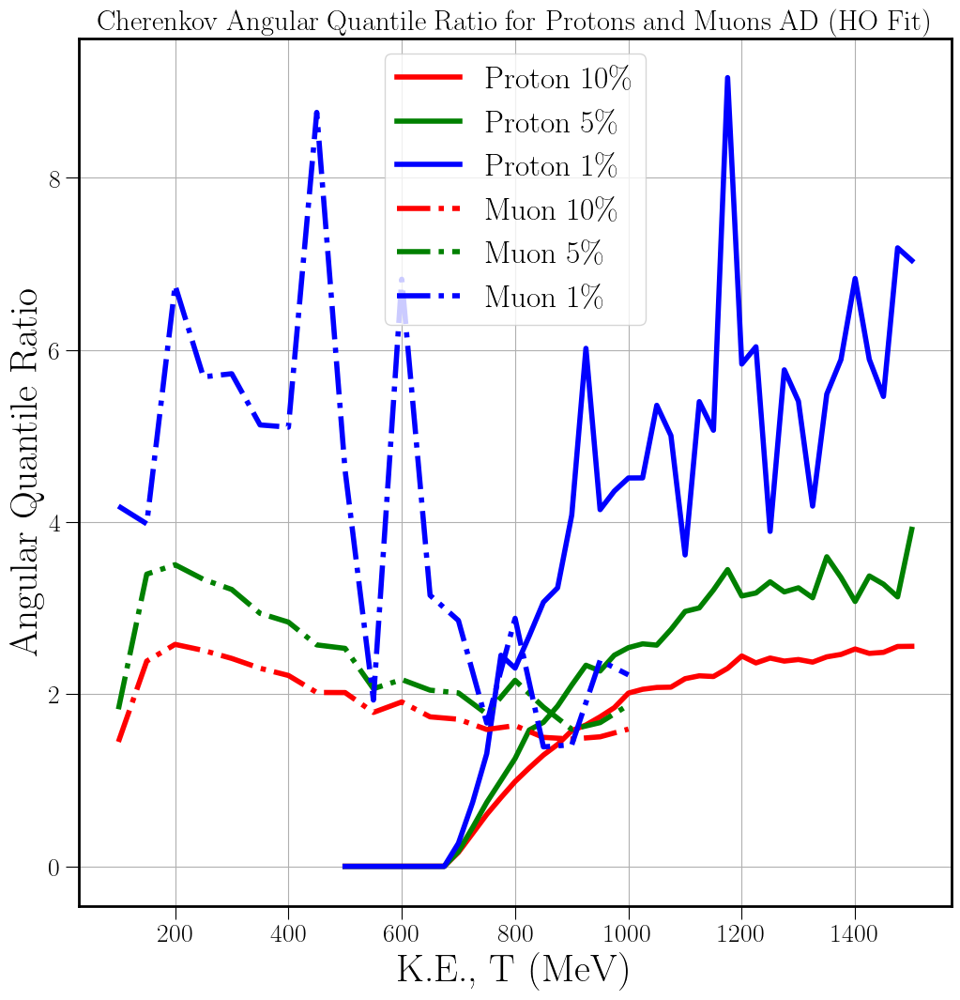

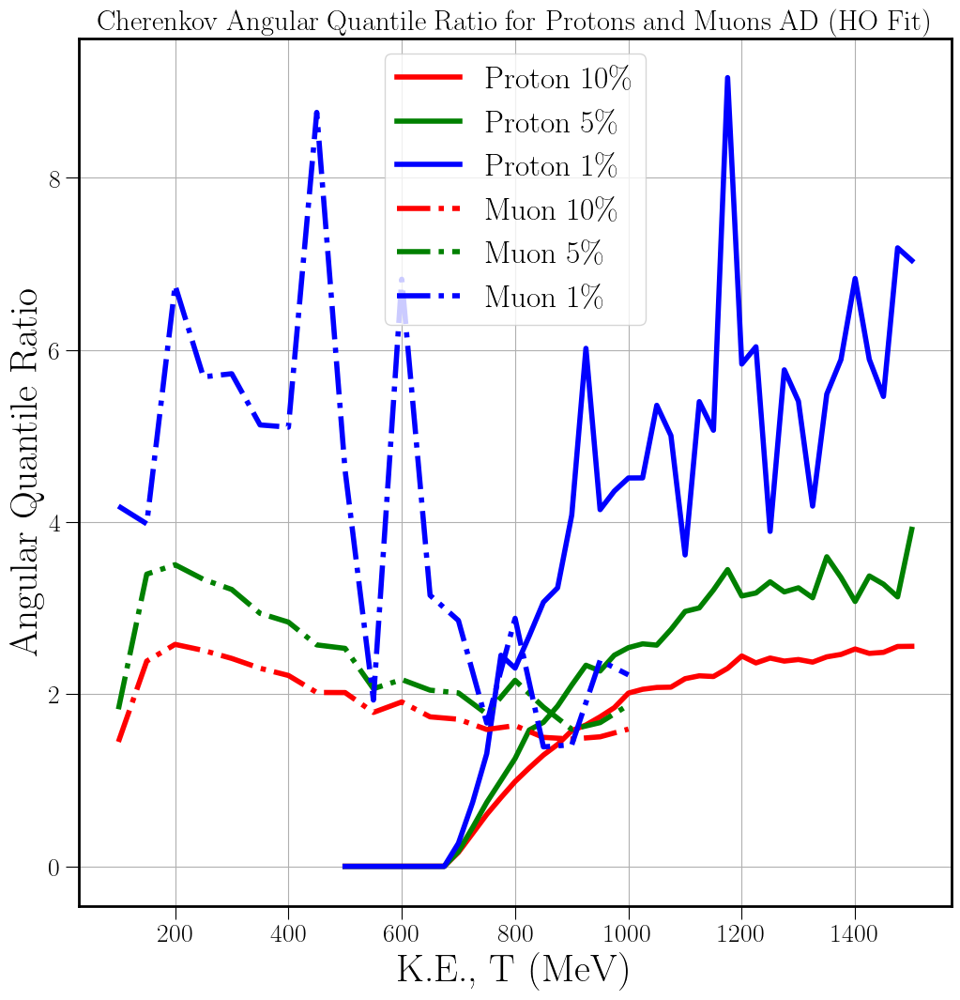

In [328]:
#HO Fit
#Linear space in K.E.
tp = np.linspace(500, 1500, 41)
# tm = np.linspace(100, 1000, 37)
tm = np.linspace(100, 1000, 19)
# print(t)


# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'K.E., T (MeV)', size= 30)
ax.set_ylabel(r'Angular Quantile Ratio', size= 30) #$\frac{N}{A}$
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}

# ax.set_title('Cherenkov Angular Quantile Ratio for Protons (Approx Fit)')
# ax.set_title('Cherenkov Angular Quantile Ratio for Muons (Approx Fit)')
ax.set_title('Cherenkov Angular Quantile Ratio for Protons and Muons AD (HO Fit)', fontsize=22)

ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.plot(tp, nbyaphs10, linewidth=4, c='r', label='Proton $10\%$')
ax.plot(tp, nbyaphs05, linewidth=4, c='g', label='Proton $5\%$')
ax.plot(tp, nbyaphs01, linewidth=4, c='b', label='Proton $1\%$')

ax.plot(tm, nbyamuhs10, linewidth=4, ls='dashdot', c='r', label='Muon $10\%$')
ax.plot(tm, nbyamuhs05, linewidth=4, ls='dashdot', c='g', label='Muon $5\%$')
ax.plot(tm, nbyamuhs01, linewidth=4, ls='dashdot', c='b', label='Muon $1\%$')


ax.grid()
ax.legend()
# plt.savefig('nbyas_10_5_1_perc_hofit_Cherenkov_AD_Proton_allT_from_saved_data', bbox_inches='tight')
# plt.savefig('nbyas_10_5_1_perc_hofit_Cherenkov_AD_Muon_allT_from_saved_data', bbox_inches='tight')
plt.savefig('nbyas_10_5_1_perc_hofit_Cherenkov_AD_Proton_Muon_allT_from_saved_data_mplot2', bbox_inches='tight')
plt.show()

<Figure size 640x480 with 0 Axes>

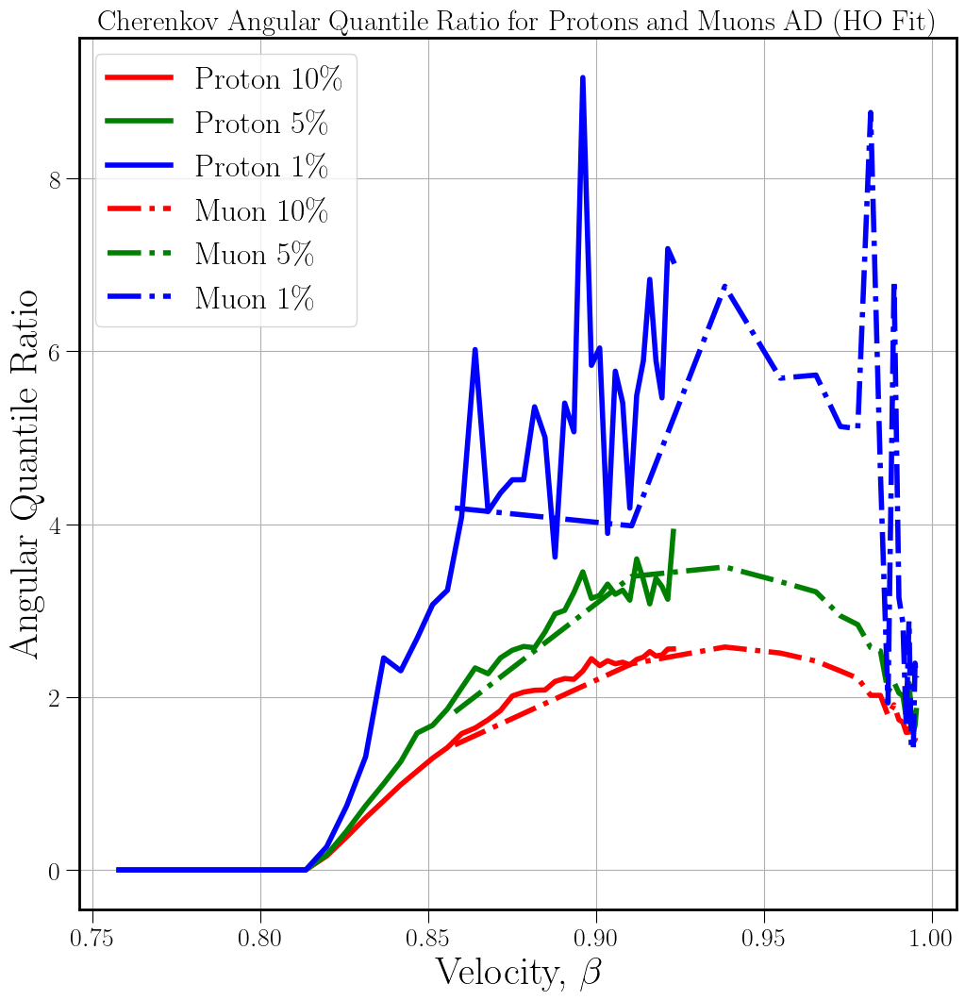

In [336]:
#HO fit
#Linear space in K.E.
tp = np.linspace(500, 1500, 41)
# tm = np.linspace(100, 1000, 37)
tm = np.linspace(100, 1000, 19)
# print(t)

#Mass of the particle travelling
mp = 938 #Proton's mass
mm = 105.66 #Muon rest mass ~ 105.7 MeV/c²

betap  = np.sqrt(1 - (1/(1 + tp/mp)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD
betamu  = np.sqrt(1 - (1/(1 + tm/mm)**2)) #Relativistic Approach #Took Beta = i for instantaneous AD

# print (tp, betap, np.round(betap, 4))
# print (tm, betamu, np.round(betamu, 4))

# Create a figure and an axes object for 3D plotting:
fig = plt.figure(figsize=(12,12))
# ax = fig.add_subplot(111, projection='3d')
ax = fig.add_subplot(111)

# Set labels and title:
ax.set_xlabel(r'Velocity, $\beta$', size= 30)
ax.set_ylabel(r'Angular Quantile Ratio', size= 30) #$\frac{N}{A}$
# ax.set_zlabel(r'$dN/d\theta$') #\frac{dN}{d\cos\theta}

# ax.set_title('Cherenkov Angular Quantile Ratio for Protons (Approx Fit)')
# ax.set_title('Cherenkov Angular Quantile Ratio for Muons (Approx Fit)')
ax.set_title('Cherenkov Angular Quantile Ratio for Protons and Muons AD (HO Fit)', fontsize=22)

ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.plot(betap, nbyaphs10, linewidth=4, c='r', label='Proton $10\%$')
ax.plot(betap, nbyaphs05, linewidth=4, c='g', label='Proton $5\%$')
ax.plot(betap, nbyaphs01, linewidth=4, c='b', label='Proton $1\%$')

ax.plot(betamu, nbyamuhs10, linewidth=4, ls='dashdot', c='r', label='Muon $10\%$')
ax.plot(betamu, nbyamuhs05, linewidth=4, ls='dashdot', c='g', label='Muon $5\%$')
ax.plot(betamu, nbyamuhs01, linewidth=4, ls='dashdot', c='b', label='Muon $1\%$')


ax.grid()
ax.legend()
# plt.savefig('nbyas_10_5_1_perc_hofit_Cherenkov_AD_Proton_allbetas_from_saved_data', bbox_inches='tight')
# plt.savefig('nbyas_10_5_1_perc_hofit_Cherenkov_AD_Muon_allbetas_from_saved_data', bbox_inches='tight')
plt.savefig('nbyas_10_5_1_perc_hofit_Cherenkov_AD_Proton_Muon_allbetas_from_saved_data', bbox_inches='tight')
plt.show()


